<h1 style="font-size:40px;"><center>Exercise II:<br> Model selection with MLPs
</center></h1>


# Short summary
In this exercise you will:

* train multi-layer perceptrons (MLPs) for both binary and multiple classification problems and a regression problem, and perform model selection to optimize validation performance

You should write the report of the exercise within this notebook. The details of how to do that can be found below in section "Writing the report".

**Deadline for submitting the report: See Canvas assignment.**

## The data
There are several datasets in this exercise.

### syn2
The *syn2* dataset represents a binary classification problem. The input data is 2D which allows for an easy visual inspection of the different classes and the decision boundary implemented by the network. The dataset is generated using random numbers each time you run the cell. This means that each time you generate the data it will be slightly different. You can control this by having a fixed *seed* to the random number generator. The cell "PlotData" will plot the *syn2* dataset.

Note: This is the same dataset as in exercise 1.

### regr2
There *regr2* dataset represents a more complex synthetic regression problem than *regr1* from exercise 1. It has 6 inputs (independent variables) and one target variable (dependent variable). It is generated according to the following formula:  

$\qquad d = 2x_1 + x_2x_3^2 + e^{x_4} + 5x_5x_6 + 3\sin(2\pi x_6) + \alpha\epsilon$  
    
where $\epsilon$ is added normally distributed noise and $\alpha$ is a parameter controlling the size of the added noise. Variables $x_1,...,x_4$ are normally distributed with zero mean and unit variance, whereas $x_5, x_6$ are uniformly distributed ($[0,1]$). The target value $d$ has a non-linear dependence on ***x***.

### Spiral data
This is the "famous" spiral dataset that consists of two 2-D spirals, one for each class. The perfect classification boundary is also a spiral. The cell "PlotData" will plot this dataset.

### Japanese vowels dataset
*This data set is taken from the UCI Machine Learning Repository https://archive.ics.uci.edu/ml/datasets/Japanese+Vowels* In short, nine male speakers uttered two Japanese vowels /ae/ successively. For each utterance, a discrete times series was produced where each time point consists of 12 (LPC cepstrum) coefficients. The length of each time series was between 7-29.
Here we treat each point of the time series as a feature (12 inputs). In total we have 9961
data points which then has been divided into 4274 for training, 2275 for validation and 3412 for test. The original data files are provided as *ae.train* and *ae.test*. The task is now based on a single sample value of one of the speakers, determine which speaker it was. This is, in summary, a 9-class classification problem with 12 input values for each case.

### Bioconcentration dataset
*This data set is taken from the UCI Machine Learning Repository https://archive.ics.uci.edu/ml/datasets/QSAR+Bioconcentration+classes+dataset* In short, this is a dataset of manually-curated bioconcentration factors (BCF) for 779 chemicals used to determine the mechanisms of bioconcentration, i.e. to predict whether a chemical: (1) is mainly stored within lipid tissues, (2) has additional storage sites (e.g. proteins), or (3) is metabolized/eliminated. Data were randomly split into a training set of 584 compounds (75%) and a test set of 195 compounds (25%), preserving the proportion between the classes. The independent variables consist of 9 molecular descriptors. This is, in summary, a 3-class classification problem with 9 input values for each case.

## The questions

There are 10 questions in this exercise, in five different cells below.

For questions 1-6, code is available that you can run directly or only need to make small modifications to. The first 3 questions deal with 2D binary classification problems. Here you will be able to see the boundary implemented by the different MLPs that you train. Questions 4-6 deal with training a regression network for the *regr2* dataset.

For questions 7-10 we only provide parts of the code and you should add the rest. However, it is typically just a matter of paste and copy from the previous code cells (in a proper way). Question 7-8 deals with Japanese vowels classification problem; here your task is to come up with a model that optimizes the validation result. Question 9 is about the Bioconcentration dataset, and again you should come up with a good model. Finally, the last question is to find a model that can solve the spiral problem.

## The different 'Cells'
This notebook contains several cells with python code, together with the markdown cells (like this one) with only text. Each of the cells with python code has a "header" markdown cell with information about the code. The table below provides a short overview of the code cells.

| #  |  CellName | CellType | Comment |
| :--- | :-------- | :-------- | :------- |
| 1 | Init | Needed | Sets up the environment|
| 2 | MLP | Needed | Defines the MLP model |
| 3 | Data | Needed | Defines the functions to generate the artificial datasets |
| 4 | PlotData | Information | Plots the 2D classification datasets |
| 5 | Statistics | Needed | Defines the functions that calculates various performance measures |
| 6 | Boundary | Needed | Function that can show 2D classification boundaries |
| 7 | Confusion | Needed | Functions that plots the confusion matrix |
| 8 | Ex1 | Exercise | For question 1-3 |
| 9 | Ex2 | Exercise | For question 4-6 |
| 10 | Ex3 | Exercise | For question 7-8 |
| 11 | Ex4 | Exercise | For question 9 |
| 12 | Ex5 | Exercise | For question 10 |

In order for you to start with the exercise you need to run all cells with the celltype "Needed". The very first time you start with this exercise we suggest that you enter each of the needed cells, read the cell instruction and run the cell. It is important that you do this in the correct order, starting from the top and work you way down the cells. Later when you have started to work with the notebook it may be easier to use the command "Run All" or "Run all above" found in the "Cell" dropdown menu.

## Writing the report
First the report should be written within this notebook. We have prepared the last cell in this notebook for you where you should write the report. The report should contain 4 parts:

* Name:
* Introduction: A **few** sentences where you give a small introduction of what you have done in the lab.
* Answers to questions: For each of the questions provide an answer. It can be short answers or a longer ones depending on the nature of the questions, but try to be efficient in your writing.
* Conclusion: Summarize your findings in a few sentences.

It is important that you write the report in this last cell and **not** after each question!

## Last but not least
Have fun!

---

### CellName: Init (#1)
### CellType: Needed
### Cell instruction: Initializing the libraries

In the cell below, we import all the libraries that are needed for this exercises.

Run the cell by entering into the cell and press "CTRL Enter".

In [ ]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import backend as K
from tensorflow.keras import metrics, regularizers, optimizers
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras.models import Model
import random
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import random as rn
import scipy as sp
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import confusion_matrix, log_loss, classification_report
import pandas as pd

### CellName: MLP (#2)
### CellType: Needed
### Cell instruction: Defining the MLP model

This cell defines the MLP model. There are a number of parameters that is needed to
define a model. Here is a list of them:


* inp_dim: the input dimension (integer)

* n_nod: size of the network, eg [5] for a one hidden layer with 5 nodes and [5,3] for a two layer network with 5 and 3 hidden nodes each.

* drop_nod: Dropout parameter for each hidden layer. You can specipty a single number that will be used for all hidden layers. If you want different dropout parameters for each hidden layer, then specify as a list. Example, for a two hidden layer network drop_nod = [0.5, 0.75] means drop hidden nodes with probability 0.5 and 0.75 for the first and the second hidden layer, respectively. Note that we do not use dropout on the input nodes! Also, a value of 0 means no dropout (i.e. zero probability of removing a node).

* act_fun: the activation function. Most common are
    * 'linear'
    * 'relu'
    * 'tanh'
    * 'sigmoid'
        
* out_act_fun: the activation function for the output nodes. Most common are
    * 'linear'
    * 'sigmoid'
    * 'softmax'
    
* opt_method: The error minimization method. Common choices
    * 'SGD'
    * 'Adam'
    * 'Nadam'
    * 'RMSprop'
    
* cost_fun: The error function used during training. There are three common ones
    * 'mean_squared_error'
    * 'binary_crossentropy'
    * 'categorical_crossentropy'

* lr_rate: The learning rate.

* metric: The metric to use besides the loss. Common values
    * accuracy
    * mse

* lambd: L2 regularization parameter

* num_out: The number of output nodes

Run the cell by entering into the cell and press "CTRL Enter".

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving ae.test to ae.test
Saving ae.train to ae.train
Saving Grisoni_trn.csv to Grisoni_trn.csv
Saving Grisoni_tst.csv to Grisoni_tst.csv
User uploaded file "ae.test" with length 660983 bytes
User uploaded file "ae.train" with length 496608 bytes
User uploaded file "Grisoni_trn.csv" with length 49391 bytes
User uploaded file "Grisoni_tst.csv" with length 16410 bytes


In [ ]:
def mlp(inp_dim,
            n_nod,
            drop_nod,
            act_fun = 'relu',
            out_act_fun = 'sigmoid',
            opt_method = 'Adam',
            cost_fun = 'binary_crossentropy',
            lr_rate = 0.01,
            metric = 'accuracy',
            lambd = 0.0,
            num_out = None):

    lays = [inp_dim] + n_nod

    main_input = Input(shape=(inp_dim,), dtype='float32', name='main_input')

    X = main_input
    for i, nod in enumerate(n_nod):
        X = Dense(nod,
                  activation = act_fun,
                  kernel_regularizer=regularizers.l2(lambd))(X)
        if type(drop_nod) is list:
            X = Dropout(drop_nod[i])(X)
        else:
            X = Dropout(drop_nod)(X)

    output = Dense(num_out, activation = out_act_fun )(X)

    method = getattr(optimizers, opt_method)

    model =  Model(inputs=[main_input], outputs=[output])
    model.compile(optimizer = method(learning_rate = lr_rate),
                  loss = cost_fun,
                  metrics=[metric])

    return model



### CellName: Data (#3)
### CellType: Needed
### Cell instruction: Defining synthetic data sets

This cell defines the different synthetic data sets. It also provides functions for reading the Vowles dataset, the Bioconcentration dataset and the Spiral data. The last function is used for standardization of the data.

Run the cell by entering into the cell and press "CTRL Enter".

In [ ]:
def syn2(N):

    global seed

    x = np.empty(shape=(N,2), dtype = np.float32)
    d = np.empty(shape=(N,), dtype = np.float32)
    N1 = int(N/2)

    # Positive samples
    x[:N1,:] = 0.8 + np.random.normal(loc=.0, scale=1., size=(N1,2))

    # Negative samples
    x[N1:,:] = -.8 + np.random.normal(loc=.0, scale=1., size=(N-N1,2))

    # Target
    d[:N1] = np.ones(shape=(N1,))
    d[N1:] = np.zeros(shape=(N-N1,))

    return x,d


def regr2(N, v=0):

    global seed

    x = np.empty(shape=(N,6), dtype = np.float32)

    uni = lambda n : np.random.uniform(0,1,n)
    norm = lambda n : np.random.normal(0,1,n)
    noise =  lambda  n : np.random.normal(0,1,n)


    for i in range(4):
        x[:,i] = norm(N)
    for j in [4,5]:
        x[:,j] = uni(N)

    d =   2*x[:,0] + x[:,1]* x[:,2]**2 + np.exp(x[:,3]) + \
            5*x[:,4]*x[:,5]  + 3*np.sin(2*np.pi*x[:,5])
    std_signal = np.std(d)
    d = d + v * std_signal * noise(N)

    return x, d

def twospirals(n_points, turns = 3, noise=0.5):
    """
     Returns the two spirals dataset.
    """
    n = (np.random.rand(n_points,1)*0.95+0.05) * turns * (2*np.pi)
    d1x = -np.cos(n)*n + np.random.rand(n_points,1) * noise
    d1y = np.sin(n)*n + np.random.rand(n_points,1) * noise
    return (np.vstack((np.hstack((d1x,d1y)), np.hstack((-d1x,-d1y)))),
            np.hstack((np.zeros(n_points),np.ones(n_points))))

def vowels():

    def pre_proc(file_name):
        block = []
        x = []

        with open(file_name) as file:
            for line in file:
                if line.strip():
                    numbers = [float(n) for n in line.split()]
                    block.append(numbers)
                else:
                    x.append(block)
                    block = []

        ################################
        x = [np.asarray(ar) for ar in x]
        return x

    x_trn = pre_proc('ae.train')
    x_tst = pre_proc('ae.test')


    ############## LABELS###########
    chunk1 = list(range(30,270, 30))
    d_trn = []
    person = 0

    for i, block in enumerate(x_trn):
        if i in chunk1:
            person += 1
        d_trn.extend([person]*block.shape[0])

    chunk2 = [31,35,88,44,29,24,40,50,29]
    chunk2 = np.cumsum(chunk2)
    d_tst = []
    person = 0
    for i, block in enumerate(x_tst):
        if i in chunk2:
            person += 1
        d_tst.extend([person]*block.shape[0])

    x_trn = np.vstack(x_trn)
    x_tst = np.vstack(x_tst)

    ## Split into train, validation and test
    num_classes = 9
    d_trn = keras.utils.to_categorical(d_trn, num_classes)
    d_tst = keras.utils.to_categorical(d_tst, num_classes)

    from sklearn.model_selection import train_test_split
    x_tst, x_val, d_tst, d_val = train_test_split(x_tst, d_tst, test_size=0.4, random_state=41)

    return x_trn, d_trn, x_val, d_val, x_tst, d_tst

def bcf():

    bcf_trn = pd.read_csv("Grisoni_trn.csv", delimiter='\t')
    bcf_tst = pd.read_csv("Grisoni_tst.csv", delimiter='\t')

    x_trn = bcf_trn.iloc[:,3:12].values.astype(np.float32)
    d_trn = bcf_trn.iloc[:,12].values.astype(np.float32) - 1.0
    d_trn = keras.utils.to_categorical(d_trn, 3)

    x_tst = bcf_tst.iloc[:,3:12].values.astype(np.float32)
    d_tst = bcf_tst.iloc[:,12].values.astype(np.float32) - 1.0
    d_tst = keras.utils.to_categorical(d_tst, 3)

    return x_trn, d_trn, x_tst, d_tst

def standard(x):
    return np.mean(x, axis=0) , np.std(x, axis=0)


### CellName: PlotData (#4)
### CellType: Information
### Cell instruction: Plotting the data

Here we just generate 100 cases for syn2 and the spiral dataset and plot them.

Run the cell by entering into the cell and press "CTRL Enter".

**Note!** This cell is not needed for the actual exercises, it is just to visualize the four different 2D synthetic classification data sets.

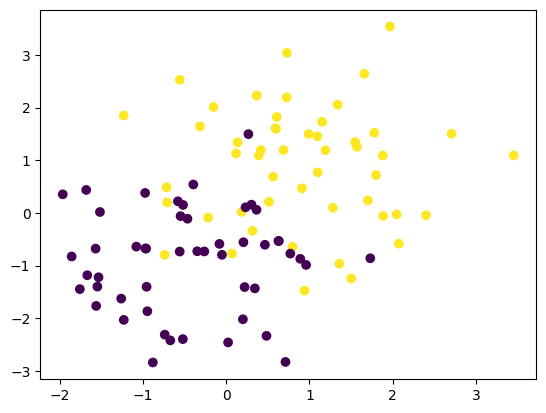

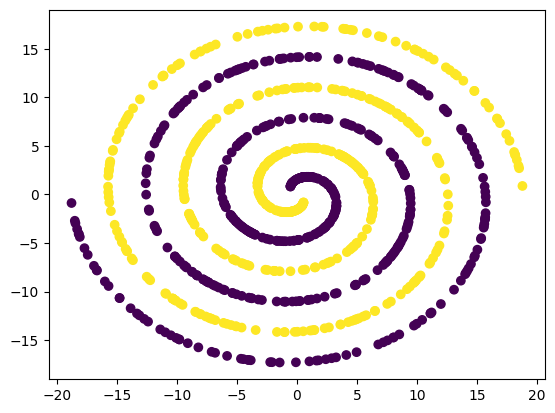

In [ ]:
# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

x,d = syn2(100)
plt.figure(2)
plt.scatter(x[:,0],x[:,1], c=d)

x,d = twospirals(500, 3, 0)
plt.figure(4)
plt.scatter(x[:,0],x[:,1], c=d)


### CellName: Statistics (#5)
### CellType: Needed
### Cell instruction: Present result for both classification and regression problems

This cell defines two functions that we are going to call using a trained model to calculate both error and performance measures.

Run the cell by entering into the cell and press "CTRL Enter".

In [ ]:
def stats_class(x = None, d = None, label = 'Training', model = None):
    """
    input :
             x = input
             d = target
             label = "Provided text string"
             model = the model

    output :
             sensitivity = fraction of correctly classified positive cases
             specificity = fraction of correctly classified negative cases
             accuracy = fraction of correctly classified cases
             loss = typically the cross-entropy error
    """

    def binary(y1):
        y1[y1>.5] = 1.
        y1[y1<= .5] = 0.
        return y1

    d_pr = model.predict(x, batch_size = x.shape[0], verbose=0).reshape(d.shape)

    nof_p, tp, nof_n, tn = [np.count_nonzero(k) for k in [d==1, d_pr[d==1.] > 0.5, d==0, d_pr[d==0.]<= 0.5]]

    sens = tp / nof_p
    spec = tn / nof_n
    acc = (tp + tn) / (len(d))
    loss = model.evaluate(x, d, batch_size =  x.shape[0], verbose=0)

    A = ['Accuracy', 'Sensitivity', 'Specificity', 'Loss']
    B = [acc, sens, spec, loss[0]]

    print('\n','#'*10,'STATISTICS for {} Data'.format(label), '#'*10, '\n')
    for i in range(len(A)):
        print('{:15} {:.4f}'.format(A[i], B[i]))

    print('\n','#'*50)
    return dict(zip(A,B))

def stats_reg(x = None, d = None, label = 'Training', model = None):
    """
    input :
             x = input
             d = target
             label = "Provided text string"
             model = the model

    output :
             MSE = mean squeared error between target and predictions
             CorrCoeff = correlation coefficient for the scatter between predictions and target values
    """
    d_pred = model.predict(x, batch_size = x.shape[0], verbose=0).reshape(d.shape)

    mse = np.mean((d - d_pred)**2)
    pcorr = np.corrcoef(d, d_pred)[1,0]

    A = ['MSE', 'CorrCoeff']
    B = [mse, pcorr]

    print('\n','#'*10,'STATISTICS for {} Data'.format(label), '#'*10, '\n')
    for i in range(len(A)):
        print('{:15} {:.10f}'.format(A[i], B[i]))

    print('\n','#'*50)
    return B


### CellName: Confusion (#6)
### CellType: Needed
### Cell Instruction: Plot the confusion matrix

This cell defines the functions need to plot a confusion matrix. A confusion matrix is a summary of the predictions made by a classifier. Each column of the matrix represents the instances of the predicted class while each row represents the instances of the actual class. The function 'plot_confusion_matrix' does the actual plotting, while the 'make_cm_plot' is the one that should be called from the user. See example of usage in the exercises.

Run the cell by entering into the cell and press "CTRL Enter".

In [ ]:
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):

    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    #plt.ylim([-0.5, cm.shape[0]-0.5])

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

def make_cm_plot(model,
            inp,
            trg,
            num_classes,
            label='Test data'):

    print('\n','#'*10,'Result for {}'.format(label), '#'*10, '\n')

    y = model.predict(inp, verbose=0 )
    print('log_loss:   ', '{:.4f}'.format(log_loss(trg, y, eps=1e-15)))

    d_class = trg.argmax(axis=1)
    y_class = y.argmax(axis=1)
    print('accuracy:   ', '{:.4f}'.format((y_class==d_class).mean()), '\n')

    class_names = ['class {}'.format(i+1) for i in range(num_classes)]
    print(classification_report(d_class, y_class, target_names=class_names))

    confuTst = confusion_matrix(d_class, y_class)
    plot_confusion_matrix(cm           = confuTst,
                          normalize    = False,
                          target_names = class_names,
                          title        = "Confusion Matrix")



### CellName: Boundary (#7)
### CellType: Needed
### Cell Instruction: Decision boundary

This cell defines the function to plot the decision boundary for a 2D input binary MLP classifier.

Run the cell by entering into the cell and press "CTRL Enter".

In [ ]:
def decision_b(X, Y1, model ):

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    # grid stepsize
    h = 0.025

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()], verbose=0)
    Z = Z.reshape(xx.shape)

    Z[Z>.5] = 1
    Z[Z<= .5] = 0

    Y_pr = model.predict(X, batch_size = X.shape[0], verbose=0).reshape(Y1.shape)

    Y = np.copy(Y1)
    Y_pr[Y_pr>.5] = 1
    Y_pr[Y_pr<= .5] = 0
    Y[(Y!=Y_pr) & (Y==0)] = 2
    Y[(Y!=Y_pr) & (Y==1)] = 3


    plt.figure()
    #plt.contourf(xx, yy, Z, cmap=plt.cm.PRGn, alpha = .9)
    plt.contour(xx, yy, Z, cmap=plt.cm.Paired)


    plt.scatter(X[:, 0][Y==1], X[:, 1][Y==1], marker='+', c='k')
    plt.scatter(X[:, 0][Y==0], X[:, 1][Y==0], marker='o', c='k')

    plt.scatter(X[:, 0][Y==3], X[:, 1][Y==3], marker = '+', c='r')
    plt.scatter(X[:, 0][Y==2], X[:, 1][Y==2], marker = 'o', c='r')


    plt.ylabel('x2')
    plt.xlabel('x1')
    plt.show()


---
End of "Needed" and "Information" cells. Below are the cells for the actual exercise.

---

### CellName: Ex1 (#8)
### CellType: Exercise
### Cell instruction: Instruction for questions 1-3

The cell below should be used for questions 1-3. For question 1 you can run the cell as it is (i.e. CTRL-Return). For the other questions you need to modify the cell in order to change hyperparameters etc.

From now on we will talk about *performance*! It can be performance of a trained model on the training dataset or the performance on the validation dataset. What do we mean by performance?  For classification problems we will provide 4 different measurements as returned by a call to the *stats_class* function. They are:
* Sensitivity = fraction of correctly classified "1" cases
* Specificity = fraction of correctly classified "0" cases
* Accuracy = fraction of correctly classified cases
* loss = cross-entropy error (so low loss means good performance!)

For the questions in this exercise, accuracy is an appropriate performance measure.

#### Question 1, single-node validation performance
Here you are going to train a classifier for the *syn2* dataset. You are also going to use a validation dataset as an estimate of the *true* performance. Since we generate these datasets we can allow for a relatively large validation dataset in order to get a more accurate estimation of *true* performance. The default value in the cell is to generate 1000 validation data points.

Now, use *syn2* (100 training data points) and train a *linear* MLP to separate the two classes, i.e. use a single hidden node. **What is the performance you get on the validation dataset?**

**Note:** Use a fixed random seed for this exercise since you will compare with runs in the next questions.

**Hint:** Remember from the first computer exercise that you should average over a few trained models.

#### Question 2, improving training performance
You are now going to train this model to a high training accuracy! By increasing the number of hidden nodes we should be able to get better and better training performance. **(a) How many hidden nodes do you need to reach an accuracy >95% on your training dataset?** **(b) What is the performance on the validation data set?**

**Hint:** Remember from the first computer exercise that overtraining often means finding a good local minimum of the loss function, which may require some tuning of the hyperparameters that control the training. This means that you may have to change the learning rate, batch size and the number of epochs. Since the *Adam* method is usually better than the vanilla *stochastic gradient descent*, it is used in the cells below as the default minimizer.

#### Question 3, optimizing validation performance
However, we are almost always interested in optimal *validation* performance. You should now find the number of hidden nodes that optimize the validation performance. **(a) What is the optimal number of hidden nodes for the syn2 dataset in order to maximize your validation performance?** **(b) Try to give an explanation for the number you obtained.**


Model: "model_113"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_255 (Dense)           (None, 80)                240       
                                                                 
 dropout_140 (Dropout)       (None, 80)                0         
                                                                 
 dense_256 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9500
Sensitivity     0.9600
Specificity     0.9400
Loss            0.1086

 ##########

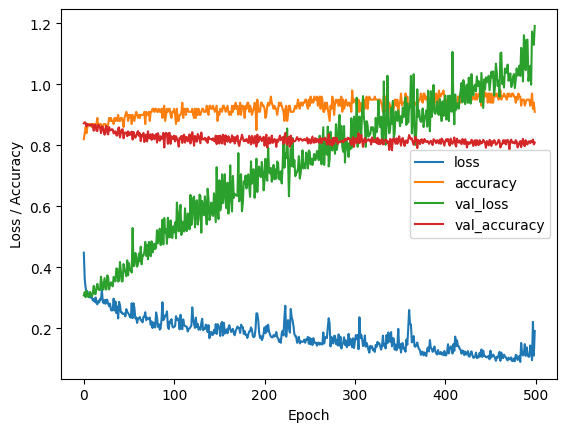

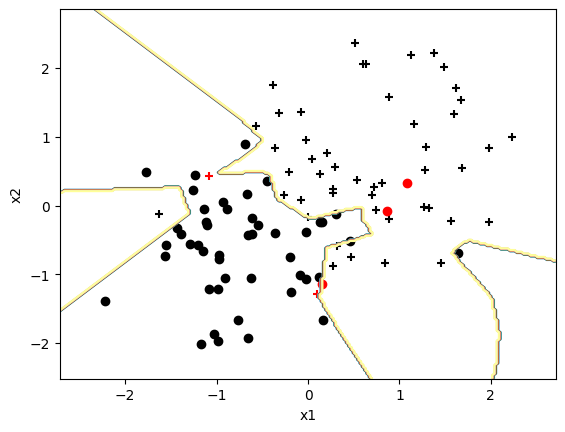

Model: "model_114"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_257 (Dense)           (None, 80)                240       
                                                                 
 dropout_141 (Dropout)       (None, 80)                0         
                                                                 
 dense_258 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9500
Sensitivity     0.9200
Specificity     0.9800
Loss            0.1460

 ##########

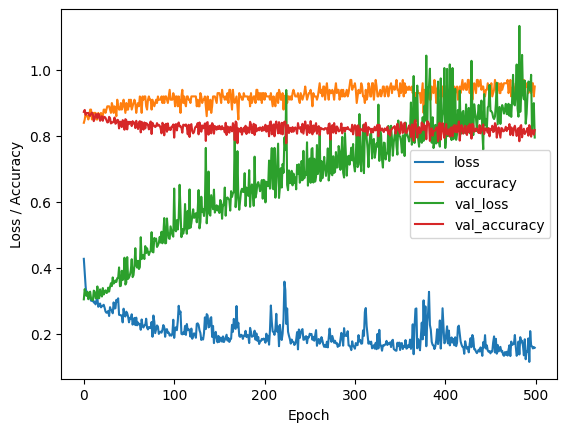

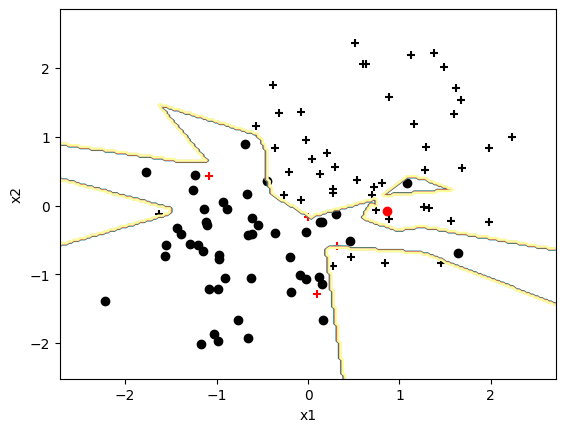

Model: "model_115"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_259 (Dense)           (None, 80)                240       
                                                                 
 dropout_142 (Dropout)       (None, 80)                0         
                                                                 
 dense_260 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9600
Sensitivity     0.9200
Specificity     1.0000
Loss            0.1138

 ##########

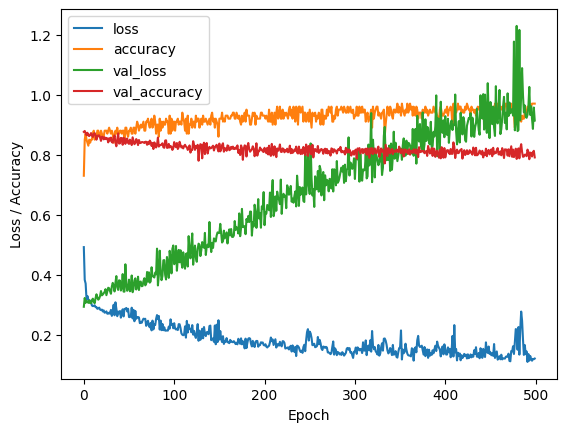

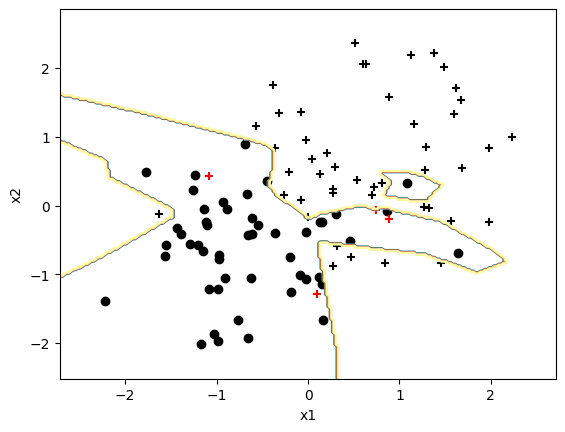

Model: "model_116"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_261 (Dense)           (None, 80)                240       
                                                                 
 dropout_143 (Dropout)       (None, 80)                0         
                                                                 
 dense_262 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9800
Sensitivity     0.9600
Specificity     1.0000
Loss            0.1008

 ##########

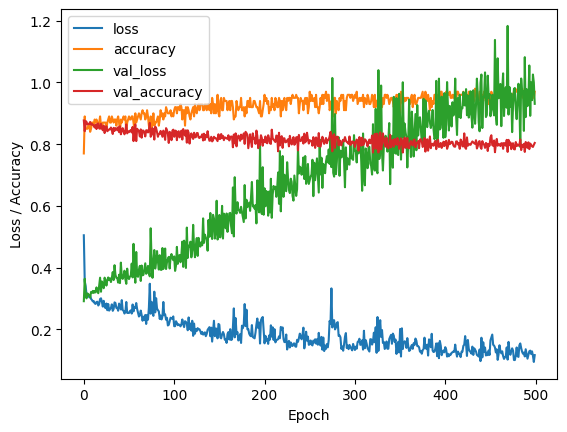

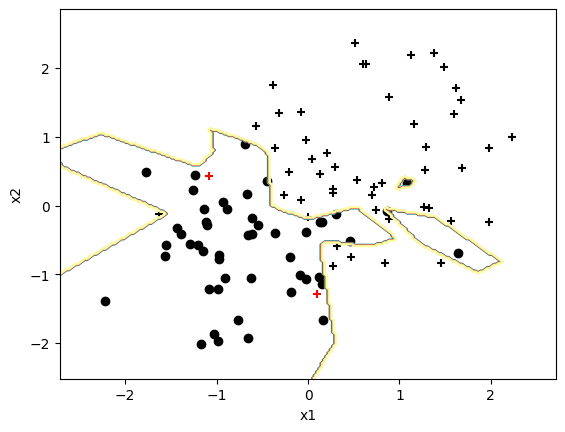

Model: "model_117"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_263 (Dense)           (None, 80)                240       
                                                                 
 dropout_144 (Dropout)       (None, 80)                0         
                                                                 
 dense_264 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9800
Sensitivity     0.9600
Specificity     1.0000
Loss            0.1273

 ##########

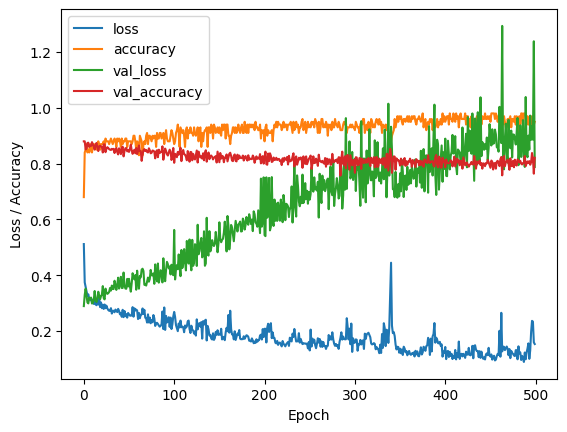

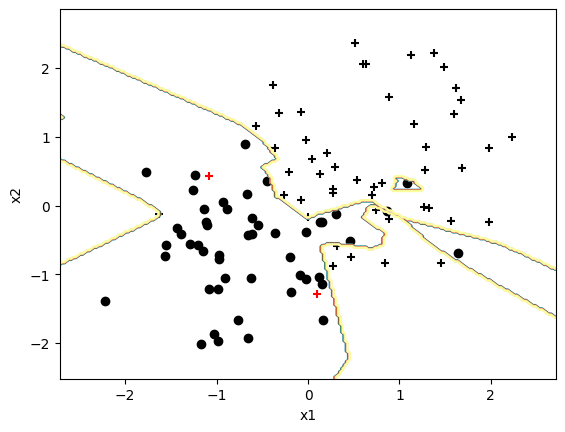

Model: "model_118"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_265 (Dense)           (None, 80)                240       
                                                                 
 dropout_145 (Dropout)       (None, 80)                0         
                                                                 
 dense_266 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9700
Sensitivity     0.9600
Specificity     0.9800
Loss            0.1393

 ##########

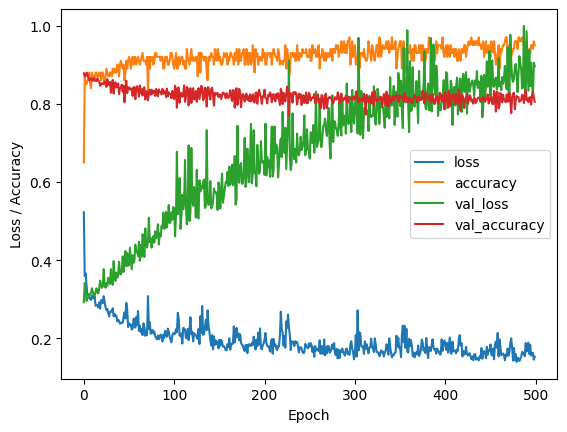

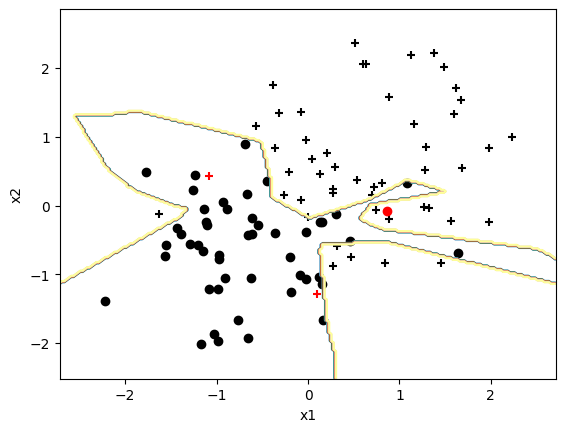

Model: "model_119"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_267 (Dense)           (None, 80)                240       
                                                                 
 dropout_146 (Dropout)       (None, 80)                0         
                                                                 
 dense_268 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9500
Sensitivity     0.9200
Specificity     0.9800
Loss            0.1248

 ##########

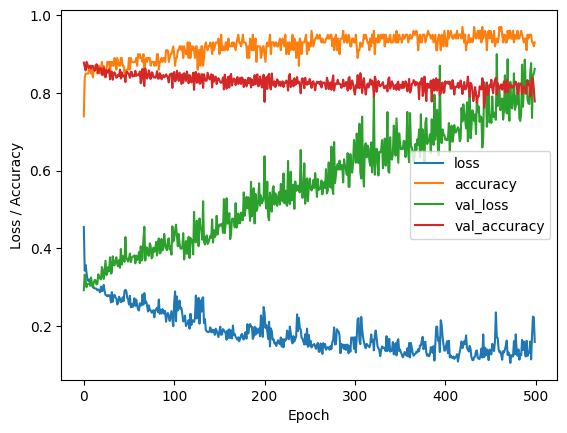

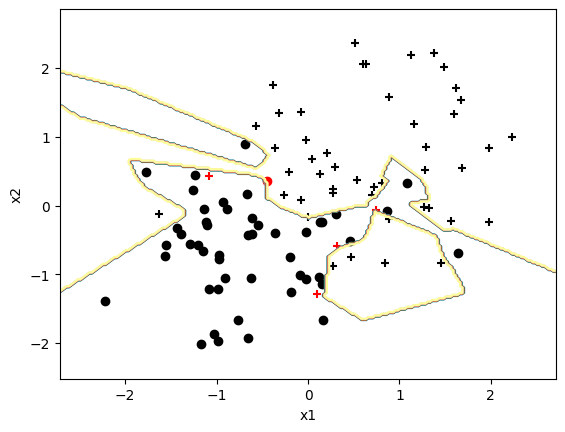

Model: "model_120"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_269 (Dense)           (None, 80)                240       
                                                                 
 dropout_147 (Dropout)       (None, 80)                0         
                                                                 
 dense_270 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9400
Sensitivity     0.9200
Specificity     0.9600
Loss            0.1084

 ##########

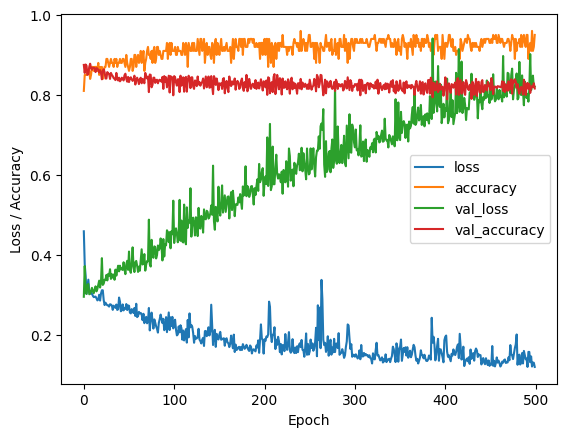

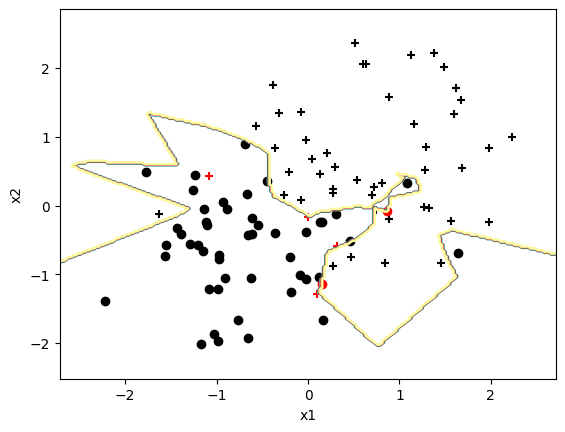

Model: "model_121"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_271 (Dense)           (None, 80)                240       
                                                                 
 dropout_148 (Dropout)       (None, 80)                0         
                                                                 
 dense_272 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9700
Sensitivity     0.9800
Specificity     0.9600
Loss            0.0824

 ##########

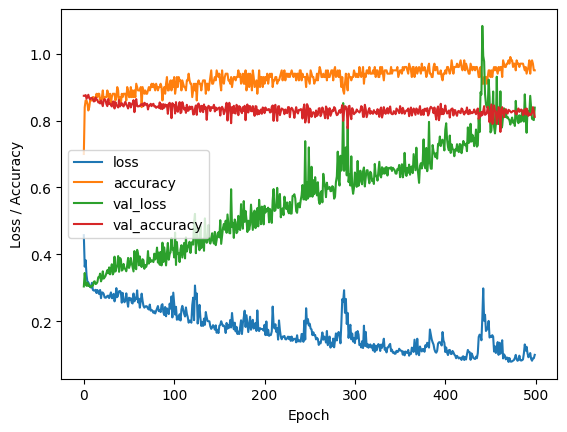

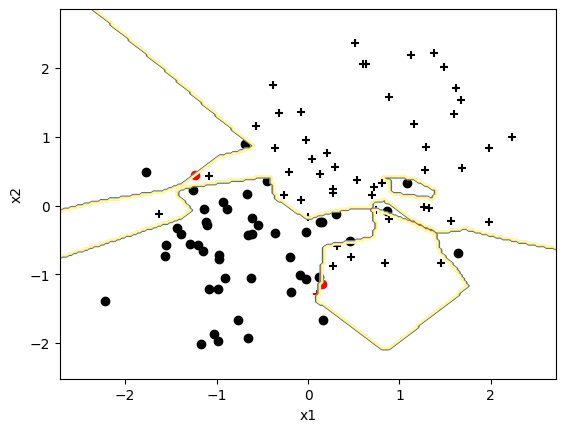

Model: "model_122"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_273 (Dense)           (None, 80)                240       
                                                                 
 dropout_149 (Dropout)       (None, 80)                0         
                                                                 
 dense_274 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9600
Sensitivity     0.9400
Specificity     0.9800
Loss            0.0951

 ##########

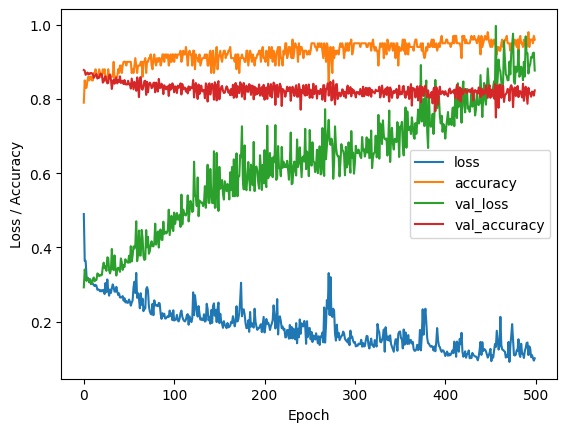

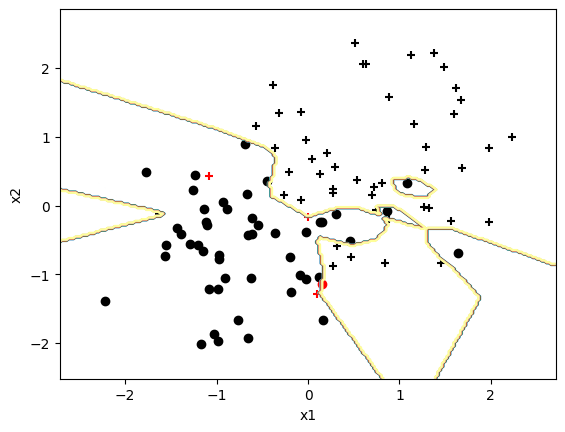

Model: "model_123"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_275 (Dense)           (None, 80)                240       
                                                                 
 dropout_150 (Dropout)       (None, 80)                0         
                                                                 
 dense_276 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9500
Sensitivity     0.9800
Specificity     0.9200
Loss            0.1210

 ##########

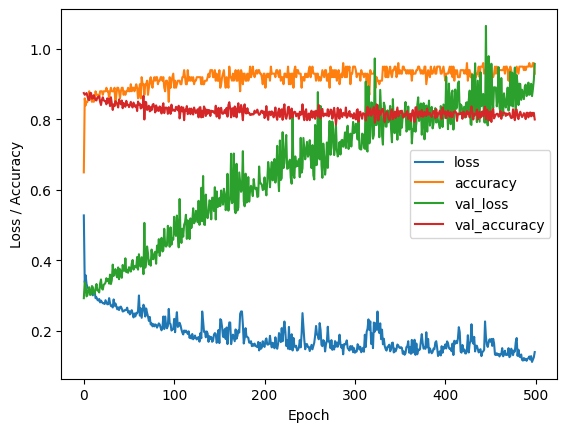

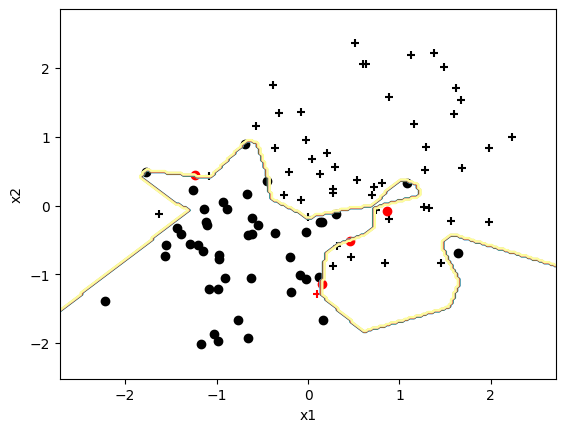

Model: "model_124"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_277 (Dense)           (None, 80)                240       
                                                                 
 dropout_151 (Dropout)       (None, 80)                0         
                                                                 
 dense_278 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9700
Sensitivity     0.9600
Specificity     0.9800
Loss            0.1194

 ##########

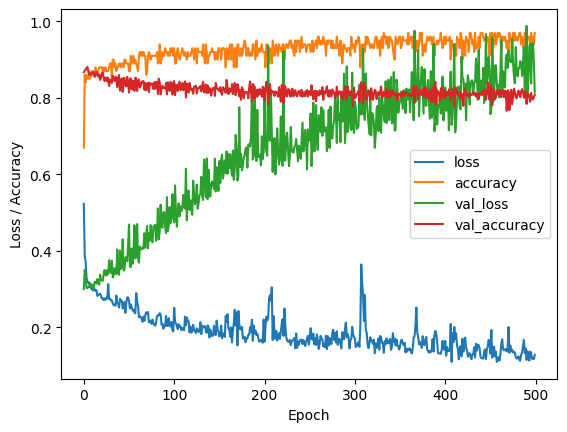

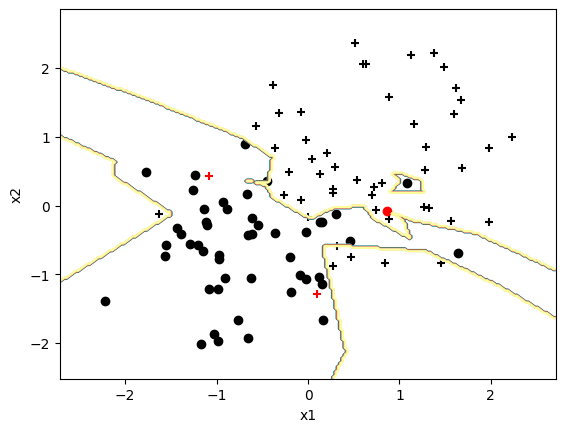

Model: "model_125"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_279 (Dense)           (None, 80)                240       
                                                                 
 dropout_152 (Dropout)       (None, 80)                0         
                                                                 
 dense_280 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9700
Sensitivity     0.9600
Specificity     0.9800
Loss            0.1181

 ##########

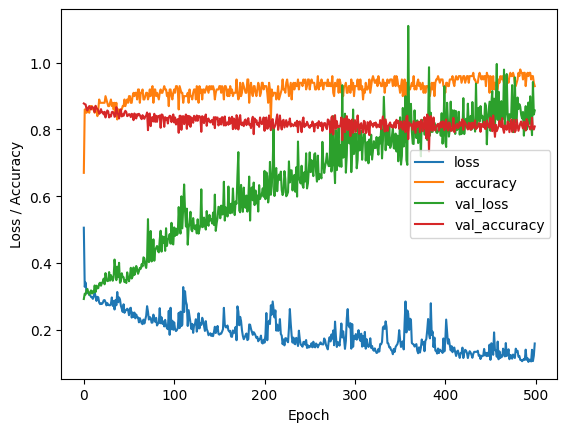

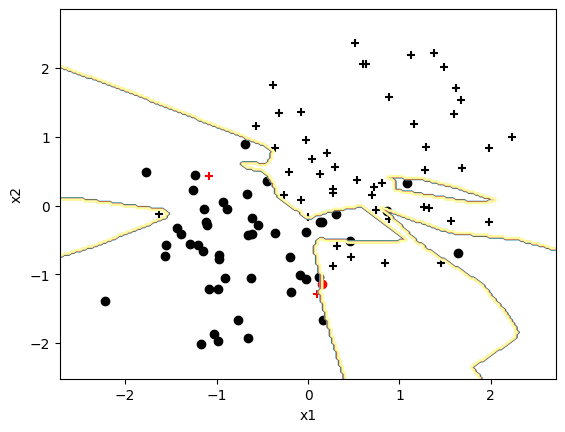

Model: "model_126"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_281 (Dense)           (None, 80)                240       
                                                                 
 dropout_153 (Dropout)       (None, 80)                0         
                                                                 
 dense_282 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9700
Sensitivity     0.9600
Specificity     0.9800
Loss            0.1213

 ##########

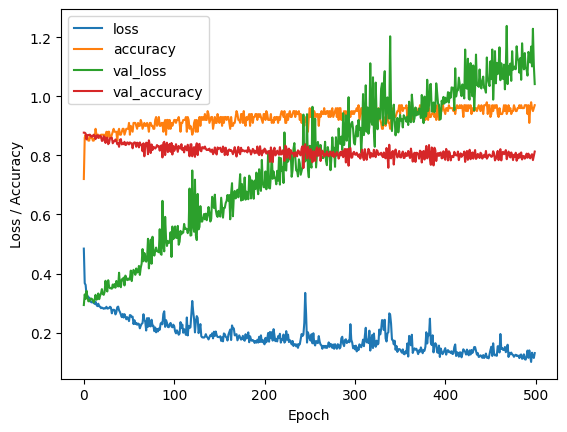

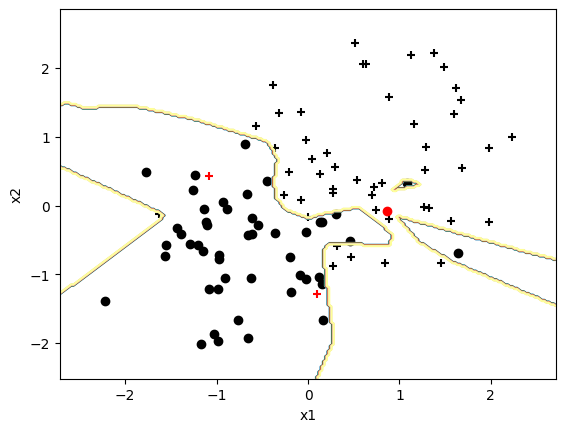

Model: "model_127"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_283 (Dense)           (None, 80)                240       
                                                                 
 dropout_154 (Dropout)       (None, 80)                0         
                                                                 
 dense_284 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9600
Sensitivity     0.9600
Specificity     0.9600
Loss            0.1033

 ##########

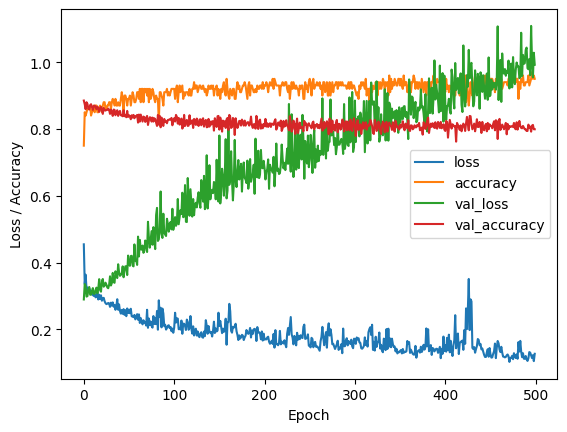

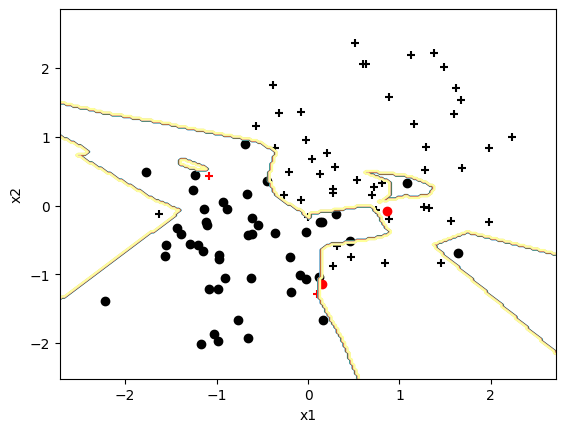

Model: "model_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_285 (Dense)           (None, 80)                240       
                                                                 
 dropout_155 (Dropout)       (None, 80)                0         
                                                                 
 dense_286 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9700
Sensitivity     0.9600
Specificity     0.9800
Loss            0.1346

 ##########

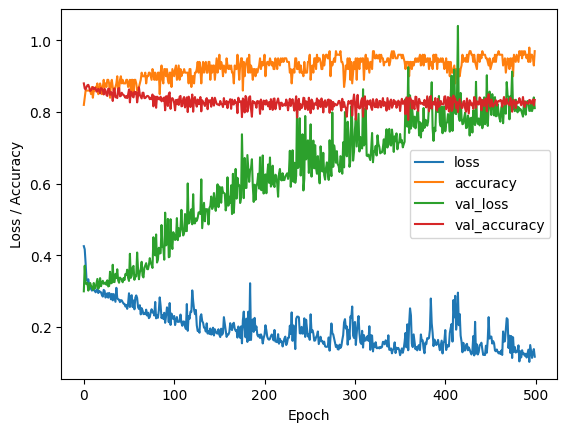

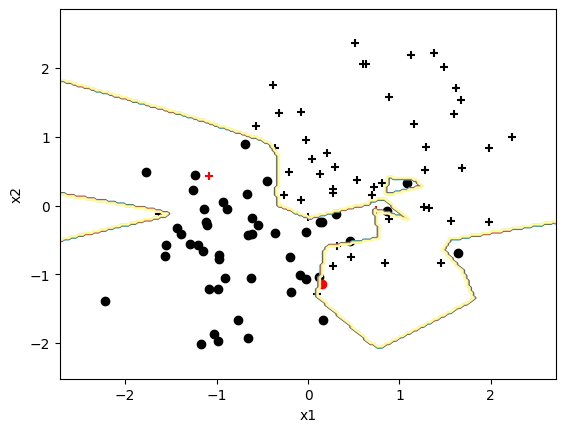

Model: "model_129"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_287 (Dense)           (None, 80)                240       
                                                                 
 dropout_156 (Dropout)       (None, 80)                0         
                                                                 
 dense_288 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9800
Sensitivity     0.9600
Specificity     1.0000
Loss            0.1117

 ##########

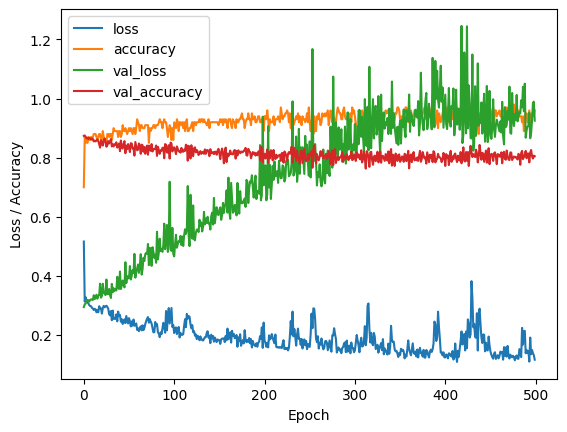

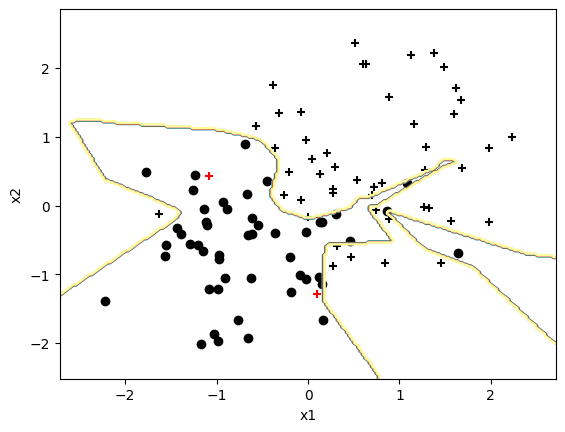

Model: "model_130"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_289 (Dense)           (None, 80)                240       
                                                                 
 dropout_157 (Dropout)       (None, 80)                0         
                                                                 
 dense_290 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9700
Sensitivity     0.9600
Specificity     0.9800
Loss            0.1069

 ##########

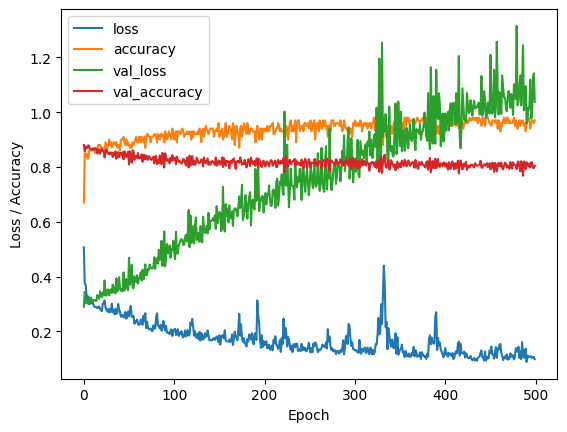

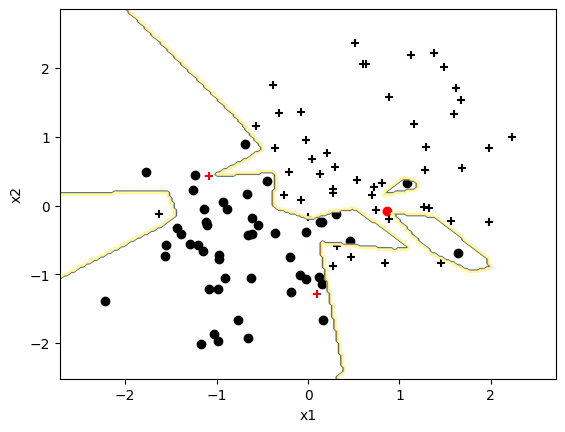

Model: "model_131"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_291 (Dense)           (None, 80)                240       
                                                                 
 dropout_158 (Dropout)       (None, 80)                0         
                                                                 
 dense_292 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9600
Sensitivity     0.9400
Specificity     0.9800
Loss            0.0867

 ##########

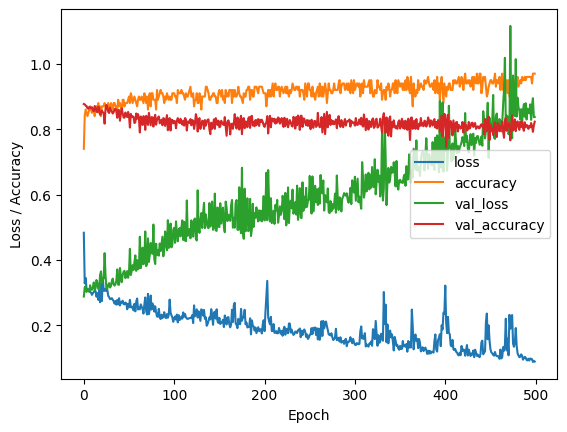

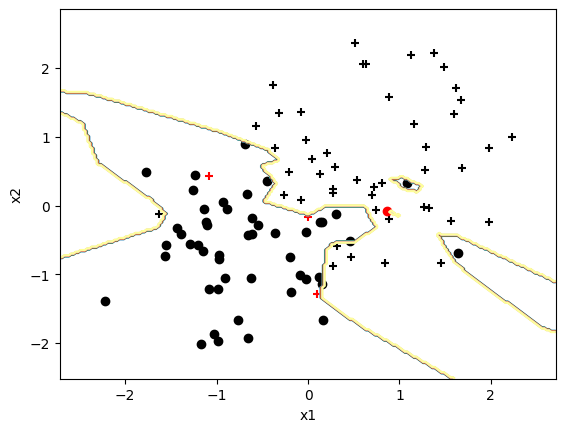

Model: "model_132"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_293 (Dense)           (None, 80)                240       
                                                                 
 dropout_159 (Dropout)       (None, 80)                0         
                                                                 
 dense_294 (Dense)           (None, 1)                 81        
                                                                 
Total params: 321 (1.25 KB)
Trainable params: 321 (1.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

Accuracy        0.9500
Sensitivity     0.9800
Specificity     0.9200
Loss            0.1263

 ##########

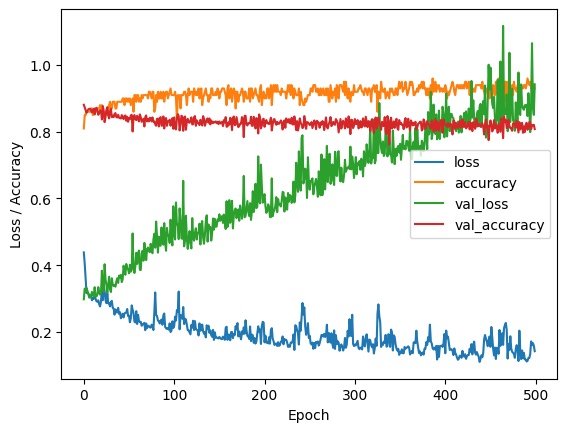

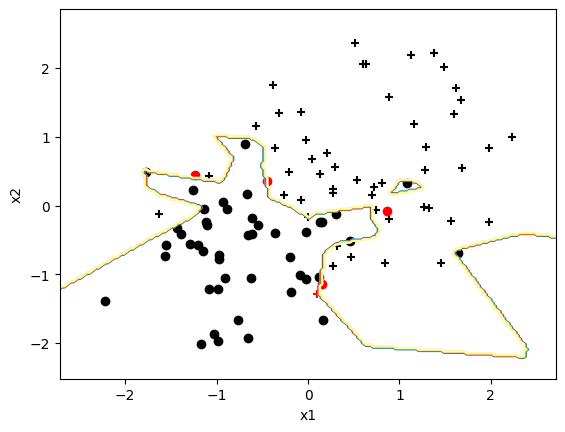

In [ ]:
%%time
# seed = 0 means random, seed > 0 means fixed
seed = 3
np.random.seed(seed) if seed else None

# Generate training data
x_trn, d_trn = syn2(100)
x_val, d_val = syn2(1000)

# Standardization of inputs
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std

####
a = 0
b = 0
tested_vals = set()

while b < 0.9:
  # Define the network, cost function and training settings
  n_nodes = random.randint(1, 20)
  while n_nodes in tested_vals:
    n_nodes = random.randint(1, 20)
  tested_vals.add(n_nodes)
  INPUT = {'inp_dim': x_trn.shape[1],
          'n_nod': [80],                      # architecture
          'drop_nod': 0.0,                   # dropout specification
          'act_fun': 'relu',                 # activation functions for the hidden layer
          'out_act_fun': 'sigmoid',          # output activation function
          'opt_method': 'Adam',              # minimization method
          'cost_fun': 'binary_crossentropy', # error function
          'lr_rate': 0.05 ,                  # learning rate
          'num_out' : 1 }                    # if binary --> 1 |  regression--> num inputs | multi-class--> num of classes
  number_epochs = 500
  minibatch_size = 25
  ####

  # Get the model
  model_ex1 = mlp(**INPUT)

  # Print a summary of the model
  model_ex1.summary()

  # Train the model
  estimator_ex1 = model_ex1.fit(x_trn, d_trn,
                        validation_data=(x_val, d_val),
                        epochs=number_epochs,
                        batch_size=minibatch_size,
                        verbose=0)

  # Call the stats function to print out statistics for classification problems
  stats_class(x_trn, d_trn, 'Training', model_ex1)
  b = stats_class(x_val, d_val, 'Validation', model_ex1)["Accuracy"]
  print(f"Amount of nodes {n_nodes}")
  # Training history
  plt.figure()
  plt.ylabel('Loss / Accuracy')
  plt.xlabel('Epoch')
  for k in estimator_ex1.history.keys():
      plt.plot(estimator_ex1.history[k], label = k)
  plt.legend(loc='best')
  plt.show()
  # Show the decision boundary for the training dataset
  decision_b(x_trn, d_trn, model_ex1)

# If you uncomment this one you will see how the decsion boundary is with respect to the validation data
#decision_b(x_val, d_val)



### CellName: Ex2 (#9)
### CellType: Exercise
### Cell instruction: Instruction for questions 4-6

Now we are going to look at a regression problem. The data as described above (*regr2*) consists of 6 inputs (features) and one output (target) value. As in the previous exercise, a new data set is generated each time you call the *regr2* function. To get exactly the same data set between different calls, use a fixed seed. For this problem we can control the amount of noise added to the target value. We are going to use a relatively small training dataset (250) and a larger validation dataset (1000) to get a more robust estimation of the generalization performance, and 0.4 units of noise. For regression problems we also need new performance measures. The *stats_reg* function will give you two such measures:
* MSE = mean squared error (low error means good performance)
* CorrCoeff = Pearson correlation coefficient for the scatter plot between predicted and true values.

The cell below can be used as a template for all questions regarding this regression problem.

#### Question 4, optimizing regression performance
*Model selection based on the number of hidden nodes (in a single hidden layer).* Find the number of hidden nodes that gives best validation performance. **How many hidden nodes gives the best validation performance?** **What is the best validation MSE (or correlation coefficient) you get?**

**Hint:** A good strategy is to start with a "small" model and increase the number of hidden nodes and monitor the validation result.

#### Question 5, improving generalization with L2 regularization
*Model selection based on L2 (weight decay).* Instead of using the number of hidden nodes to control the complexity we can use a regularization term added to the error function. You are going to control the complexity by adding a *L2* regularizer (see the "INPUT" dictionary in the cell). For the L2 regularization to make sense we need a start model that is capable being overtrained. The suggestion is to use at least twice as many hidden nodes for this question compared to what you found in Q4. You should modify the *L2* value until you find the optimal validation performance. **(a) Present your optimal model (L2 value and number of hidden nodes) and the validation performance.** **(b) Do you obtain a better result compared to Q4?**

**Hint:** When you test different values for a hyperparameter, it usually makes more sense to multiply with a constant factor than to add a constant term. For example, if you test five values in the range from 0.1 to 10, the values {0.1, 0.3, 1, 3, 10} are usually a better choice than {0.1, 2.5, 5, 7.5, 10}.

#### Question 6, improving generalization with dropout
*Model selection based on dropout.* Instead of using the *L2* regularizer we can use dropout. In short, repeat Q5, but use the *dropout* parameter instead. **(a) Present your optimal model (dropout value and number of hidden nodes) and the validation performance.** **(b) Do you obtain a better result compared to Q4/Q5?**

**Hint:** Using dropout may require even more hidden nodes to start with!

#### Extra question
The extra questions is provided if you have extra time. **These question are not required for the course and do not influence any grading.**

Repeat Q4-Q6 using two hidden layers.


Model: "model_97"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 6)]               0         
                                                                 
 dense_196 (Dense)           (None, 48)                336       
                                                                 
 dropout_99 (Dropout)        (None, 48)                0         
                                                                 
 dense_197 (Dense)           (None, 1)                 49        
                                                                 
Total params: 385 (1.50 KB)
Trainable params: 385 (1.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________



 ########## STATISTICS for Training Data ########## 

MSE             0.0582977725
CorrCoeff       0.9712630464

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.3769306984
CorrCoeff       0.8140444884

 ##################################################
Dropout is equal to 0.05


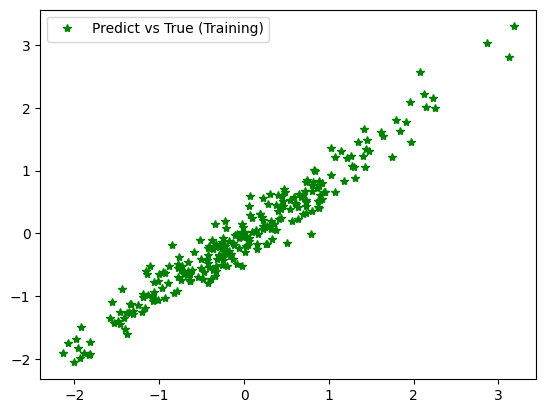

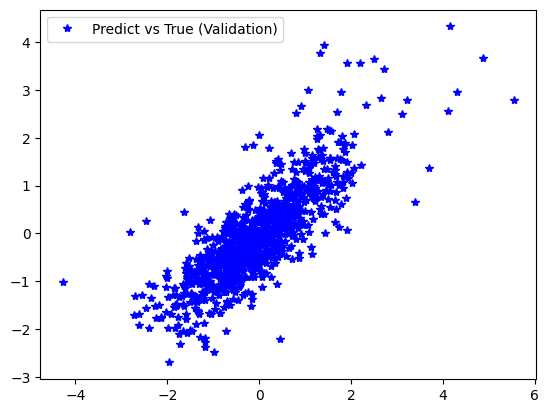

Model: "model_98"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 6)]               0         
                                                                 
 dense_198 (Dense)           (None, 48)                336       
                                                                 
 dropout_100 (Dropout)       (None, 48)                0         
                                                                 
 dense_199 (Dense)           (None, 1)                 49        
                                                                 
Total params: 385 (1.50 KB)
Trainable params: 385 (1.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

MSE             0.0751472552
CorrCoeff       0.9637247810

 #############################################

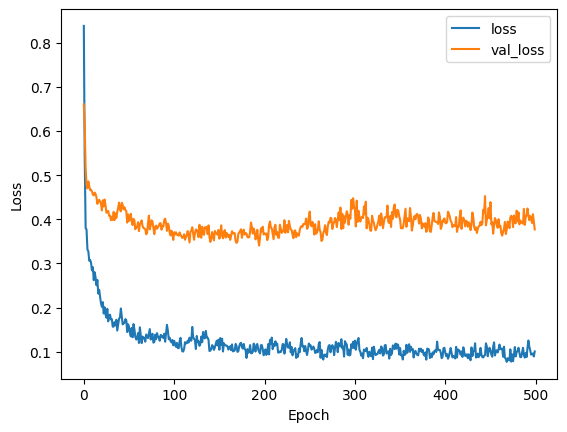

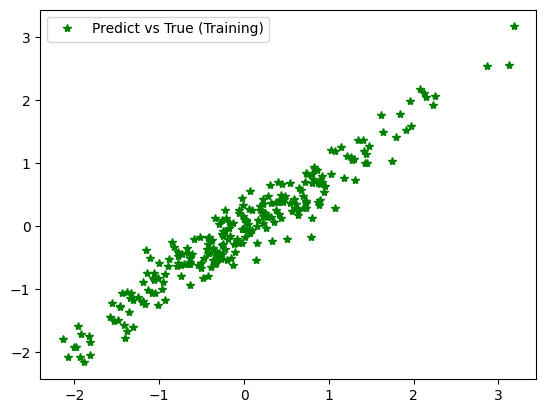

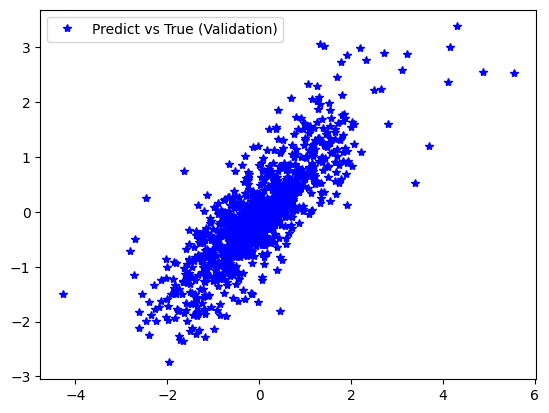

Model: "model_99"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 6)]               0         
                                                                 
 dense_200 (Dense)           (None, 48)                336       
                                                                 
 dropout_101 (Dropout)       (None, 48)                0         
                                                                 
 dense_201 (Dense)           (None, 1)                 49        
                                                                 
Total params: 385 (1.50 KB)
Trainable params: 385 (1.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

MSE             0.1428868253
CorrCoeff       0.9427544681

 #############################################

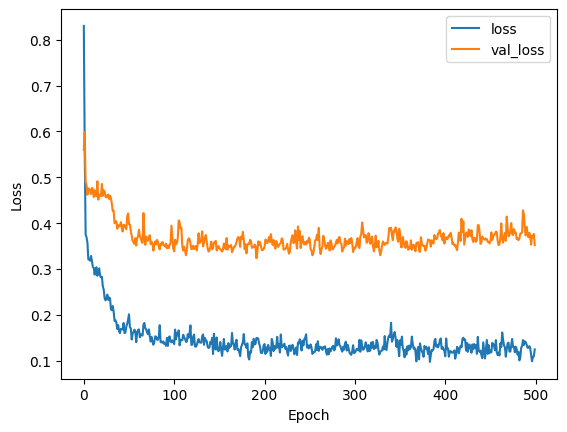

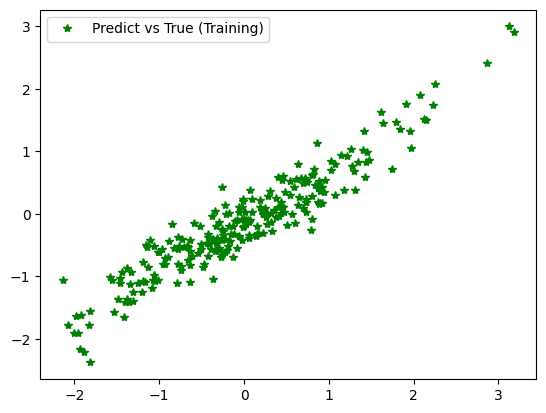

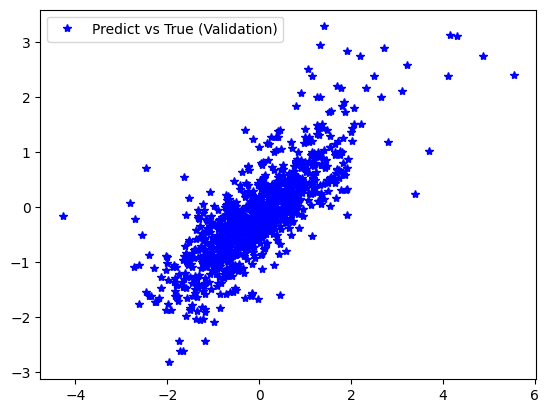

Model: "model_100"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 6)]               0         
                                                                 
 dense_202 (Dense)           (None, 48)                336       
                                                                 
 dropout_102 (Dropout)       (None, 48)                0         
                                                                 
 dense_203 (Dense)           (None, 1)                 49        
                                                                 
Total params: 385 (1.50 KB)
Trainable params: 385 (1.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

MSE             0.1281263198
CorrCoeff       0.9461880401

 ############################################

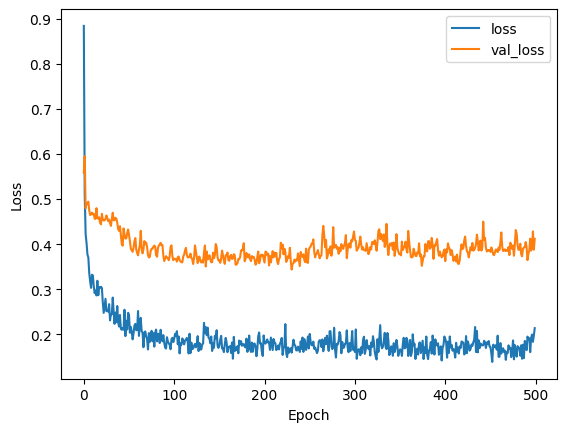

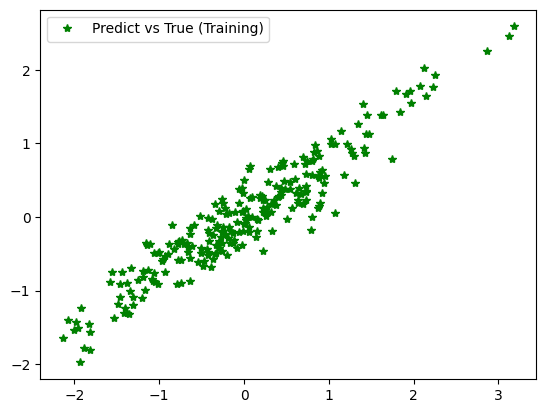

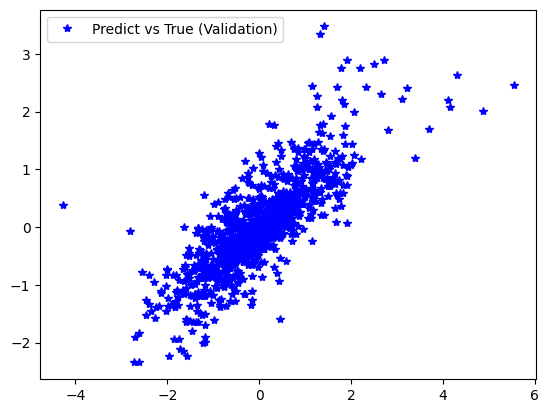

Model: "model_101"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 6)]               0         
                                                                 
 dense_204 (Dense)           (None, 48)                336       
                                                                 
 dropout_103 (Dropout)       (None, 48)                0         
                                                                 
 dense_205 (Dense)           (None, 1)                 49        
                                                                 
Total params: 385 (1.50 KB)
Trainable params: 385 (1.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

MSE             0.1710285463
CorrCoeff       0.9133774835

 ############################################

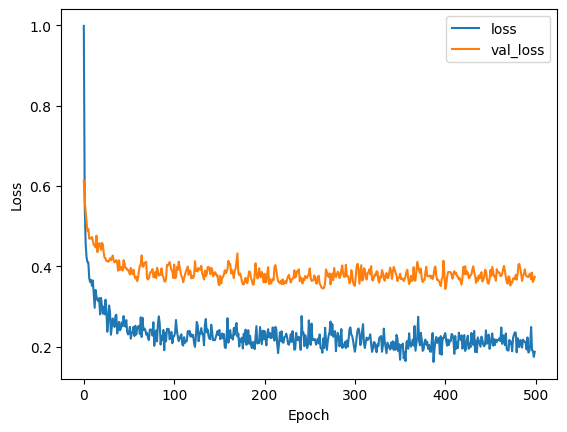

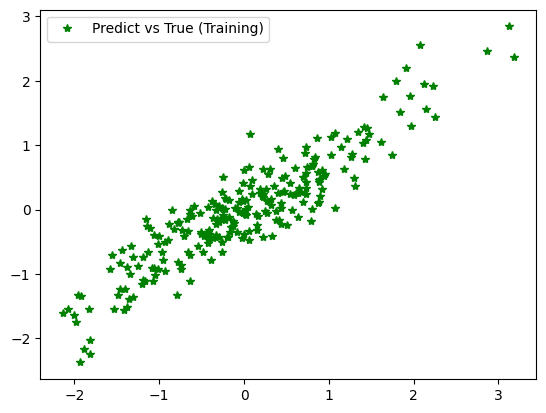

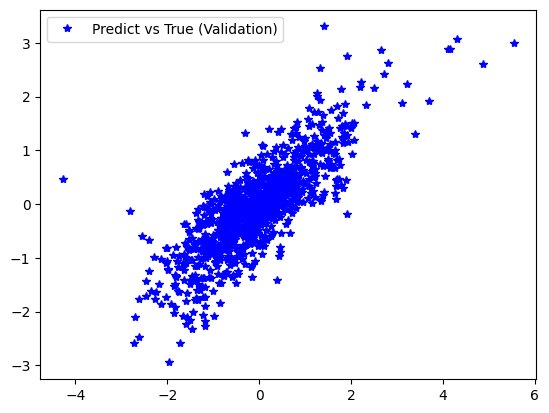

Model: "model_102"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 6)]               0         
                                                                 
 dense_206 (Dense)           (None, 48)                336       
                                                                 
 dropout_104 (Dropout)       (None, 48)                0         
                                                                 
 dense_207 (Dense)           (None, 1)                 49        
                                                                 
Total params: 385 (1.50 KB)
Trainable params: 385 (1.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

 ########## STATISTICS for Training Data ########## 

MSE             0.2850483324
CorrCoeff       0.8553748051

 ############################################

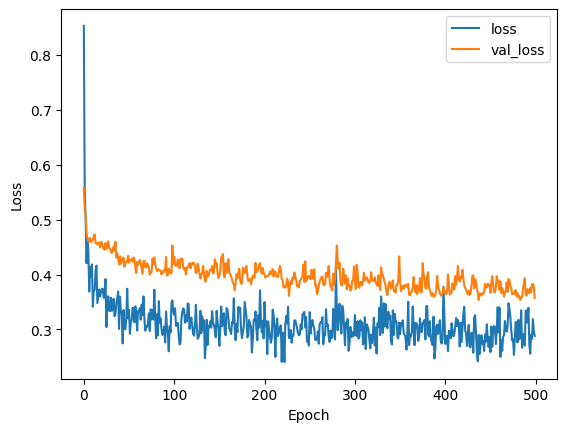

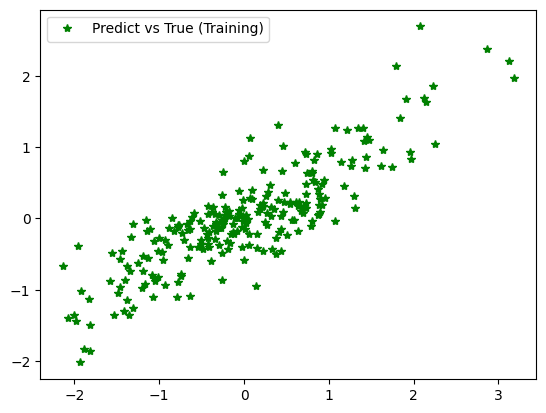

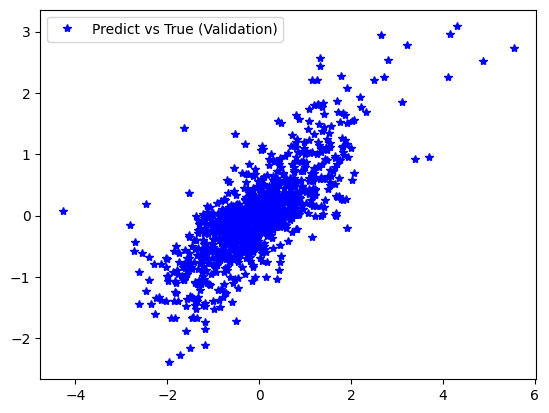

CPU times: user 3min 55s, sys: 10.3 s, total: 4min 5s
Wall time: 7min 6s


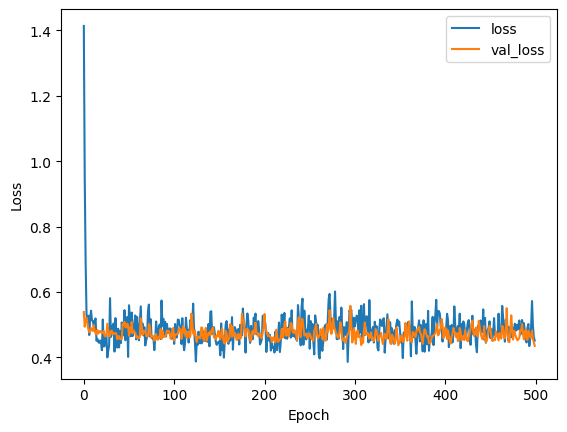

In [ ]:
%%time
# seed = 0 means random, seed > 0 means fixed
seed = 10
np.random.seed(seed) if seed else None

# Generate training and validation data
x_trn, d_trn = regr2(250, 0.4)
x_val, d_val = regr2(1000, 0.4)

# Standardization of both inputs and targets
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std

mu, std = standard(d_trn)
d_trn = (d_trn - mu) / std
d_val = (d_val - mu) / std

####
# Define the network, cost function and training settings
tested_vals = set()
drops = [0.05, .1, .2, .3, .5, .75]

i = 0
for i, l in enumerate(drops):
  # n_nodes = random.randint(1, 20)
  # while n_nodes in tested_vals:
  #   n_nodes = random.randint(1, 20)
  # tested_vals.add(n_nodes)

  INPUT = {'inp_dim': x_trn.shape[1],
          'n_nod': [48],
          'drop_nod': drops[i],
          'act_fun': 'relu',
          'out_act_fun': 'linear',
          'opt_method': 'Adam',
          'cost_fun': 'mse',
          'lr_rate': 0.025,
          'metric': 'mse',
          'lambd' : 0,
          'num_out' : 1 }
  number_epochs = 500
  minibatch_size = 50
  ####

  # Get the model
  model_ex2 = mlp(**INPUT)

  # Print a summary of the model
  model_ex2.summary()

  # Train the model
  estimator_ex2 = model_ex2.fit(x_trn, d_trn,
                        validation_data=(x_val,d_val),
                        epochs=number_epochs,
                        batch_size=minibatch_size,
                        verbose=0)

  # Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
  stats_reg(x_trn, d_trn, 'Training', model_ex2)
  stats_reg(x_val, d_val, 'Validation', model_ex2)
  print(f"Dropout is equal to {drops[i]}")

  # Scatter plots of predicted and true values
  pred_trn = model_ex2.predict(x_trn, verbose=0).reshape(d_trn.shape)
  pred_val = model_ex2.predict(x_val, verbose=0).reshape(d_val.shape)
  plt.figure()
  plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
  plt.legend()
  plt.figure()
  plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
  plt.legend()
  plt.show()


  # Training history
  plt.figure()
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  for k in ['loss', 'val_loss']:
      plt.plot(estimator_ex2.history[k], label = k)
  plt.legend(loc='best')

### CellName: Ex3 (#10)
### CellType: Exercise
### Cell instruction: Instruction for questions 7-8

For this exercise you are given a classification problem with fixed training-, validation- and test datasets. The data is the Japanse vowels dataset described in the first cell. Your task is to do model selection, coming up with your optimal MLP architecture together with the hyperparameters you used. We provide less code here: normalization of the input data and the definition of the MLP is missing. You need to provide that on your own.

#### Question 7, create MLP for binary classification
**(a) Present an MLP with associated hyperparameters that maximizes the validation performance, and state the training, validation and test performance you obtained.**
**(b) Present your code.**

**Hint 1:**
Remember to normalize the input data.

**Hint 2:**
This problem is a 9-class classification problem, meaning that you should use a specific output activation function (*out_act_fun*) and a specific loss/error function (*cost_fun*).

**Hint 3:**
Place a line with three tildes (\~\~\~) or backticks(\´\´\´) above and below your code in the report:
~~~
    for a in ['Hello', 'World']:
        print(a)
~~~

#### Question 8, model selection criteria
The typical goal is to have a high accuracy (i.e. the fraction of correctly classified cases). During training we typically monitor possible overtraining by looking at the *loss* of the validation data, since this is the error used during training. However, one can have a situation where the validation loss increases during training but the accuracy stays constant. **Why can this happen?** **Given this situation, what would be your criteria to select the best model?**


In [ ]:
%%time

# Load the data
x_trn, d_trn, x_val, d_val, x_tst, d_tst = vowels()
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std

mu, std = standard(d_trn)
# d_trn = (d_trn - mu)/std
# d_val = (d_val - mu)/std
# d_tst = (d_tst - mu)/std


# YOUR CODE FOR NORMALIZATION

print(len(x_trn))

num_classes = 9

# YOUR CODE THAT DEFINES THE MLP
def eval_net(n_nodes, lambd):
  # print(x_trn, "XTRAIN", type(x_trn))
  # print("y1", x_trn[0].shape)
  # print("y2", x_trn[1].shape)
  # print("y3", x_trn[2].shape)



  print(f"n_nodes = {n_nodes} lambd = {lambd}")


  INPUT = {'inp_dim': x_trn.shape[1],
            'n_nod': [n_nodes],
            'drop_nod': 0,
            'act_fun': 'relu',
            'out_act_fun': 'softmax',
            'opt_method': 'Adam',
            'cost_fun': 'categorical_crossentropy',
            'lr_rate': 0.025,
            'lambd' : lambd,
            'num_out' : num_classes }

  # Get the model
  model_vowels = mlp(**INPUT)
  number_epochs = 500
  minibatch_size = 25
  # Print a summary of the model
  model_vowels.summary()

  # Train the model
  estimator_vowels = model_vowels.fit(x_trn, d_trn,
                        validation_data=(x_val, d_val),
                        epochs=number_epochs,
                        batch_size=minibatch_size,
                        verbose=0)

  # Plot the learning curves
  plt.figure()
  plt.ylabel('Loss / Accuracy')
  plt.xlabel('Epoch')
  for k in estimator_vowels.history.keys():
      plt.plot(estimator_vowels.history[k], label = k)
  plt.legend()
  plt.show()

  # plot the confusion matrix
  make_cm_plot(model_vowels, x_trn, d_trn, num_classes, 'Training data')
  make_cm_plot(model_vowels, x_val, d_val, num_classes, 'Validation data')
  make_cm_plot(model_vowels, x_tst, d_tst, num_classes, 'Test data')


4274
CPU times: user 67.2 ms, sys: 1.2 ms, total: 68.4 ms
Wall time: 68.7 ms


LR 0.1 39
n_nodes = 39 lambd = 0.1
Model: "model_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_155 (Dense)           (None, 39)                390       
                                                                 
 dropout_90 (Dropout)        (None, 39)                0         
                                                                 
 dense_156 (Dense)           (None, 3)                 120       
                                                                 
Total params: 510 (1.99 KB)
Trainable params: 510 (1.99 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


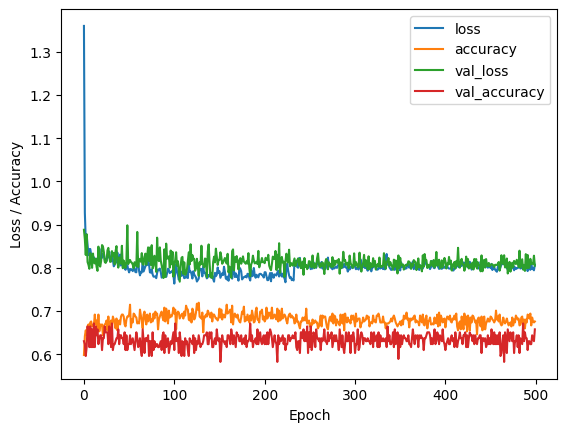


 ########## Result for Training data ########## 

log_loss:    0.7790
accuracy:    0.6986 

              precision    recall  f1-score   support

     class 1       0.71      0.91      0.80       260
     class 2       0.00      0.00      0.00        39
     class 3       0.65      0.50      0.57       139

    accuracy                           0.70       438
   macro avg       0.46      0.47      0.46       438
weighted avg       0.63      0.70      0.65       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


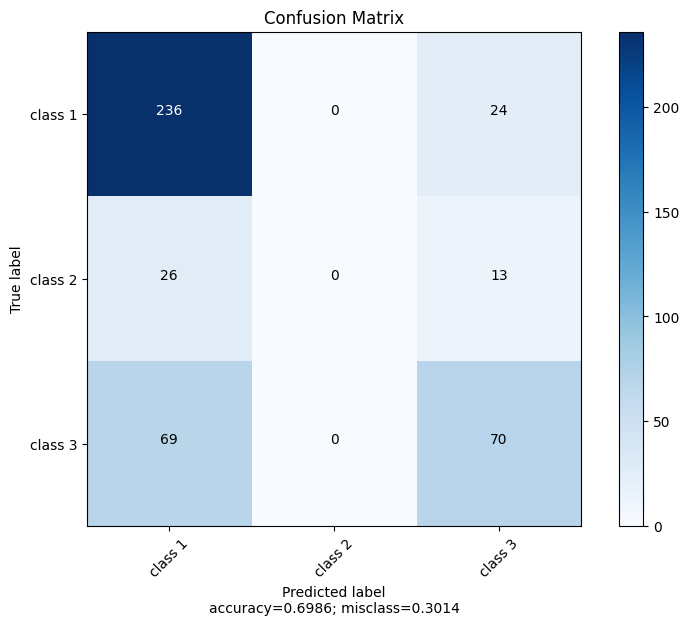


 ########## Result for Validation data ########## 

log_loss:    0.7946
accuracy:    0.6575 

              precision    recall  f1-score   support

     class 1       0.69      0.84      0.76        85
     class 2       0.00      0.00      0.00         9
     class 3       0.58      0.48      0.53        52

    accuracy                           0.66       146
   macro avg       0.42      0.44      0.43       146
weighted avg       0.61      0.66      0.63       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


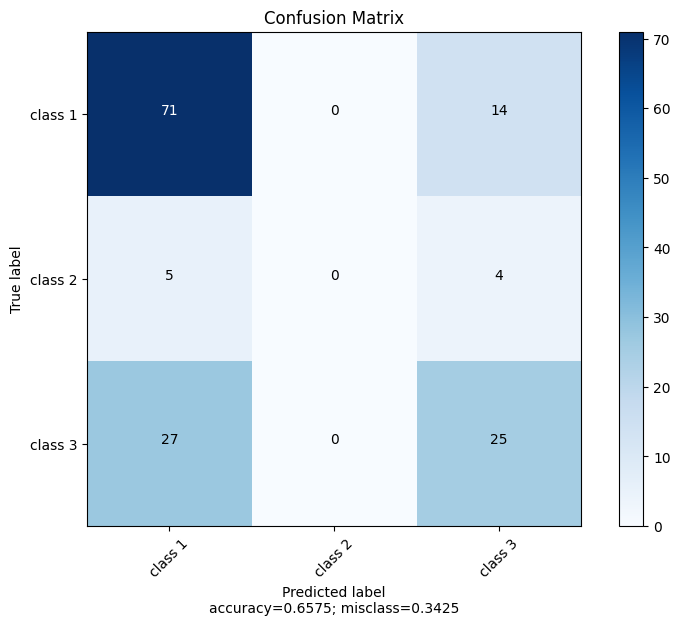


 ########## Result for Test data ########## 

log_loss:    0.8492
accuracy:    0.6205 

              precision    recall  f1-score   support

     class 1       0.65      0.85      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.52      0.36      0.43        64

    accuracy                           0.62       195
   macro avg       0.39      0.40      0.39       195
weighted avg       0.55      0.62      0.57       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


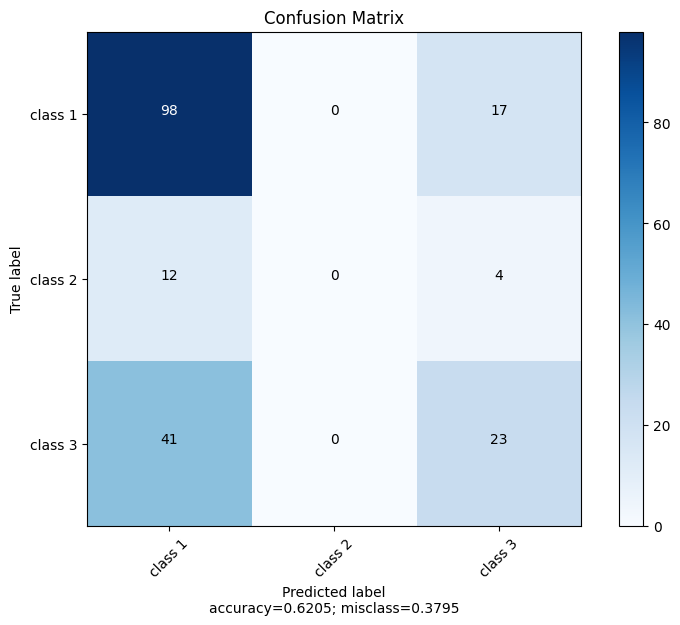

LR 0.1 28
n_nodes = 28 lambd = 0.1
Model: "model_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_157 (Dense)           (None, 28)                280       
                                                                 
 dropout_91 (Dropout)        (None, 28)                0         
                                                                 
 dense_158 (Dense)           (None, 3)                 87        
                                                                 
Total params: 367 (1.43 KB)
Trainable params: 367 (1.43 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


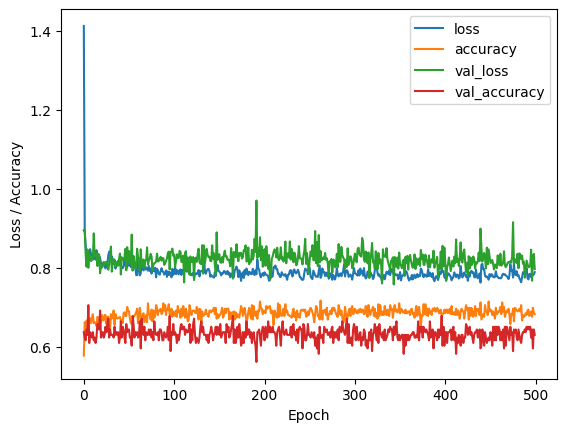


 ########## Result for Training data ########## 

log_loss:    0.7551
accuracy:    0.7192 

              precision    recall  f1-score   support

     class 1       0.73      0.88      0.80       260
     class 2       0.78      0.18      0.29        39
     class 3       0.68      0.56      0.62       139

    accuracy                           0.72       438
   macro avg       0.73      0.54      0.57       438
weighted avg       0.72      0.72      0.70       438



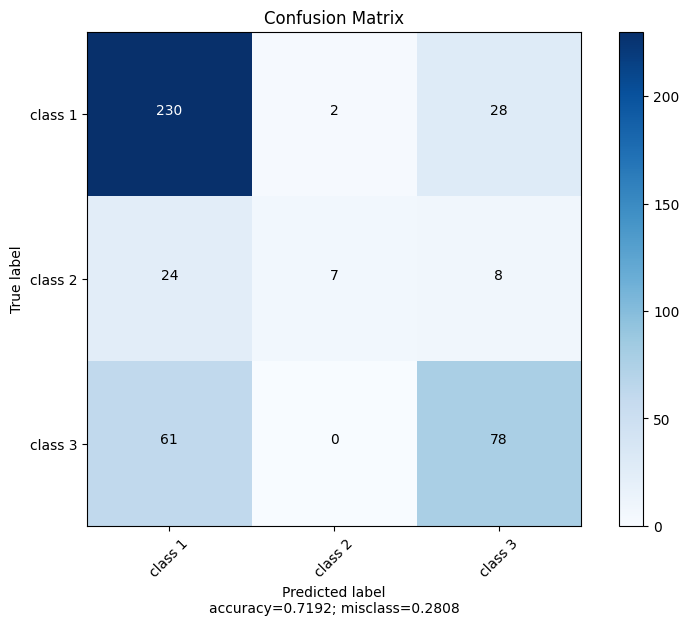


 ########## Result for Validation data ########## 

log_loss:    0.7717
accuracy:    0.6301 

              precision    recall  f1-score   support

     class 1       0.65      0.80      0.72        85
     class 2       0.00      0.00      0.00         9
     class 3       0.57      0.46      0.51        52

    accuracy                           0.63       146
   macro avg       0.41      0.42      0.41       146
weighted avg       0.58      0.63      0.60       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


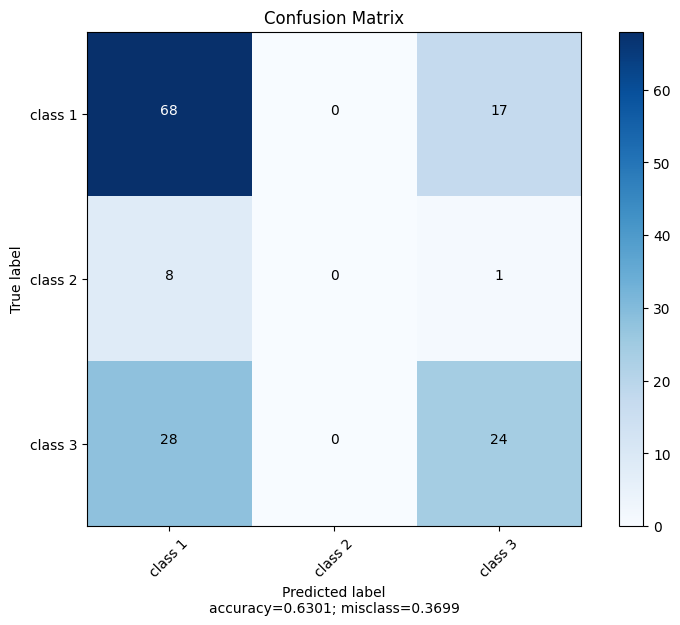


 ########## Result for Test data ########## 

log_loss:    0.8567
accuracy:    0.6256 

              precision    recall  f1-score   support

     class 1       0.65      0.83      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.55      0.42      0.48        64

    accuracy                           0.63       195
   macro avg       0.40      0.42      0.40       195
weighted avg       0.56      0.63      0.59       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


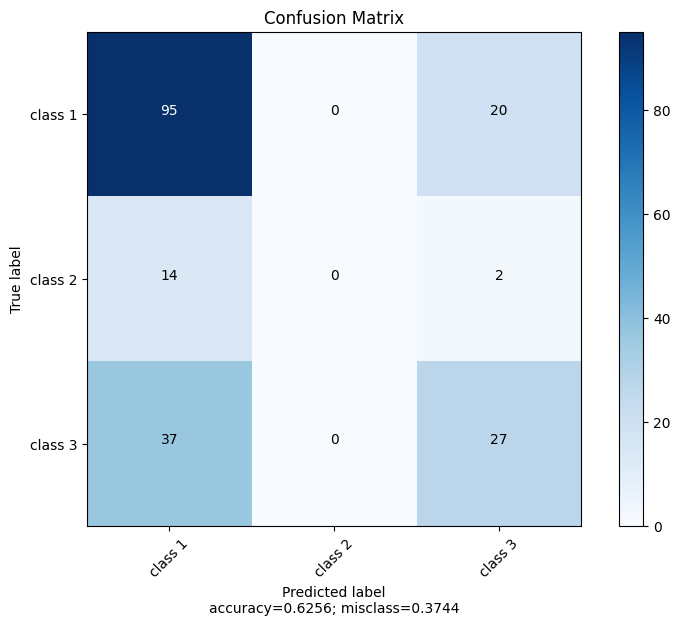

LR 0.1 7
n_nodes = 7 lambd = 0.1
Model: "model_65"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_159 (Dense)           (None, 7)                 70        
                                                                 
 dropout_92 (Dropout)        (None, 7)                 0         
                                                                 
 dense_160 (Dense)           (None, 3)                 24        
                                                                 
Total params: 94 (376.00 Byte)
Trainable params: 94 (376.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


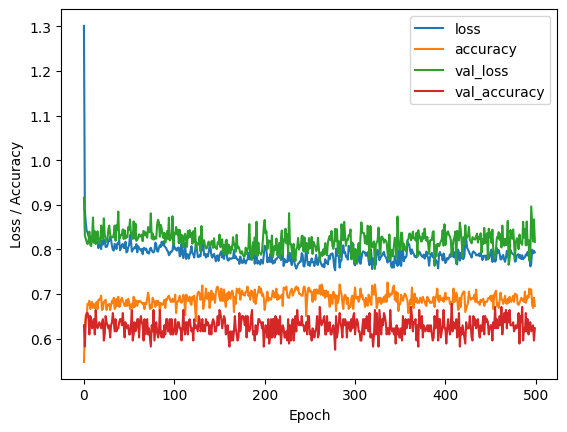


 ########## Result for Training data ########## 

log_loss:    0.7536
accuracy:    0.7055 

              precision    recall  f1-score   support

     class 1       0.71      0.90      0.79       260
     class 2       1.00      0.15      0.27        39
     class 3       0.67      0.50      0.57       139

    accuracy                           0.71       438
   macro avg       0.79      0.52      0.54       438
weighted avg       0.72      0.71      0.68       438



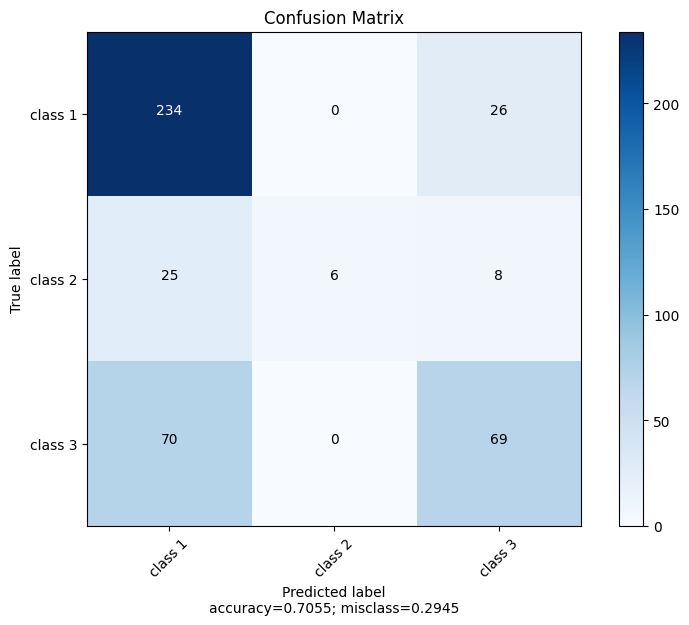


 ########## Result for Validation data ########## 

log_loss:    0.7940
accuracy:    0.6233 

              precision    recall  f1-score   support

     class 1       0.66      0.81      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.54      0.42      0.47        52

    accuracy                           0.62       146
   macro avg       0.40      0.41      0.40       146
weighted avg       0.57      0.62      0.59       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


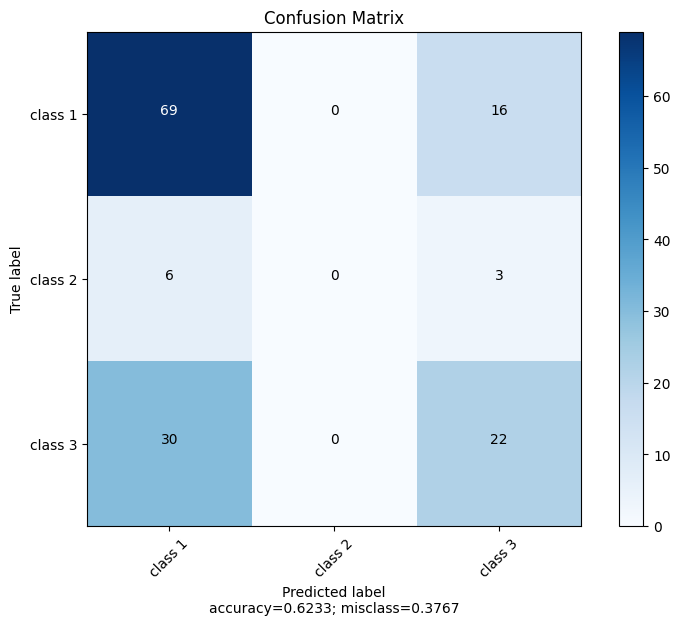


 ########## Result for Test data ########## 

log_loss:    0.8469
accuracy:    0.6205 

              precision    recall  f1-score   support

     class 1       0.64      0.85      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.55      0.36      0.43        64

    accuracy                           0.62       195
   macro avg       0.40      0.40      0.39       195
weighted avg       0.56      0.62      0.57       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


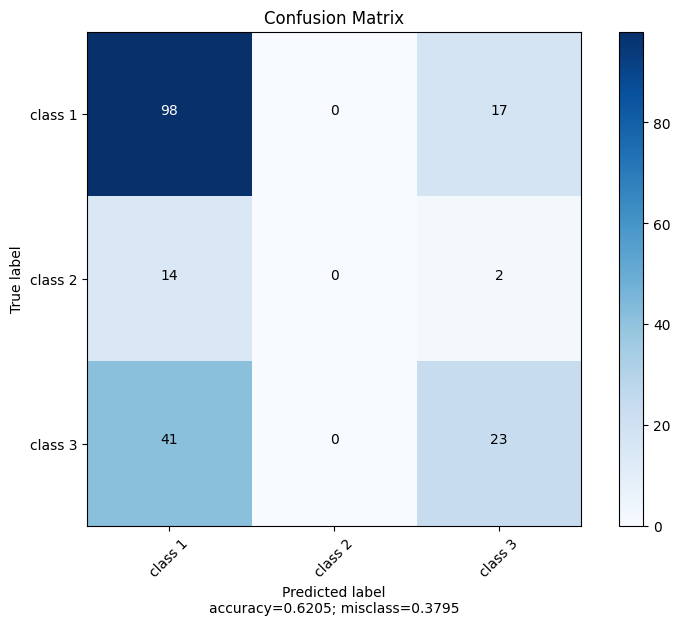

LR 0.1 37
n_nodes = 37 lambd = 0.1
Model: "model_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_161 (Dense)           (None, 37)                370       
                                                                 
 dropout_93 (Dropout)        (None, 37)                0         
                                                                 
 dense_162 (Dense)           (None, 3)                 114       
                                                                 
Total params: 484 (1.89 KB)
Trainable params: 484 (1.89 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


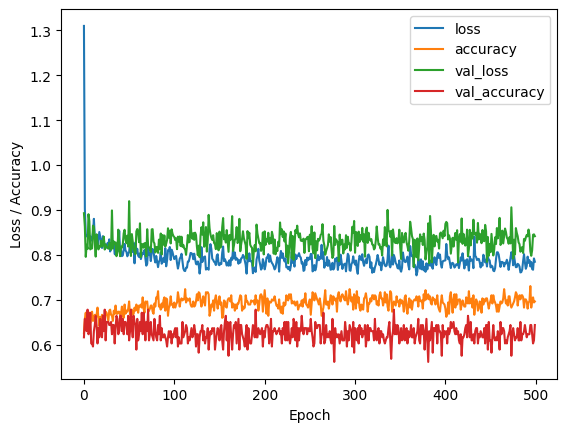


 ########## Result for Training data ########## 

log_loss:    0.7275
accuracy:    0.7146 

              precision    recall  f1-score   support

     class 1       0.73      0.88      0.80       260
     class 2       0.88      0.18      0.30        39
     class 3       0.67      0.56      0.61       139

    accuracy                           0.71       438
   macro avg       0.76      0.54      0.57       438
weighted avg       0.72      0.71      0.69       438



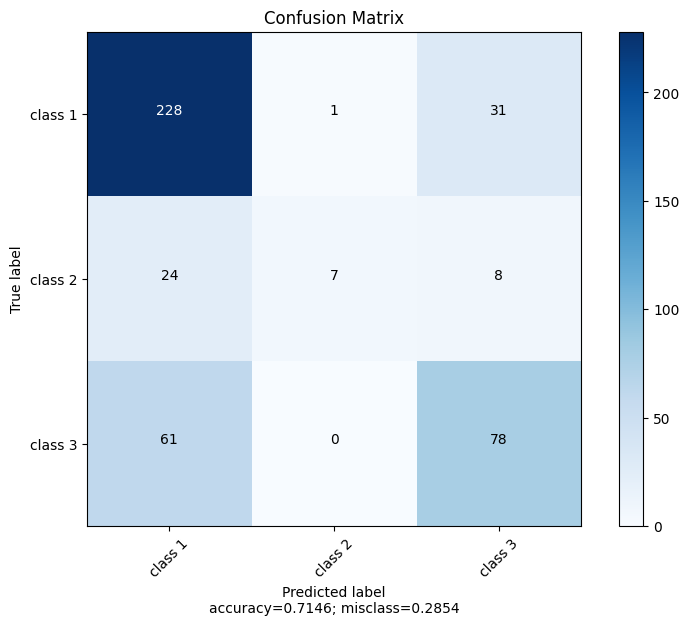


 ########## Result for Validation data ########## 

log_loss:    0.8096
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.70      0.80      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.53      0.50      0.51        52

    accuracy                           0.64       146
   macro avg       0.41      0.43      0.42       146
weighted avg       0.60      0.64      0.62       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


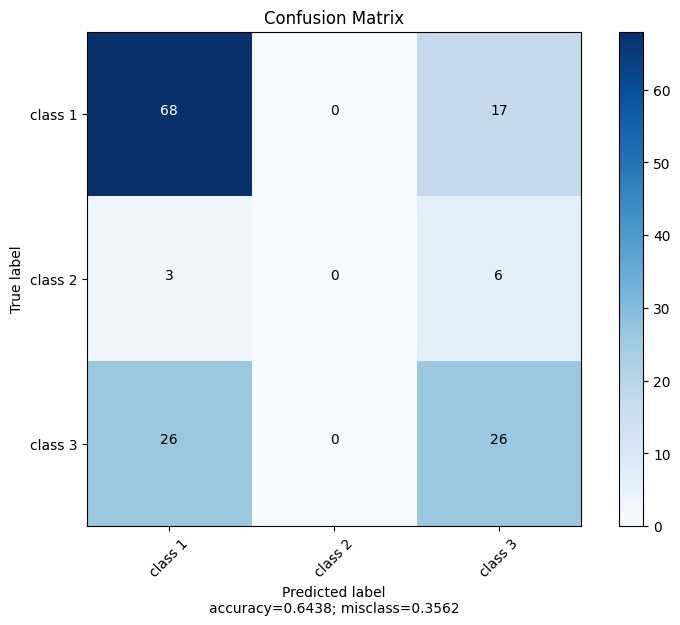


 ########## Result for Test data ########## 

log_loss:    0.8689
accuracy:    0.6000 

              precision    recall  f1-score   support

     class 1       0.64      0.79      0.71       115
     class 2       0.00      0.00      0.00        16
     class 3       0.49      0.41      0.44        64

    accuracy                           0.60       195
   macro avg       0.38      0.40      0.38       195
weighted avg       0.54      0.60      0.56       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


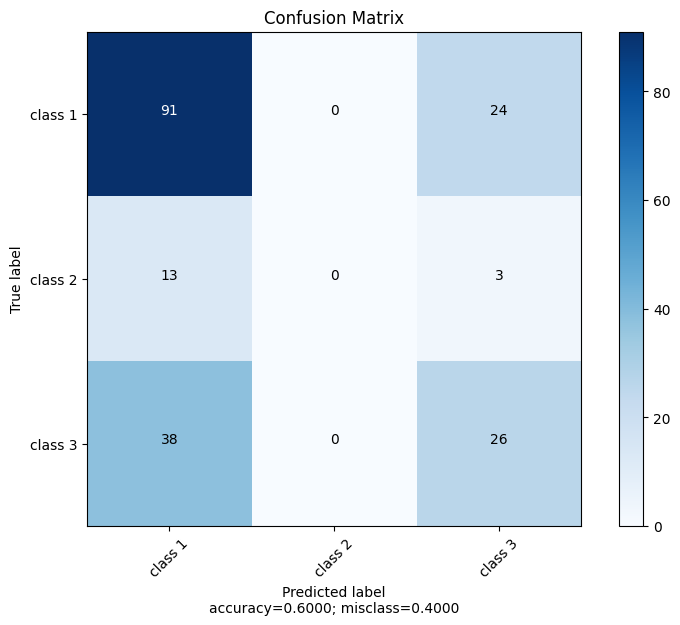

LR 0.1 25
n_nodes = 25 lambd = 0.1
Model: "model_67"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_163 (Dense)           (None, 25)                250       
                                                                 
 dropout_94 (Dropout)        (None, 25)                0         
                                                                 
 dense_164 (Dense)           (None, 3)                 78        
                                                                 
Total params: 328 (1.28 KB)
Trainable params: 328 (1.28 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


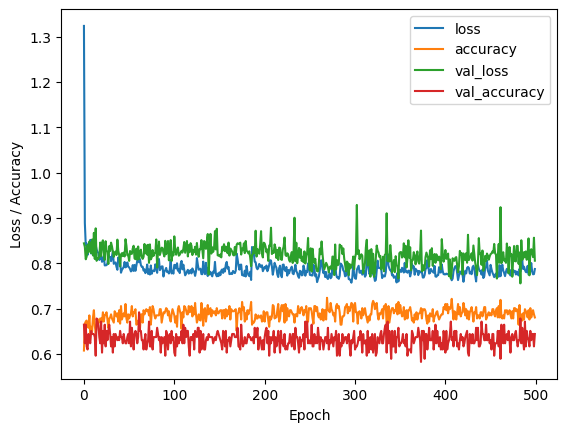


 ########## Result for Training data ########## 

log_loss:    0.7461
accuracy:    0.7123 

              precision    recall  f1-score   support

     class 1       0.72      0.89      0.80       260
     class 2       1.00      0.15      0.27        39
     class 3       0.67      0.53      0.59       139

    accuracy                           0.71       438
   macro avg       0.80      0.53      0.55       438
weighted avg       0.73      0.71      0.69       438



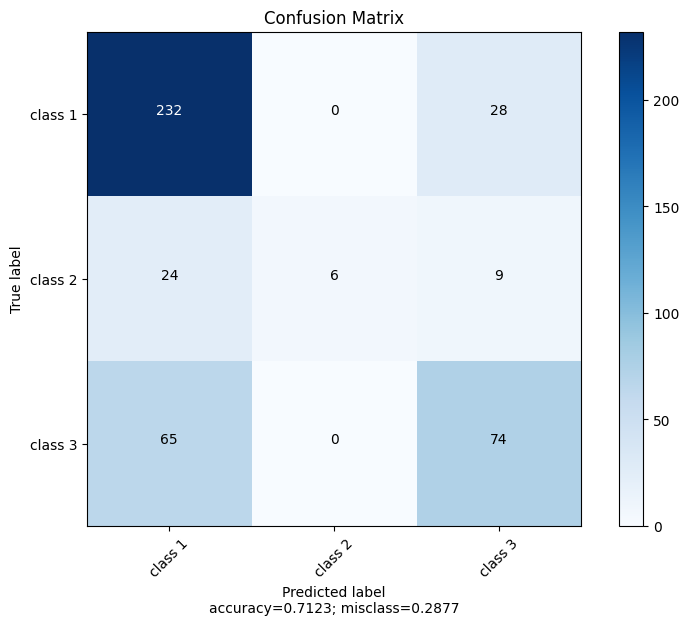


 ########## Result for Validation data ########## 

log_loss:    0.7870
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.67      0.82      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.57      0.46      0.51        52

    accuracy                           0.64       146
   macro avg       0.41      0.43      0.42       146
weighted avg       0.60      0.64      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


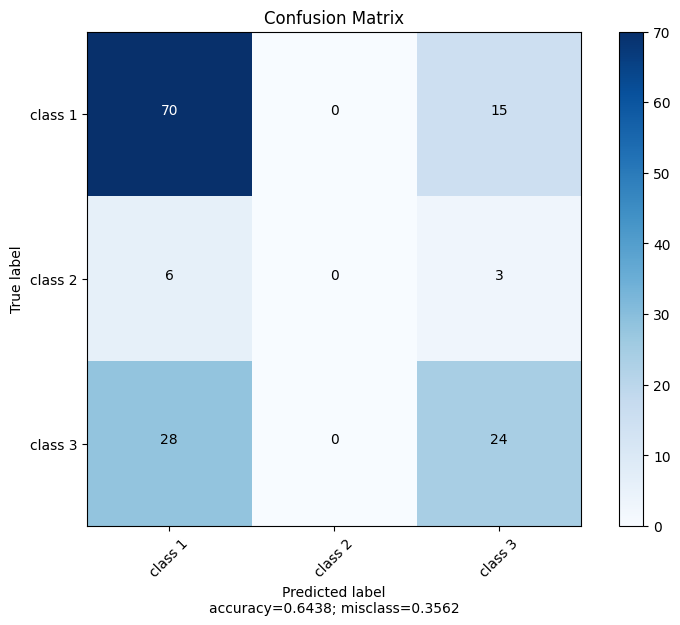


 ########## Result for Test data ########## 

log_loss:    0.8396
accuracy:    0.6308 

              precision    recall  f1-score   support

     class 1       0.65      0.86      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.56      0.38      0.45        64

    accuracy                           0.63       195
   macro avg       0.40      0.41      0.40       195
weighted avg       0.57      0.63      0.58       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


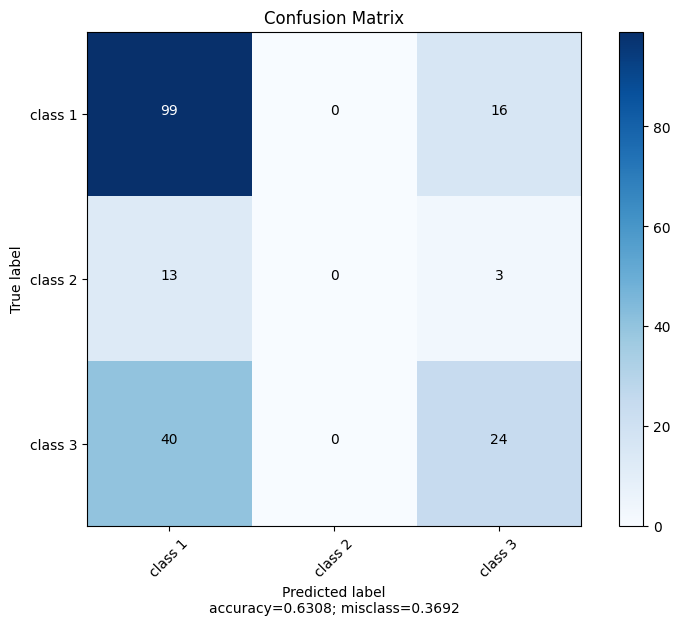

LR 0.1 10
n_nodes = 10 lambd = 0.1
Model: "model_68"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_165 (Dense)           (None, 10)                100       
                                                                 
 dropout_95 (Dropout)        (None, 10)                0         
                                                                 
 dense_166 (Dense)           (None, 3)                 33        
                                                                 
Total params: 133 (532.00 Byte)
Trainable params: 133 (532.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


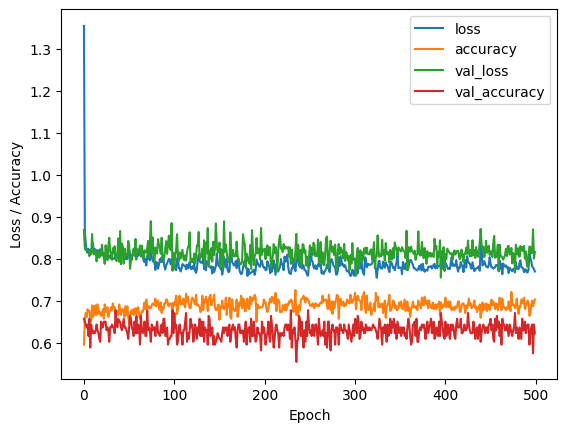


 ########## Result for Training data ########## 

log_loss:    0.7341
accuracy:    0.6918 

              precision    recall  f1-score   support

     class 1       0.69      0.93      0.79       260
     class 2       1.00      0.15      0.27        39
     class 3       0.69      0.39      0.50       139

    accuracy                           0.69       438
   macro avg       0.79      0.49      0.52       438
weighted avg       0.72      0.69      0.65       438



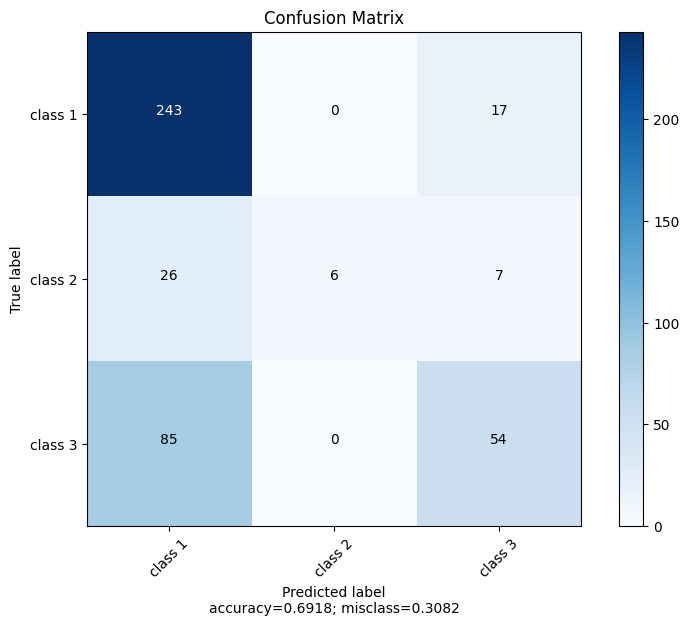


 ########## Result for Validation data ########## 

log_loss:    0.7963
accuracy:    0.6233 

              precision    recall  f1-score   support

     class 1       0.64      0.88      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.57      0.31      0.40        52

    accuracy                           0.62       146
   macro avg       0.40      0.40      0.38       146
weighted avg       0.57      0.62      0.57       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


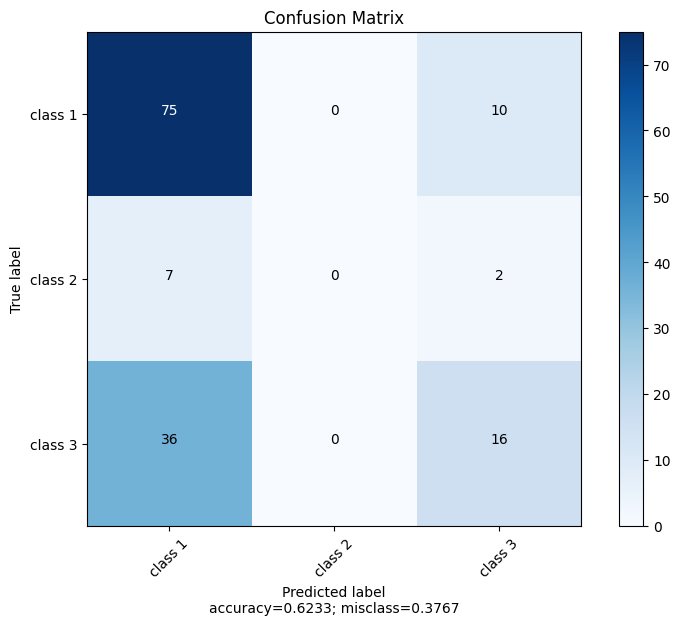


 ########## Result for Test data ########## 

log_loss:    0.8319
accuracy:    0.6103 

              precision    recall  f1-score   support

     class 1       0.63      0.89      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.53      0.27      0.35        64

    accuracy                           0.61       195
   macro avg       0.39      0.38      0.36       195
weighted avg       0.54      0.61      0.55       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


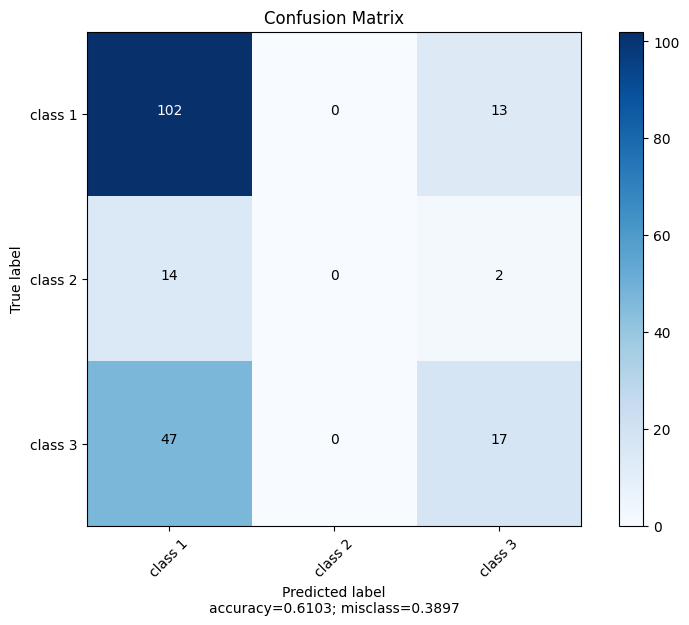

LR 0.1 2
n_nodes = 2 lambd = 0.1
Model: "model_69"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_167 (Dense)           (None, 2)                 20        
                                                                 
 dropout_96 (Dropout)        (None, 2)                 0         
                                                                 
 dense_168 (Dense)           (None, 3)                 9         
                                                                 
Total params: 29 (116.00 Byte)
Trainable params: 29 (116.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


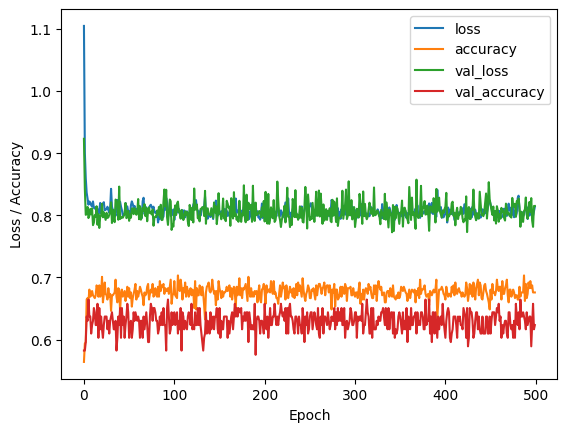


 ########## Result for Training data ########## 

log_loss:    0.7761
accuracy:    0.6712 

              precision    recall  f1-score   support

     class 1       0.67      0.92      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.40      0.50       139

    accuracy                           0.67       438
   macro avg       0.45      0.44      0.42       438
weighted avg       0.61      0.67      0.62       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


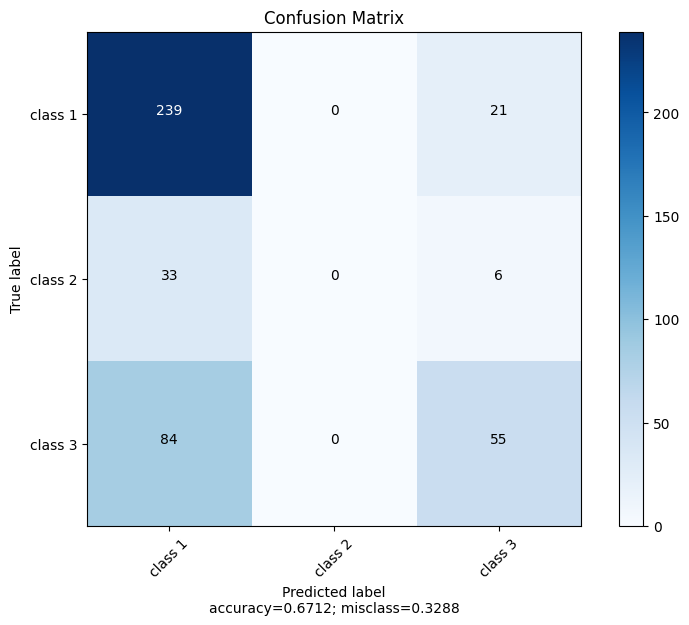


 ########## Result for Validation data ########## 

log_loss:    0.8009
accuracy:    0.6233 

              precision    recall  f1-score   support

     class 1       0.63      0.86      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.58      0.35      0.43        52

    accuracy                           0.62       146
   macro avg       0.41      0.40      0.39       146
weighted avg       0.58      0.62      0.58       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


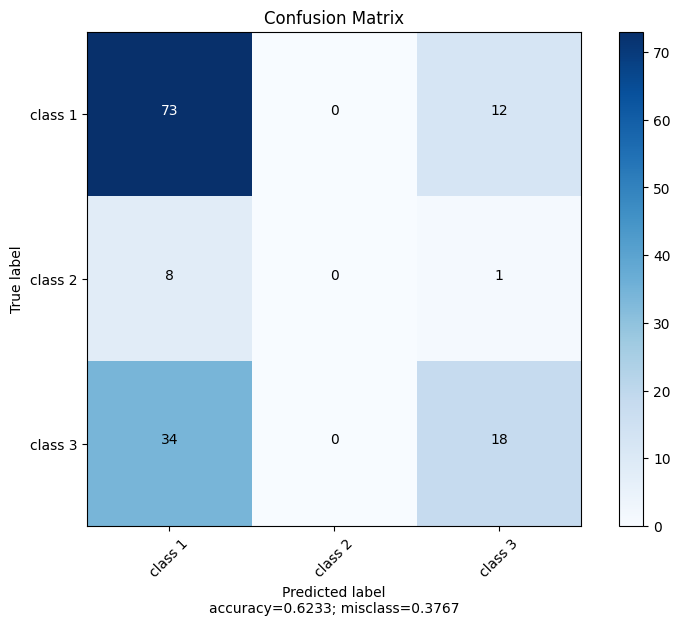


 ########## Result for Test data ########## 

log_loss:    0.8608
accuracy:    0.5897 

              precision    recall  f1-score   support

     class 1       0.61      0.86      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.47      0.25      0.33        64

    accuracy                           0.59       195
   macro avg       0.36      0.37      0.35       195
weighted avg       0.52      0.59      0.53       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


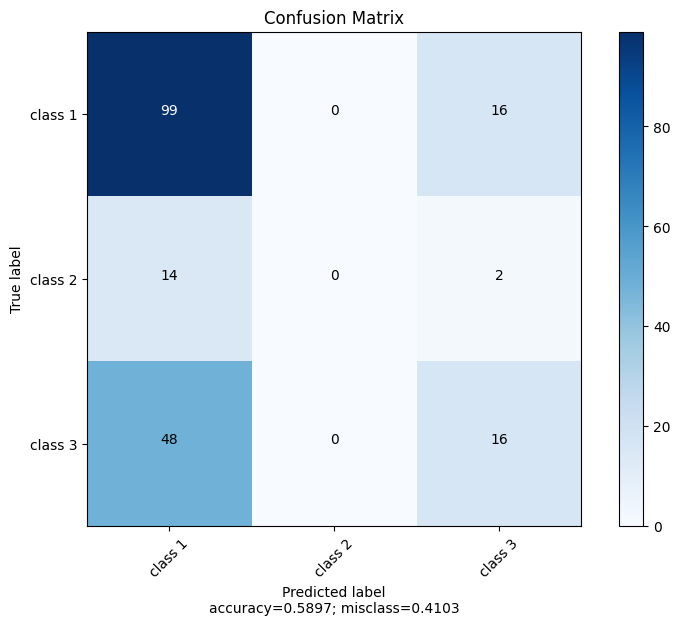

LR 0.1 20
n_nodes = 20 lambd = 0.1
Model: "model_70"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_169 (Dense)           (None, 20)                200       
                                                                 
 dropout_97 (Dropout)        (None, 20)                0         
                                                                 
 dense_170 (Dense)           (None, 3)                 63        
                                                                 
Total params: 263 (1.03 KB)
Trainable params: 263 (1.03 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


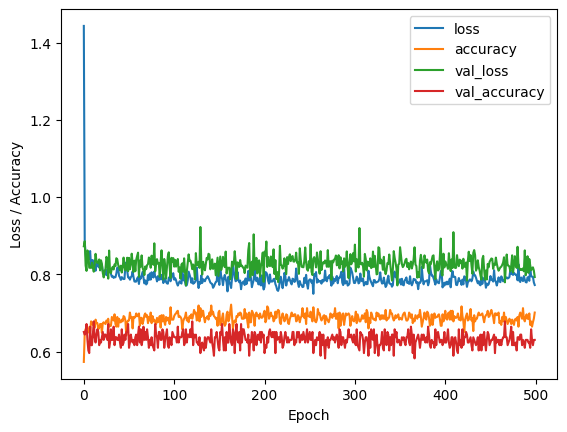


 ########## Result for Training data ########## 

log_loss:    0.7349
accuracy:    0.7192 

              precision    recall  f1-score   support

     class 1       0.72      0.90      0.80       260
     class 2       1.00      0.08      0.14        39
     class 3       0.70      0.56      0.62       139

    accuracy                           0.72       438
   macro avg       0.81      0.51      0.52       438
weighted avg       0.74      0.72      0.69       438



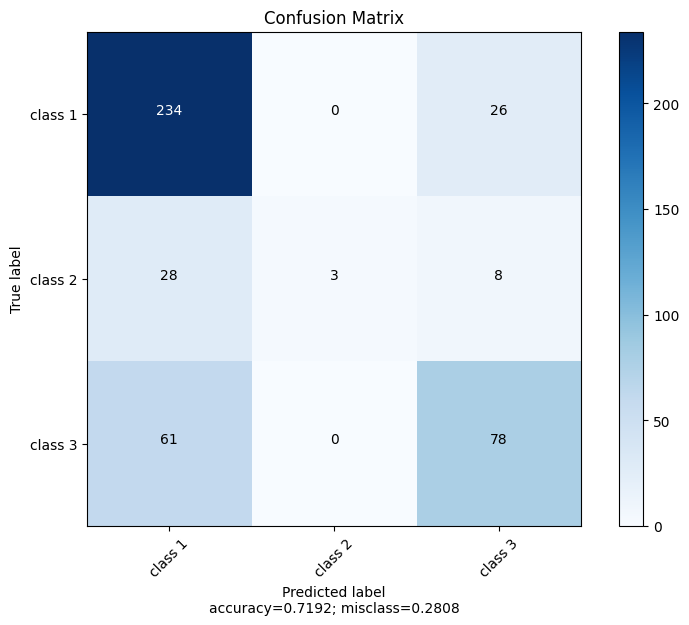


 ########## Result for Validation data ########## 

log_loss:    0.7702
accuracy:    0.6301 

              precision    recall  f1-score   support

     class 1       0.67      0.80      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.55      0.46      0.50        52

    accuracy                           0.63       146
   macro avg       0.40      0.42      0.41       146
weighted avg       0.58      0.63      0.60       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


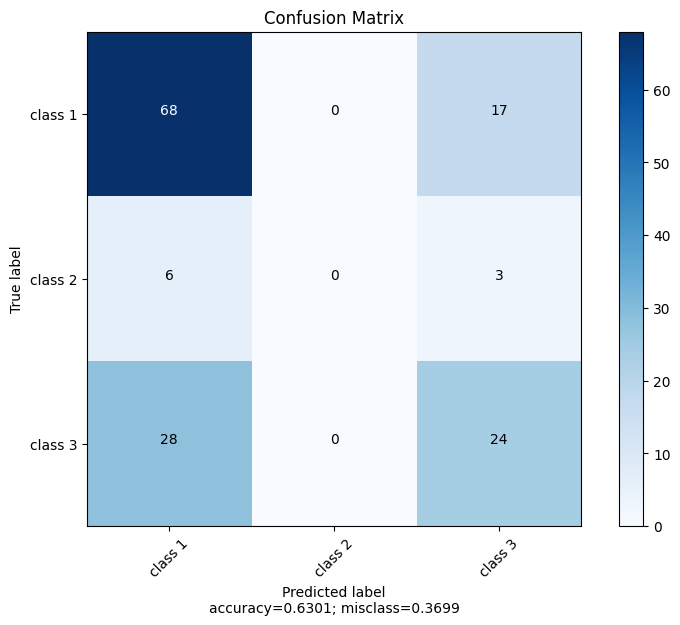


 ########## Result for Test data ########## 

log_loss:    0.8129
accuracy:    0.6103 

              precision    recall  f1-score   support

     class 1       0.64      0.83      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.53      0.36      0.43        64

    accuracy                           0.61       195
   macro avg       0.39      0.40      0.38       195
weighted avg       0.55      0.61      0.57       195



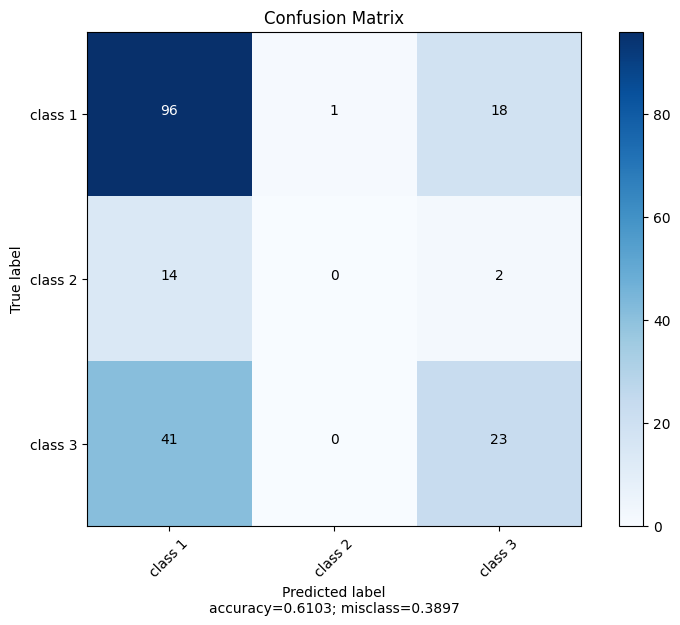

LR 0.1 4
n_nodes = 4 lambd = 0.1
Model: "model_71"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_171 (Dense)           (None, 4)                 40        
                                                                 
 dropout_98 (Dropout)        (None, 4)                 0         
                                                                 
 dense_172 (Dense)           (None, 3)                 15        
                                                                 
Total params: 55 (220.00 Byte)
Trainable params: 55 (220.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


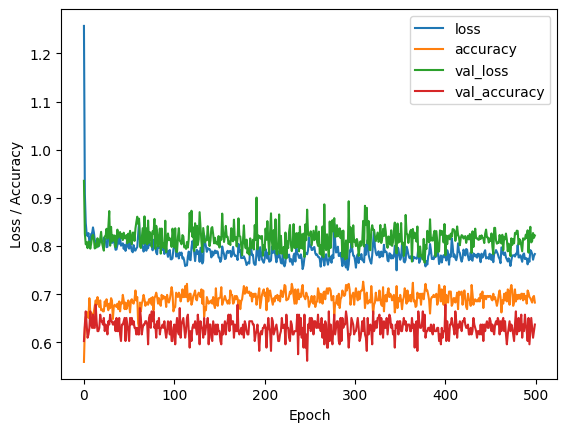


 ########## Result for Training data ########## 

log_loss:    0.7617
accuracy:    0.6826 

              precision    recall  f1-score   support

     class 1       0.68      0.93      0.78       260
     class 2       1.00      0.15      0.27        39
     class 3       0.69      0.37      0.48       139

    accuracy                           0.68       438
   macro avg       0.79      0.48      0.51       438
weighted avg       0.71      0.68      0.64       438



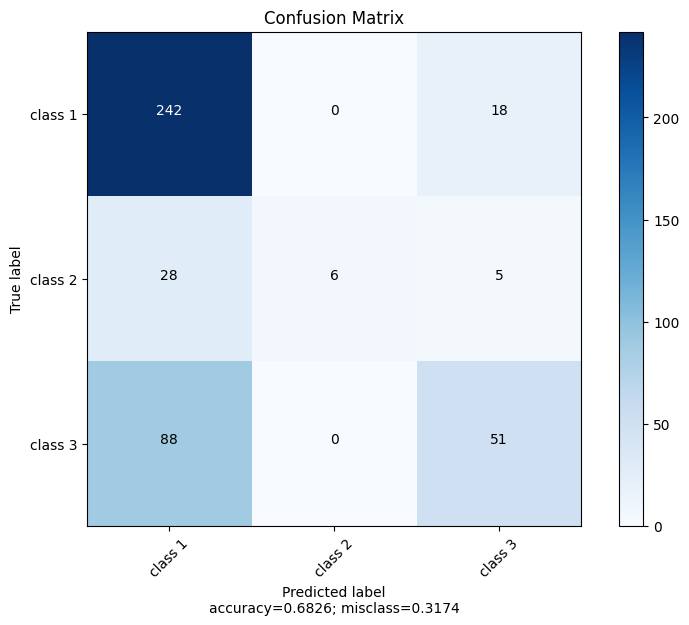


 ########## Result for Validation data ########## 

log_loss:    0.8036
accuracy:    0.6370 

              precision    recall  f1-score   support

     class 1       0.64      0.89      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.61      0.33      0.42        52

    accuracy                           0.64       146
   macro avg       0.42      0.41      0.39       146
weighted avg       0.59      0.64      0.59       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


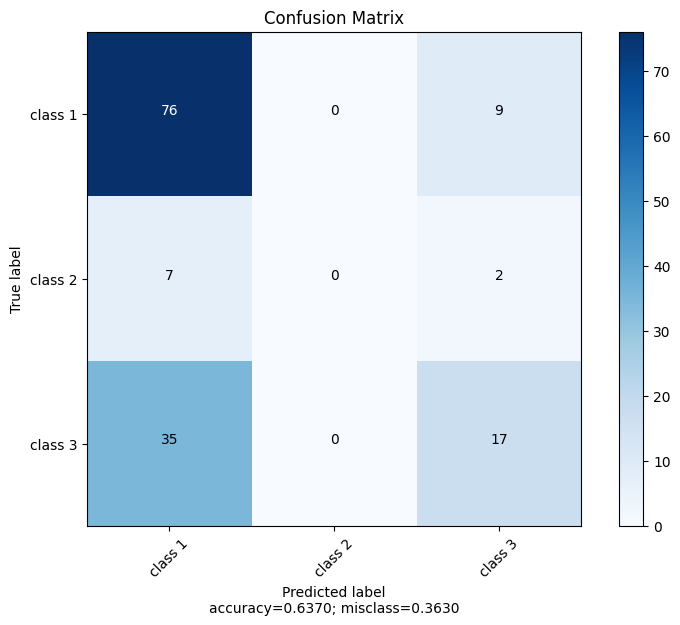


 ########## Result for Test data ########## 

log_loss:    0.8502
accuracy:    0.6256 

              precision    recall  f1-score   support

     class 1       0.63      0.92      0.75       115
     class 2       0.00      0.00      0.00        16
     class 3       0.57      0.25      0.35        64

    accuracy                           0.63       195
   macro avg       0.40      0.39      0.37       195
weighted avg       0.56      0.63      0.56       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


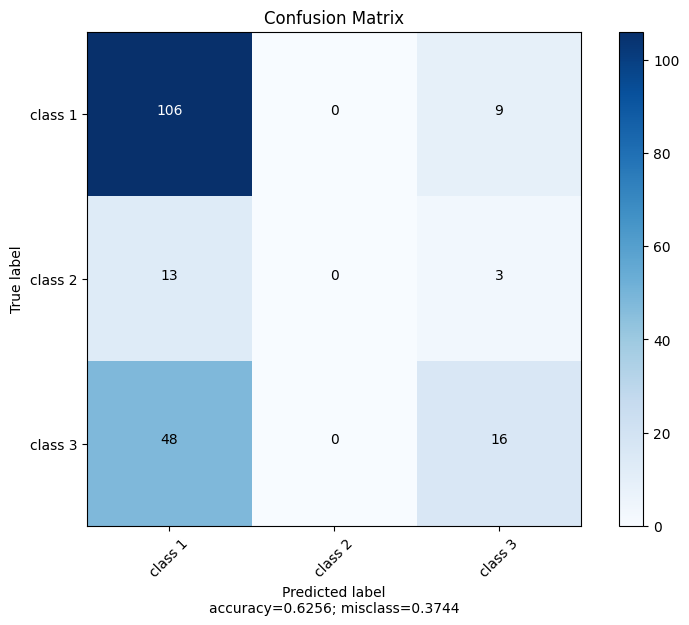

LR 0.1 42
n_nodes = 42 lambd = 0.1
Model: "model_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_173 (Dense)           (None, 42)                420       
                                                                 
 dropout_99 (Dropout)        (None, 42)                0         
                                                                 
 dense_174 (Dense)           (None, 3)                 129       
                                                                 
Total params: 549 (2.14 KB)
Trainable params: 549 (2.14 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


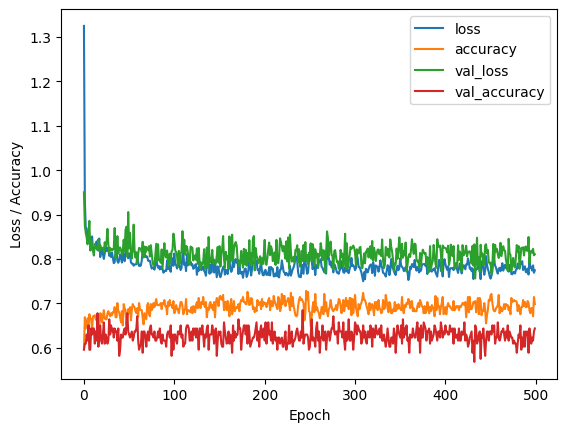


 ########## Result for Training data ########## 

log_loss:    0.7365
accuracy:    0.6918 

              precision    recall  f1-score   support

     class 1       0.68      0.93      0.79       260
     class 2       1.00      0.18      0.30        39
     class 3       0.70      0.39      0.50       139

    accuracy                           0.69       438
   macro avg       0.79      0.50      0.53       438
weighted avg       0.72      0.69      0.65       438



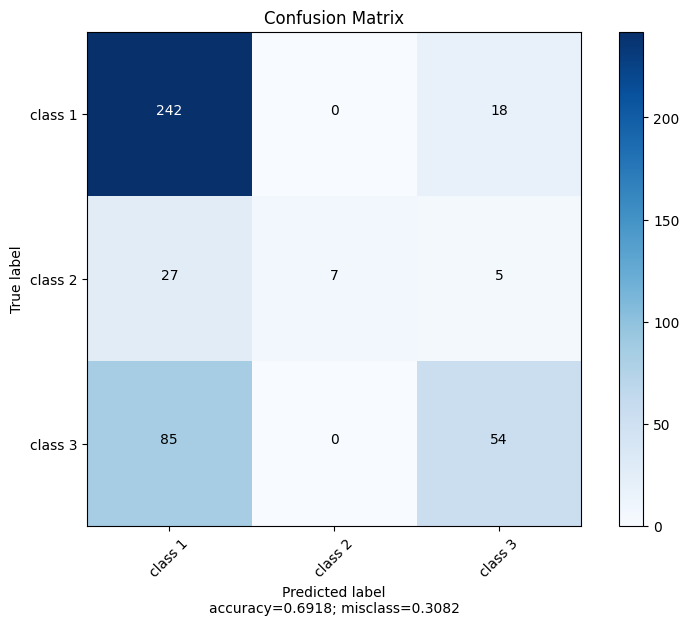


 ########## Result for Validation data ########## 

log_loss:    0.7921
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.65      0.88      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.61      0.37      0.46        52

    accuracy                           0.64       146
   macro avg       0.42      0.42      0.40       146
weighted avg       0.60      0.64      0.60       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


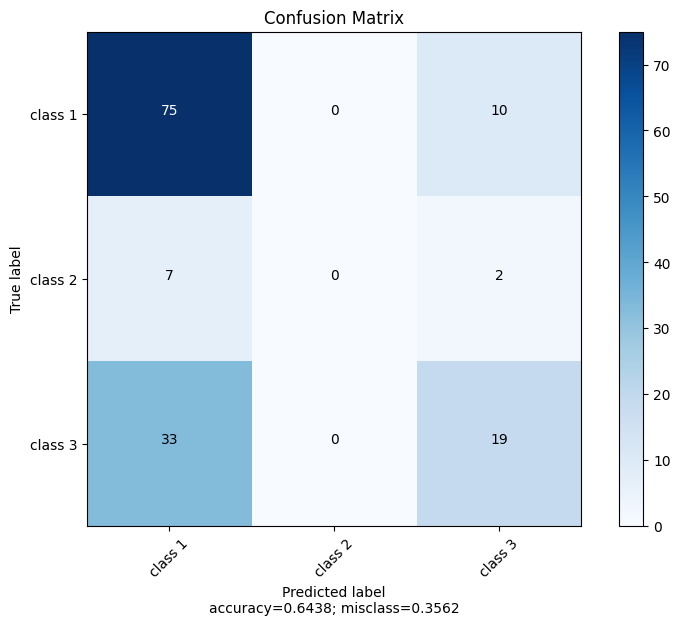


 ########## Result for Test data ########## 

log_loss:    0.8441
accuracy:    0.6103 

              precision    recall  f1-score   support

     class 1       0.62      0.90      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.53      0.25      0.34        64

    accuracy                           0.61       195
   macro avg       0.39      0.38      0.36       195
weighted avg       0.54      0.61      0.55       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


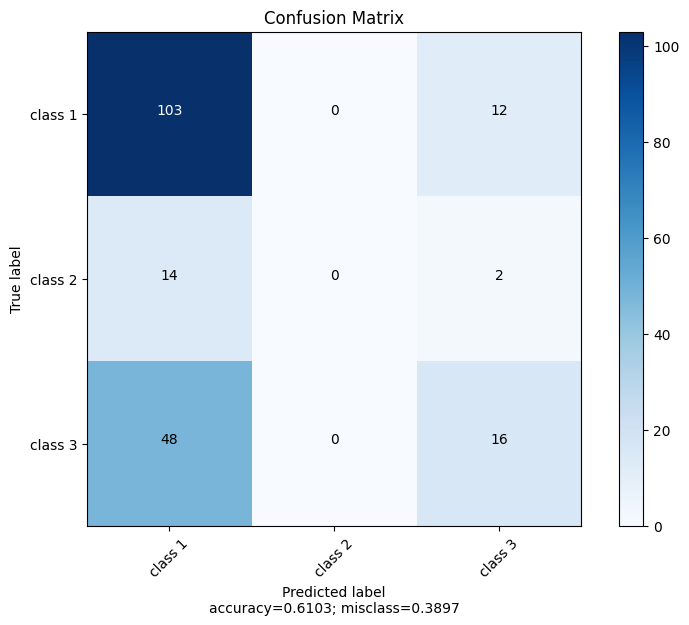

LR 0.1 49
n_nodes = 49 lambd = 0.1
Model: "model_73"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_175 (Dense)           (None, 49)                490       
                                                                 
 dropout_100 (Dropout)       (None, 49)                0         
                                                                 
 dense_176 (Dense)           (None, 3)                 150       
                                                                 
Total params: 640 (2.50 KB)
Trainable params: 640 (2.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


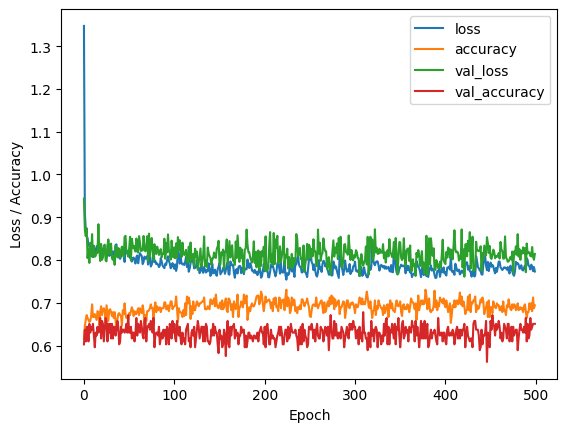


 ########## Result for Training data ########## 

log_loss:    0.7335
accuracy:    0.7100 

              precision    recall  f1-score   support

     class 1       0.71      0.90      0.80       260
     class 2       0.88      0.18      0.30        39
     class 3       0.69      0.50      0.58       139

    accuracy                           0.71       438
   macro avg       0.76      0.53      0.56       438
weighted avg       0.72      0.71      0.68       438



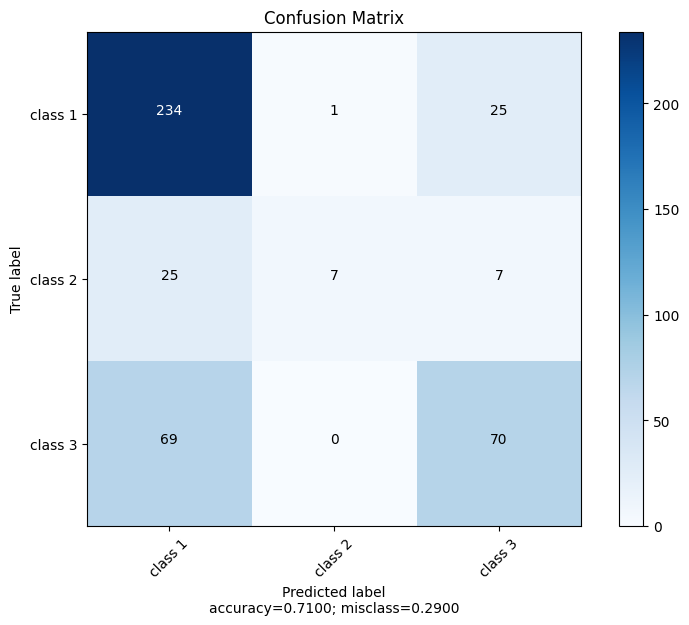


 ########## Result for Validation data ########## 

log_loss:    0.7884
accuracy:    0.6507 

              precision    recall  f1-score   support

     class 1       0.67      0.85      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.61      0.44      0.51        52

    accuracy                           0.65       146
   macro avg       0.42      0.43      0.42       146
weighted avg       0.60      0.65      0.62       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


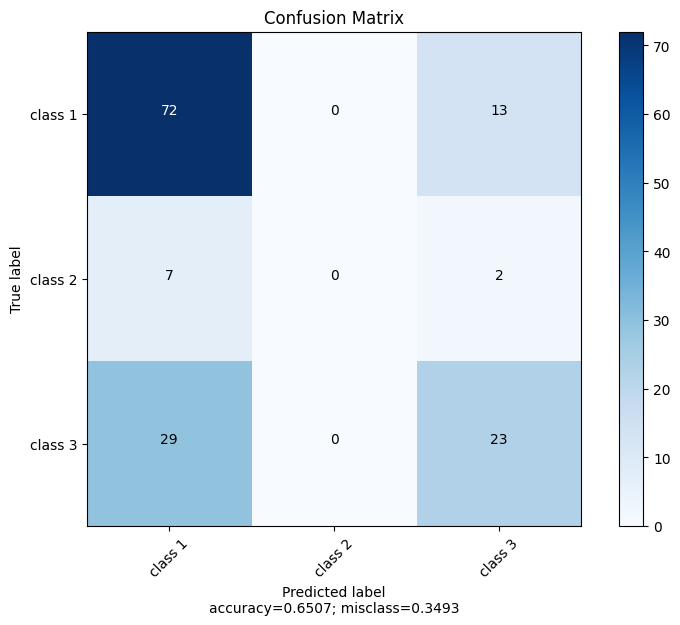


 ########## Result for Test data ########## 

log_loss:    0.8450
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.64      0.84      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.53      0.36      0.43        64

    accuracy                           0.62       195
   macro avg       0.39      0.40      0.39       195
weighted avg       0.55      0.62      0.57       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


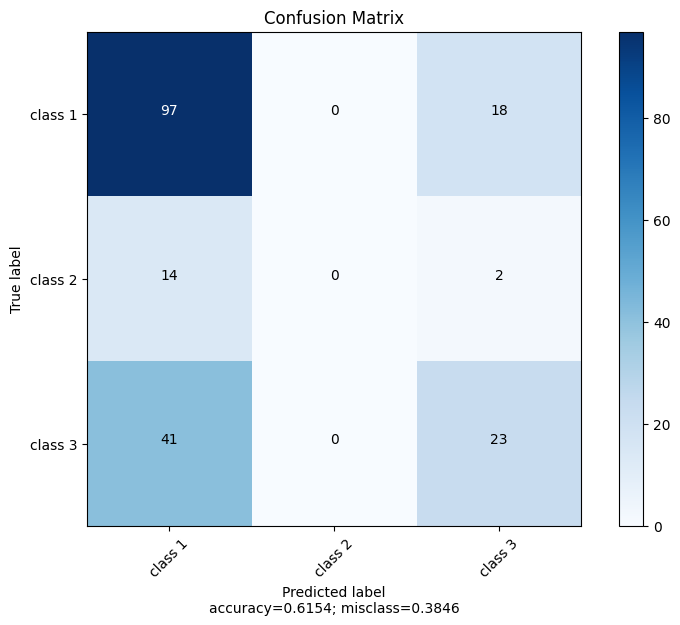

LR 0.1 48
n_nodes = 48 lambd = 0.1
Model: "model_74"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_177 (Dense)           (None, 48)                480       
                                                                 
 dropout_101 (Dropout)       (None, 48)                0         
                                                                 
 dense_178 (Dense)           (None, 3)                 147       
                                                                 
Total params: 627 (2.45 KB)
Trainable params: 627 (2.45 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


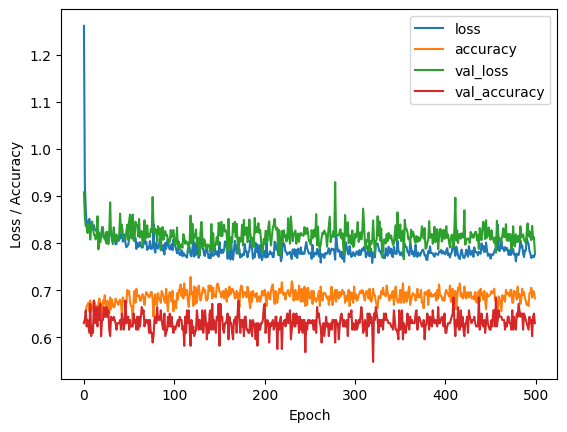


 ########## Result for Training data ########## 

log_loss:    0.7319
accuracy:    0.7237 

              precision    recall  f1-score   support

     class 1       0.73      0.90      0.81       260
     class 2       1.00      0.18      0.30        39
     class 3       0.69      0.55      0.61       139

    accuracy                           0.72       438
   macro avg       0.81      0.54      0.57       438
weighted avg       0.74      0.72      0.70       438



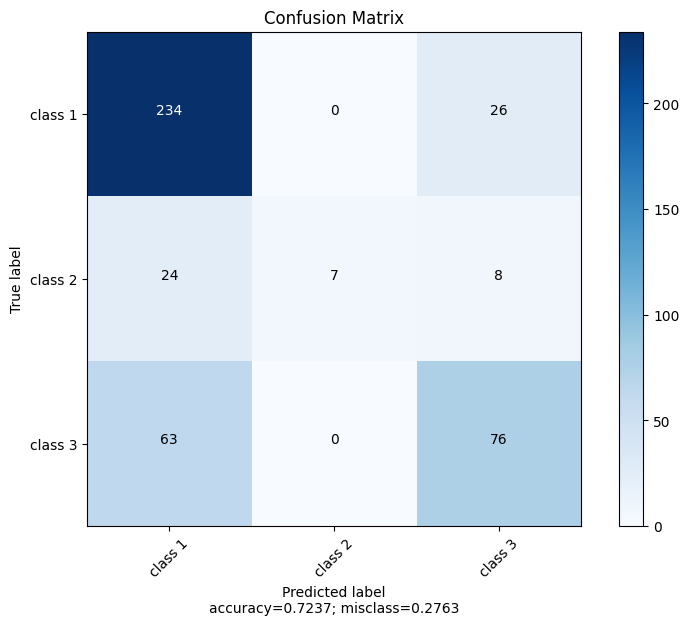


 ########## Result for Validation data ########## 

log_loss:    0.7612
accuracy:    0.6301 

              precision    recall  f1-score   support

     class 1       0.67      0.80      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.55      0.46      0.50        52

    accuracy                           0.63       146
   macro avg       0.40      0.42      0.41       146
weighted avg       0.58      0.63      0.60       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


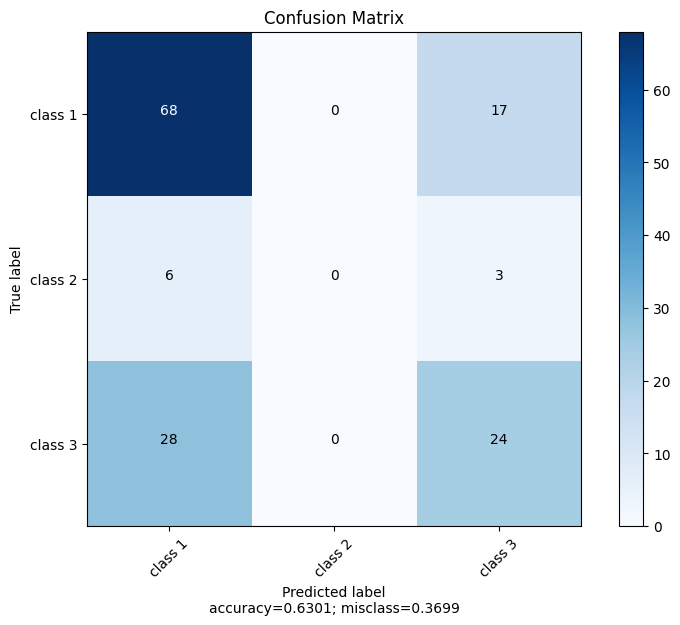


 ########## Result for Test data ########## 

log_loss:    0.8269
accuracy:    0.6051 

              precision    recall  f1-score   support

     class 1       0.64      0.82      0.71       115
     class 2       0.00      0.00      0.00        16
     class 3       0.52      0.38      0.44        64

    accuracy                           0.61       195
   macro avg       0.39      0.40      0.38       195
weighted avg       0.55      0.61      0.56       195



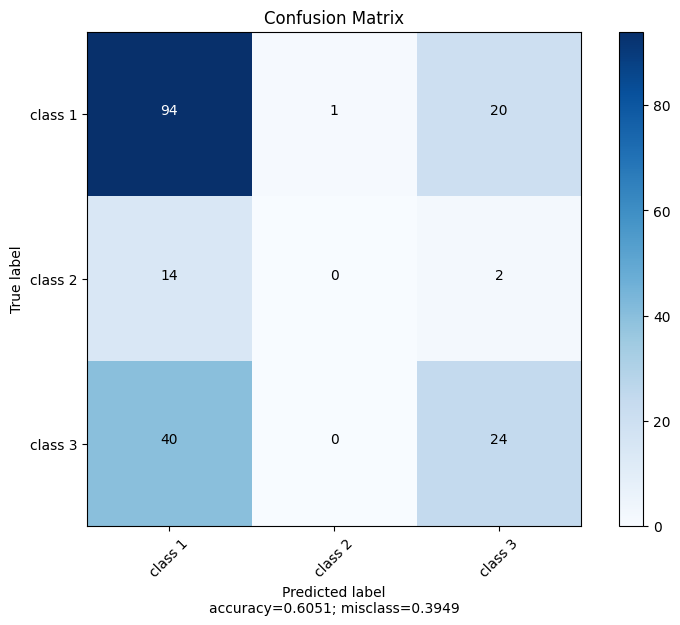

LR 0.1 21
n_nodes = 21 lambd = 0.1
Model: "model_75"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_179 (Dense)           (None, 21)                210       
                                                                 
 dropout_102 (Dropout)       (None, 21)                0         
                                                                 
 dense_180 (Dense)           (None, 3)                 66        
                                                                 
Total params: 276 (1.08 KB)
Trainable params: 276 (1.08 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


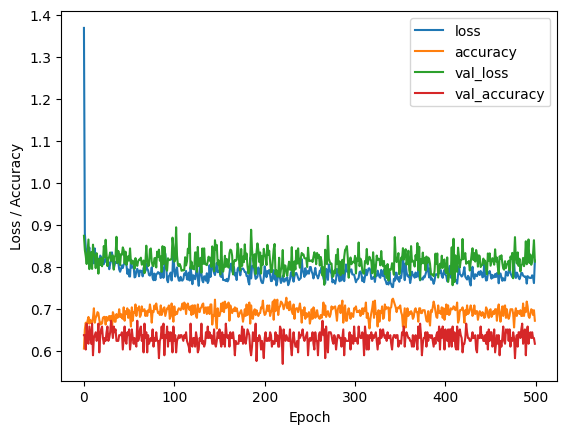


 ########## Result for Training data ########## 

log_loss:    0.7467
accuracy:    0.7055 

              precision    recall  f1-score   support

     class 1       0.71      0.92      0.80       260
     class 2       0.86      0.15      0.26        39
     class 3       0.69      0.47      0.56       139

    accuracy                           0.71       438
   macro avg       0.75      0.51      0.54       438
weighted avg       0.71      0.71      0.67       438



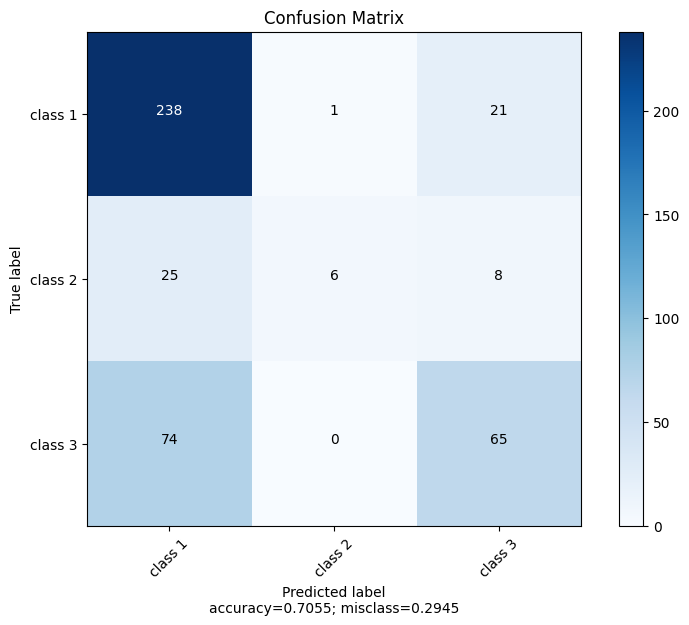


 ########## Result for Validation data ########## 

log_loss:    0.7873
accuracy:    0.6164 

              precision    recall  f1-score   support

     class 1       0.65      0.82      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.53      0.38      0.44        52

    accuracy                           0.62       146
   macro avg       0.39      0.40      0.39       146
weighted avg       0.56      0.62      0.58       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


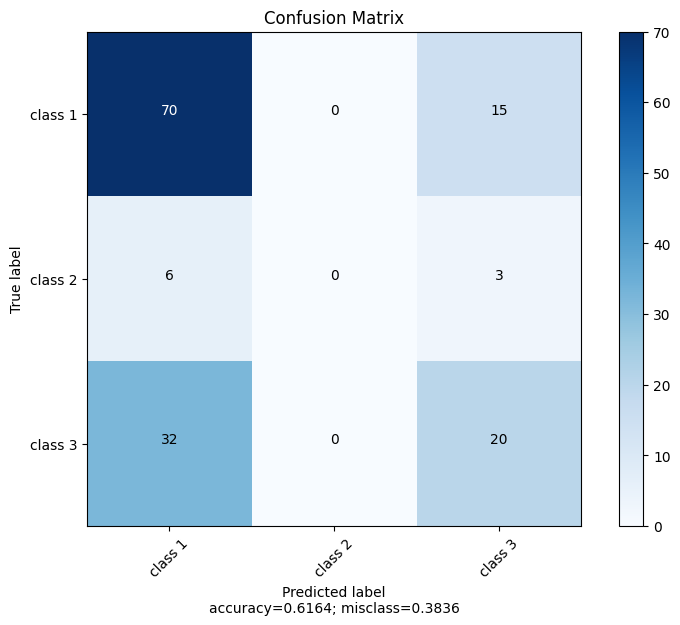


 ########## Result for Test data ########## 

log_loss:    0.8548
accuracy:    0.6051 

              precision    recall  f1-score   support

     class 1       0.64      0.83      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.50      0.34      0.41        64

    accuracy                           0.61       195
   macro avg       0.38      0.39      0.38       195
weighted avg       0.54      0.61      0.56       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


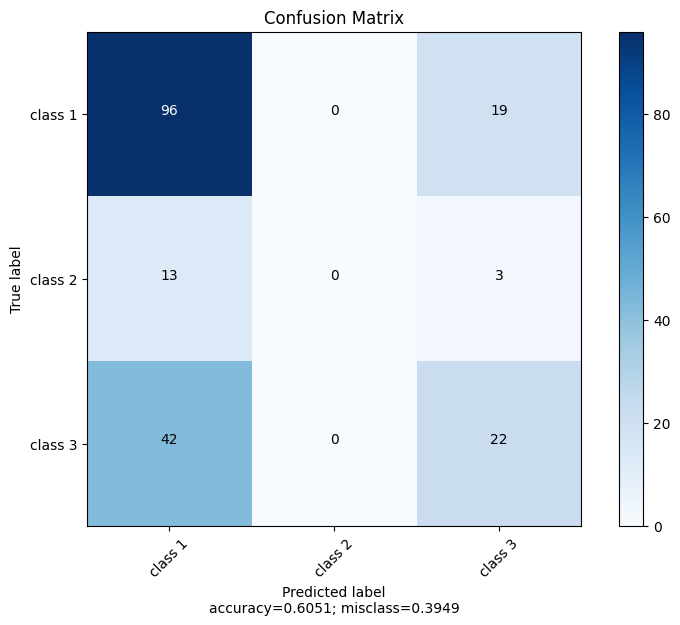

LR 0.1 19
n_nodes = 19 lambd = 0.1
Model: "model_76"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_181 (Dense)           (None, 19)                190       
                                                                 
 dropout_103 (Dropout)       (None, 19)                0         
                                                                 
 dense_182 (Dense)           (None, 3)                 60        
                                                                 
Total params: 250 (1000.00 Byte)
Trainable params: 250 (1000.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


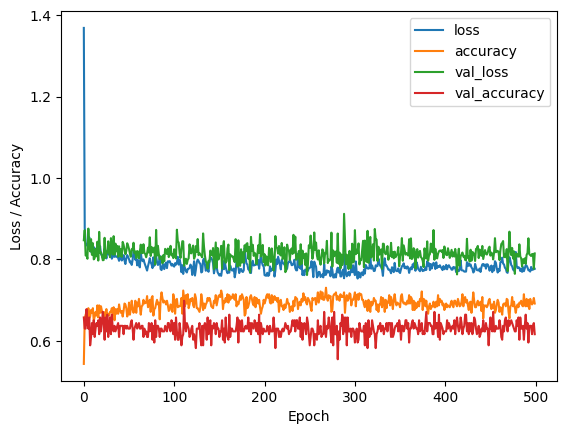


 ########## Result for Training data ########## 

log_loss:    0.7450
accuracy:    0.6963 

              precision    recall  f1-score   support

     class 1       0.70      0.90      0.79       260
     class 2       1.00      0.15      0.27        39
     class 3       0.66      0.47      0.55       139

    accuracy                           0.70       438
   macro avg       0.79      0.51      0.53       438
weighted avg       0.72      0.70      0.67       438



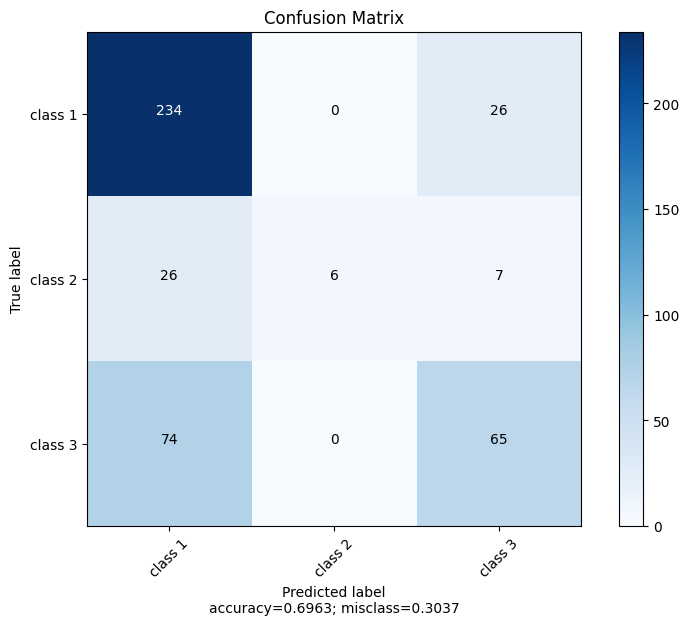


 ########## Result for Validation data ########## 

log_loss:    0.7946
accuracy:    0.6164 

              precision    recall  f1-score   support

     class 1       0.64      0.85      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.53      0.35      0.42        52

    accuracy                           0.62       146
   macro avg       0.39      0.40      0.38       146
weighted avg       0.56      0.62      0.57       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


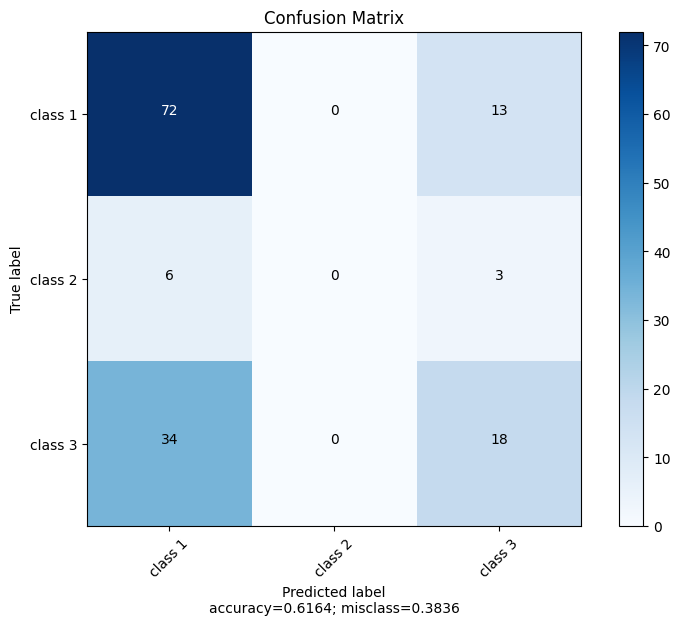


 ########## Result for Test data ########## 

log_loss:    0.8433
accuracy:    0.6103 

              precision    recall  f1-score   support

     class 1       0.63      0.86      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.53      0.31      0.39        64

    accuracy                           0.61       195
   macro avg       0.39      0.39      0.37       195
weighted avg       0.54      0.61      0.56       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


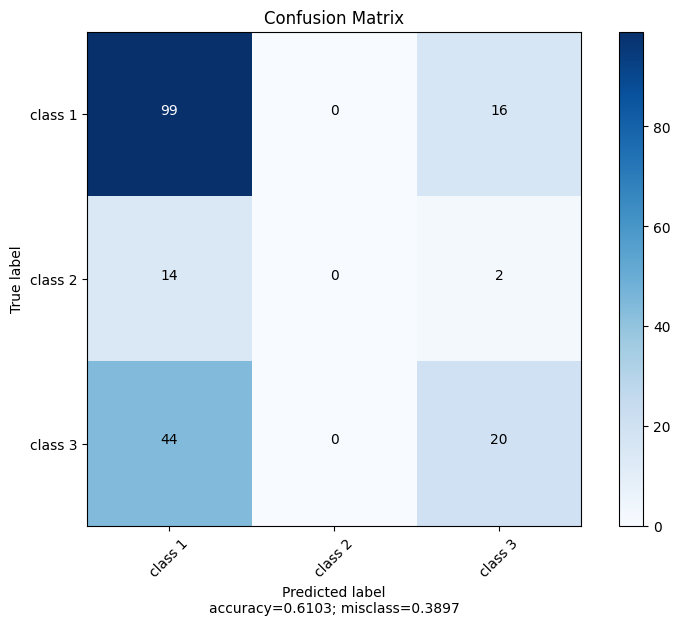

LR 0.1 33
n_nodes = 33 lambd = 0.1
Model: "model_77"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_183 (Dense)           (None, 33)                330       
                                                                 
 dropout_104 (Dropout)       (None, 33)                0         
                                                                 
 dense_184 (Dense)           (None, 3)                 102       
                                                                 
Total params: 432 (1.69 KB)
Trainable params: 432 (1.69 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


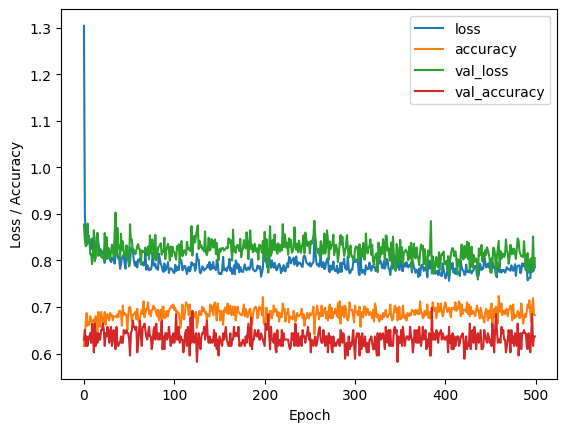


 ########## Result for Training data ########## 

log_loss:    0.7250
accuracy:    0.6986 

              precision    recall  f1-score   support

     class 1       0.69      0.93      0.79       260
     class 2       1.00      0.18      0.30        39
     class 3       0.73      0.40      0.52       139

    accuracy                           0.70       438
   macro avg       0.80      0.51      0.54       438
weighted avg       0.73      0.70      0.66       438



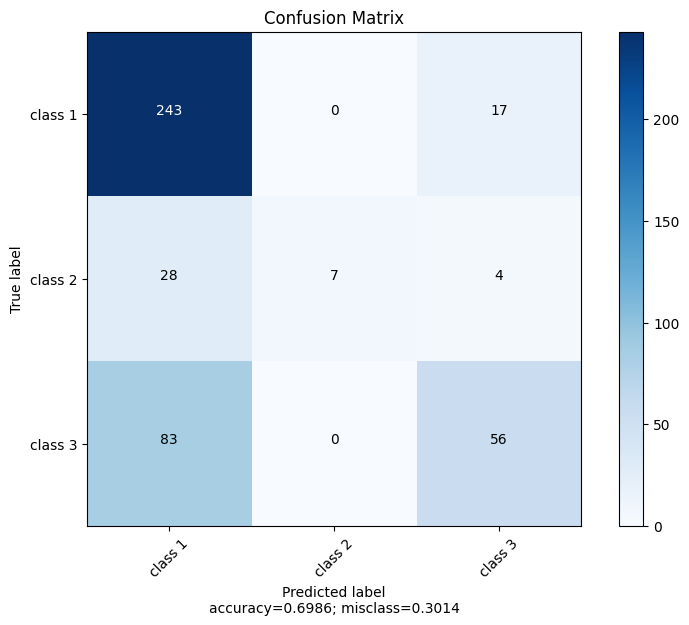


 ########## Result for Validation data ########## 

log_loss:    0.7801
accuracy:    0.6370 

              precision    recall  f1-score   support

     class 1       0.65      0.87      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.58      0.37      0.45        52

    accuracy                           0.64       146
   macro avg       0.41      0.41      0.40       146
weighted avg       0.59      0.64      0.59       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


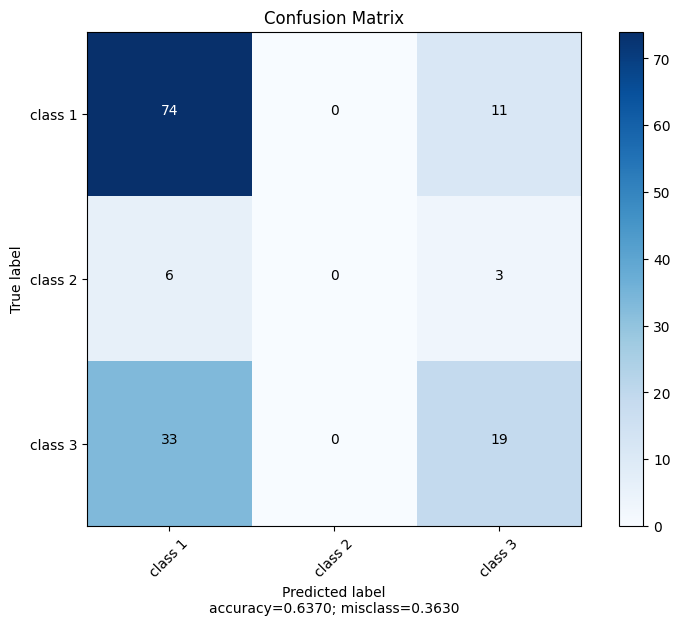


 ########## Result for Test data ########## 

log_loss:    0.8289
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.63      0.90      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.55      0.27      0.36        64

    accuracy                           0.62       195
   macro avg       0.39      0.39      0.37       195
weighted avg       0.55      0.62      0.55       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


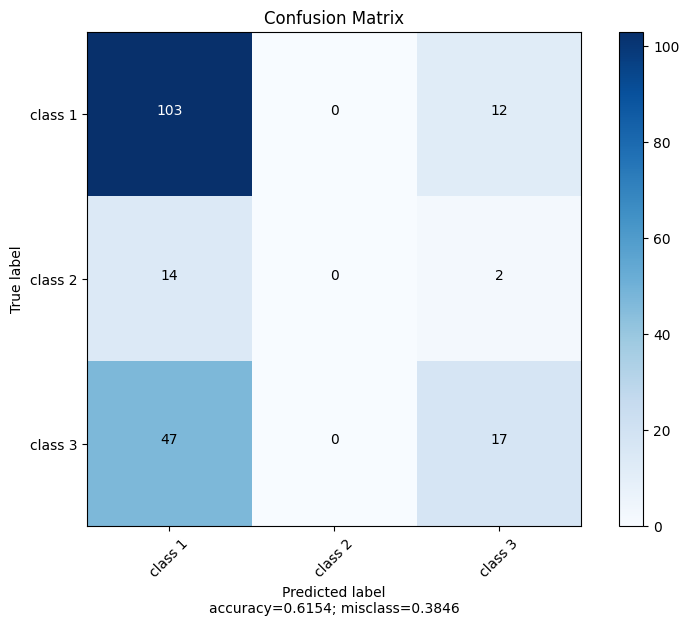

LR 0.1 31
n_nodes = 31 lambd = 0.1
Model: "model_78"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_185 (Dense)           (None, 31)                310       
                                                                 
 dropout_105 (Dropout)       (None, 31)                0         
                                                                 
 dense_186 (Dense)           (None, 3)                 96        
                                                                 
Total params: 406 (1.59 KB)
Trainable params: 406 (1.59 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


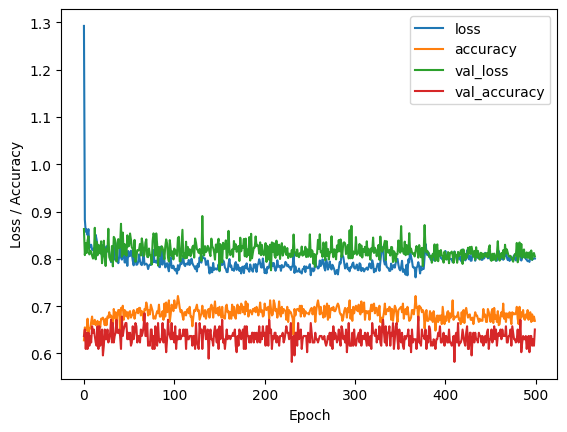


 ########## Result for Training data ########## 

log_loss:    0.7715
accuracy:    0.6872 

              precision    recall  f1-score   support

     class 1       0.69      0.92      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.68      0.44      0.53       139

    accuracy                           0.69       438
   macro avg       0.46      0.45      0.44       438
weighted avg       0.62      0.69      0.64       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


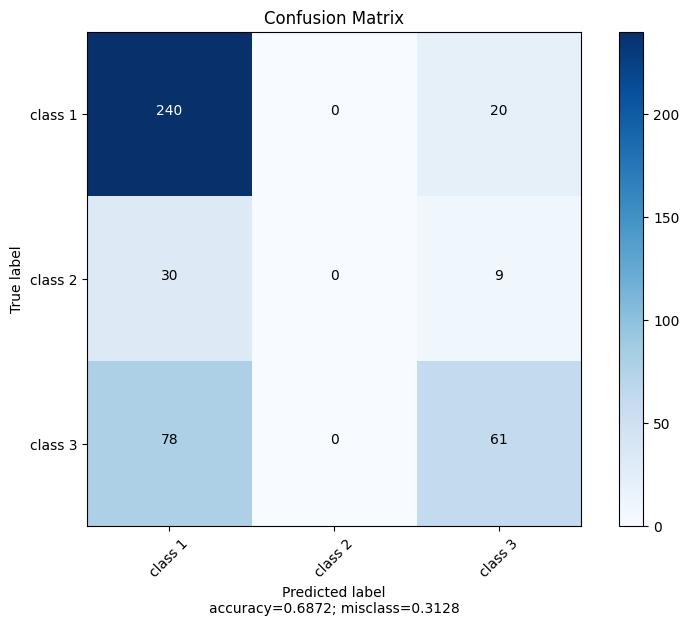


 ########## Result for Validation data ########## 

log_loss:    0.7930
accuracy:    0.6507 

              precision    recall  f1-score   support

     class 1       0.66      0.86      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.61      0.42      0.50        52

    accuracy                           0.65       146
   macro avg       0.42      0.43      0.42       146
weighted avg       0.60      0.65      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


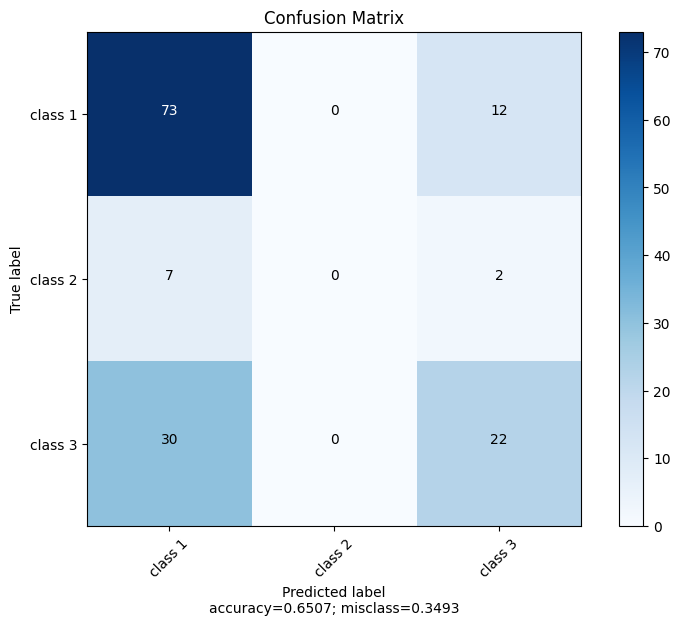


 ########## Result for Test data ########## 

log_loss:    0.8455
accuracy:    0.6205 

              precision    recall  f1-score   support

     class 1       0.64      0.87      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.55      0.33      0.41        64

    accuracy                           0.62       195
   macro avg       0.40      0.40      0.38       195
weighted avg       0.56      0.62      0.57       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


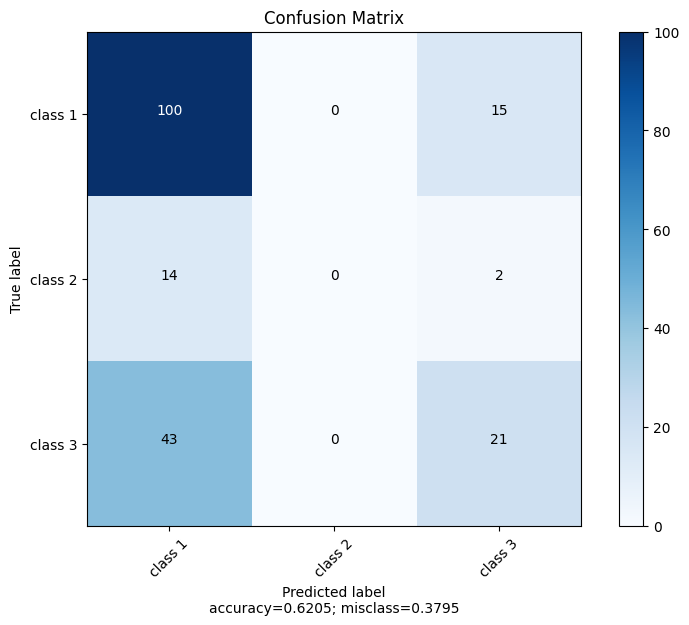

LR 0.1 32
n_nodes = 32 lambd = 0.1
Model: "model_79"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_187 (Dense)           (None, 32)                320       
                                                                 
 dropout_106 (Dropout)       (None, 32)                0         
                                                                 
 dense_188 (Dense)           (None, 3)                 99        
                                                                 
Total params: 419 (1.64 KB)
Trainable params: 419 (1.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


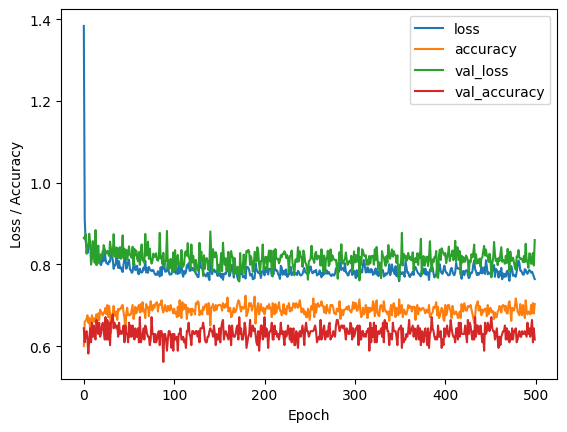


 ########## Result for Training data ########## 

log_loss:    0.7528
accuracy:    0.6872 

              precision    recall  f1-score   support

     class 1       0.67      0.95      0.79       260
     class 2       0.88      0.18      0.30        39
     class 3       0.77      0.33      0.46       139

    accuracy                           0.69       438
   macro avg       0.77      0.49      0.52       438
weighted avg       0.72      0.69      0.64       438



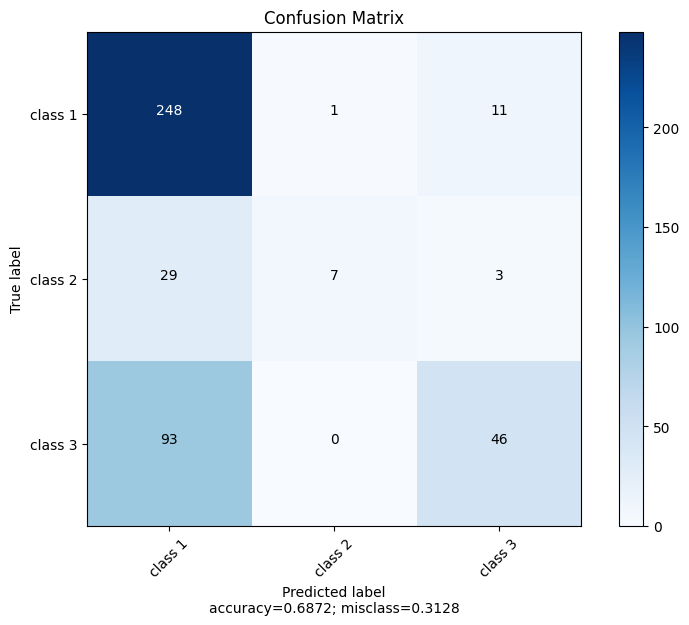


 ########## Result for Validation data ########## 

log_loss:    0.8423
accuracy:    0.6164 

              precision    recall  f1-score   support

     class 1       0.63      0.91      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.54      0.25      0.34        52

    accuracy                           0.62       146
   macro avg       0.39      0.39      0.36       146
weighted avg       0.56      0.62      0.55       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


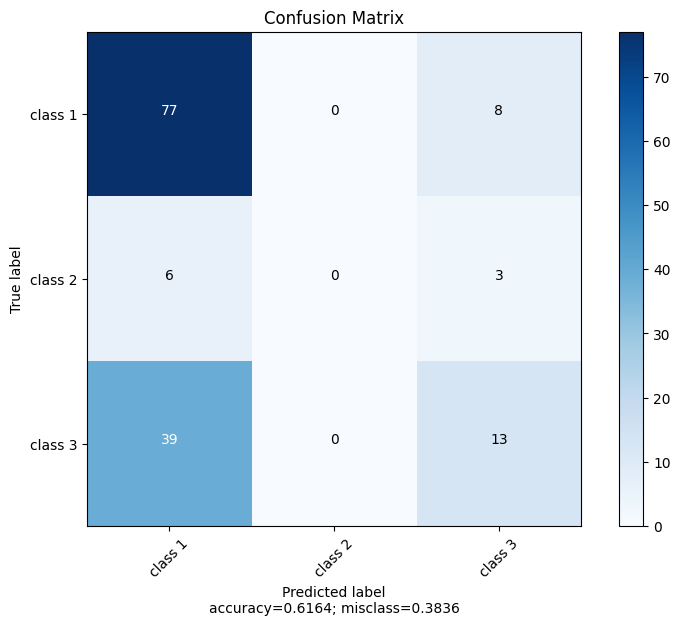


 ########## Result for Test data ########## 

log_loss:    0.8623
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.62      0.92      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.56      0.22      0.31        64

    accuracy                           0.62       195
   macro avg       0.39      0.38      0.35       195
weighted avg       0.55      0.62      0.54       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


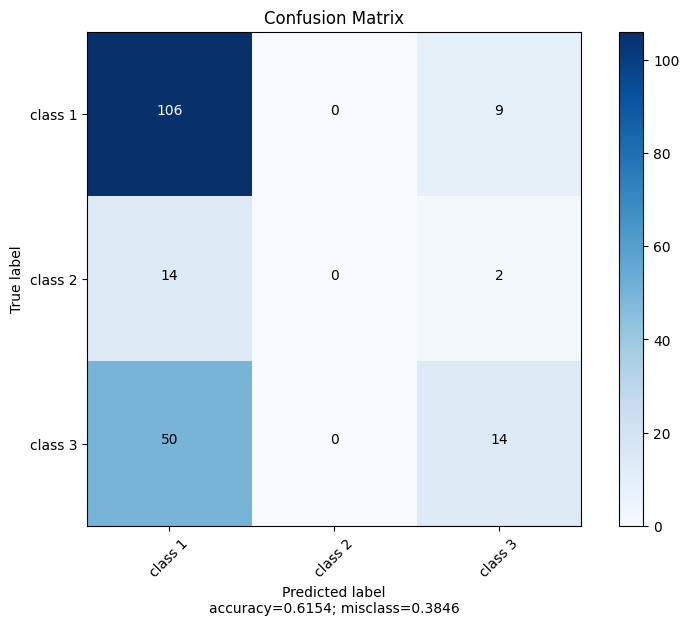

LR 0.1 34
n_nodes = 34 lambd = 0.1
Model: "model_80"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_189 (Dense)           (None, 34)                340       
                                                                 
 dropout_107 (Dropout)       (None, 34)                0         
                                                                 
 dense_190 (Dense)           (None, 3)                 105       
                                                                 
Total params: 445 (1.74 KB)
Trainable params: 445 (1.74 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


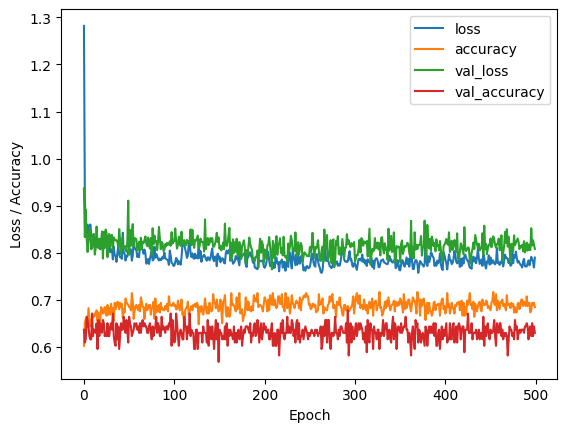


 ########## Result for Training data ########## 

log_loss:    0.7442
accuracy:    0.7215 

              precision    recall  f1-score   support

     class 1       0.73      0.88      0.80       260
     class 2       1.00      0.18      0.30        39
     class 3       0.67      0.57      0.61       139

    accuracy                           0.72       438
   macro avg       0.80      0.54      0.57       438
weighted avg       0.74      0.72      0.70       438



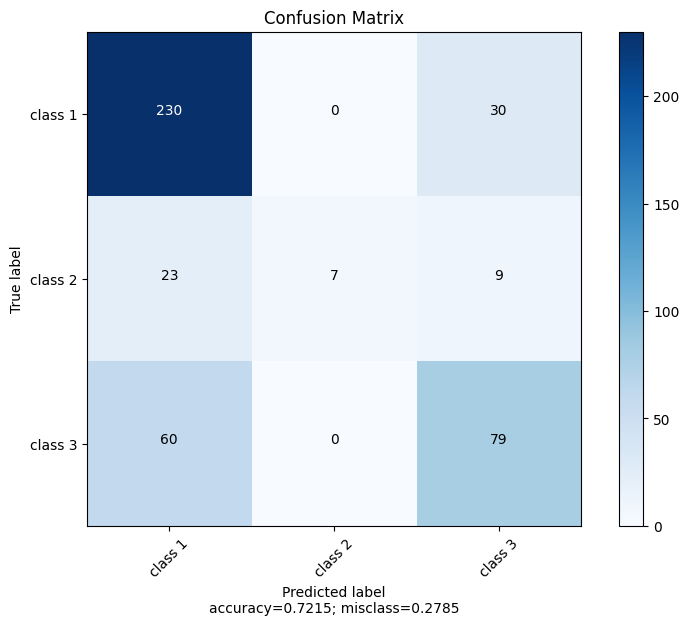


 ########## Result for Validation data ########## 

log_loss:    0.7882
accuracy:    0.6301 

              precision    recall  f1-score   support

     class 1       0.67      0.79      0.72        85
     class 2       0.00      0.00      0.00         9
     class 3       0.54      0.48      0.51        52

    accuracy                           0.63       146
   macro avg       0.40      0.42      0.41       146
weighted avg       0.58      0.63      0.60       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


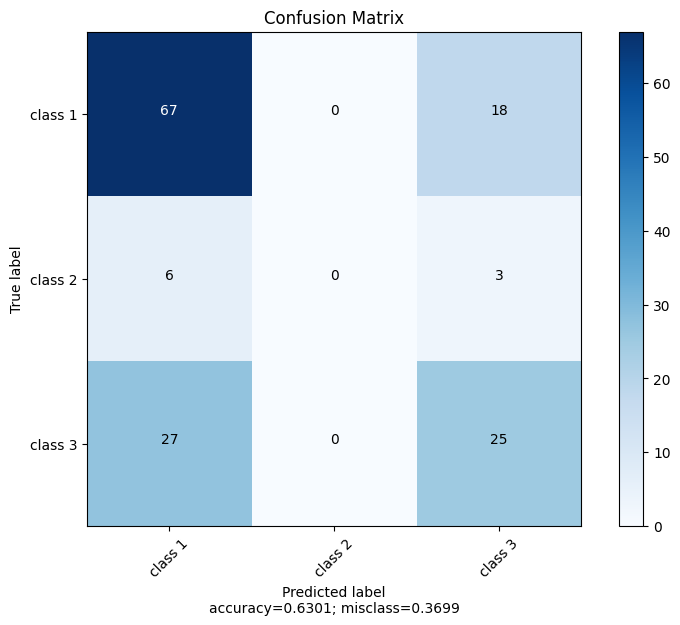


 ########## Result for Test data ########## 

log_loss:    0.8705
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.66      0.80      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.51      0.44      0.47        64

    accuracy                           0.62       195
   macro avg       0.39      0.41      0.40       195
weighted avg       0.55      0.62      0.58       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


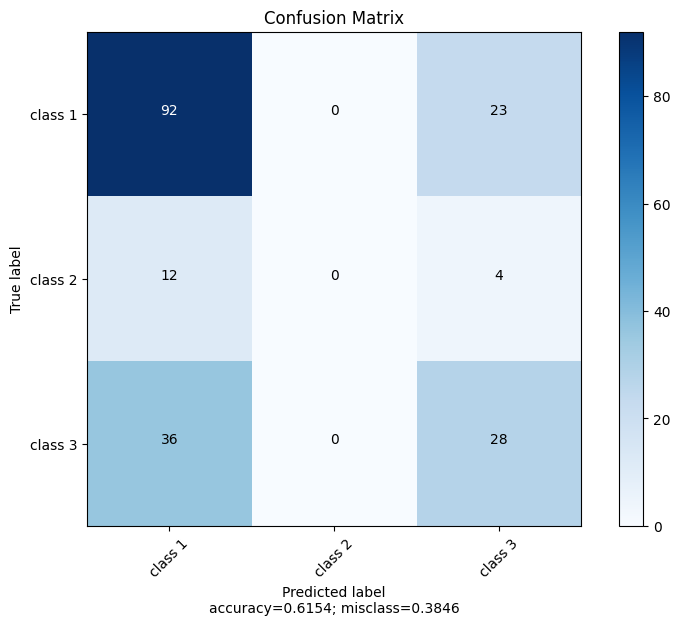

LR 0.1 40
n_nodes = 40 lambd = 0.1
Model: "model_81"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_191 (Dense)           (None, 40)                400       
                                                                 
 dropout_108 (Dropout)       (None, 40)                0         
                                                                 
 dense_192 (Dense)           (None, 3)                 123       
                                                                 
Total params: 523 (2.04 KB)
Trainable params: 523 (2.04 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


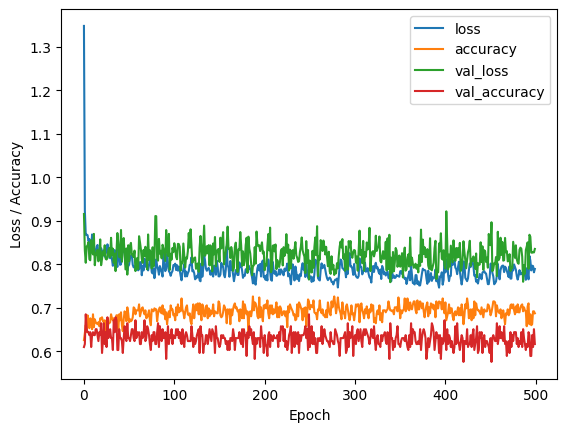


 ########## Result for Training data ########## 

log_loss:    0.7328
accuracy:    0.6963 

              precision    recall  f1-score   support

     class 1       0.69      0.93      0.79       260
     class 2       1.00      0.15      0.27        39
     class 3       0.70      0.42      0.52       139

    accuracy                           0.70       438
   macro avg       0.80      0.50      0.53       438
weighted avg       0.72      0.70      0.66       438



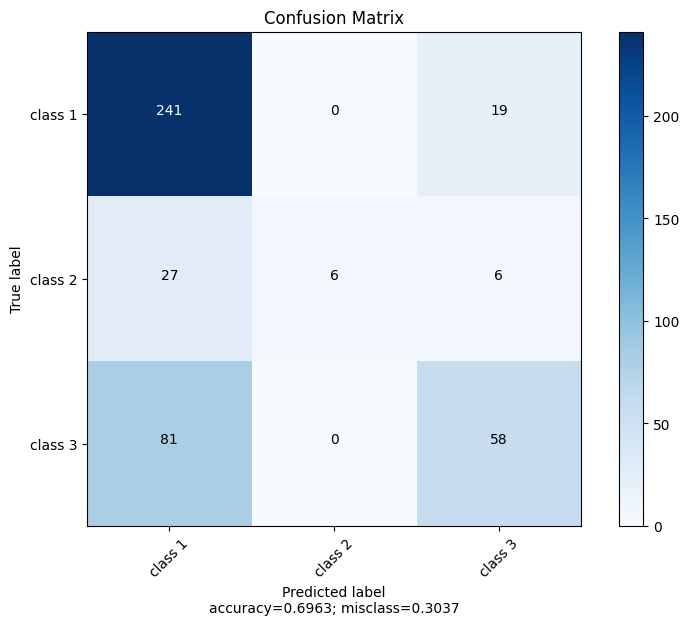


 ########## Result for Validation data ########## 

log_loss:    0.8080
accuracy:    0.6164 

              precision    recall  f1-score   support

     class 1       0.63      0.86      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.55      0.33      0.41        52

    accuracy                           0.62       146
   macro avg       0.39      0.40      0.38       146
weighted avg       0.56      0.62      0.57       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


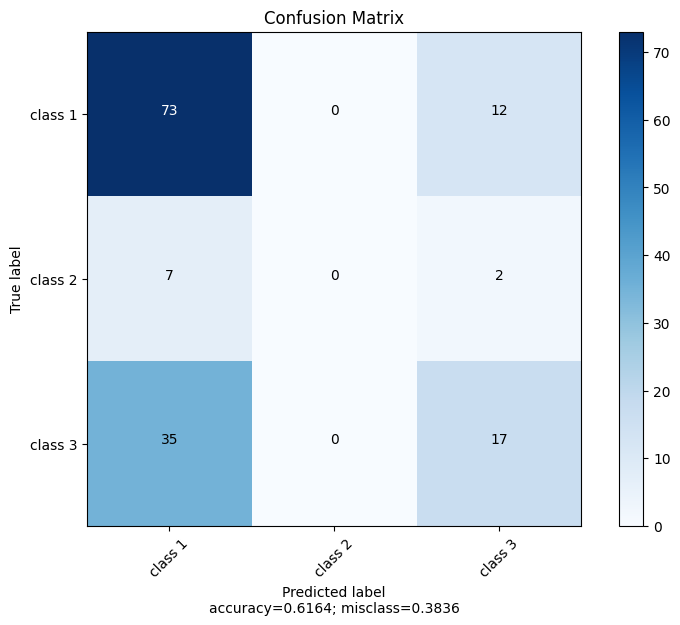


 ########## Result for Test data ########## 

log_loss:    0.8467
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.63      0.88      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.54      0.30      0.38        64

    accuracy                           0.62       195
   macro avg       0.39      0.39      0.37       195
weighted avg       0.55      0.62      0.56       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


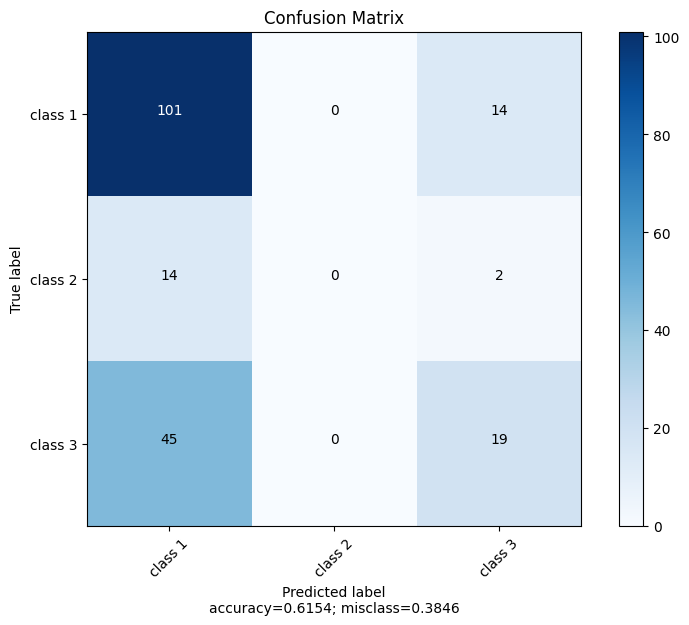

LR 0.1 17
n_nodes = 17 lambd = 0.1
Model: "model_82"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_193 (Dense)           (None, 17)                170       
                                                                 
 dropout_109 (Dropout)       (None, 17)                0         
                                                                 
 dense_194 (Dense)           (None, 3)                 54        
                                                                 
Total params: 224 (896.00 Byte)
Trainable params: 224 (896.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


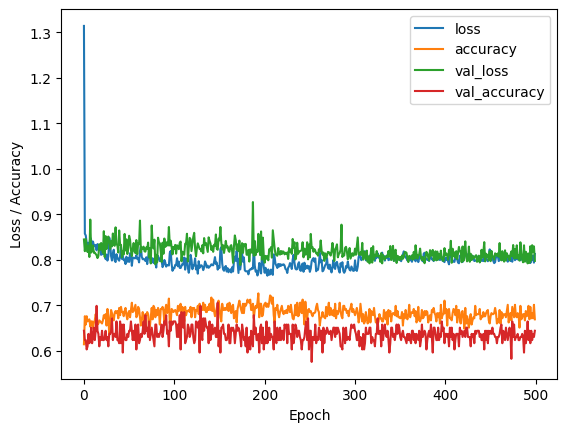


 ########## Result for Training data ########## 

log_loss:    0.7767
accuracy:    0.6849 

              precision    recall  f1-score   support

     class 1       0.69      0.91      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.46      0.54       139

    accuracy                           0.68       438
   macro avg       0.45      0.46      0.44       438
weighted avg       0.62      0.68      0.64       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


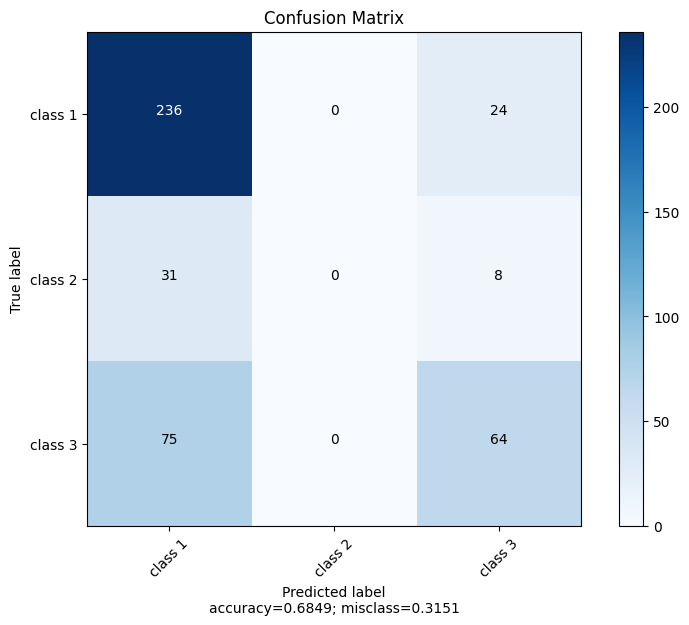


 ########## Result for Validation data ########## 

log_loss:    0.7851
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.66      0.85      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.59      0.42      0.49        52

    accuracy                           0.64       146
   macro avg       0.42      0.42      0.41       146
weighted avg       0.60      0.64      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


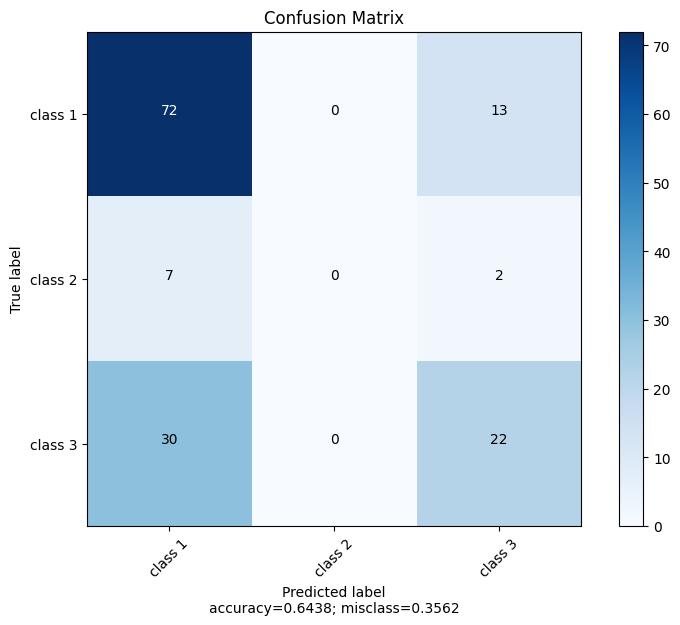


 ########## Result for Test data ########## 

log_loss:    0.8517
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.63      0.86      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.54      0.33      0.41        64

    accuracy                           0.62       195
   macro avg       0.39      0.40      0.38       195
weighted avg       0.55      0.62      0.56       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


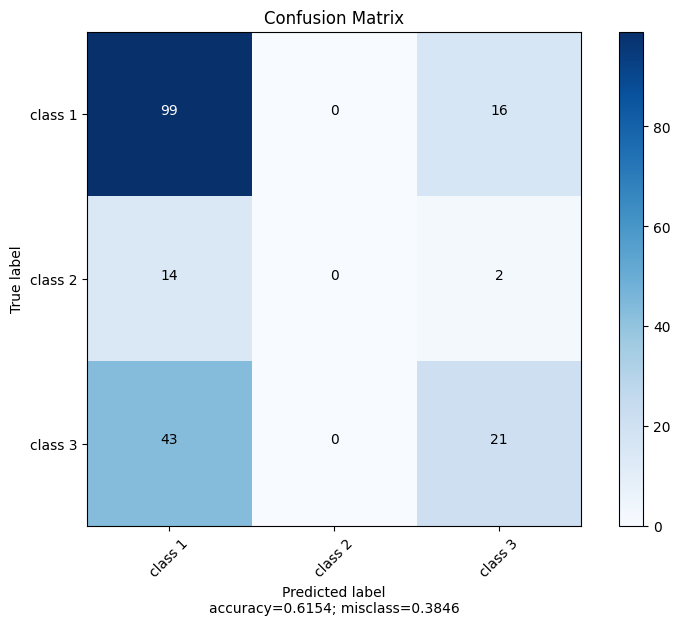

LR 0.1 26
n_nodes = 26 lambd = 0.1
Model: "model_83"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_195 (Dense)           (None, 26)                260       
                                                                 
 dropout_110 (Dropout)       (None, 26)                0         
                                                                 
 dense_196 (Dense)           (None, 3)                 81        
                                                                 
Total params: 341 (1.33 KB)
Trainable params: 341 (1.33 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


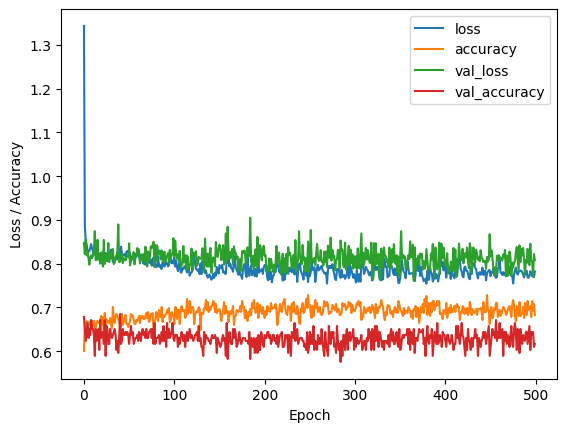


 ########## Result for Training data ########## 

log_loss:    0.7443
accuracy:    0.7123 

              precision    recall  f1-score   support

     class 1       0.72      0.90      0.80       260
     class 2       1.00      0.18      0.30        39
     class 3       0.66      0.50      0.57       139

    accuracy                           0.71       438
   macro avg       0.79      0.53      0.56       438
weighted avg       0.73      0.71      0.69       438



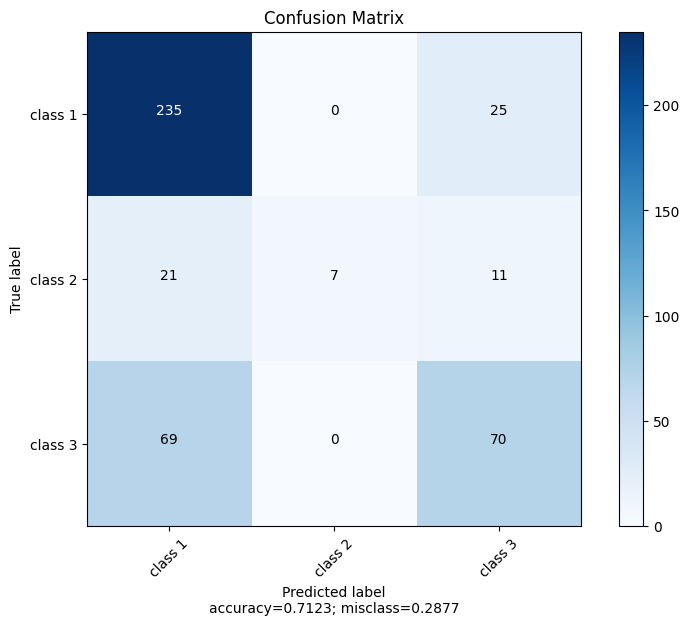


 ########## Result for Validation data ########## 

log_loss:    0.7873
accuracy:    0.6164 

              precision    recall  f1-score   support

     class 1       0.68      0.78      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.49      0.46      0.48        52

    accuracy                           0.62       146
   macro avg       0.39      0.41      0.40       146
weighted avg       0.57      0.62      0.59       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


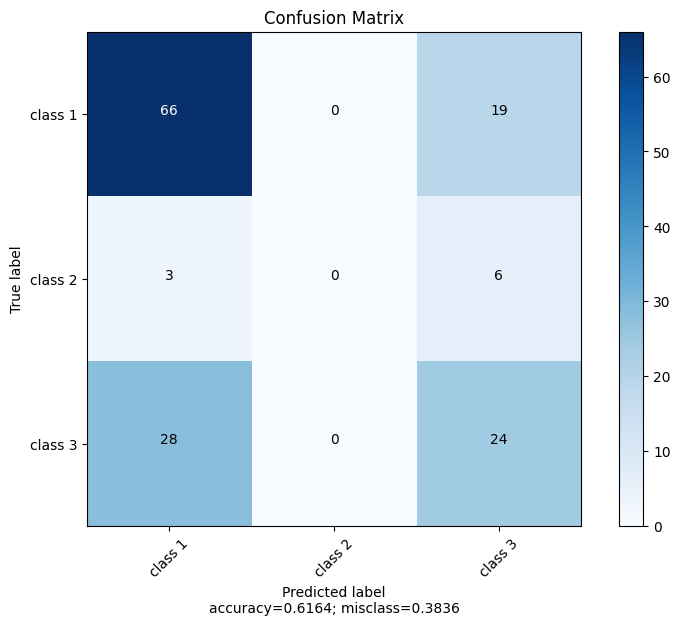


 ########## Result for Test data ########## 

log_loss:    0.8468
accuracy:    0.6256 

              precision    recall  f1-score   support

     class 1       0.67      0.84      0.75       115
     class 2       0.00      0.00      0.00        16
     class 3       0.49      0.39      0.43        64

    accuracy                           0.63       195
   macro avg       0.39      0.41      0.39       195
weighted avg       0.56      0.63      0.58       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


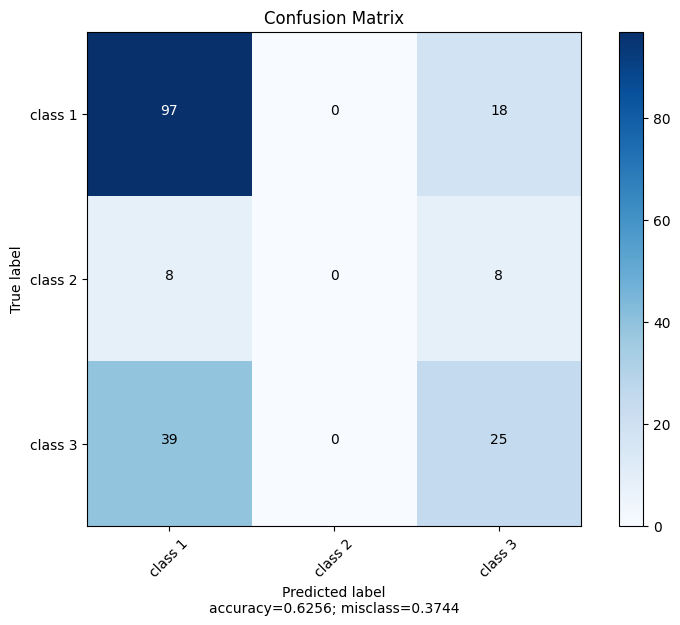

LR 0.1 22
n_nodes = 22 lambd = 0.1
Model: "model_84"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_197 (Dense)           (None, 22)                220       
                                                                 
 dropout_111 (Dropout)       (None, 22)                0         
                                                                 
 dense_198 (Dense)           (None, 3)                 69        
                                                                 
Total params: 289 (1.13 KB)
Trainable params: 289 (1.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


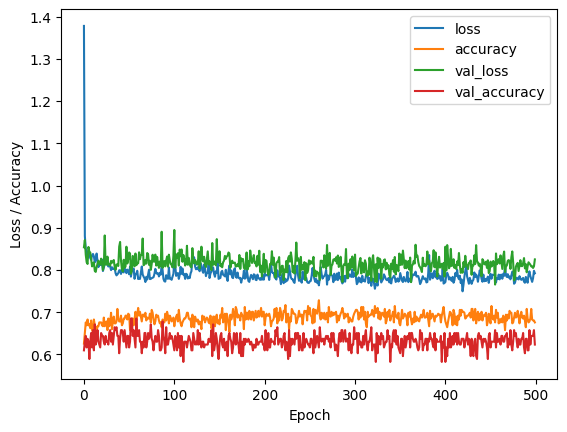


 ########## Result for Training data ########## 

log_loss:    0.7404
accuracy:    0.6986 

              precision    recall  f1-score   support

     class 1       0.69      0.93      0.79       260
     class 2       1.00      0.18      0.30        39
     class 3       0.70      0.41      0.52       139

    accuracy                           0.70       438
   macro avg       0.80      0.51      0.54       438
weighted avg       0.72      0.70      0.66       438



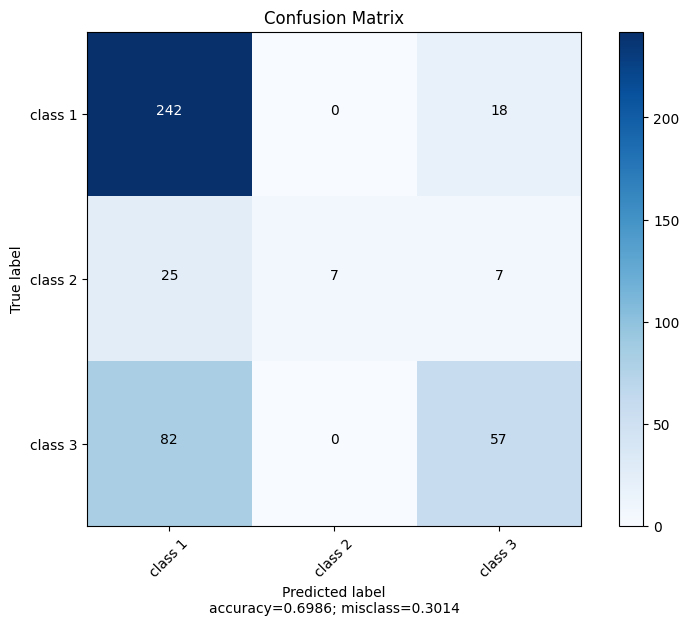


 ########## Result for Validation data ########## 

log_loss:    0.7970
accuracy:    0.6233 

              precision    recall  f1-score   support

     class 1       0.65      0.86      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.56      0.35      0.43        52

    accuracy                           0.62       146
   macro avg       0.40      0.40      0.39       146
weighted avg       0.58      0.62      0.58       146



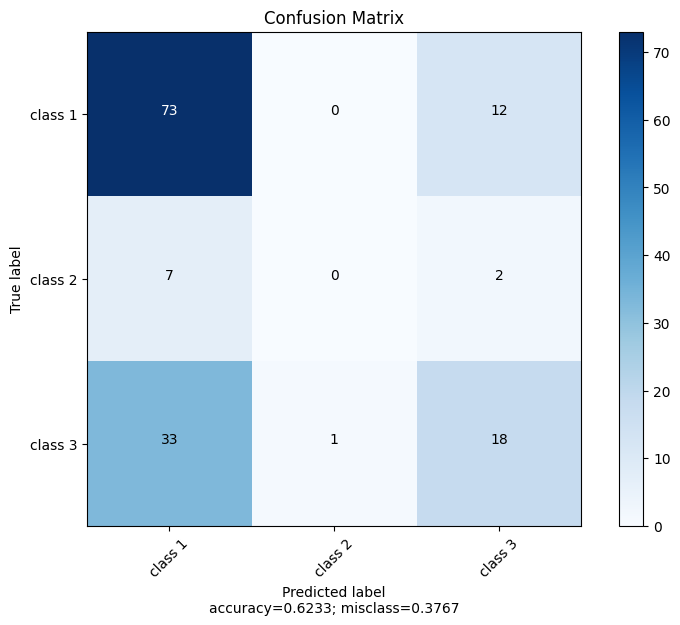


 ########## Result for Test data ########## 

log_loss:    0.8445
accuracy:    0.6000 

              precision    recall  f1-score   support

     class 1       0.62      0.86      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.51      0.28      0.36        64

    accuracy                           0.60       195
   macro avg       0.38      0.38      0.36       195
weighted avg       0.54      0.60      0.55       195



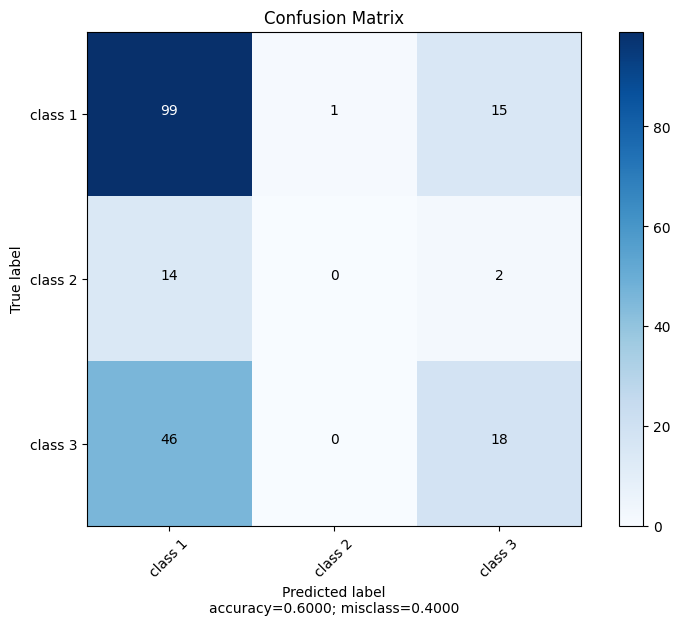

LR 0.1 35
n_nodes = 35 lambd = 0.1
Model: "model_85"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_199 (Dense)           (None, 35)                350       
                                                                 
 dropout_112 (Dropout)       (None, 35)                0         
                                                                 
 dense_200 (Dense)           (None, 3)                 108       
                                                                 
Total params: 458 (1.79 KB)
Trainable params: 458 (1.79 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


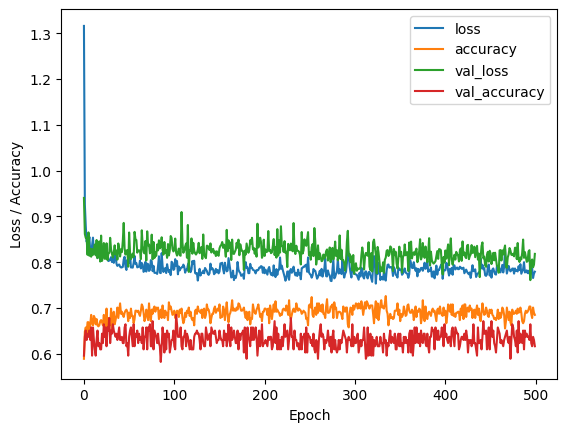


 ########## Result for Training data ########## 

log_loss:    0.7413
accuracy:    0.6872 

              precision    recall  f1-score   support

     class 1       0.67      0.95      0.79       260
     class 2       1.00      0.18      0.30        39
     class 3       0.73      0.34      0.46       139

    accuracy                           0.69       438
   macro avg       0.80      0.49      0.52       438
weighted avg       0.72      0.69      0.64       438



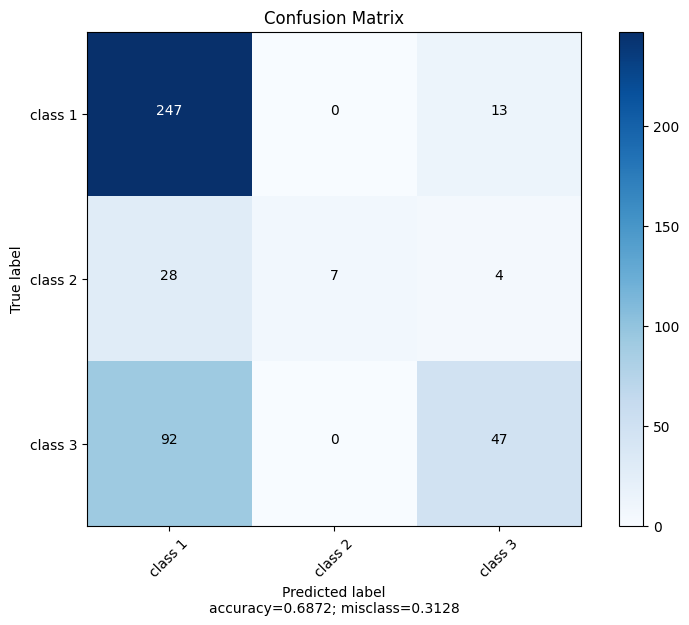


 ########## Result for Validation data ########## 

log_loss:    0.7999
accuracy:    0.6164 

              precision    recall  f1-score   support

     class 1       0.63      0.89      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.56      0.27      0.36        52

    accuracy                           0.62       146
   macro avg       0.40      0.39      0.37       146
weighted avg       0.57      0.62      0.56       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


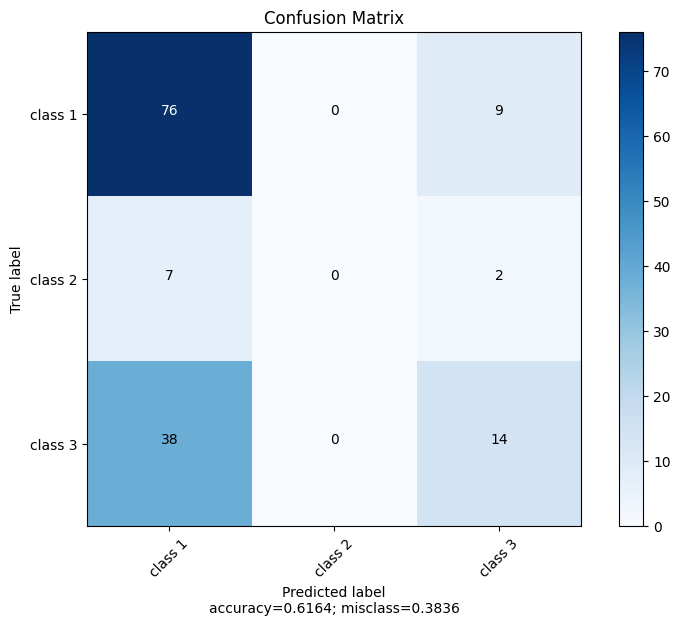


 ########## Result for Test data ########## 

log_loss:    0.8420
accuracy:    0.6205 

              precision    recall  f1-score   support

     class 1       0.63      0.91      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.57      0.25      0.35        64

    accuracy                           0.62       195
   macro avg       0.40      0.39      0.36       195
weighted avg       0.56      0.62      0.55       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


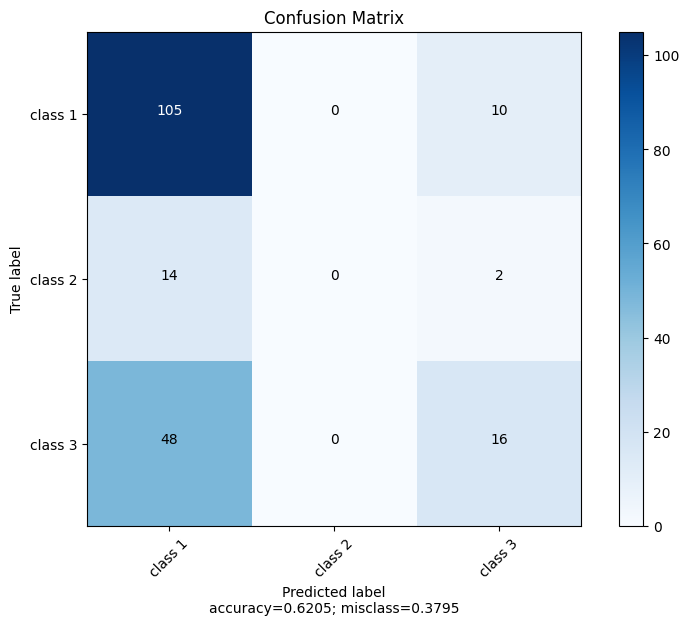

LR 0.3 36
n_nodes = 36 lambd = 0.3
Model: "model_86"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_201 (Dense)           (None, 36)                360       
                                                                 
 dropout_113 (Dropout)       (None, 36)                0         
                                                                 
 dense_202 (Dense)           (None, 3)                 111       
                                                                 
Total params: 471 (1.84 KB)
Trainable params: 471 (1.84 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


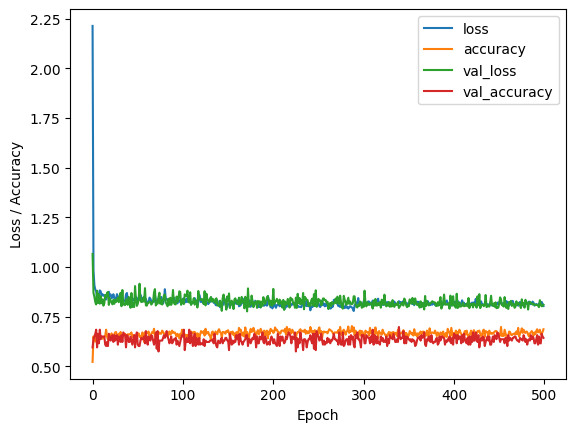


 ########## Result for Training data ########## 

log_loss:    0.7800
accuracy:    0.6712 



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

     class 1       0.67      0.94      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.36      0.47       139

    accuracy                           0.67       438
   macro avg       0.45      0.43      0.42       438
weighted avg       0.61      0.67      0.61       438



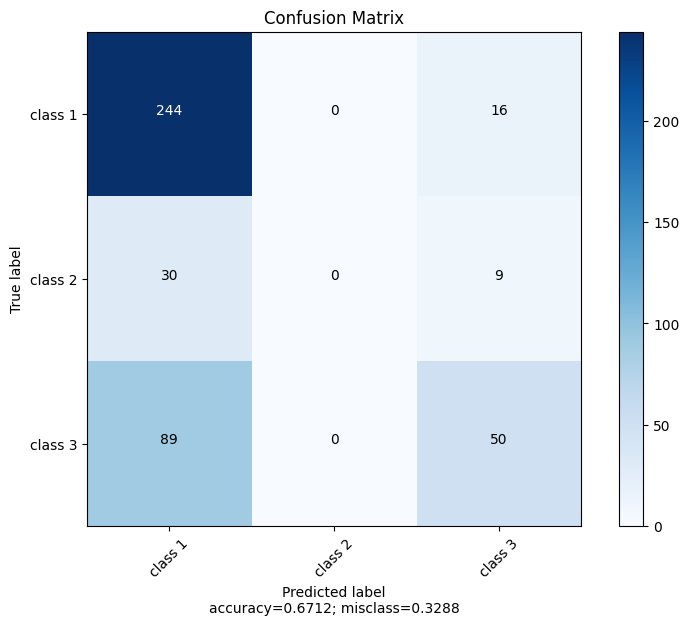


 ########## Result for Validation data ########## 

log_loss:    0.7956
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.66      0.89      0.76        85
     class 2       0.00      0.00      0.00         9
     class 3       0.60      0.35      0.44        52

    accuracy                           0.64       146
   macro avg       0.42      0.41      0.40       146
weighted avg       0.60      0.64      0.60       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


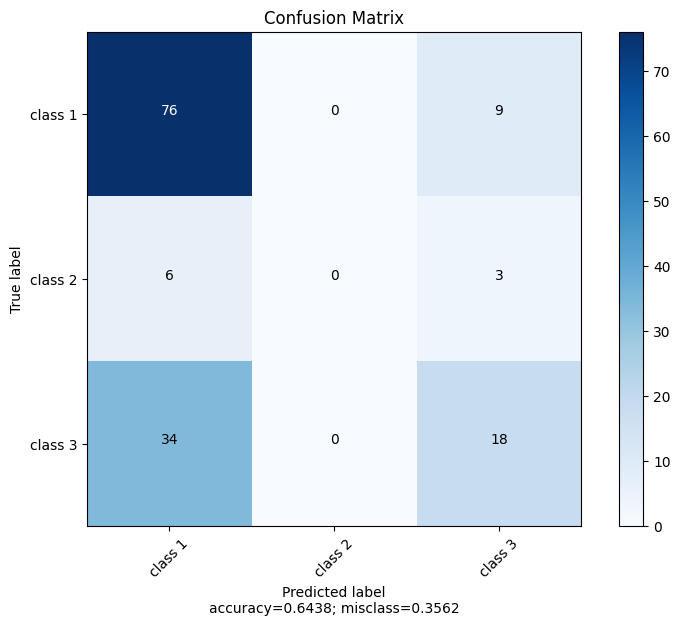


 ########## Result for Test data ########## 

log_loss:    0.8521
accuracy:    0.6051 

              precision    recall  f1-score   support

     class 1       0.62      0.88      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.52      0.27      0.35        64

    accuracy                           0.61       195
   macro avg       0.38      0.38      0.36       195
weighted avg       0.54      0.61      0.55       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


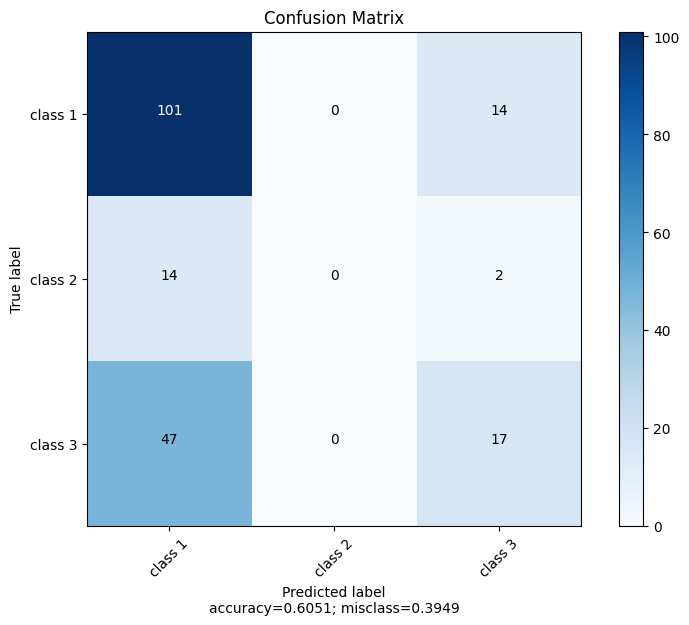

LR 0.3 41
n_nodes = 41 lambd = 0.3
Model: "model_87"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_203 (Dense)           (None, 41)                410       
                                                                 
 dropout_114 (Dropout)       (None, 41)                0         
                                                                 
 dense_204 (Dense)           (None, 3)                 126       
                                                                 
Total params: 536 (2.09 KB)
Trainable params: 536 (2.09 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


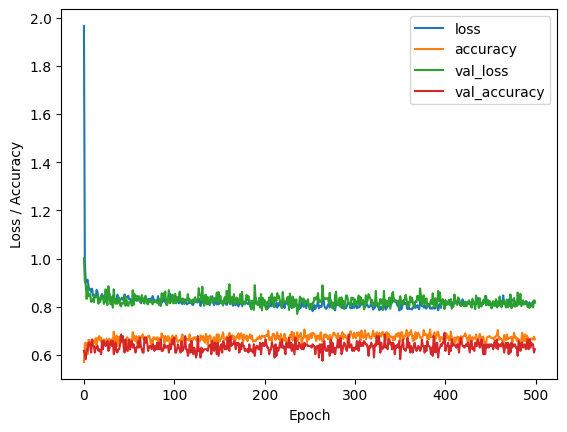


 ########## Result for Training data ########## 

log_loss:    0.7801
accuracy:    0.6849 

              precision    recall  f1-score   support

     class 1       0.68      0.94      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.72      0.40      0.52       139

    accuracy                           0.68       438
   macro avg       0.47      0.45      0.43       438
weighted avg       0.63      0.68      0.63       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


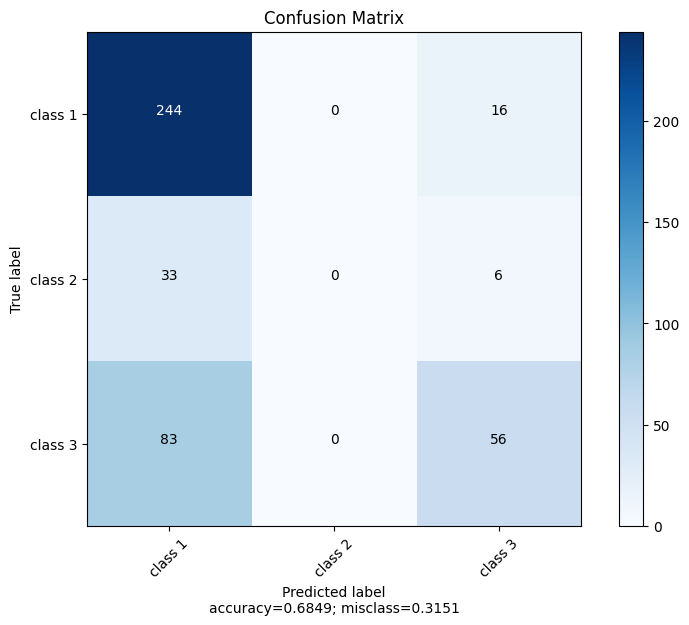


 ########## Result for Validation data ########## 

log_loss:    0.7978
accuracy:    0.6233 

              precision    recall  f1-score   support

     class 1       0.64      0.88      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.55      0.31      0.40        52

    accuracy                           0.62       146
   macro avg       0.40      0.40      0.38       146
weighted avg       0.57      0.62      0.57       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


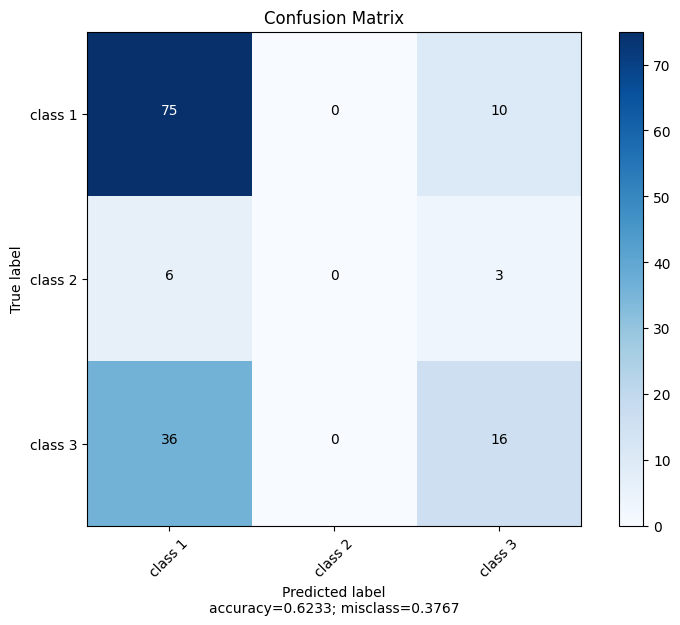


 ########## Result for Test data ########## 

log_loss:    0.8552
accuracy:    0.6051 

              precision    recall  f1-score   support

     class 1       0.62      0.88      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.52      0.27      0.35        64

    accuracy                           0.61       195
   macro avg       0.38      0.38      0.36       195
weighted avg       0.54      0.61      0.55       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


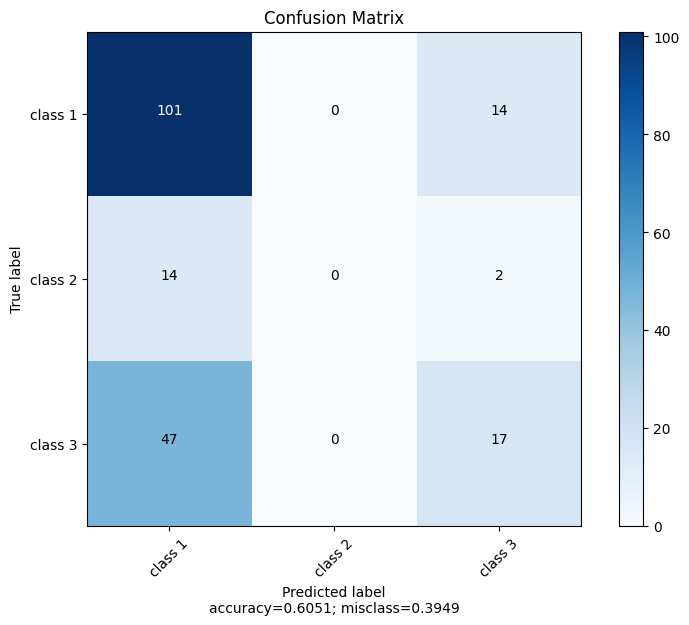

LR 0.3 46
n_nodes = 46 lambd = 0.3
Model: "model_88"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_205 (Dense)           (None, 46)                460       
                                                                 
 dropout_115 (Dropout)       (None, 46)                0         
                                                                 
 dense_206 (Dense)           (None, 3)                 141       
                                                                 
Total params: 601 (2.35 KB)
Trainable params: 601 (2.35 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


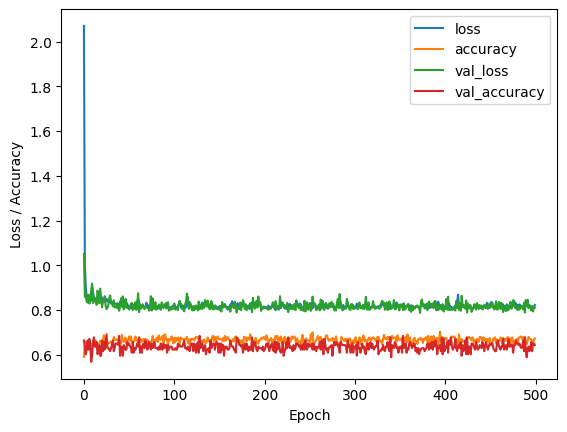


 ########## Result for Training data ########## 

log_loss:    0.7832
accuracy:    0.6826 

              precision    recall  f1-score   support

     class 1       0.67      0.95      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.75      0.37      0.49       139

    accuracy                           0.68       438
   macro avg       0.47      0.44      0.43       438
weighted avg       0.64      0.68      0.62       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


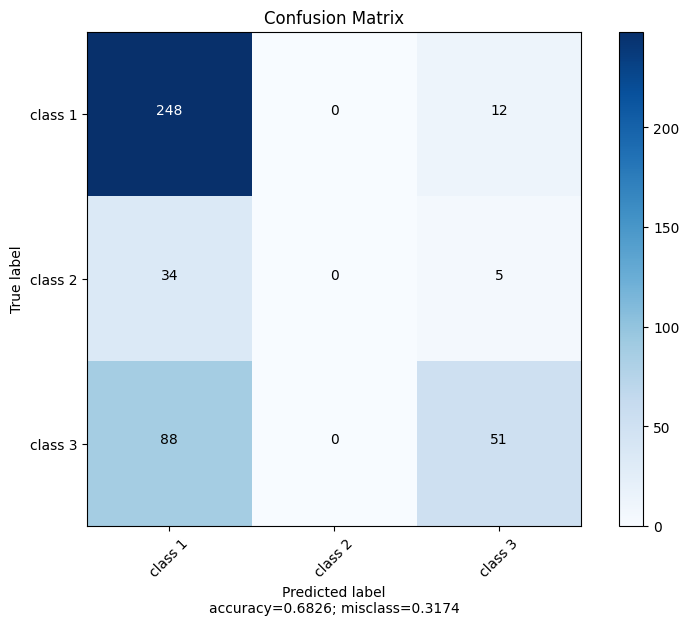


 ########## Result for Validation data ########## 

log_loss:    0.7976
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.65      0.91      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.63      0.33      0.43        52

    accuracy                           0.64       146
   macro avg       0.43      0.41      0.40       146
weighted avg       0.60      0.64      0.59       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


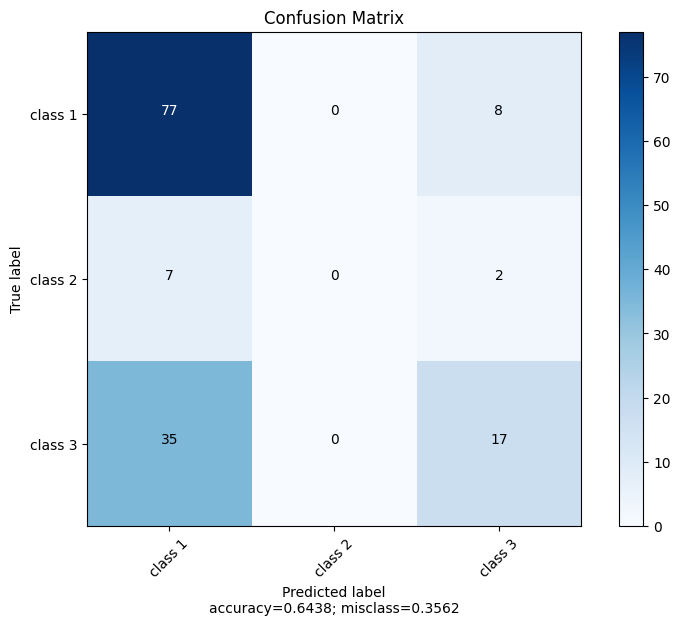


 ########## Result for Test data ########## 

log_loss:    0.8421
accuracy:    0.6103 

              precision    recall  f1-score   support

     class 1       0.62      0.93      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.55      0.19      0.28        64

    accuracy                           0.61       195
   macro avg       0.39      0.37      0.34       195
weighted avg       0.54      0.61      0.53       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


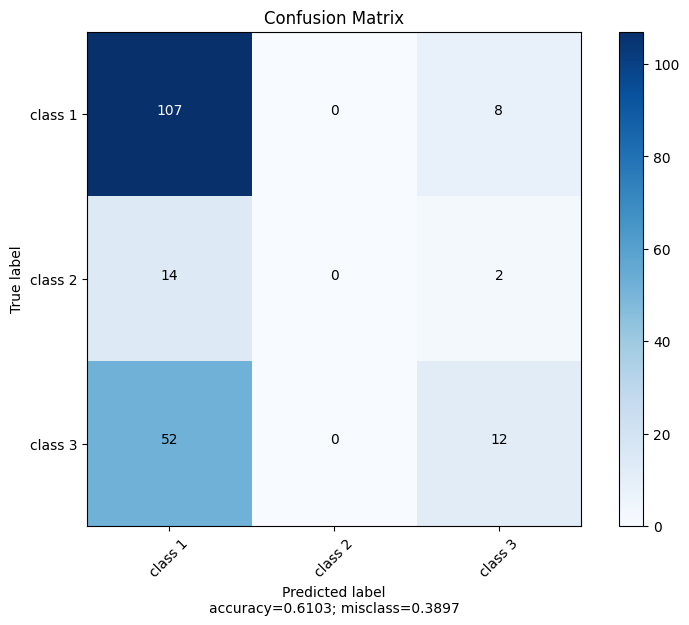

LR 0.3 29
n_nodes = 29 lambd = 0.3
Model: "model_89"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_207 (Dense)           (None, 29)                290       
                                                                 
 dropout_116 (Dropout)       (None, 29)                0         
                                                                 
 dense_208 (Dense)           (None, 3)                 90        
                                                                 
Total params: 380 (1.48 KB)
Trainable params: 380 (1.48 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


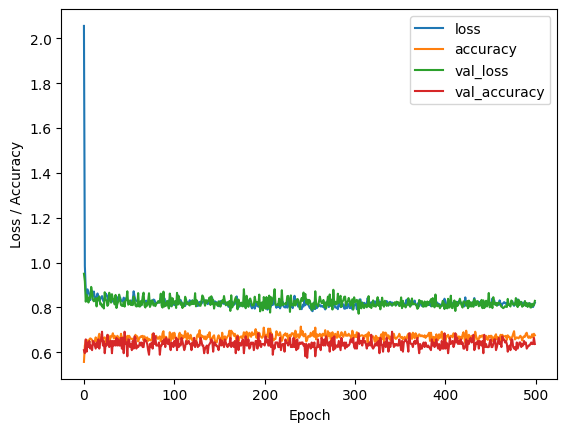


 ########## Result for Training data ########## 

log_loss:    0.7821
accuracy:    0.6872 

              precision    recall  f1-score   support

     class 1       0.70      0.90      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.66      0.48      0.56       139

    accuracy                           0.69       438
   macro avg       0.45      0.46      0.45       438
weighted avg       0.62      0.69      0.64       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


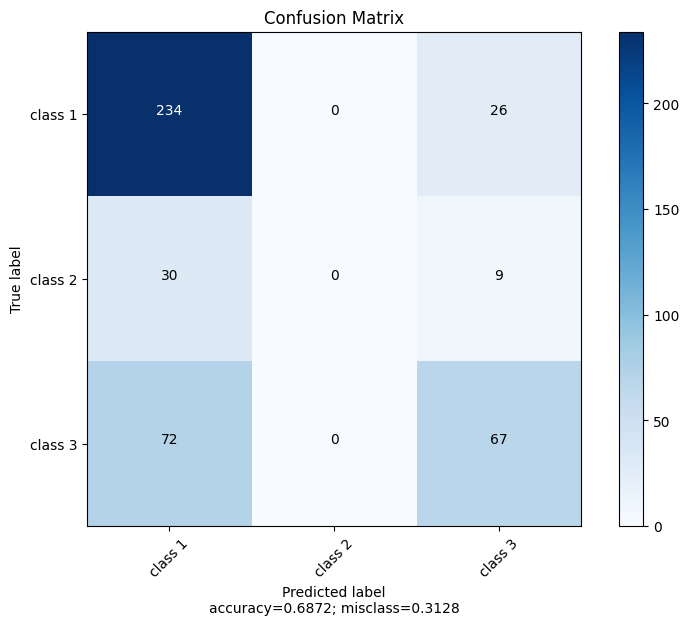


 ########## Result for Validation data ########## 

log_loss:    0.8061
accuracy:    0.6370 

              precision    recall  f1-score   support

     class 1       0.66      0.85      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.57      0.40      0.47        52

    accuracy                           0.64       146
   macro avg       0.41      0.42      0.40       146
weighted avg       0.59      0.64      0.60       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


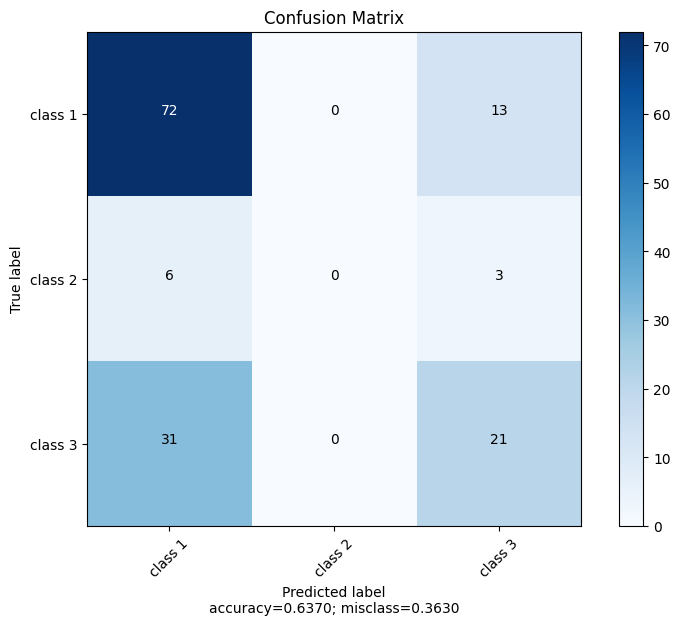


 ########## Result for Test data ########## 

log_loss:    0.8780
accuracy:    0.6051 

              precision    recall  f1-score   support

     class 1       0.63      0.84      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.51      0.33      0.40        64

    accuracy                           0.61       195
   macro avg       0.38      0.39      0.37       195
weighted avg       0.54      0.61      0.56       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


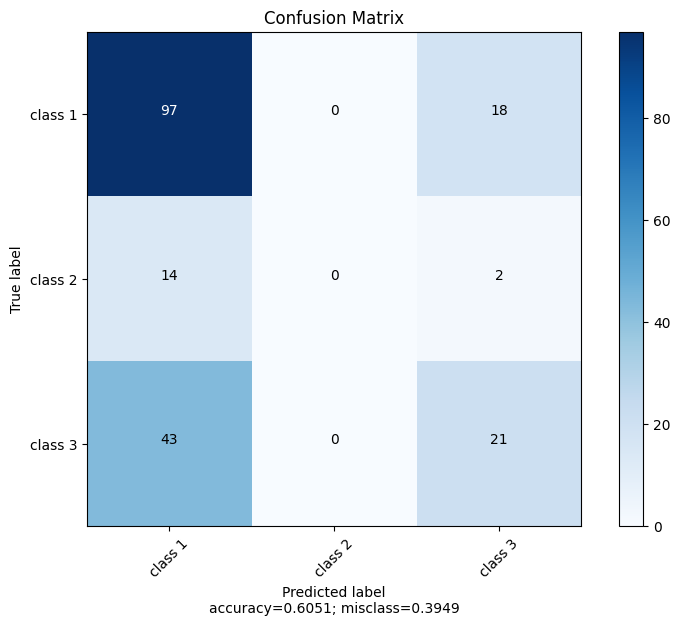

LR 0.3 45
n_nodes = 45 lambd = 0.3
Model: "model_90"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_209 (Dense)           (None, 45)                450       
                                                                 
 dropout_117 (Dropout)       (None, 45)                0         
                                                                 
 dense_210 (Dense)           (None, 3)                 138       
                                                                 
Total params: 588 (2.30 KB)
Trainable params: 588 (2.30 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


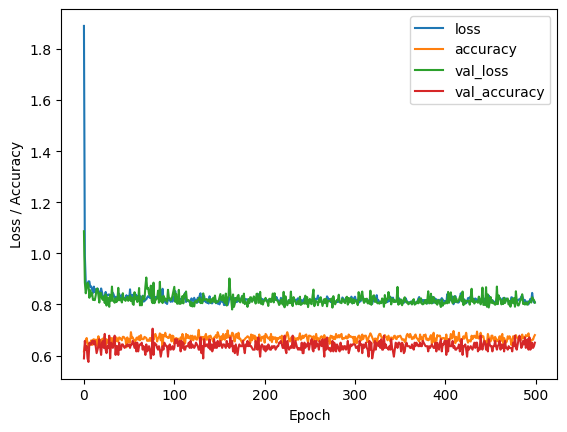


 ########## Result for Training data ########## 

log_loss:    0.7813
accuracy:    0.6941 

              precision    recall  f1-score   support

     class 1       0.70      0.90      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.66      0.50      0.57       139

    accuracy                           0.69       438
   macro avg       0.46      0.47      0.45       438
weighted avg       0.63      0.69      0.65       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


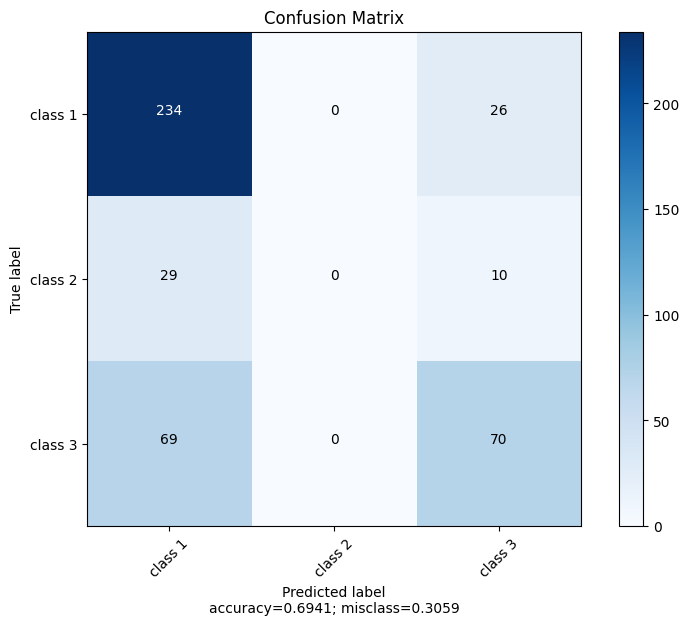


 ########## Result for Validation data ########## 

log_loss:    0.7904
accuracy:    0.6507 

              precision    recall  f1-score   support

     class 1       0.70      0.84      0.76        85
     class 2       0.00      0.00      0.00         9
     class 3       0.55      0.46      0.50        52

    accuracy                           0.65       146
   macro avg       0.41      0.43      0.42       146
weighted avg       0.60      0.65      0.62       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


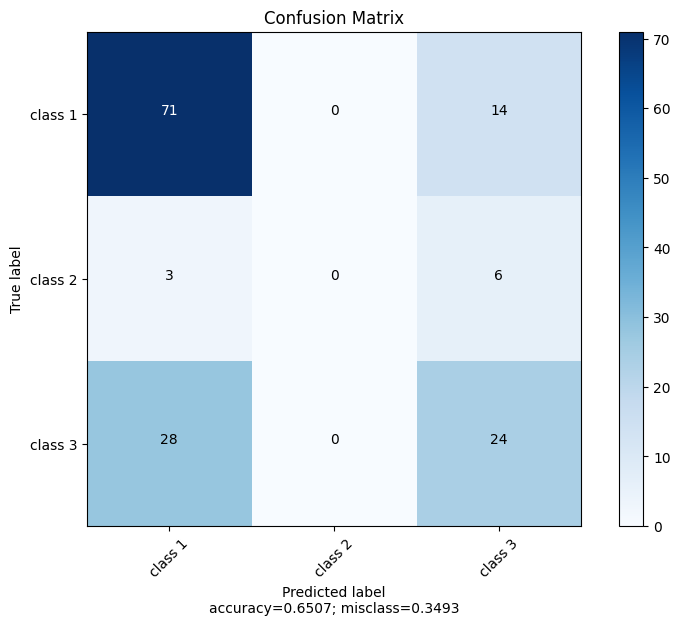


 ########## Result for Test data ########## 

log_loss:    0.8588
accuracy:    0.6256 

              precision    recall  f1-score   support

     class 1       0.65      0.85      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.55      0.38      0.44        64

    accuracy                           0.63       195
   macro avg       0.40      0.41      0.39       195
weighted avg       0.56      0.63      0.58       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


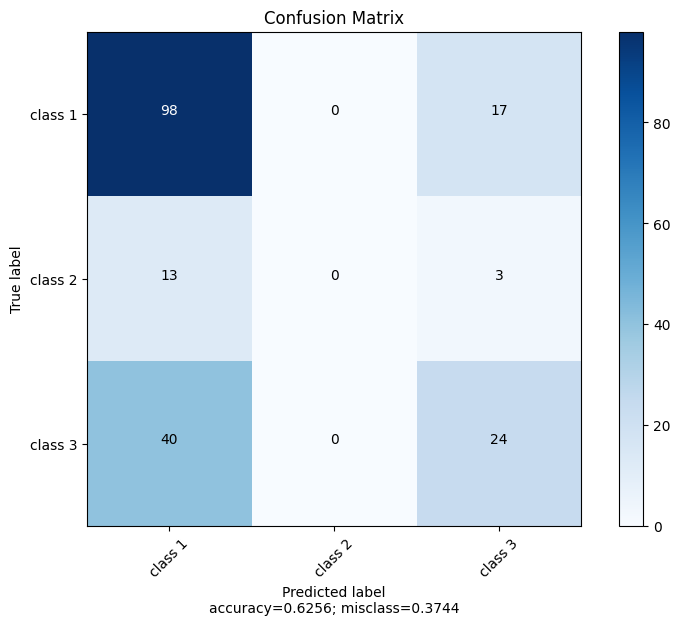

LR 0.3 27
n_nodes = 27 lambd = 0.3
Model: "model_91"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_211 (Dense)           (None, 27)                270       
                                                                 
 dropout_118 (Dropout)       (None, 27)                0         
                                                                 
 dense_212 (Dense)           (None, 3)                 84        
                                                                 
Total params: 354 (1.38 KB)
Trainable params: 354 (1.38 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


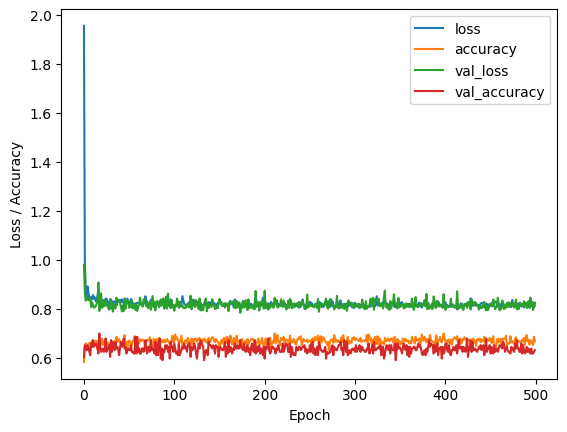


 ########## Result for Training data ########## 

log_loss:    0.7852
accuracy:    0.6781 

              precision    recall  f1-score   support

     class 1       0.67      0.95      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.73      0.37      0.49       139

    accuracy                           0.68       438
   macro avg       0.47      0.44      0.42       438
weighted avg       0.63      0.68      0.62       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


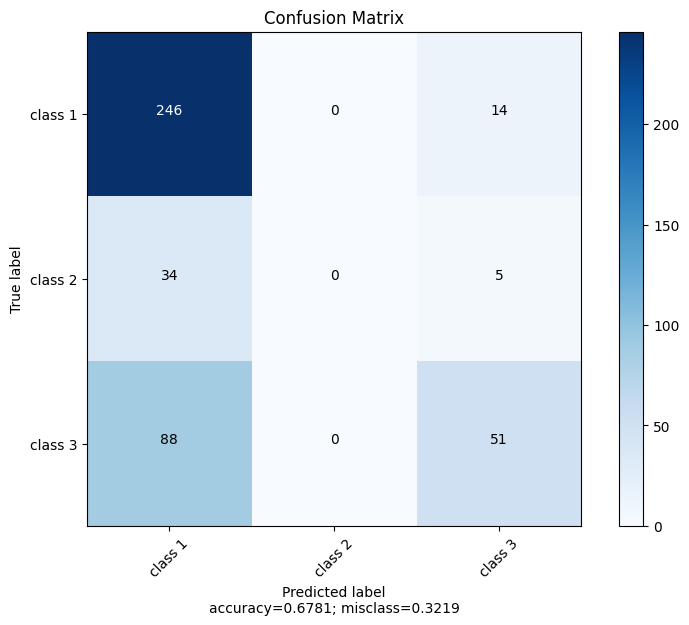


 ########## Result for Validation data ########## 

log_loss:    0.7979
accuracy:    0.6301 

              precision    recall  f1-score   support

     class 1       0.64      0.88      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.59      0.33      0.42        52

    accuracy                           0.63       146
   macro avg       0.41      0.40      0.39       146
weighted avg       0.58      0.63      0.58       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


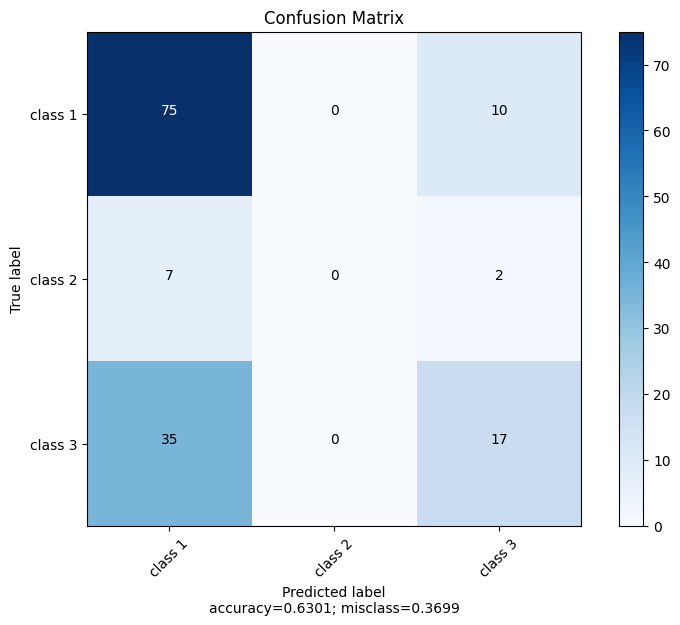


 ########## Result for Test data ########## 

log_loss:    0.8511
accuracy:    0.6103 

              precision    recall  f1-score   support

     class 1       0.62      0.90      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.54      0.23      0.33        64

    accuracy                           0.61       195
   macro avg       0.39      0.38      0.35       195
weighted avg       0.54      0.61      0.54       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


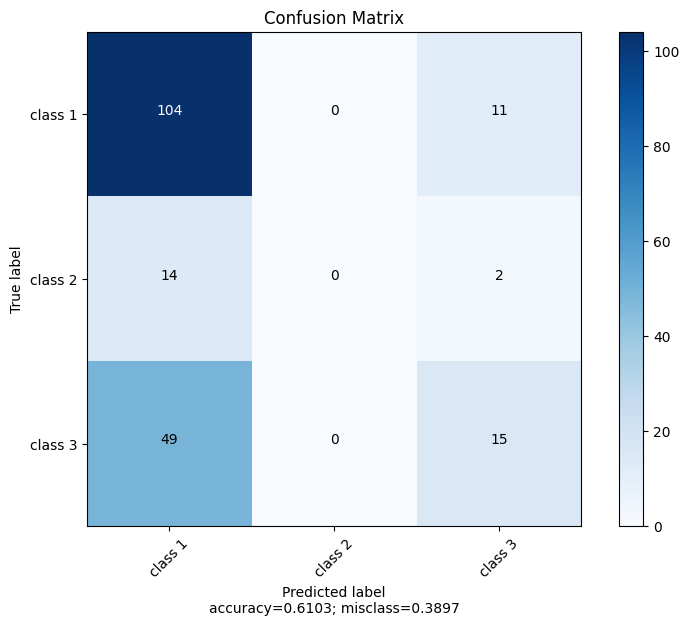

LR 0.3 8
n_nodes = 8 lambd = 0.3
Model: "model_92"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_213 (Dense)           (None, 8)                 80        
                                                                 
 dropout_119 (Dropout)       (None, 8)                 0         
                                                                 
 dense_214 (Dense)           (None, 3)                 27        
                                                                 
Total params: 107 (428.00 Byte)
Trainable params: 107 (428.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


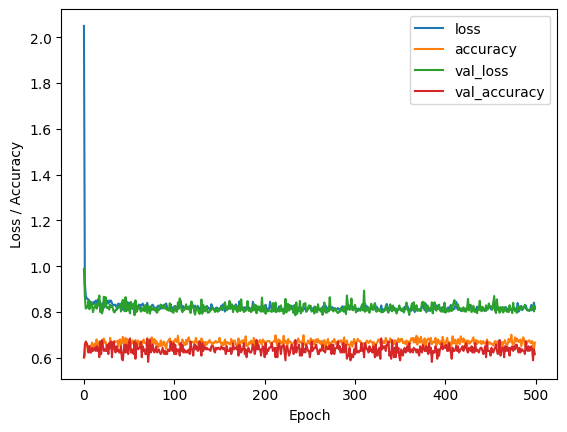


 ########## Result for Training data ########## 

log_loss:    0.7849
accuracy:    0.6804 

              precision    recall  f1-score   support

     class 1       0.69      0.91      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.66      0.45      0.53       139

    accuracy                           0.68       438
   macro avg       0.45      0.45      0.44       438
weighted avg       0.62      0.68      0.63       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


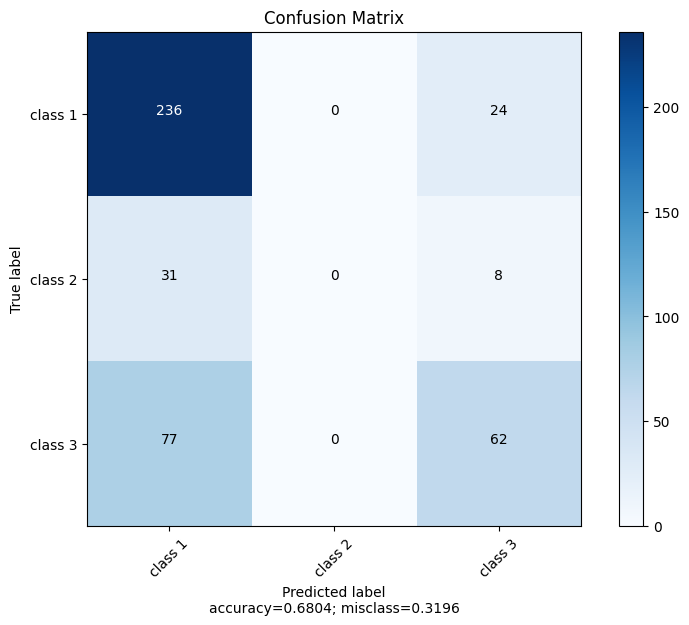


 ########## Result for Validation data ########## 

log_loss:    0.8043
accuracy:    0.6164 

              precision    recall  f1-score   support

     class 1       0.64      0.84      0.72        85
     class 2       0.00      0.00      0.00         9
     class 3       0.54      0.37      0.44        52

    accuracy                           0.62       146
   macro avg       0.39      0.40      0.39       146
weighted avg       0.57      0.62      0.58       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


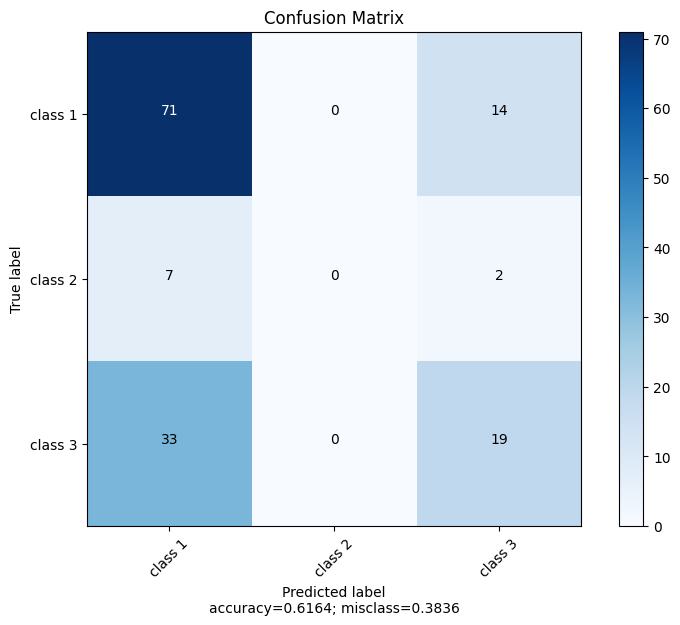


 ########## Result for Test data ########## 

log_loss:    0.8657
accuracy:    0.5897 

              precision    recall  f1-score   support

     class 1       0.62      0.83      0.71       115
     class 2       0.00      0.00      0.00        16
     class 3       0.47      0.30      0.37        64

    accuracy                           0.59       195
   macro avg       0.36      0.38      0.36       195
weighted avg       0.52      0.59      0.54       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


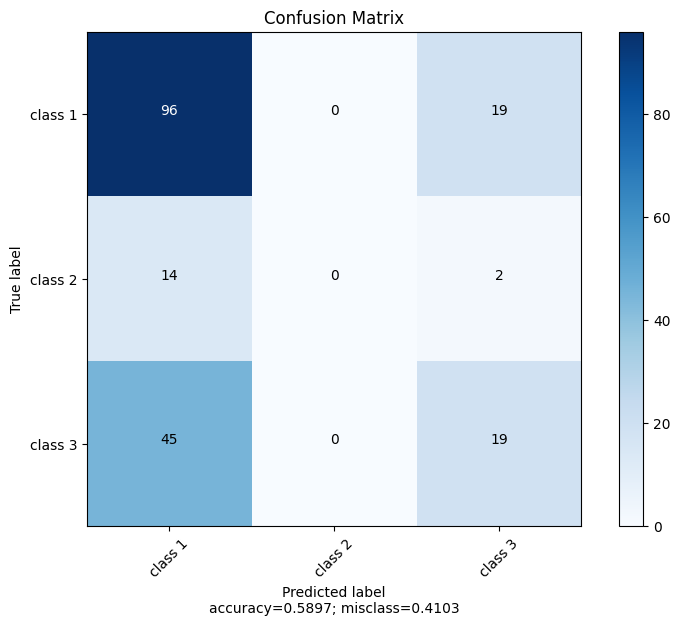

LR 0.3 30
n_nodes = 30 lambd = 0.3
Model: "model_93"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_215 (Dense)           (None, 30)                300       
                                                                 
 dropout_120 (Dropout)       (None, 30)                0         
                                                                 
 dense_216 (Dense)           (None, 3)                 93        
                                                                 
Total params: 393 (1.54 KB)
Trainable params: 393 (1.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


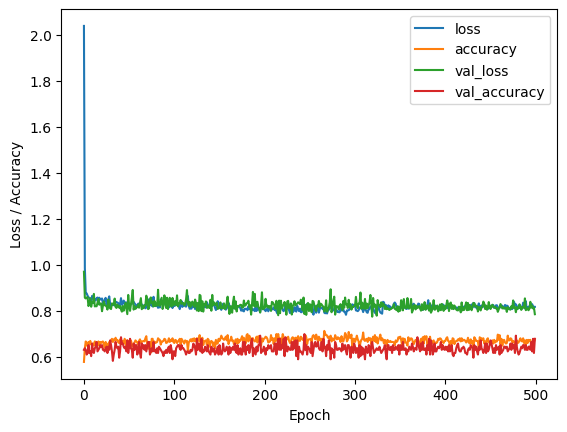


 ########## Result for Training data ########## 

log_loss:    0.7888
accuracy:    0.6804 

              precision    recall  f1-score   support

     class 1       0.68      0.92      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.42      0.52       139

    accuracy                           0.68       438
   macro avg       0.45      0.45      0.43       438
weighted avg       0.62      0.68      0.63       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


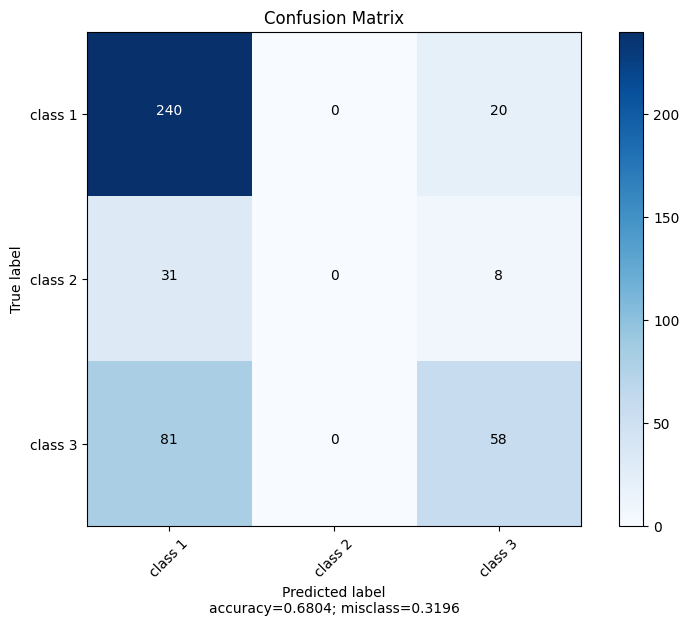


 ########## Result for Validation data ########## 

log_loss:    0.7717
accuracy:    0.6781 

              precision    recall  f1-score   support

     class 1       0.66      0.91      0.77        85
     class 2       0.00      0.00      0.00         9
     class 3       0.73      0.42      0.54        52

    accuracy                           0.68       146
   macro avg       0.47      0.44      0.43       146
weighted avg       0.65      0.68      0.64       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


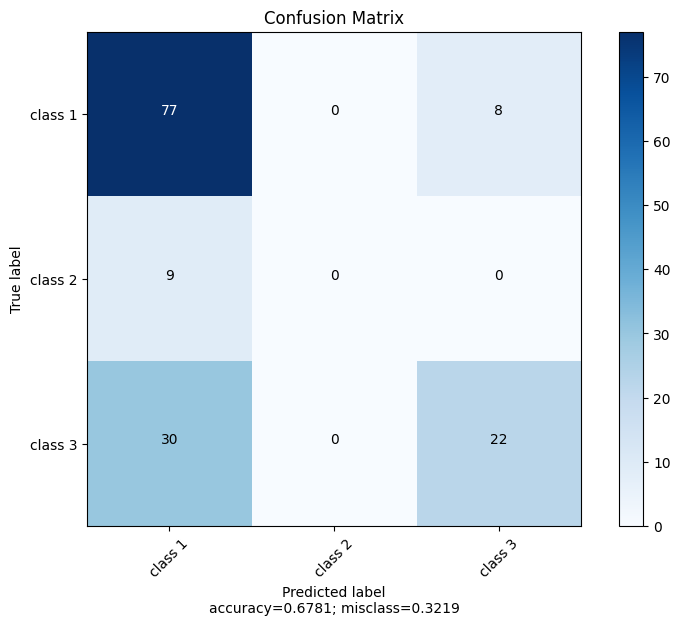


 ########## Result for Test data ########## 

log_loss:    0.8375
accuracy:    0.6051 

              precision    recall  f1-score   support

     class 1       0.62      0.88      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.52      0.27      0.35        64

    accuracy                           0.61       195
   macro avg       0.38      0.38      0.36       195
weighted avg       0.54      0.61      0.55       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


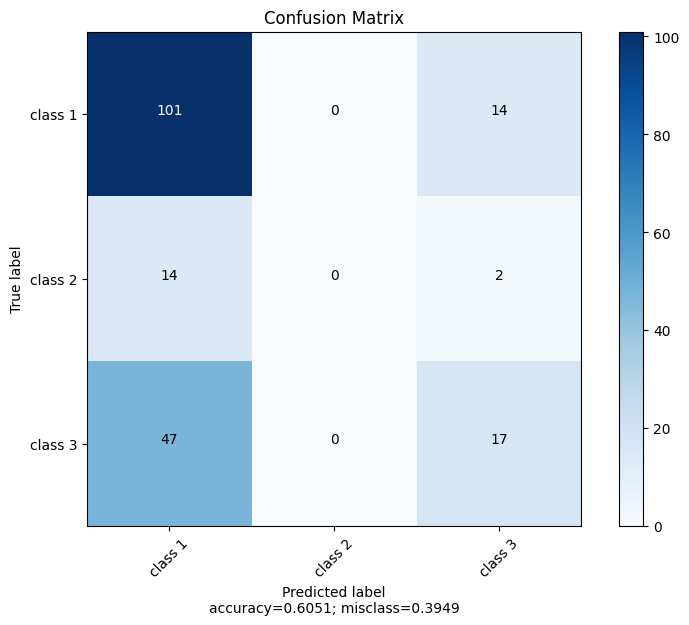

LR 0.3 12
n_nodes = 12 lambd = 0.3
Model: "model_94"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_217 (Dense)           (None, 12)                120       
                                                                 
 dropout_121 (Dropout)       (None, 12)                0         
                                                                 
 dense_218 (Dense)           (None, 3)                 39        
                                                                 
Total params: 159 (636.00 Byte)
Trainable params: 159 (636.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


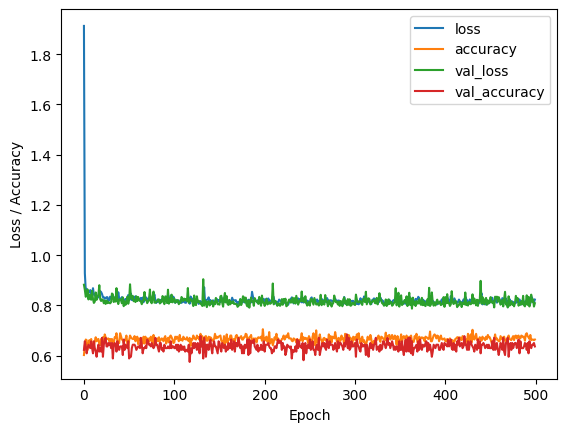


 ########## Result for Training data ########## 

log_loss:    0.7850
accuracy:    0.6918 

              precision    recall  f1-score   support

     class 1       0.70      0.90      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.50      0.57       139

    accuracy                           0.69       438
   macro avg       0.46      0.47      0.45       438
weighted avg       0.63      0.69      0.65       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


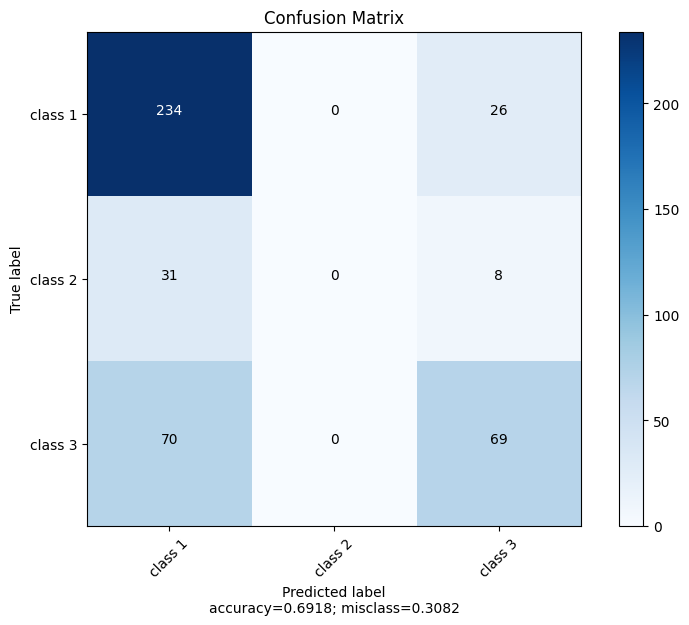


 ########## Result for Validation data ########## 

log_loss:    0.7886
accuracy:    0.6370 

              precision    recall  f1-score   support

     class 1       0.66      0.80      0.72        85
     class 2       0.00      0.00      0.00         9
     class 3       0.58      0.48      0.53        52

    accuracy                           0.64       146
   macro avg       0.41      0.43      0.42       146
weighted avg       0.59      0.64      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


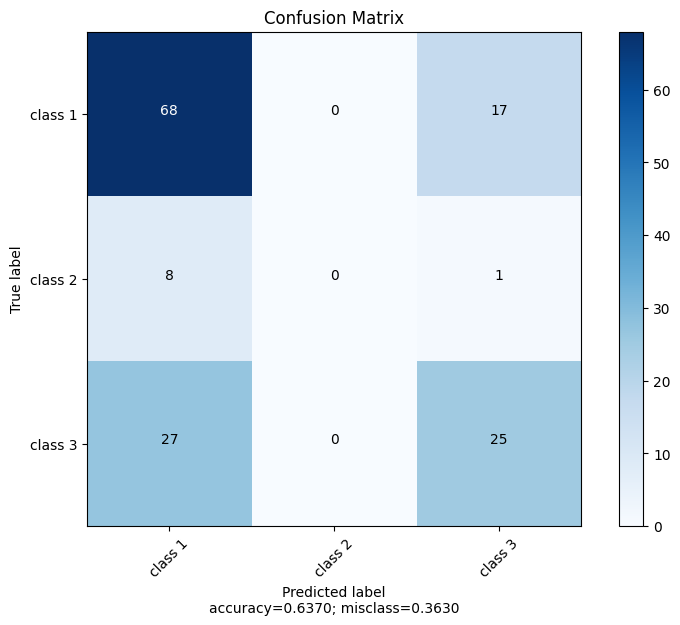


 ########## Result for Test data ########## 

log_loss:    0.8729
accuracy:    0.5949 

              precision    recall  f1-score   support

     class 1       0.63      0.82      0.71       115
     class 2       0.00      0.00      0.00        16
     class 3       0.49      0.34      0.40        64

    accuracy                           0.59       195
   macro avg       0.37      0.39      0.37       195
weighted avg       0.53      0.59      0.55       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


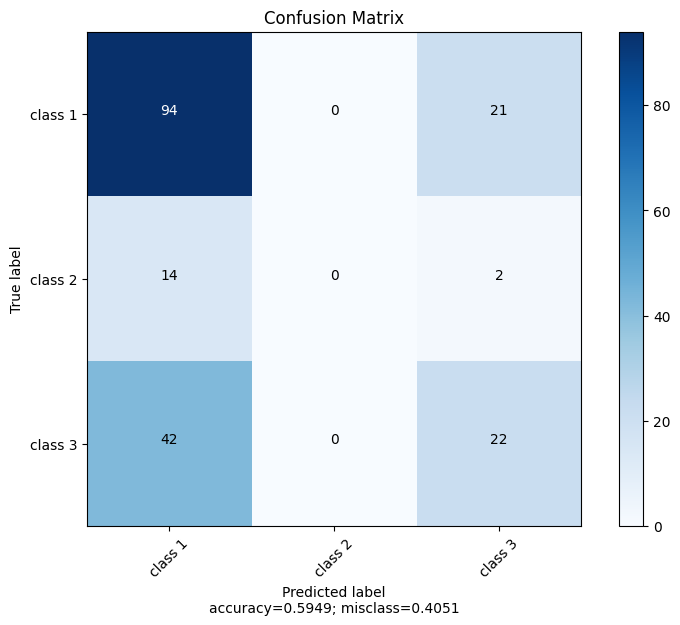

LR 0.3 11
n_nodes = 11 lambd = 0.3
Model: "model_95"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_219 (Dense)           (None, 11)                110       
                                                                 
 dropout_122 (Dropout)       (None, 11)                0         
                                                                 
 dense_220 (Dense)           (None, 3)                 36        
                                                                 
Total params: 146 (584.00 Byte)
Trainable params: 146 (584.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


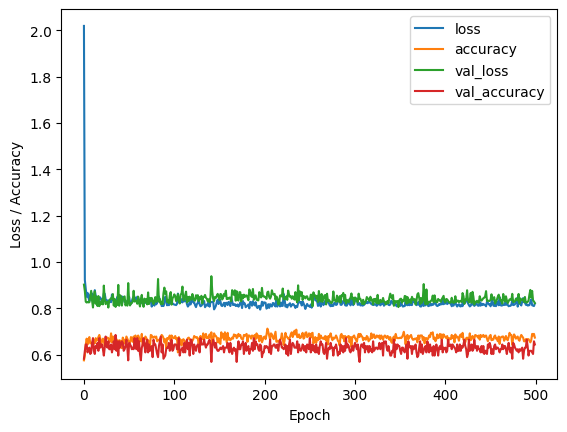


 ########## Result for Training data ########## 

log_loss:    0.7826
accuracy:    0.6895 

              precision    recall  f1-score   support

     class 1       0.70      0.90      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.48      0.56       139

    accuracy                           0.69       438
   macro avg       0.46      0.46      0.45       438
weighted avg       0.63      0.69      0.64       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


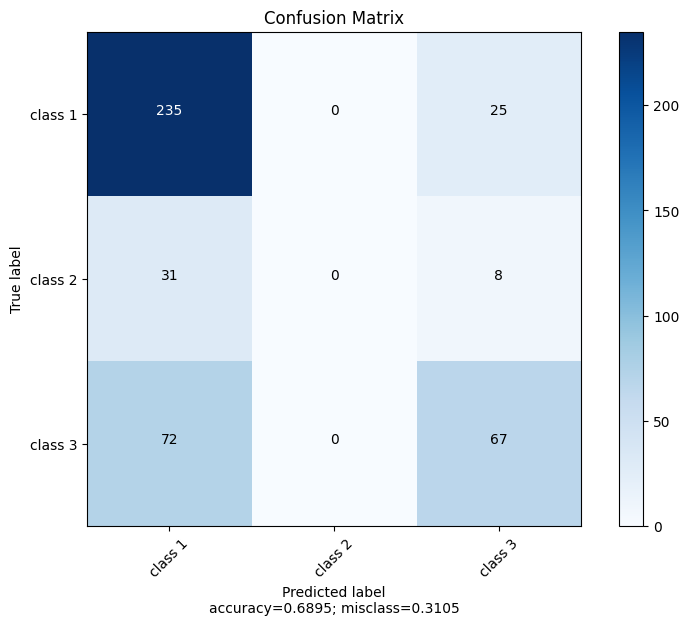


 ########## Result for Validation data ########## 

log_loss:    0.8051
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.68      0.82      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.56      0.46      0.51        52

    accuracy                           0.64       146
   macro avg       0.41      0.43      0.42       146
weighted avg       0.59      0.64      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


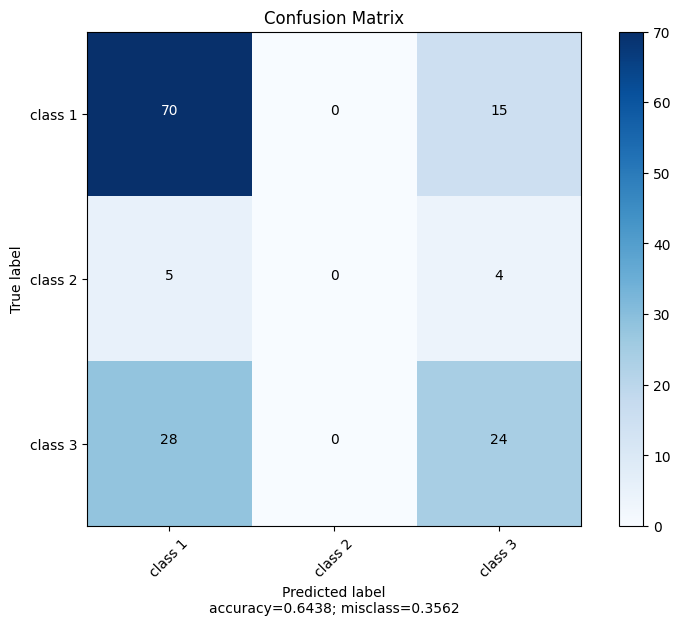


 ########## Result for Test data ########## 

log_loss:    0.8646
accuracy:    0.5744 

              precision    recall  f1-score   support

     class 1       0.61      0.83      0.70       115
     class 2       0.00      0.00      0.00        16
     class 3       0.42      0.27      0.33        64

    accuracy                           0.57       195
   macro avg       0.35      0.36      0.34       195
weighted avg       0.50      0.57      0.52       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


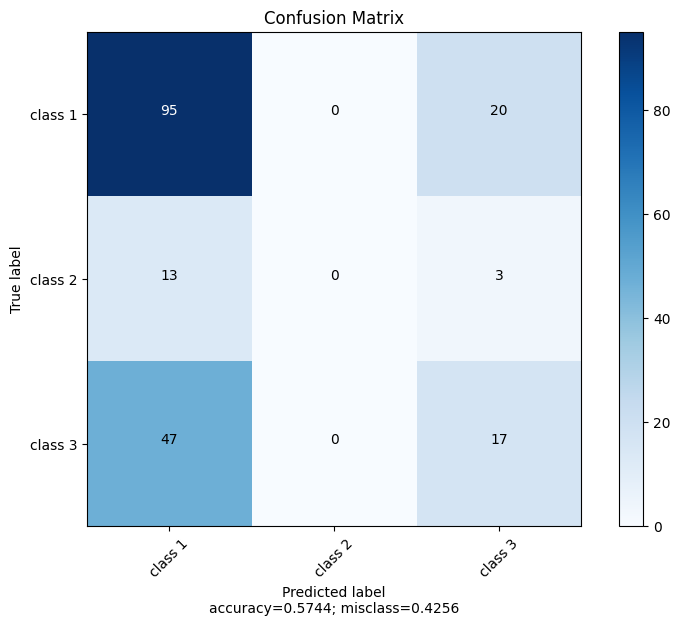

LR 0.3 5
n_nodes = 5 lambd = 0.3
Model: "model_96"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_221 (Dense)           (None, 5)                 50        
                                                                 
 dropout_123 (Dropout)       (None, 5)                 0         
                                                                 
 dense_222 (Dense)           (None, 3)                 18        
                                                                 
Total params: 68 (272.00 Byte)
Trainable params: 68 (272.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


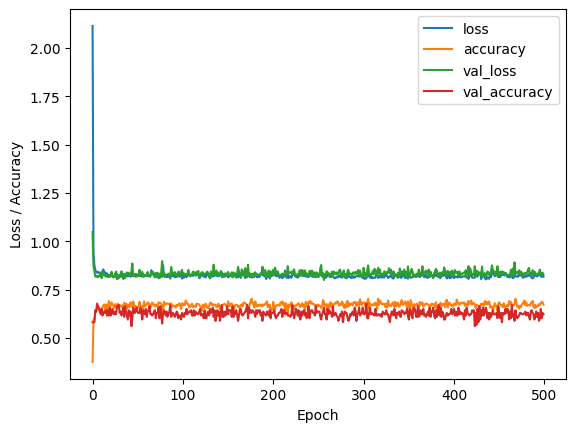


 ########## Result for Training data ########## 

log_loss:    0.7862
accuracy:    0.6712 

              precision    recall  f1-score   support

     class 1       0.67      0.93      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.38      0.49       139

    accuracy                           0.67       438
   macro avg       0.45      0.44      0.42       438
weighted avg       0.61      0.67      0.62       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


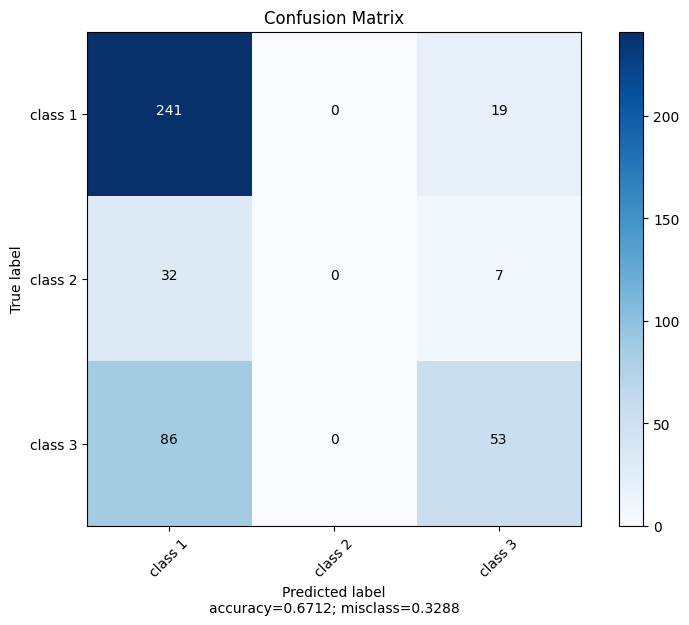


 ########## Result for Validation data ########## 

log_loss:    0.8130
accuracy:    0.6233 

              precision    recall  f1-score   support

     class 1       0.64      0.87      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.55      0.33      0.41        52

    accuracy                           0.62       146
   macro avg       0.40      0.40      0.38       146
weighted avg       0.57      0.62      0.58       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


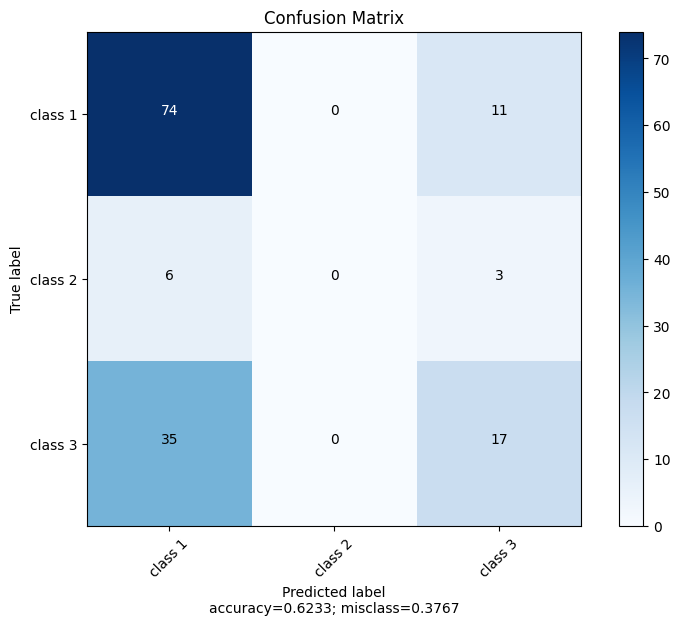


 ########## Result for Test data ########## 

log_loss:    0.8739
accuracy:    0.5744 

              precision    recall  f1-score   support

     class 1       0.60      0.85      0.71       115
     class 2       0.00      0.00      0.00        16
     class 3       0.42      0.22      0.29        64

    accuracy                           0.57       195
   macro avg       0.34      0.36      0.33       195
weighted avg       0.50      0.57      0.51       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


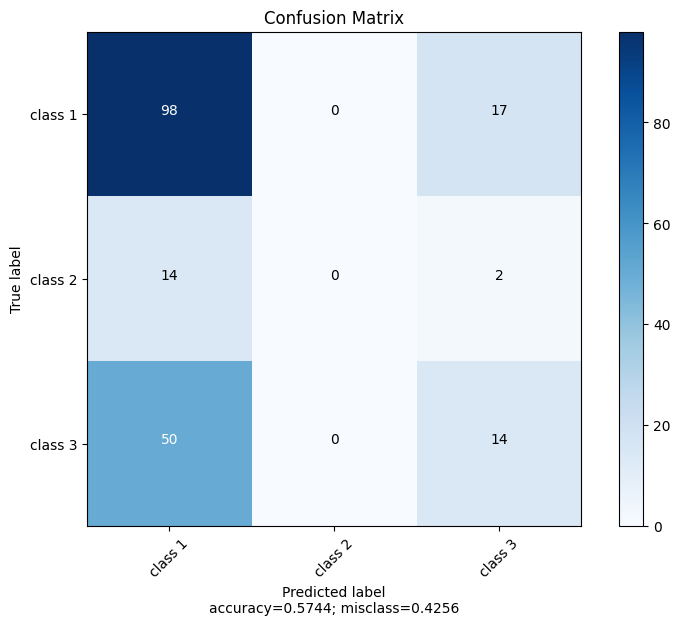

LR 0.3 6
n_nodes = 6 lambd = 0.3
Model: "model_97"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_223 (Dense)           (None, 6)                 60        
                                                                 
 dropout_124 (Dropout)       (None, 6)                 0         
                                                                 
 dense_224 (Dense)           (None, 3)                 21        
                                                                 
Total params: 81 (324.00 Byte)
Trainable params: 81 (324.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


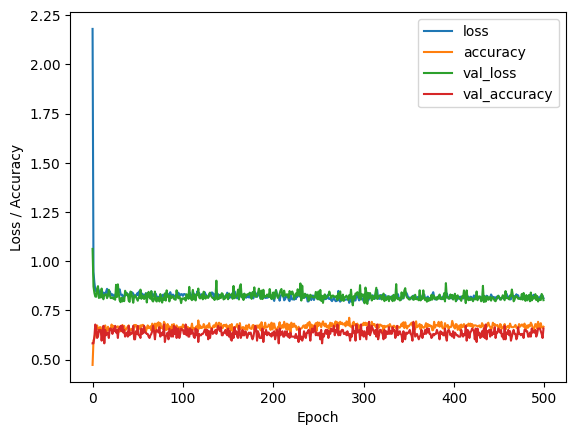


 ########## Result for Training data ########## 

log_loss:    0.7812
accuracy:    0.6781 

              precision    recall  f1-score   support

     class 1       0.67      0.94      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.69      0.37      0.49       139

    accuracy                           0.68       438
   macro avg       0.46      0.44      0.42       438
weighted avg       0.62      0.68      0.62       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


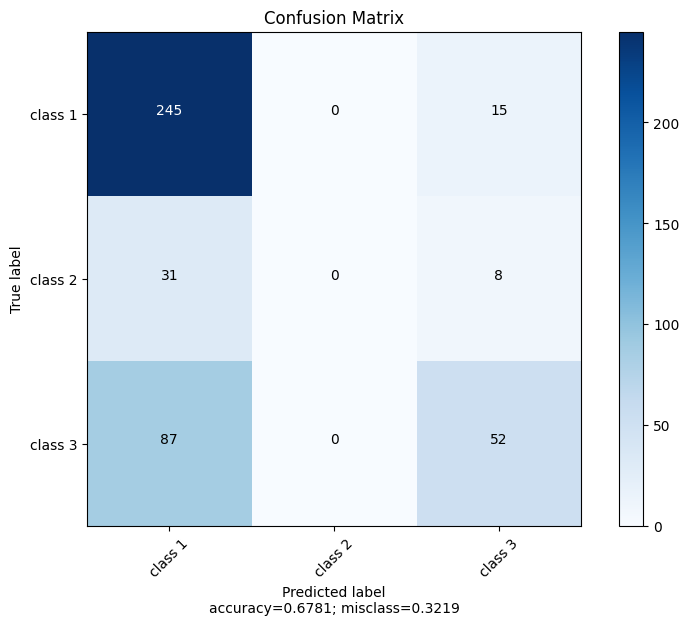


 ########## Result for Validation data ########## 

log_loss:    0.7881
accuracy:    0.6575 

              precision    recall  f1-score   support

     class 1       0.66      0.92      0.76        85
     class 2       0.00      0.00      0.00         9
     class 3       0.67      0.35      0.46        52

    accuracy                           0.66       146
   macro avg       0.44      0.42      0.41       146
weighted avg       0.62      0.66      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


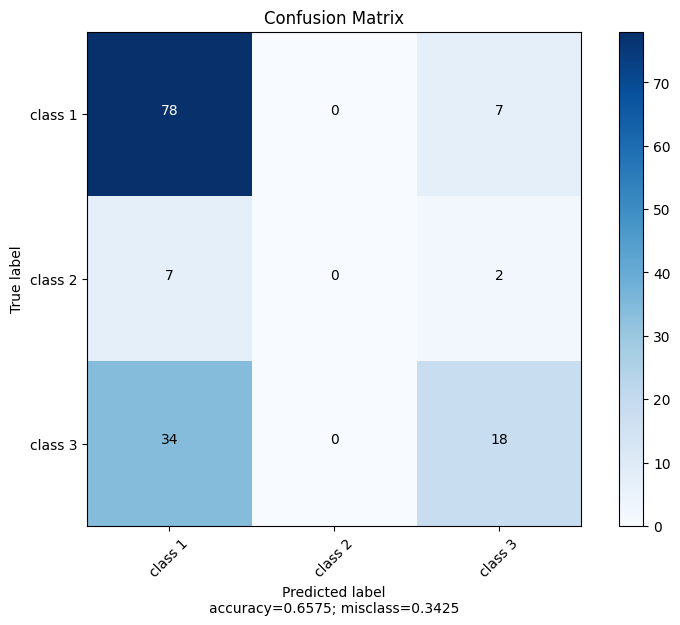


 ########## Result for Test data ########## 

log_loss:    0.8539
accuracy:    0.6051 

              precision    recall  f1-score   support

     class 1       0.62      0.89      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.52      0.25      0.34        64

    accuracy                           0.61       195
   macro avg       0.38      0.38      0.36       195
weighted avg       0.54      0.61      0.54       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


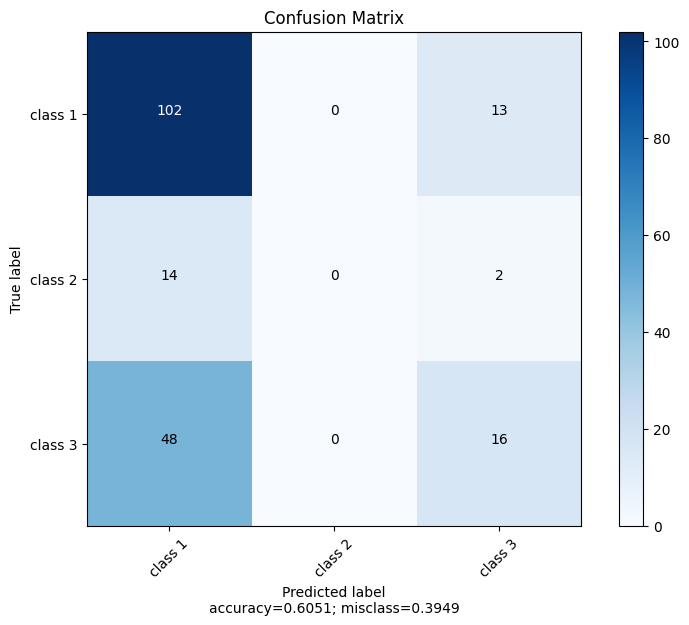

LR 0.3 18
n_nodes = 18 lambd = 0.3
Model: "model_98"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_225 (Dense)           (None, 18)                180       
                                                                 
 dropout_125 (Dropout)       (None, 18)                0         
                                                                 
 dense_226 (Dense)           (None, 3)                 57        
                                                                 
Total params: 237 (948.00 Byte)
Trainable params: 237 (948.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


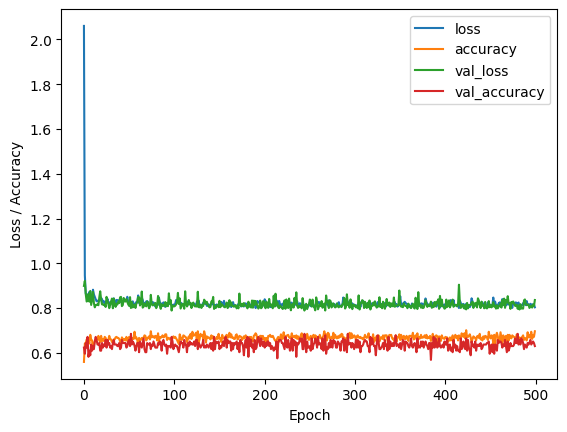


 ########## Result for Training data ########## 

log_loss:    0.7941
accuracy:    0.6712 

              precision    recall  f1-score   support

     class 1       0.66      0.95      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.73      0.33      0.46       139

    accuracy                           0.67       438
   macro avg       0.46      0.43      0.41       438
weighted avg       0.62      0.67      0.61       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


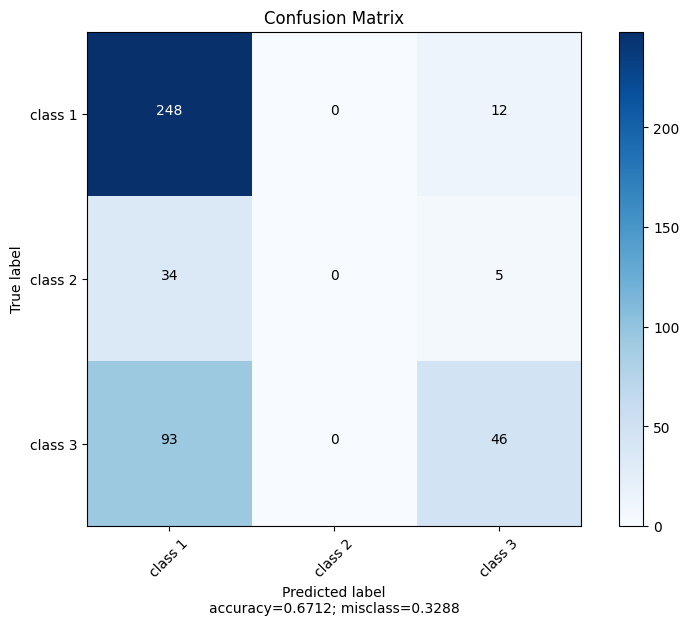


 ########## Result for Validation data ########## 

log_loss:    0.8245
accuracy:    0.6301 

              precision    recall  f1-score   support

     class 1       0.64      0.92      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.58      0.27      0.37        52

    accuracy                           0.63       146
   macro avg       0.41      0.40      0.37       146
weighted avg       0.58      0.63      0.57       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


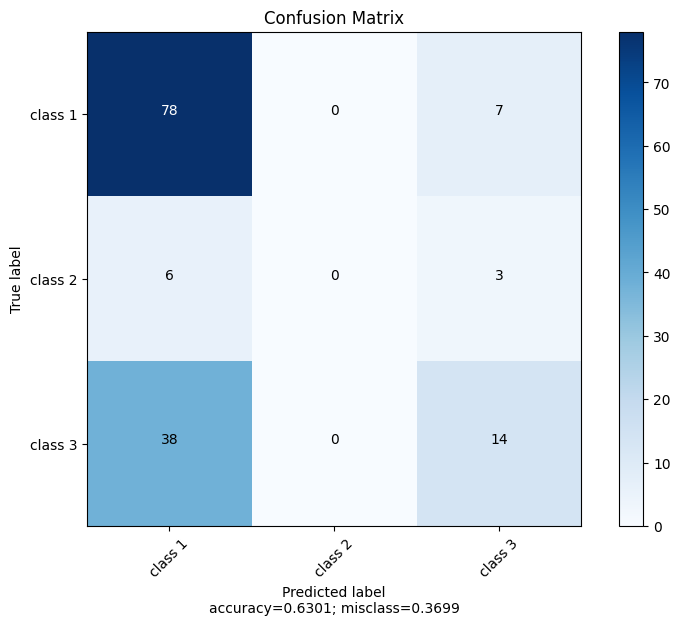


 ########## Result for Test data ########## 

log_loss:    0.8589
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.62      0.92      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.56      0.22      0.31        64

    accuracy                           0.62       195
   macro avg       0.39      0.38      0.35       195
weighted avg       0.55      0.62      0.54       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


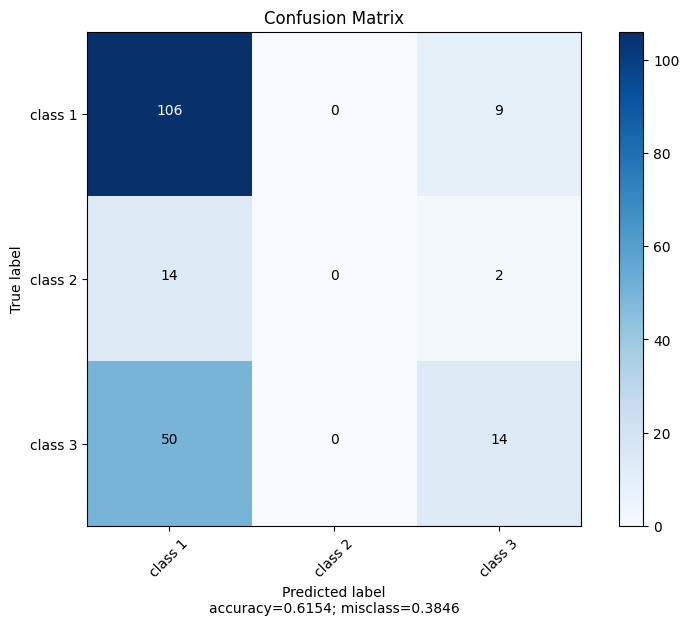

LR 0.3 43
n_nodes = 43 lambd = 0.3
Model: "model_99"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_227 (Dense)           (None, 43)                430       
                                                                 
 dropout_126 (Dropout)       (None, 43)                0         
                                                                 
 dense_228 (Dense)           (None, 3)                 132       
                                                                 
Total params: 562 (2.20 KB)
Trainable params: 562 (2.20 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


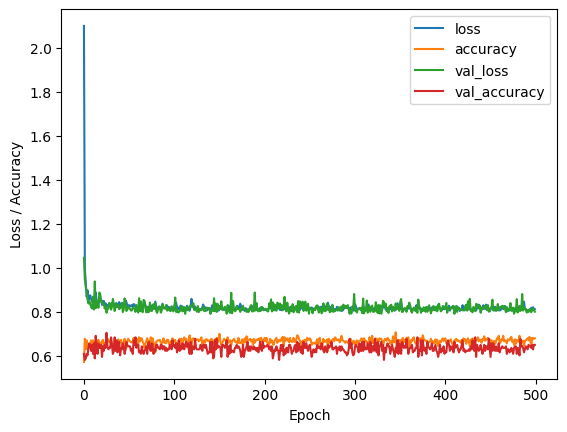


 ########## Result for Training data ########## 

log_loss:    0.7782
accuracy:    0.6826 

              precision    recall  f1-score   support

     class 1       0.68      0.92      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.43      0.53       139

    accuracy                           0.68       438
   macro avg       0.45      0.45      0.44       438
weighted avg       0.62      0.68      0.63       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


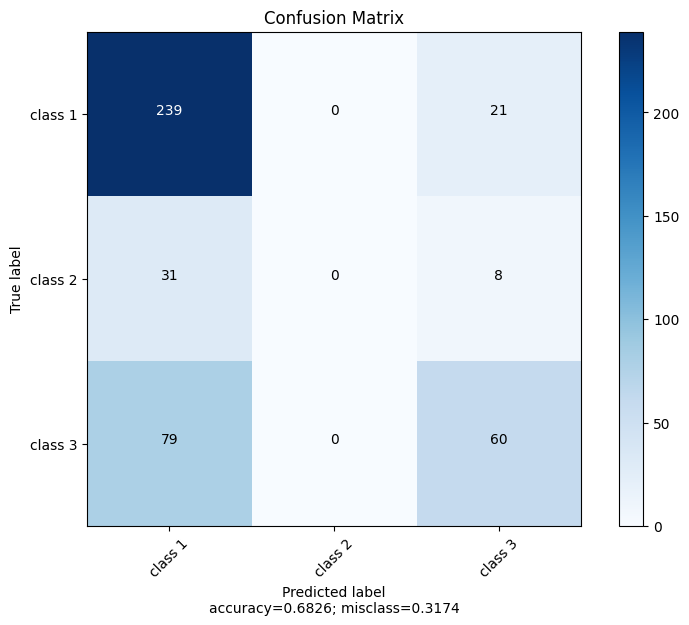


 ########## Result for Validation data ########## 

log_loss:    0.7853
accuracy:    0.6507 

              precision    recall  f1-score   support

     class 1       0.65      0.87      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.64      0.40      0.49        52

    accuracy                           0.65       146
   macro avg       0.43      0.42      0.41       146
weighted avg       0.61      0.65      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


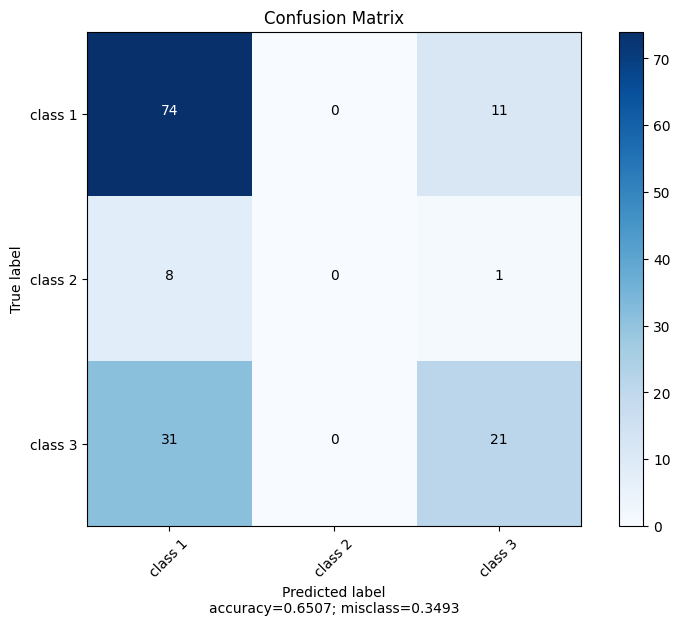


 ########## Result for Test data ########## 

log_loss:    0.8415
accuracy:    0.6051 

              precision    recall  f1-score   support

     class 1       0.62      0.87      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.51      0.28      0.36        64

    accuracy                           0.61       195
   macro avg       0.38      0.38      0.36       195
weighted avg       0.54      0.61      0.55       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


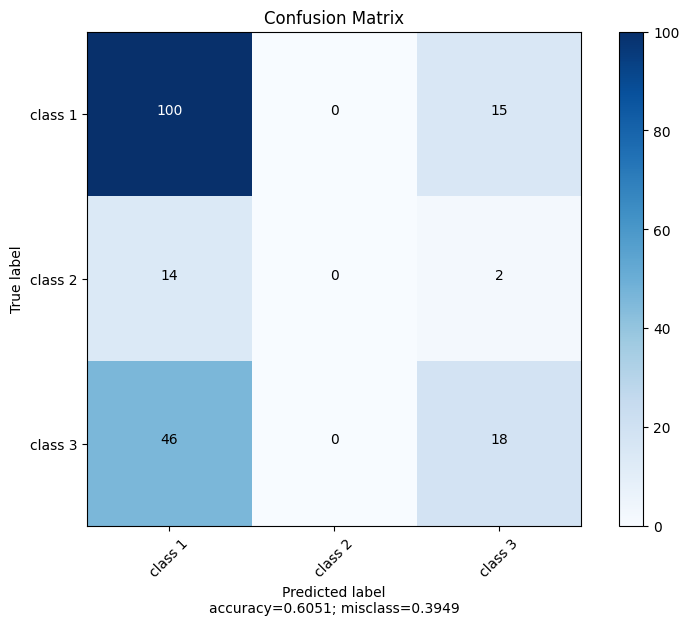

LR 0.3 13
n_nodes = 13 lambd = 0.3
Model: "model_100"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_229 (Dense)           (None, 13)                130       
                                                                 
 dropout_127 (Dropout)       (None, 13)                0         
                                                                 
 dense_230 (Dense)           (None, 3)                 42        
                                                                 
Total params: 172 (688.00 Byte)
Trainable params: 172 (688.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


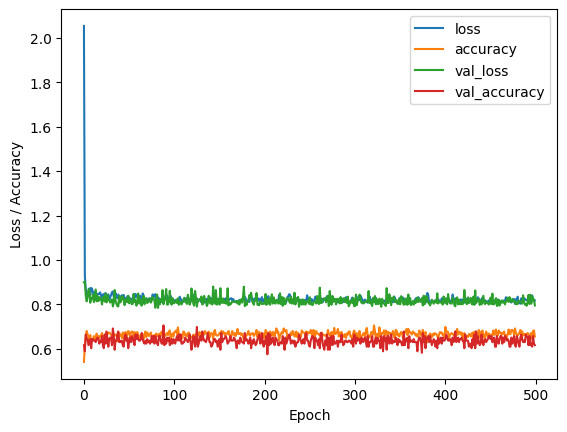


 ########## Result for Training data ########## 

log_loss:    0.7909
accuracy:    0.6872 

              precision    recall  f1-score   support

     class 1       0.71      0.88      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.62      0.51      0.56       139

    accuracy                           0.69       438
   macro avg       0.44      0.47      0.45       438
weighted avg       0.62      0.69      0.65       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


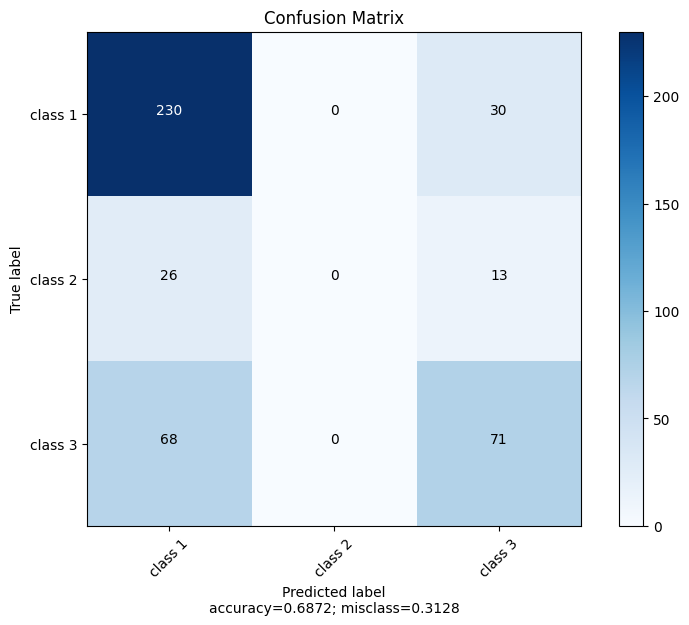


 ########## Result for Validation data ########## 

log_loss:    0.7810
accuracy:    0.6164 

              precision    recall  f1-score   support

     class 1       0.68      0.76      0.72        85
     class 2       0.00      0.00      0.00         9
     class 3       0.49      0.48      0.49        52

    accuracy                           0.62       146
   macro avg       0.39      0.42      0.40       146
weighted avg       0.57      0.62      0.59       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


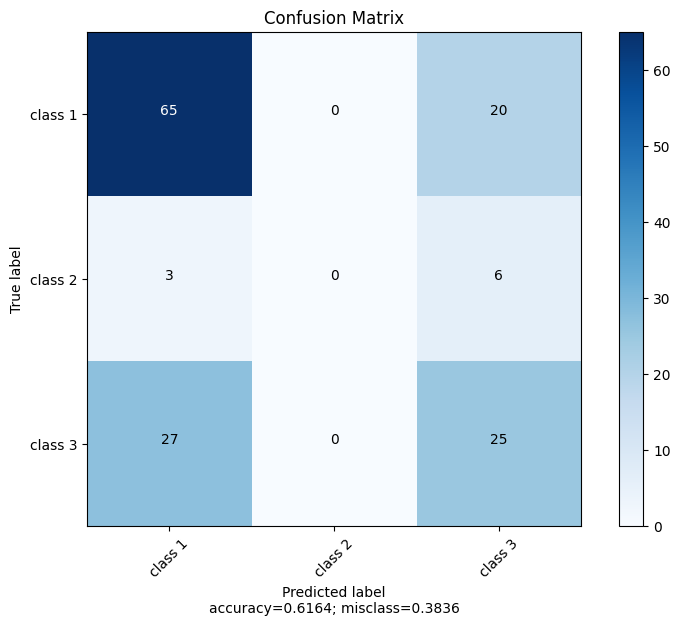


 ########## Result for Test data ########## 

log_loss:    0.8503
accuracy:    0.6256 

              precision    recall  f1-score   support

     class 1       0.68      0.83      0.75       115
     class 2       0.00      0.00      0.00        16
     class 3       0.49      0.41      0.44        64

    accuracy                           0.63       195
   macro avg       0.39      0.41      0.40       195
weighted avg       0.56      0.63      0.59       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


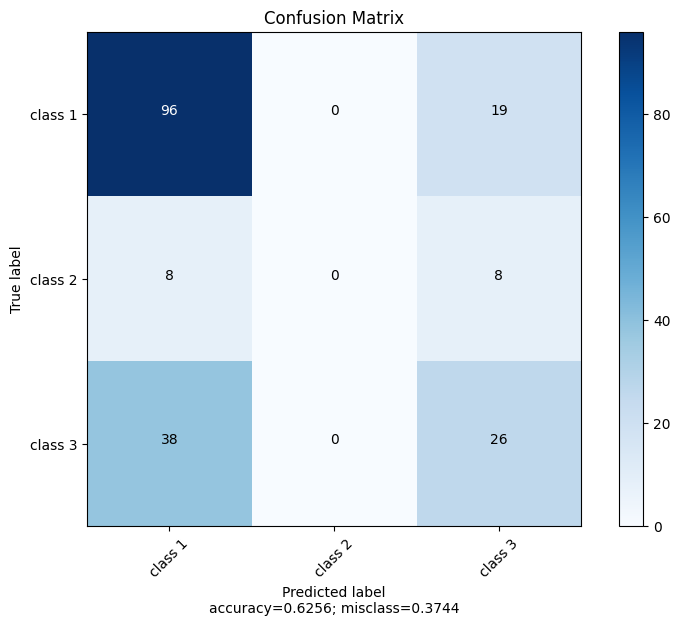

LR 0.3 44
n_nodes = 44 lambd = 0.3
Model: "model_101"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_231 (Dense)           (None, 44)                440       
                                                                 
 dropout_128 (Dropout)       (None, 44)                0         
                                                                 
 dense_232 (Dense)           (None, 3)                 135       
                                                                 
Total params: 575 (2.25 KB)
Trainable params: 575 (2.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


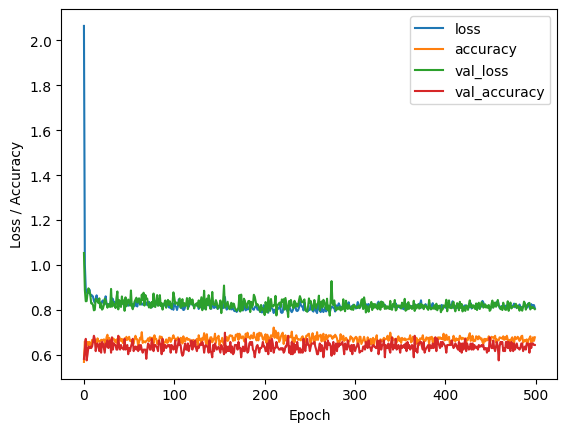


 ########## Result for Training data ########## 

log_loss:    0.7779
accuracy:    0.6826 

              precision    recall  f1-score   support

     class 1       0.68      0.92      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.43      0.53       139

    accuracy                           0.68       438
   macro avg       0.45      0.45      0.44       438
weighted avg       0.62      0.68      0.63       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


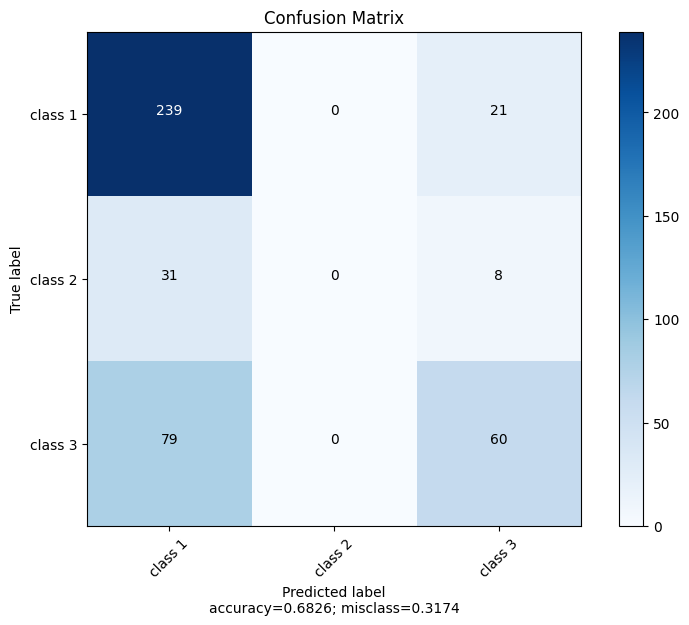


 ########## Result for Validation data ########## 

log_loss:    0.7874
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.66      0.86      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.58      0.40      0.48        52

    accuracy                           0.64       146
   macro avg       0.42      0.42      0.41       146
weighted avg       0.59      0.64      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


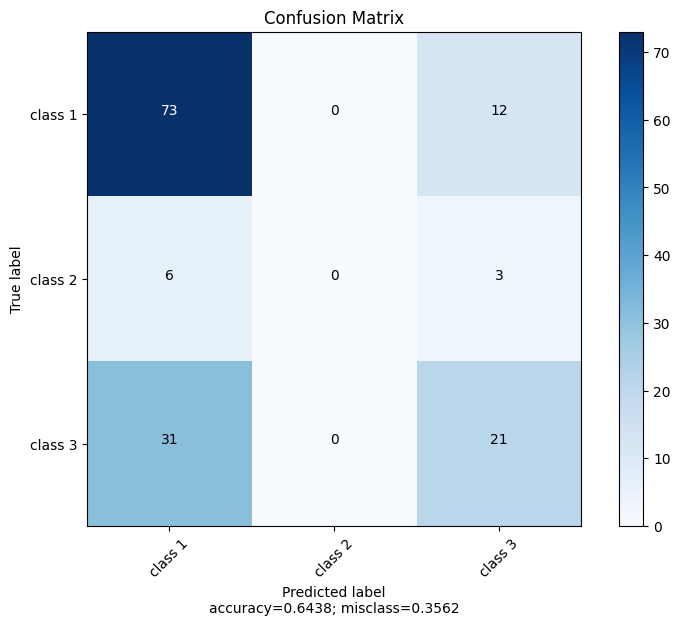


 ########## Result for Test data ########## 

log_loss:    0.8447
accuracy:    0.6103 

              precision    recall  f1-score   support

     class 1       0.63      0.87      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.53      0.30      0.38        64

    accuracy                           0.61       195
   macro avg       0.39      0.39      0.37       195
weighted avg       0.54      0.61      0.56       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


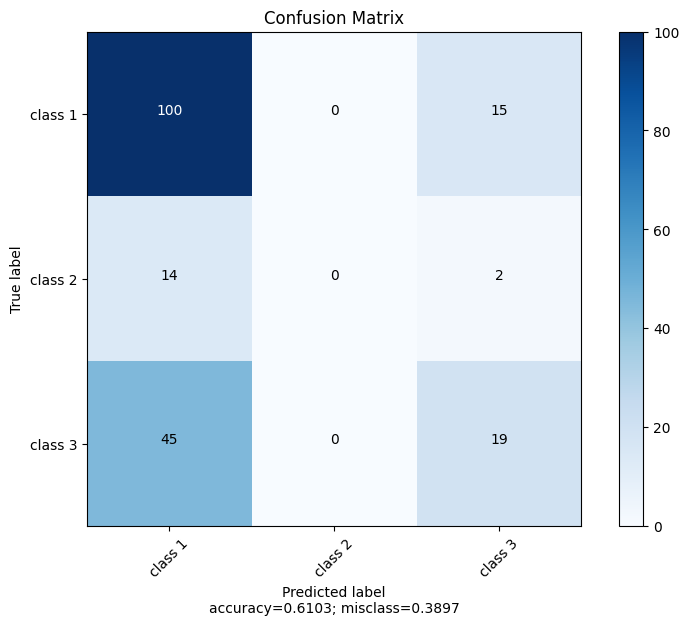

LR 0.3 47
n_nodes = 47 lambd = 0.3
Model: "model_102"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_233 (Dense)           (None, 47)                470       
                                                                 
 dropout_129 (Dropout)       (None, 47)                0         
                                                                 
 dense_234 (Dense)           (None, 3)                 144       
                                                                 
Total params: 614 (2.40 KB)
Trainable params: 614 (2.40 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


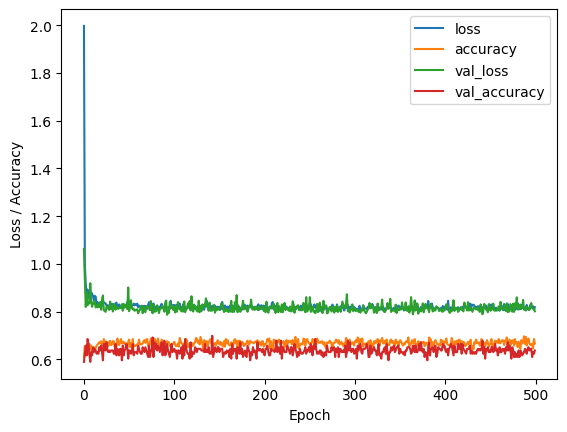


 ########## Result for Training data ########## 

log_loss:    0.7795
accuracy:    0.6804 

              precision    recall  f1-score   support

     class 1       0.68      0.93      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.68      0.40      0.51       139

    accuracy                           0.68       438
   macro avg       0.45      0.44      0.43       438
weighted avg       0.62      0.68      0.63       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


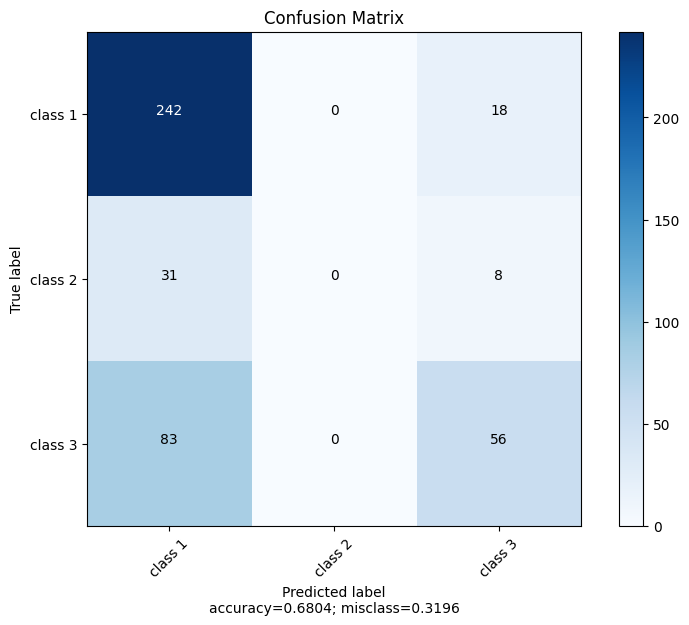


 ########## Result for Validation data ########## 

log_loss:    0.7875
accuracy:    0.6370 

              precision    recall  f1-score   support

     class 1       0.65      0.87      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.58      0.37      0.45        52

    accuracy                           0.64       146
   macro avg       0.41      0.41      0.40       146
weighted avg       0.59      0.64      0.59       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


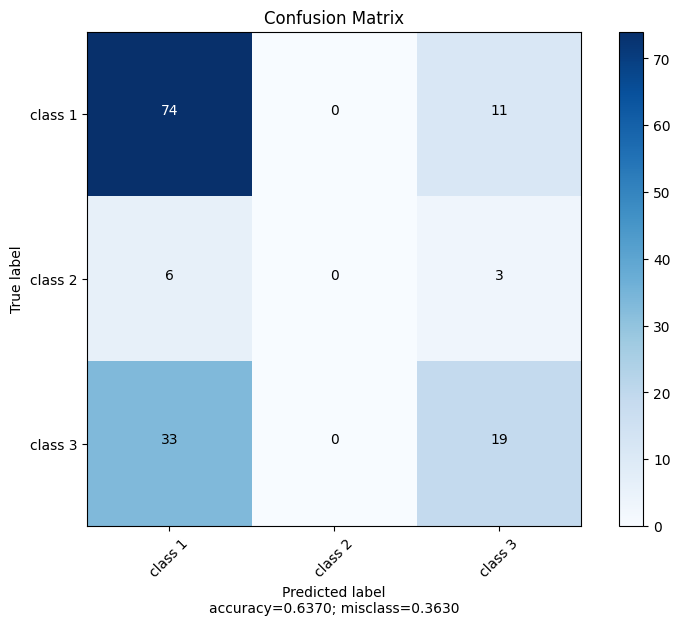


 ########## Result for Test data ########## 

log_loss:    0.8364
accuracy:    0.6256 

              precision    recall  f1-score   support

     class 1       0.64      0.90      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.58      0.30      0.39        64

    accuracy                           0.63       195
   macro avg       0.40      0.40      0.38       195
weighted avg       0.56      0.63      0.57       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


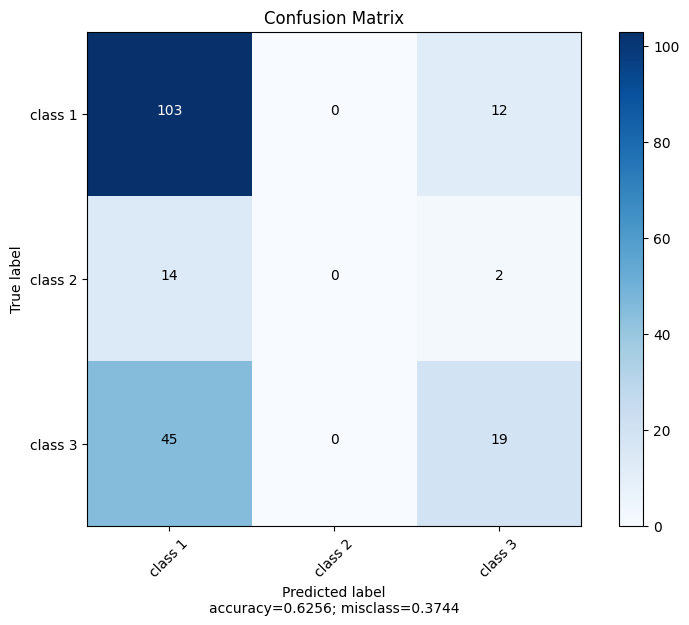

LR 0.3 14
n_nodes = 14 lambd = 0.3
Model: "model_103"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_235 (Dense)           (None, 14)                140       
                                                                 
 dropout_130 (Dropout)       (None, 14)                0         
                                                                 
 dense_236 (Dense)           (None, 3)                 45        
                                                                 
Total params: 185 (740.00 Byte)
Trainable params: 185 (740.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


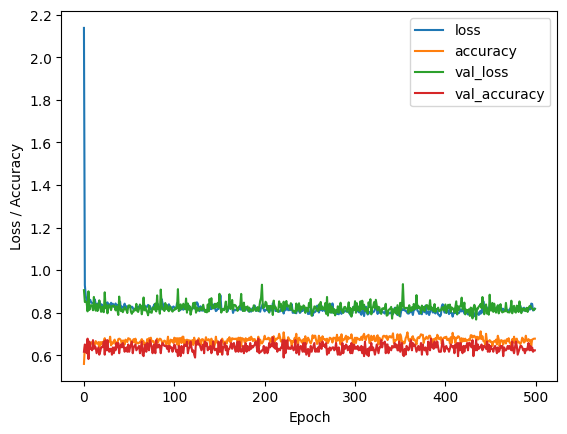


 ########## Result for Training data ########## 

log_loss:    0.7825
accuracy:    0.6758 

              precision    recall  f1-score   support

     class 1       0.68      0.91      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.65      0.43      0.52       139

    accuracy                           0.68       438
   macro avg       0.44      0.45      0.43       438
weighted avg       0.61      0.68      0.63       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


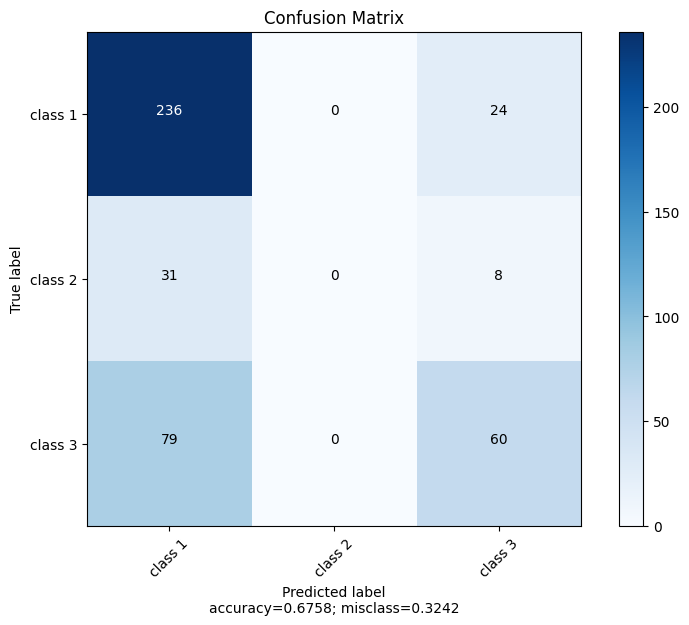


 ########## Result for Validation data ########## 

log_loss:    0.8017
accuracy:    0.6233 

              precision    recall  f1-score   support

     class 1       0.65      0.86      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.55      0.35      0.42        52

    accuracy                           0.62       146
   macro avg       0.40      0.40      0.39       146
weighted avg       0.57      0.62      0.58       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


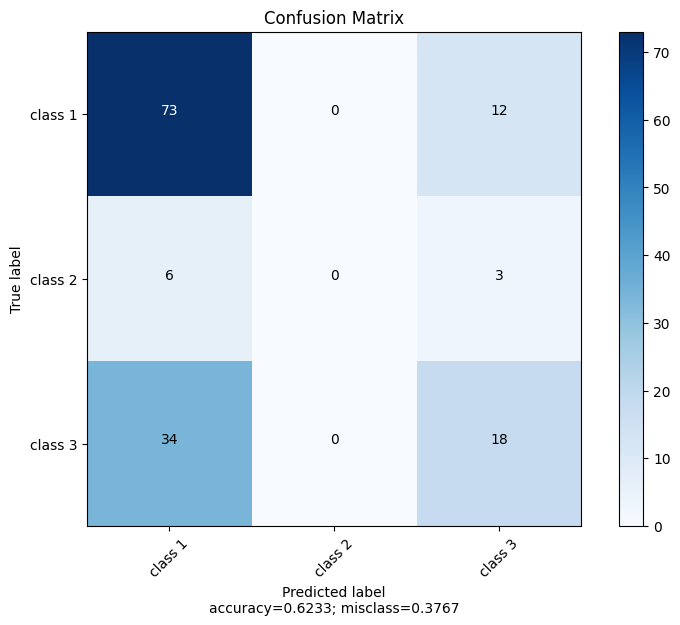


 ########## Result for Test data ########## 

log_loss:    0.8662
accuracy:    0.5949 

              precision    recall  f1-score   support

     class 1       0.62      0.86      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.49      0.27      0.34        64

    accuracy                           0.59       195
   macro avg       0.37      0.38      0.35       195
weighted avg       0.52      0.59      0.54       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


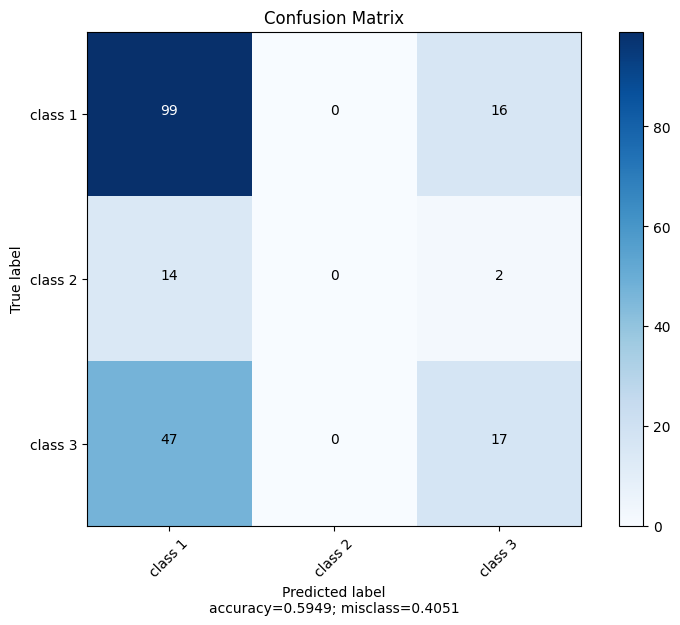

LR 0.3 15
n_nodes = 15 lambd = 0.3
Model: "model_104"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_237 (Dense)           (None, 15)                150       
                                                                 
 dropout_131 (Dropout)       (None, 15)                0         
                                                                 
 dense_238 (Dense)           (None, 3)                 48        
                                                                 
Total params: 198 (792.00 Byte)
Trainable params: 198 (792.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


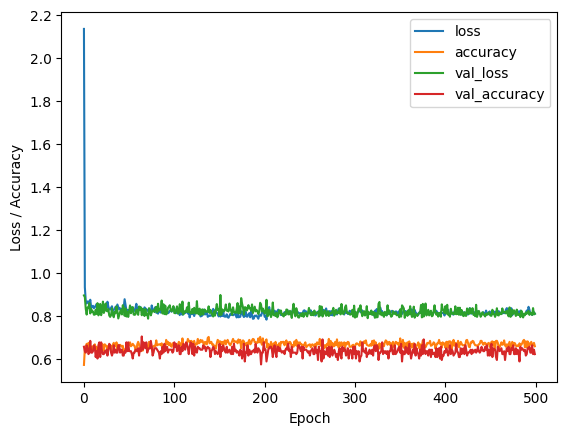


 ########## Result for Training data ########## 

log_loss:    0.7830
accuracy:    0.6872 

              precision    recall  f1-score   support

     class 1       0.71      0.87      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.63      0.54      0.58       139

    accuracy                           0.69       438
   macro avg       0.45      0.47      0.45       438
weighted avg       0.62      0.69      0.65       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


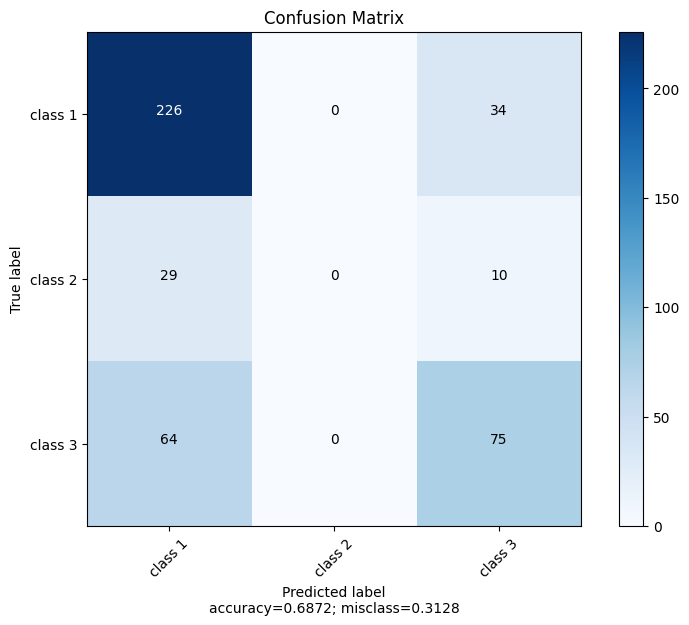


 ########## Result for Validation data ########## 

log_loss:    0.7952
accuracy:    0.6233 

              precision    recall  f1-score   support

     class 1       0.68      0.79      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.51      0.46      0.48        52

    accuracy                           0.62       146
   macro avg       0.40      0.42      0.40       146
weighted avg       0.58      0.62      0.60       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


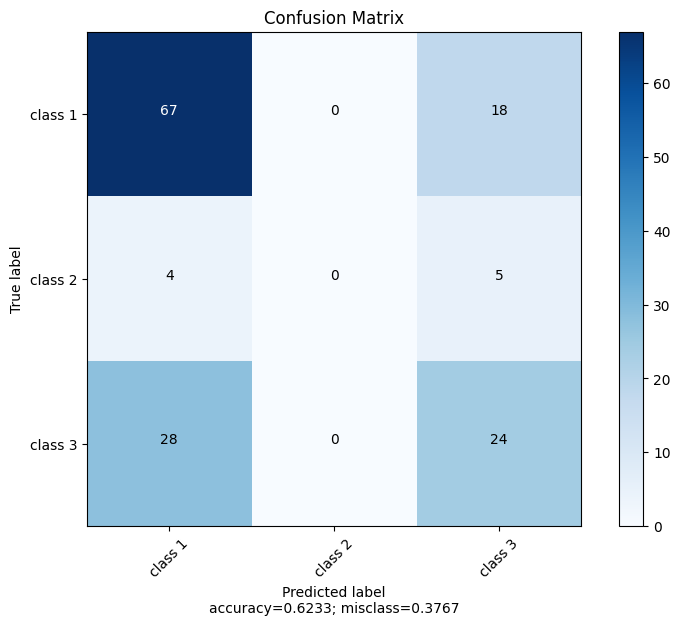


 ########## Result for Test data ########## 

log_loss:    0.8471
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.65      0.82      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.52      0.41      0.46        64

    accuracy                           0.62       195
   macro avg       0.39      0.41      0.39       195
weighted avg       0.55      0.62      0.58       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


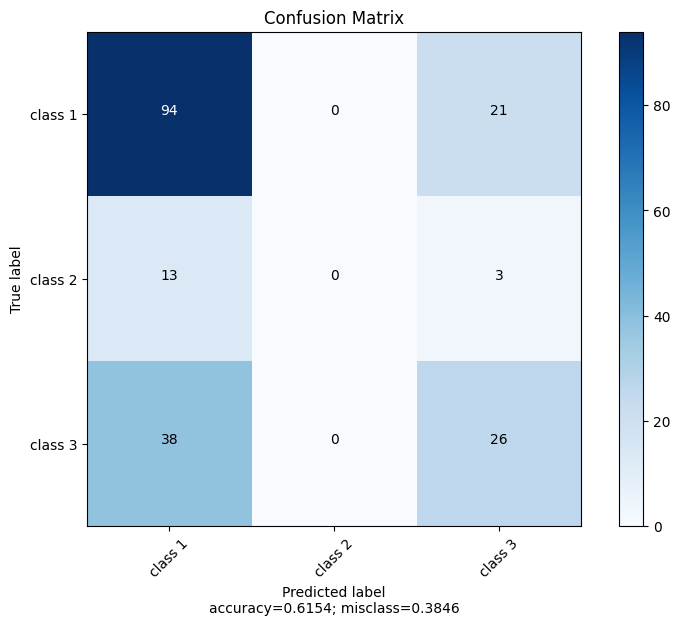

LR 0.3 38
n_nodes = 38 lambd = 0.3
Model: "model_105"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_239 (Dense)           (None, 38)                380       
                                                                 
 dropout_132 (Dropout)       (None, 38)                0         
                                                                 
 dense_240 (Dense)           (None, 3)                 117       
                                                                 
Total params: 497 (1.94 KB)
Trainable params: 497 (1.94 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


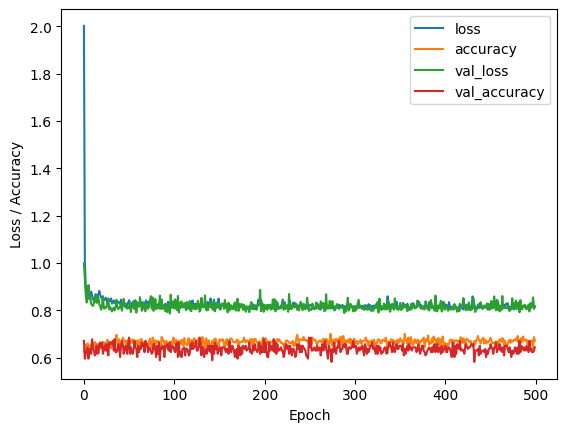


 ########## Result for Training data ########## 

log_loss:    0.7901
accuracy:    0.6667 

              precision    recall  f1-score   support

     class 1       0.66      0.95      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.73      0.32      0.44       139

    accuracy                           0.67       438
   macro avg       0.46      0.42      0.41       438
weighted avg       0.62      0.67      0.60       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


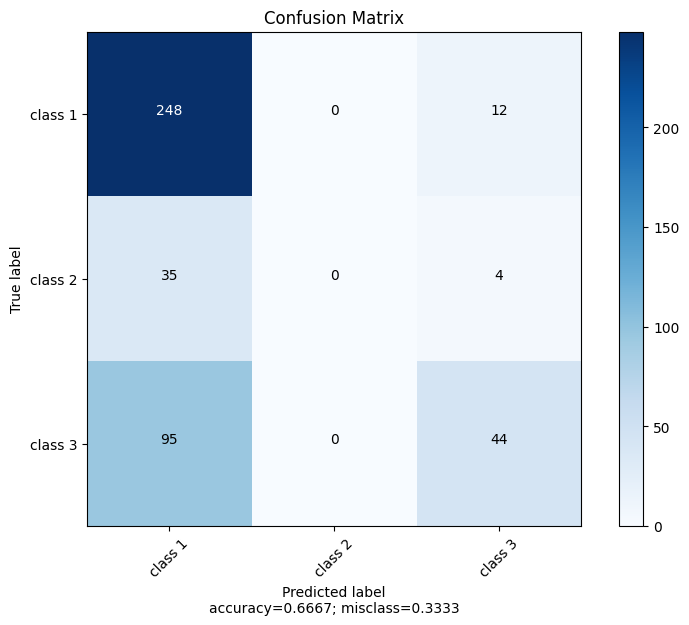


 ########## Result for Validation data ########## 

log_loss:    0.8030
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.64      0.91      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.65      0.33      0.44        52

    accuracy                           0.64       146
   macro avg       0.43      0.41      0.40       146
weighted avg       0.61      0.64      0.59       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


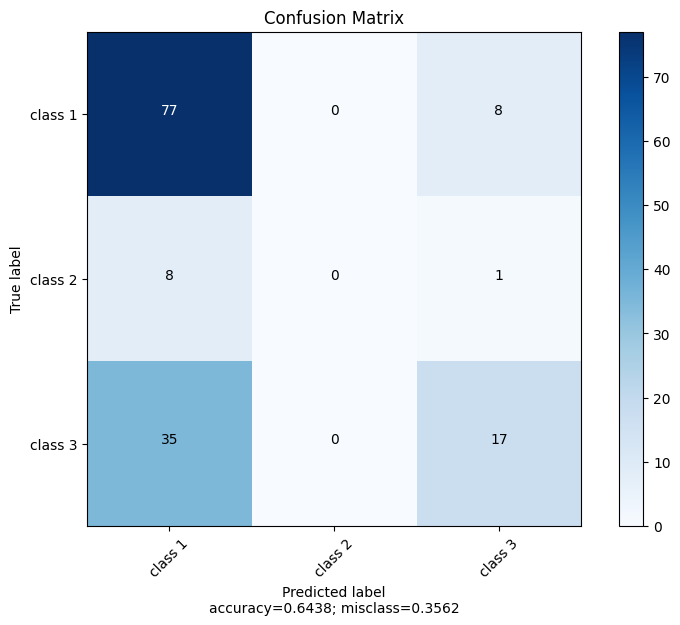


 ########## Result for Test data ########## 

log_loss:    0.8548
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.62      0.93      0.75       115
     class 2       0.00      0.00      0.00        16
     class 3       0.57      0.20      0.30        64

    accuracy                           0.62       195
   macro avg       0.40      0.38      0.35       195
weighted avg       0.55      0.62      0.54       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


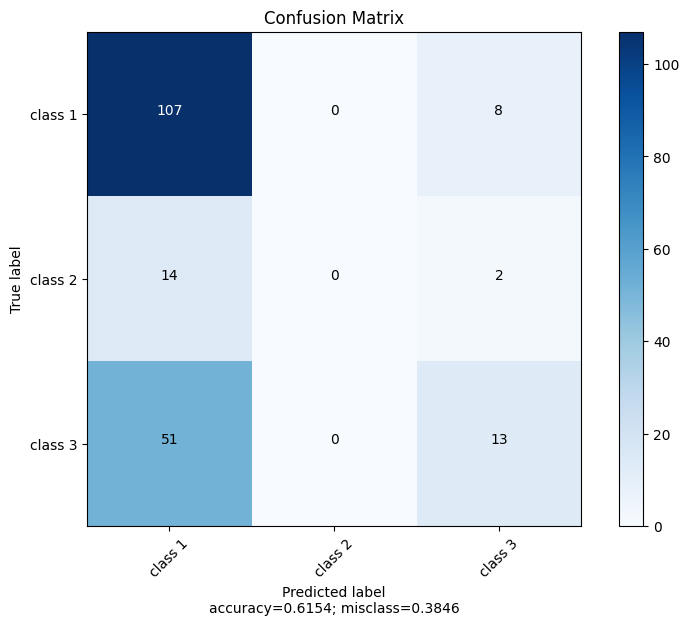

LR 0.3 24
n_nodes = 24 lambd = 0.3
Model: "model_106"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_241 (Dense)           (None, 24)                240       
                                                                 
 dropout_133 (Dropout)       (None, 24)                0         
                                                                 
 dense_242 (Dense)           (None, 3)                 75        
                                                                 
Total params: 315 (1.23 KB)
Trainable params: 315 (1.23 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


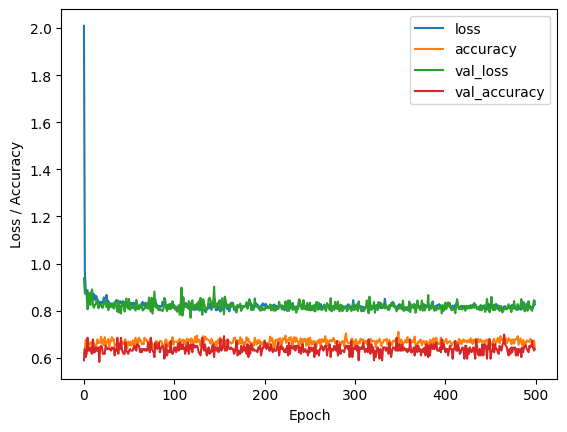


 ########## Result for Training data ########## 

log_loss:    0.7894
accuracy:    0.6621 

              precision    recall  f1-score   support

     class 1       0.65      0.95      0.77       260
     class 2       0.00      0.00      0.00        39
     class 3       0.72      0.31      0.43       139

    accuracy                           0.66       438
   macro avg       0.46      0.42      0.40       438
weighted avg       0.62      0.66      0.60       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


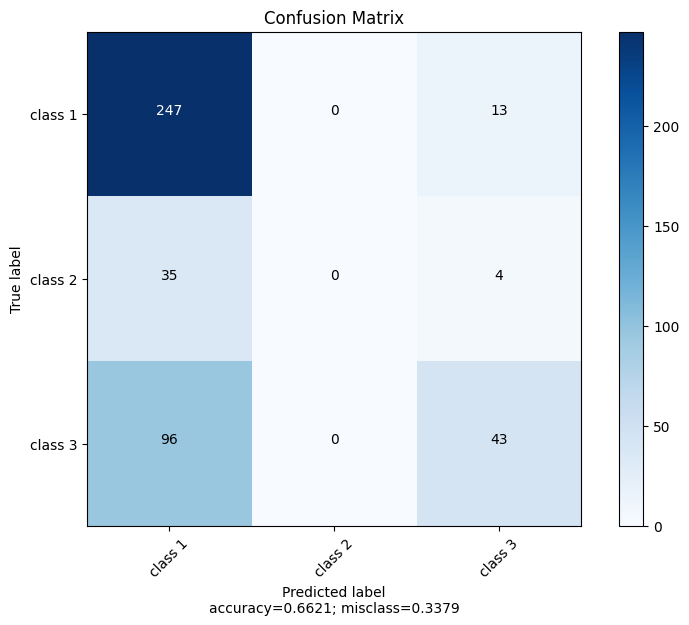


 ########## Result for Validation data ########## 

log_loss:    0.8117
accuracy:    0.6370 

              precision    recall  f1-score   support

     class 1       0.64      0.93      0.76        85
     class 2       0.00      0.00      0.00         9
     class 3       0.61      0.27      0.37        52

    accuracy                           0.64       146
   macro avg       0.42      0.40      0.38       146
weighted avg       0.59      0.64      0.58       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


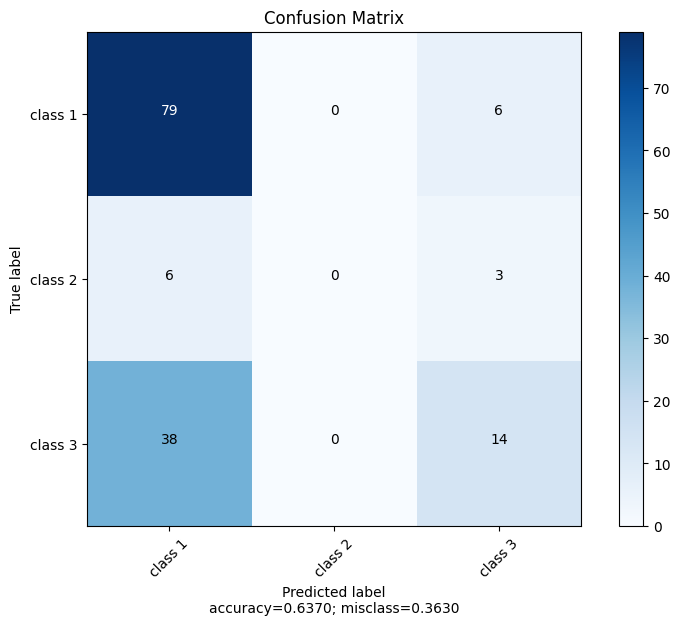


 ########## Result for Test data ########## 

log_loss:    0.8568
accuracy:    0.6103 

              precision    recall  f1-score   support

     class 1       0.62      0.93      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.55      0.19      0.28        64

    accuracy                           0.61       195
   macro avg       0.39      0.37      0.34       195
weighted avg       0.54      0.61      0.53       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


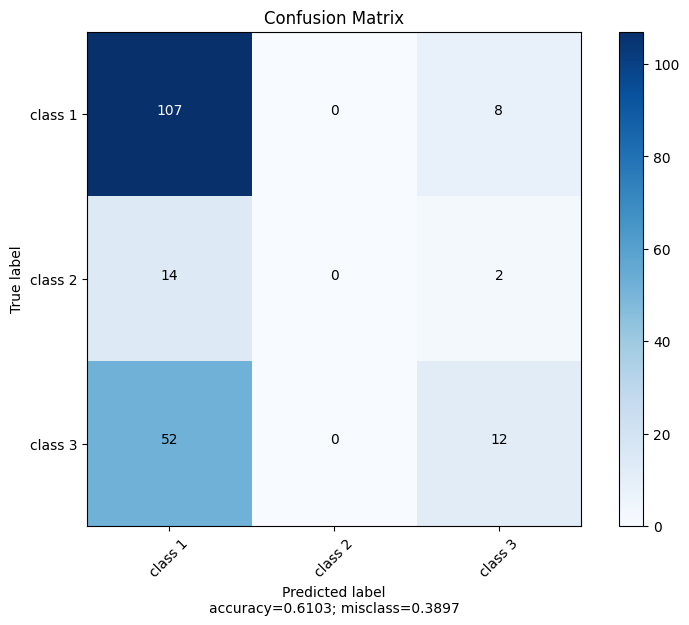

LR 0.3 1
n_nodes = 1 lambd = 0.3
Model: "model_107"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_243 (Dense)           (None, 1)                 10        
                                                                 
 dropout_134 (Dropout)       (None, 1)                 0         
                                                                 
 dense_244 (Dense)           (None, 3)                 6         
                                                                 
Total params: 16 (64.00 Byte)
Trainable params: 16 (64.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


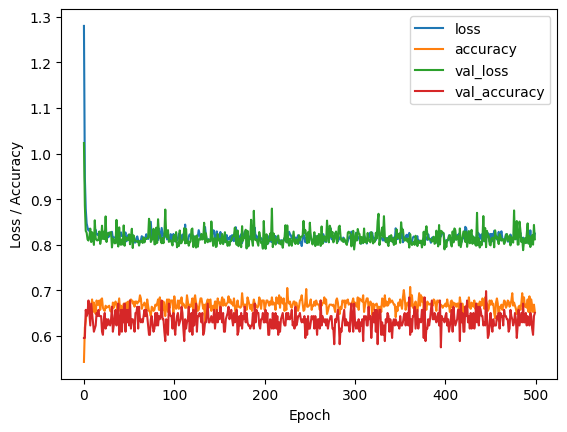


 ########## Result for Training data ########## 

log_loss:    0.7966
accuracy:    0.6621 

              precision    recall  f1-score   support

     class 1       0.65      0.96      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.73      0.29      0.41       139

    accuracy                           0.66       438
   macro avg       0.46      0.42      0.40       438
weighted avg       0.62      0.66      0.59       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


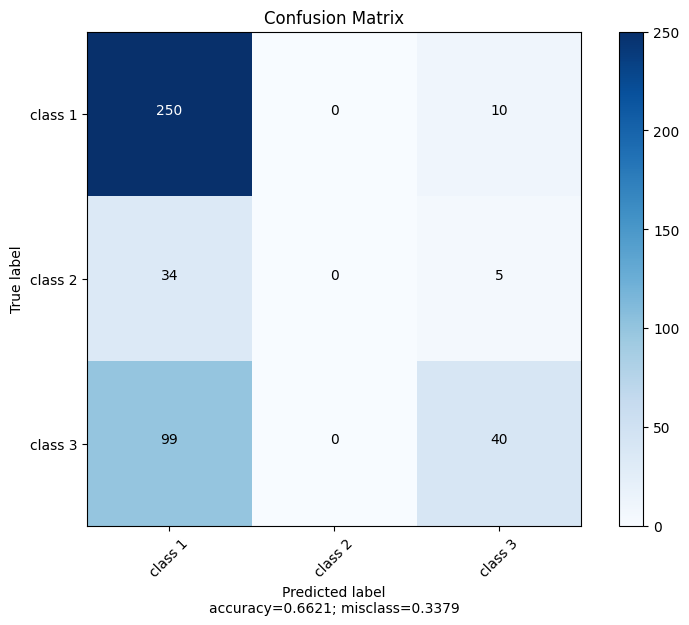


 ########## Result for Validation data ########## 

log_loss:    0.8010
accuracy:    0.6507 

              precision    recall  f1-score   support

     class 1       0.64      0.94      0.76        85
     class 2       0.00      0.00      0.00         9
     class 3       0.71      0.29      0.41        52

    accuracy                           0.65       146
   macro avg       0.45      0.41      0.39       146
weighted avg       0.63      0.65      0.59       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


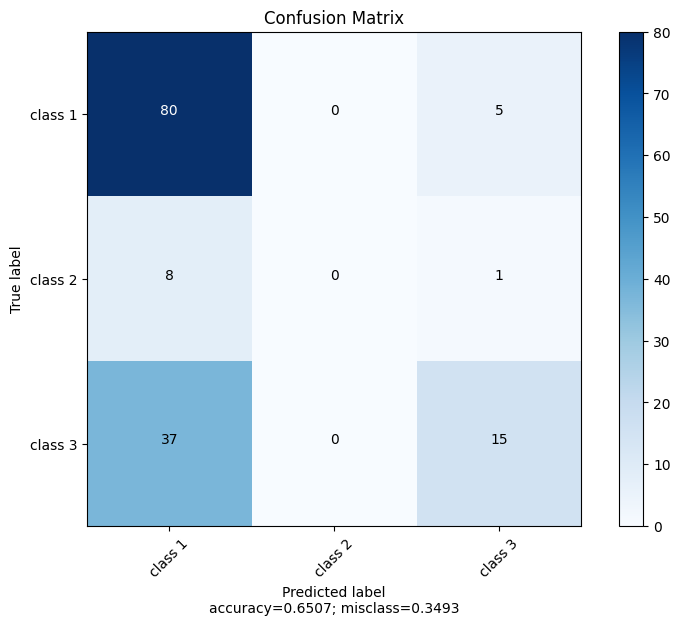


 ########## Result for Test data ########## 

log_loss:    0.8382
accuracy:    0.6000 

              precision    recall  f1-score   support

     class 1       0.61      0.91      0.73       115
     class 2       0.00      0.00      0.00        16
     class 3       0.52      0.19      0.28        64

    accuracy                           0.60       195
   macro avg       0.38      0.37      0.34       195
weighted avg       0.53      0.60      0.52       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


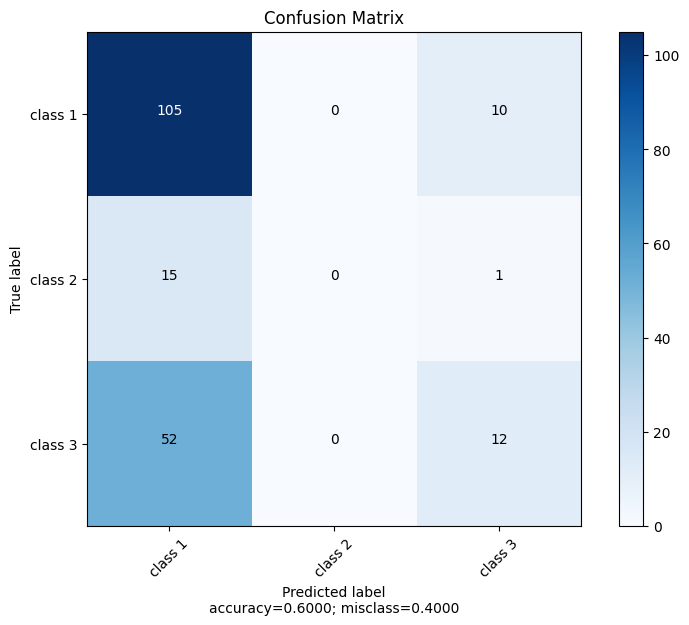

LR 0.3 50
n_nodes = 50 lambd = 0.3
Model: "model_108"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_245 (Dense)           (None, 50)                500       
                                                                 
 dropout_135 (Dropout)       (None, 50)                0         
                                                                 
 dense_246 (Dense)           (None, 3)                 153       
                                                                 
Total params: 653 (2.55 KB)
Trainable params: 653 (2.55 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


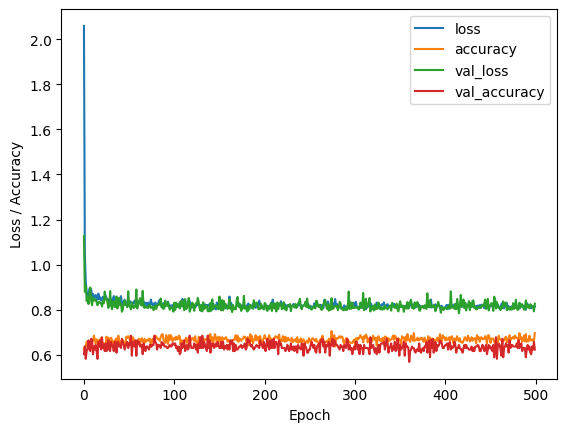


 ########## Result for Training data ########## 

log_loss:    0.7805
accuracy:    0.6689 



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

     class 1       0.67      0.93      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.67      0.37      0.48       139

    accuracy                           0.67       438
   macro avg       0.45      0.43      0.42       438
weighted avg       0.61      0.67      0.61       438



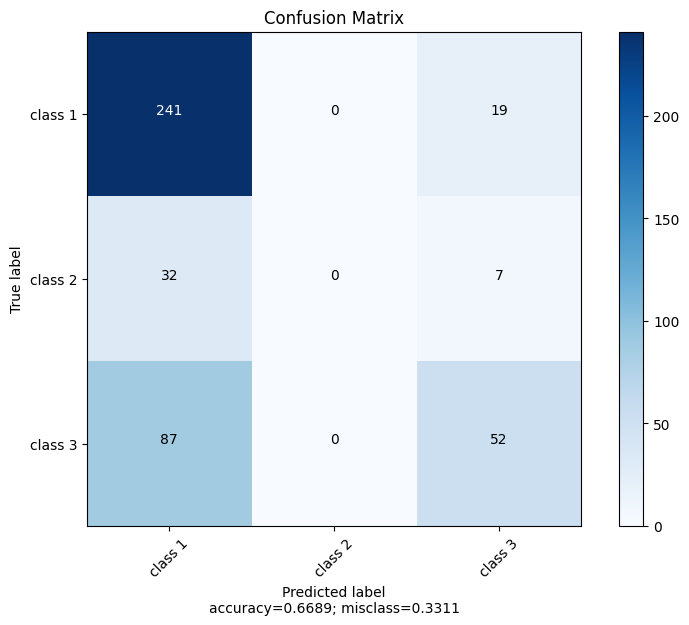


 ########## Result for Validation data ########## 

log_loss:    0.8091
accuracy:    0.6233 

              precision    recall  f1-score   support

     class 1       0.64      0.87      0.74        85
     class 2       0.00      0.00      0.00         9
     class 3       0.55      0.33      0.41        52

    accuracy                           0.62       146
   macro avg       0.40      0.40      0.38       146
weighted avg       0.57      0.62      0.58       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


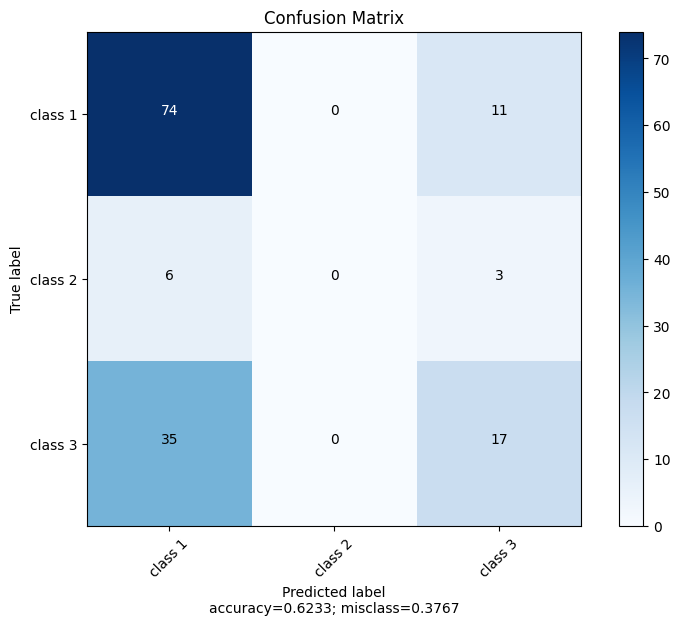


 ########## Result for Test data ########## 

log_loss:    0.8696
accuracy:    0.6000 

              precision    recall  f1-score   support

     class 1       0.62      0.87      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.50      0.27      0.35        64

    accuracy                           0.60       195
   macro avg       0.37      0.38      0.36       195
weighted avg       0.53      0.60      0.54       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


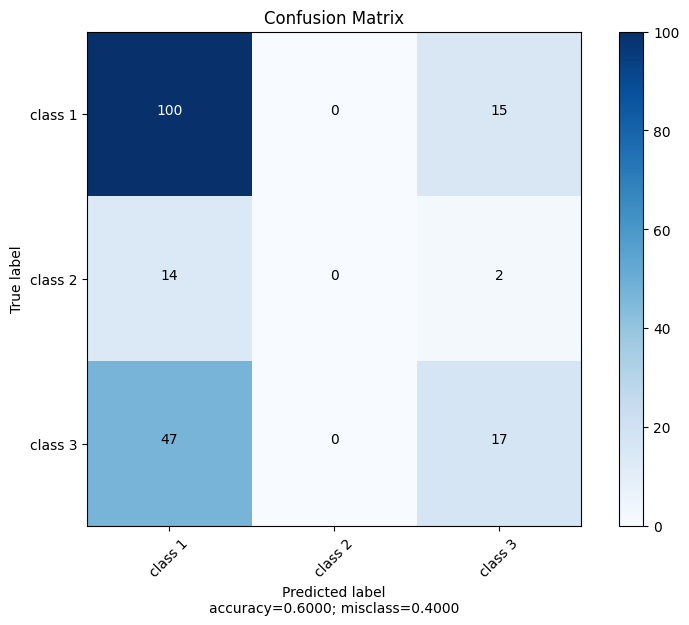

LR 1 16
n_nodes = 16 lambd = 1
Model: "model_109"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_247 (Dense)           (None, 16)                160       
                                                                 
 dropout_136 (Dropout)       (None, 16)                0         
                                                                 
 dense_248 (Dense)           (None, 3)                 51        
                                                                 
Total params: 211 (844.00 Byte)
Trainable params: 211 (844.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


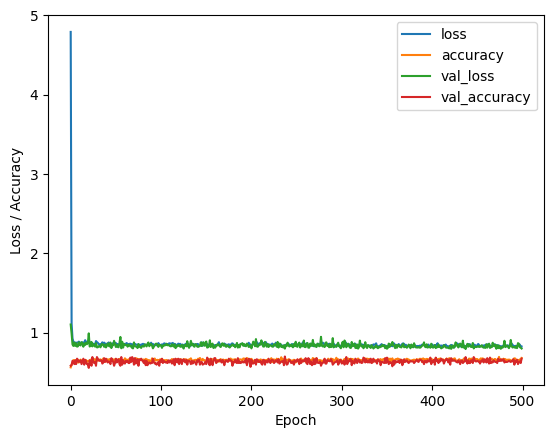


 ########## Result for Training data ########## 

log_loss:    0.7981
accuracy:    0.6735 

              precision    recall  f1-score   support

     class 1       0.68      0.92      0.78       260
     class 2       0.00      0.00      0.00        39
     class 3       0.66      0.40      0.50       139

    accuracy                           0.67       438
   macro avg       0.45      0.44      0.43       438
weighted avg       0.61      0.67      0.62       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


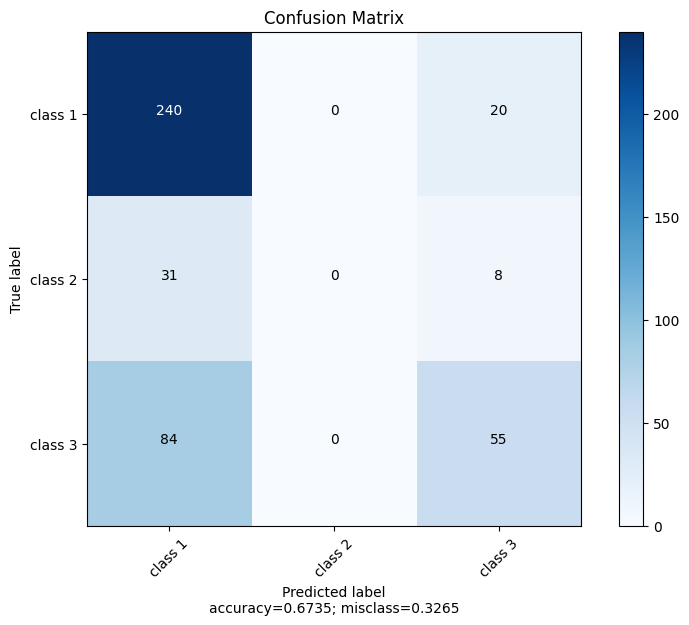


 ########## Result for Validation data ########## 

log_loss:    0.7809
accuracy:    0.6712 

              precision    recall  f1-score   support

     class 1       0.66      0.91      0.76        85
     class 2       0.00      0.00      0.00         9
     class 3       0.72      0.40      0.52        52

    accuracy                           0.67       146
   macro avg       0.46      0.44      0.43       146
weighted avg       0.64      0.67      0.63       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


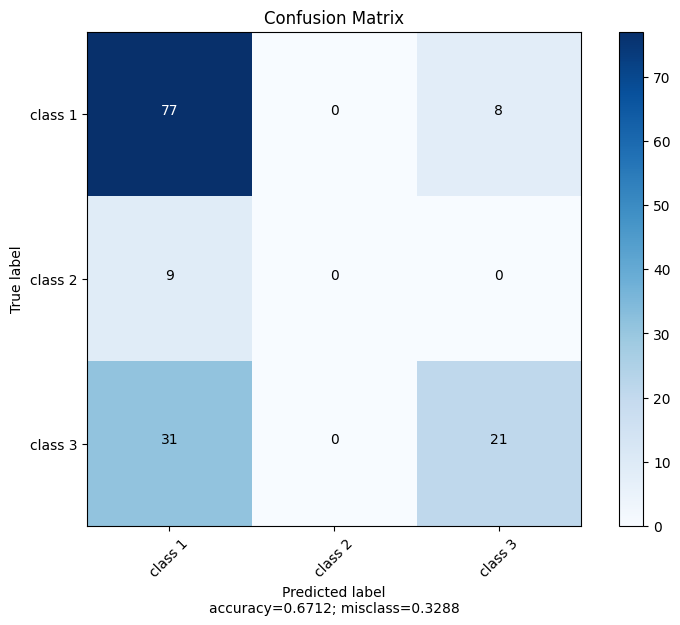


 ########## Result for Test data ########## 

log_loss:    0.8487
accuracy:    0.5897 

              precision    recall  f1-score   support

     class 1       0.62      0.84      0.71       115
     class 2       0.00      0.00      0.00        16
     class 3       0.47      0.28      0.35        64

    accuracy                           0.59       195
   macro avg       0.36      0.37      0.36       195
weighted avg       0.52      0.59      0.54       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


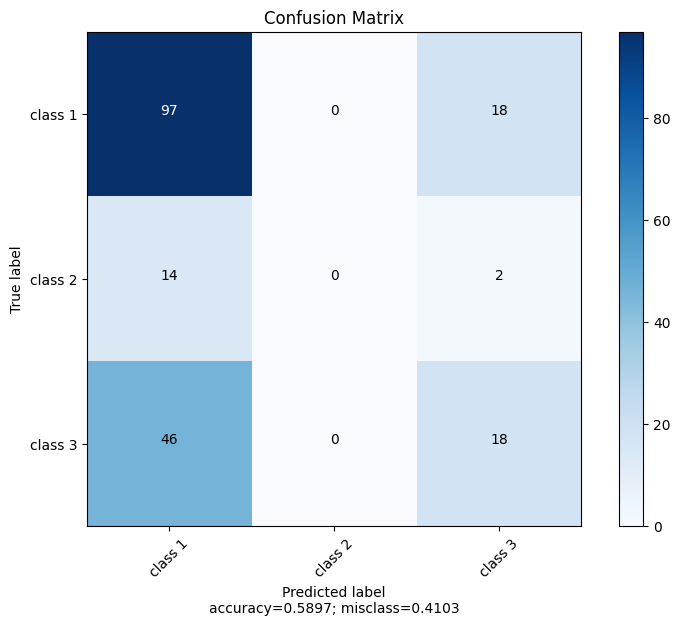

LR 1 9
n_nodes = 9 lambd = 1
Model: "model_110"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_249 (Dense)           (None, 9)                 90        
                                                                 
 dropout_137 (Dropout)       (None, 9)                 0         
                                                                 
 dense_250 (Dense)           (None, 3)                 30        
                                                                 
Total params: 120 (480.00 Byte)
Trainable params: 120 (480.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


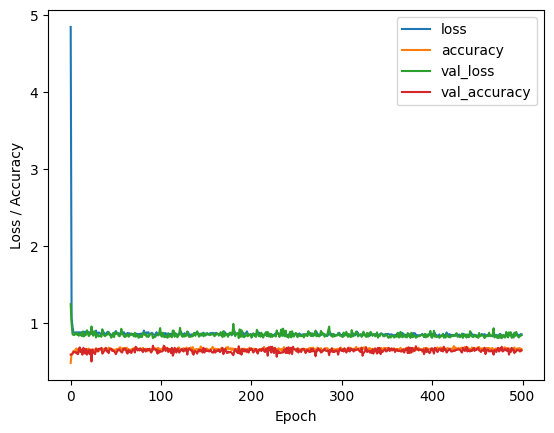


 ########## Result for Training data ########## 

log_loss:    0.8088
accuracy:    0.6461 

              precision    recall  f1-score   support

     class 1       0.68      0.84      0.75       260
     class 2       0.00      0.00      0.00        39
     class 3       0.55      0.47      0.50       139

    accuracy                           0.65       438
   macro avg       0.41      0.44      0.42       438
weighted avg       0.58      0.65      0.61       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


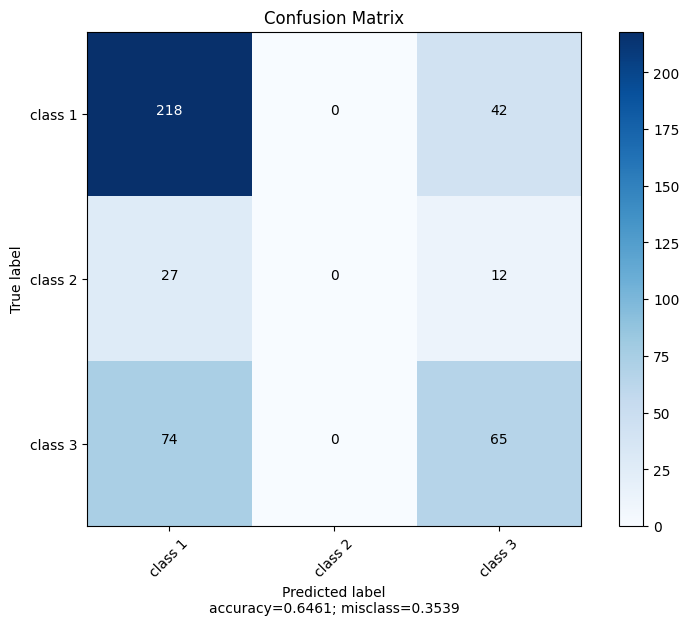


 ########## Result for Validation data ########## 

log_loss:    0.8038
accuracy:    0.6370 

              precision    recall  f1-score   support

     class 1       0.69      0.82      0.75        85
     class 2       0.00      0.00      0.00         9
     class 3       0.51      0.44      0.47        52

    accuracy                           0.64       146
   macro avg       0.40      0.42      0.41       146
weighted avg       0.59      0.64      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


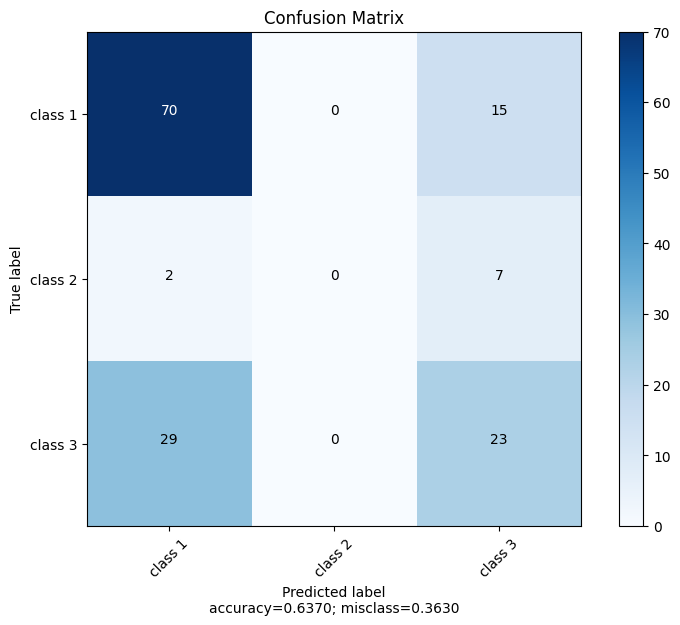


 ########## Result for Test data ########## 

log_loss:    0.8632
accuracy:    0.6000 

              precision    recall  f1-score   support

     class 1       0.66      0.83      0.74       115
     class 2       0.00      0.00      0.00        16
     class 3       0.43      0.33      0.37        64

    accuracy                           0.60       195
   macro avg       0.36      0.39      0.37       195
weighted avg       0.53      0.60      0.56       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


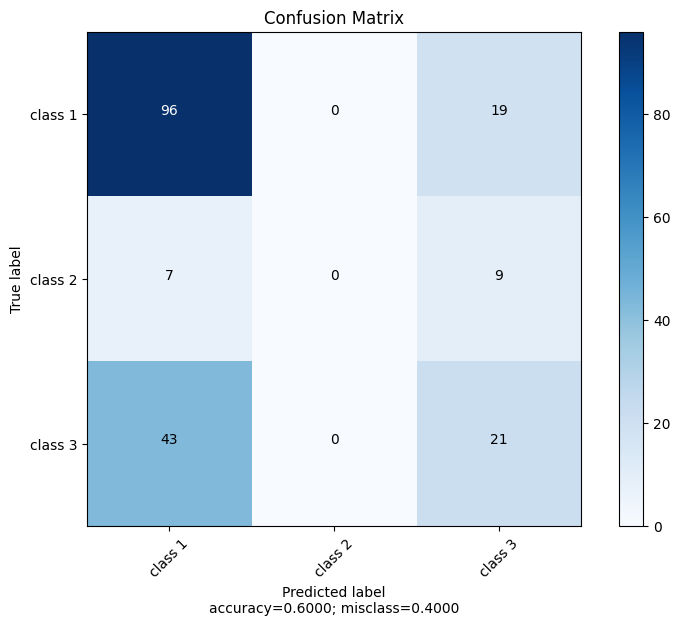

LR 1 23
n_nodes = 23 lambd = 1
Model: "model_111"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_251 (Dense)           (None, 23)                230       
                                                                 
 dropout_138 (Dropout)       (None, 23)                0         
                                                                 
 dense_252 (Dense)           (None, 3)                 72        
                                                                 
Total params: 302 (1.18 KB)
Trainable params: 302 (1.18 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


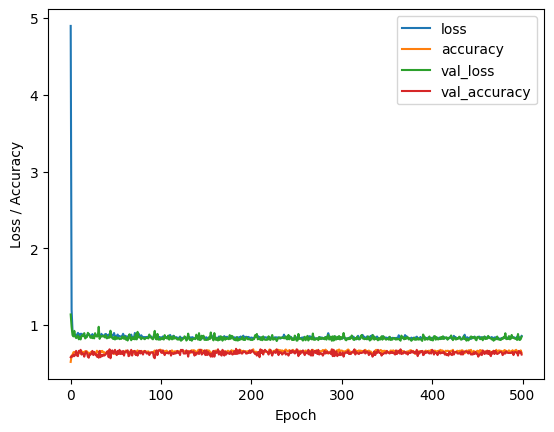


 ########## Result for Training data ########## 

log_loss:    0.7930
accuracy:    0.6689 

              precision    recall  f1-score   support

     class 1       0.68      0.89      0.77       260
     class 2       0.00      0.00      0.00        39
     class 3       0.63      0.44      0.52       139

    accuracy                           0.67       438
   macro avg       0.44      0.44      0.43       438
weighted avg       0.60      0.67      0.62       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


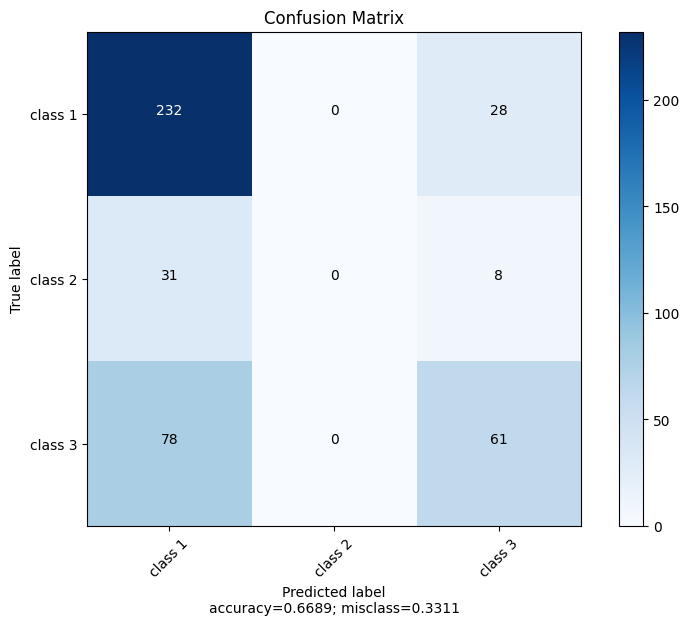


 ########## Result for Validation data ########## 

log_loss:    0.8204
accuracy:    0.6164 

              precision    recall  f1-score   support

     class 1       0.65      0.82      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.53      0.38      0.44        52

    accuracy                           0.62       146
   macro avg       0.39      0.40      0.39       146
weighted avg       0.56      0.62      0.58       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


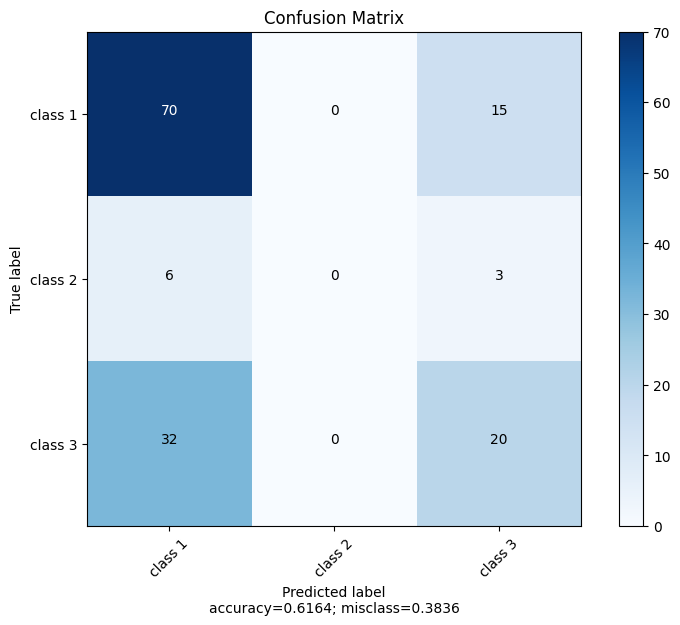


 ########## Result for Test data ########## 

log_loss:    0.8769
accuracy:    0.5795 

              precision    recall  f1-score   support

     class 1       0.62      0.81      0.70       115
     class 2       0.00      0.00      0.00        16
     class 3       0.45      0.31      0.37        64

    accuracy                           0.58       195
   macro avg       0.36      0.37      0.36       195
weighted avg       0.51      0.58      0.53       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


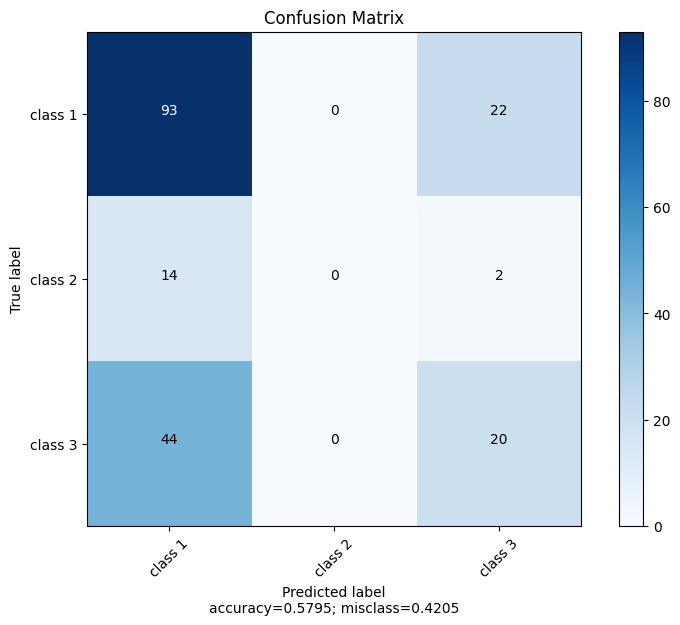

LR 1 3
n_nodes = 3 lambd = 1
Model: "model_112"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_253 (Dense)           (None, 3)                 30        
                                                                 
 dropout_139 (Dropout)       (None, 3)                 0         
                                                                 
 dense_254 (Dense)           (None, 3)                 12        
                                                                 
Total params: 42 (168.00 Byte)
Trainable params: 42 (168.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


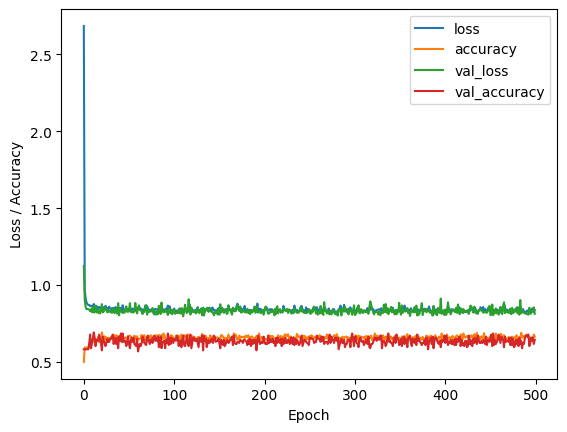


 ########## Result for Training data ########## 

log_loss:    0.8042
accuracy:    0.6667 

              precision    recall  f1-score   support

     class 1       0.68      0.88      0.77       260
     class 2       0.00      0.00      0.00        39
     class 3       0.63      0.45      0.52       139

    accuracy                           0.67       438
   macro avg       0.43      0.44      0.43       438
weighted avg       0.60      0.67      0.62       438



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


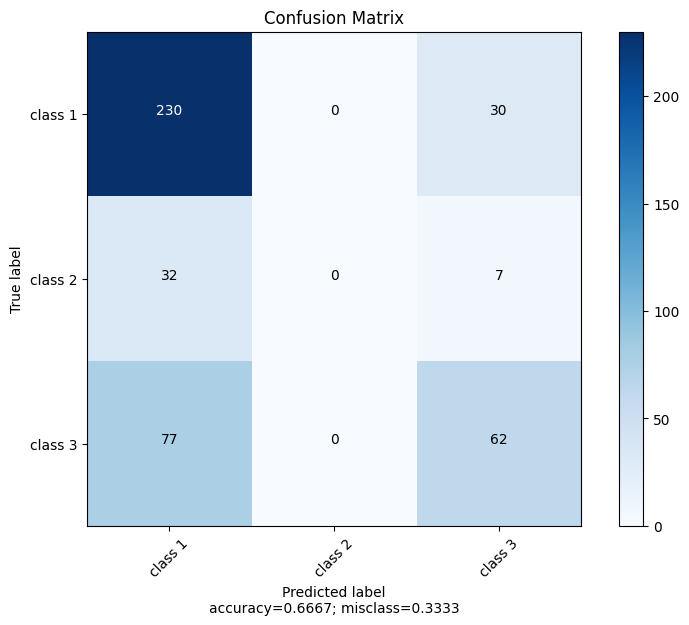


 ########## Result for Validation data ########## 

log_loss:    0.7918
accuracy:    0.6438 

              precision    recall  f1-score   support

     class 1       0.65      0.82      0.73        85
     class 2       0.00      0.00      0.00         9
     class 3       0.62      0.46      0.53        52

    accuracy                           0.64       146
   macro avg       0.42      0.43      0.42       146
weighted avg       0.60      0.64      0.61       146



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


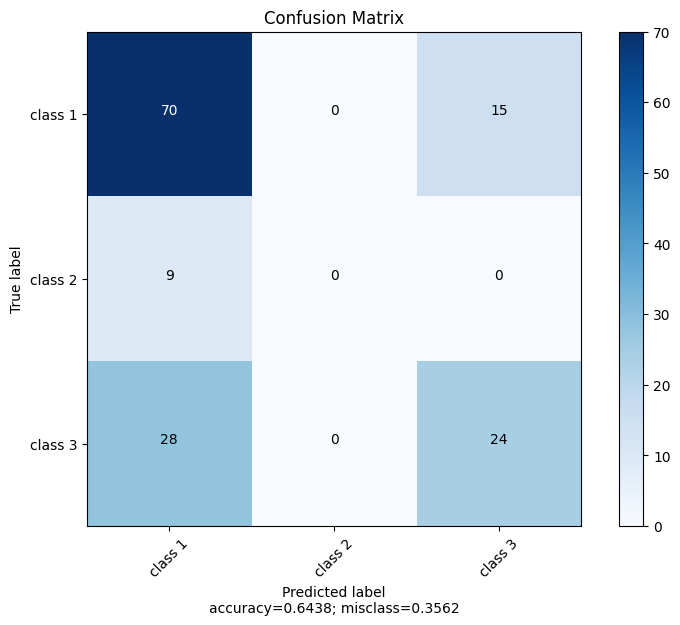


 ########## Result for Test data ########## 

log_loss:    0.8626
accuracy:    0.5744 

              precision    recall  f1-score   support

     class 1       0.62      0.80      0.70       115
     class 2       0.00      0.00      0.00        16
     class 3       0.43      0.31      0.36        64

    accuracy                           0.57       195
   macro avg       0.35      0.37      0.35       195
weighted avg       0.51      0.57      0.53       195



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


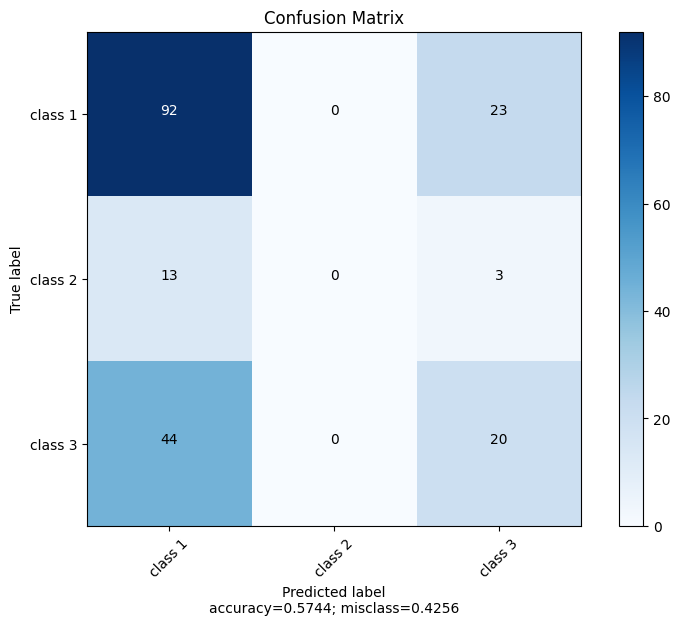

KeyboardInterrupt: ignored

In [39]:
lambdas = [0.1, 0.3, 1, ]
tested_vals = set()
for l in lambdas:
  for i in range(23):
    r = random.randint(1, 50)
    while r in tested_vals:
      r = random.randint(1, 50)
    tested_vals.add(r)
    print("LR", l, r)
    eval_net(r, l)



In [ ]:
%tb

NameError: ignored

### CellName: Ex4 (#11)
### CellType: Exercise
### Cell instruction: Instruction for question 9

For this exercise you are given a classification problem with a fixed training and test dataset. The data is the Bioconcentraion dataset described in the first cell. Your task is to do model selection, coming up with your optimal MLP architecture together with the hyperparameters you used. We do not provide any python code for this question, only the small part that reads the data (next code cell).

#### Question 9, create MLP for multi-class problem
**(a) Present an MLP with associated hyperparameters that maximizes the validation performance and give the test performance you obtained.** For this classification task there are not so many cases of class 2. In the training data there is: class 1: 345 cases, class 2: 48 cases, and class 3: 191 cases. One can end upp with situations that the network does not at all learn how to detect cases of class 2. **(b) What performance measure(s) do you think is(are) relevant when you select the optimal model for this problem?**  

**Hint 1:**
Remember to normalize input data.

**Hint 2:**
Since there is no defined validation data set you need to split your original training data into training and validation data. You can use *sklearn.model_selection.train_test_split* or *sklearn.model_selection.KFold* to accomplish that, where the latter method does k-fold crossvalidation splits.

**Hint 3:**
This problem is a 3-class classification problem, meaning that you should use a specific output activation function (*out_act_fun*) and a specific loss/error function (*cost_fun*).


In [ ]:
%%time

# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

# Load Bioconcentration training and test data
x_trn, d_trn, x_tst, d_tst = bcf()

CPU times: user 11.5 ms, sys: 860 µs, total: 12.4 ms
Wall time: 19.4 ms


In [ ]:
x_trn, x_val, d_trn, d_val = train_test_split(x_trn, d_trn, test_size = 0.25)

x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std

In [ ]:
%%time

# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

# Load Bioconcentration training and test data
# x_trn, d_trn, x_tst, d_tst = bcf()

# x_trn, d_trn, x_val, d_val = train_test_split(x_trn, d_trn, test_size = 0.25)
# mu, std = standard(x_trn)
# x_trn = (x_trn - mu)/std
# x_val = (x_val - mu)/std
# x_tst = (x_tst - mu)/std

# YOUR CODE HERE
num_classes = 3

def eval_mod(n_nodes, lambd):
  print(f"n_nodes = {n_nodes} lambd = {lambd}")
  INPUT = {'inp_dim': x_trn.shape[1],
            'n_nod': n_nodes,
            'drop_nod': 0,
            'act_fun': 'relu',
            'out_act_fun': 'softmax',
            'opt_method': 'Adam',
            'cost_fun': 'categorical_crossentropy',
            'lr_rate': 0.025,
            'lambd' : lambd,
            'num_out' : num_classes }
  mod = mlp(**INPUT)
  number_epochs = 500
  minibatch_size = 8
  mod.summary()
  estimator = mod.fit(x_trn, d_trn,
                        validation_data=(x_val, d_val),
                        epochs=number_epochs,
                        batch_size=minibatch_size,
                        verbose=0)
  make_cm_plot(mod, x_trn, d_trn, num_classes, 'Training data')
  make_cm_plot(mod, x_val, d_val, num_classes, 'Validation data')
  make_cm_plot(mod, x_tst, d_tst, num_classes, 'Test data')




CPU times: user 9 µs, sys: 0 ns, total: 9 µs
Wall time: 14.5 µs


In [38]:
lambdas = [0.1, 0.3, 1, 2]
tested_vals = set()
# for j in lambdas:
#   for i in range(23):
#     ri = random.randint(1, 50)
#     r = [ri, abs(ri) -6]
#     l = lambdas[random.randint(0, len(lambdas) -1)]
#     while ri in tested_vals:
#       ri = random.randint(1, 50)
#     tested_vals.add(ri)
#     print("LR", l, r)
#     eval_mod(r, l)
  eval_mod(120, 0.1)


IndentationError: ignored

In [ ]:
%tb

ValueError: ignored

### CellName: Ex5 (#12)
### CellType: Exercise
### Cell instruction: Instruction for question 10

For this exercise the task is to train a binary classifier for the spiral problem. The aim is to get *zero* classification error for the training data (there is no test or validation data) with a model that is *as small as possible* in terms of the number of trainable parameters. Also plot the boundary to see if it resembles a spriral. To pass this question you should at least try! The data is randomly generated and we suggest using at least 1000 data points to get "good" spirals.

#### Question 10, minimize network size
**Train a classifier for the spiral problem with the aim of zero classification error with as small as possible model. Report the model you used.**

26 30 Shape of NN
Model: "model_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_100 (Dense)           (None, 26)                78        
                                                                 
 dropout_50 (Dropout)        (None, 26)                0         
                                                                 
 dense_101 (Dense)           (None, 30)                810       
                                                                 
 dropout_51 (Dropout)        (None, 30)                0         
                                                                 
 dense_102 (Dense)           (None, 1)                 31        
                                                                 
Total params: 919 (3.59 KB)
Trainable pa

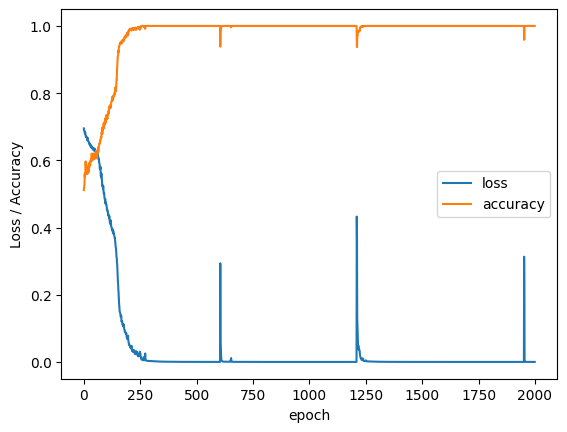

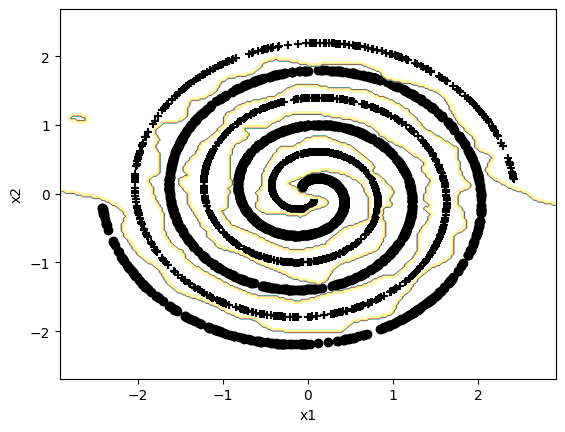

21 29 Shape of NN
Model: "model_51"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_103 (Dense)           (None, 21)                63        
                                                                 
 dropout_52 (Dropout)        (None, 21)                0         
                                                                 
 dense_104 (Dense)           (None, 29)                638       
                                                                 
 dropout_53 (Dropout)        (None, 29)                0         
                                                                 
 dense_105 (Dense)           (None, 1)                 30        
                                                                 
Total params: 731 (2.86 KB)
Trainable pa

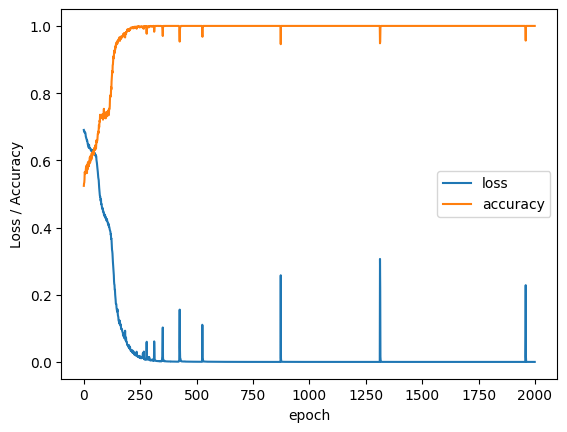

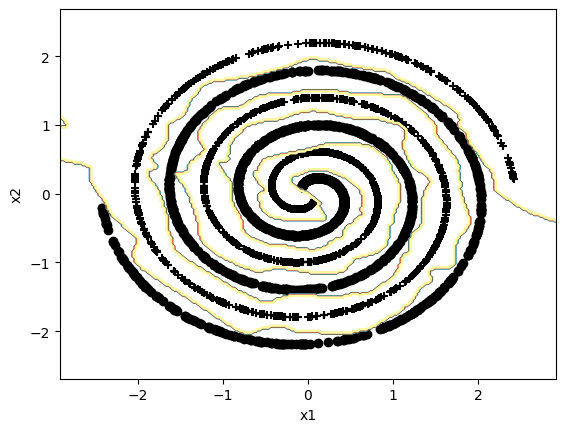

8 28 Shape of NN
Model: "model_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_106 (Dense)           (None, 8)                 24        
                                                                 
 dropout_54 (Dropout)        (None, 8)                 0         
                                                                 
 dense_107 (Dense)           (None, 28)                252       
                                                                 
 dropout_55 (Dropout)        (None, 28)                0         
                                                                 
 dense_108 (Dense)           (None, 1)                 29        
                                                                 
Total params: 305 (1.19 KB)
Trainable par

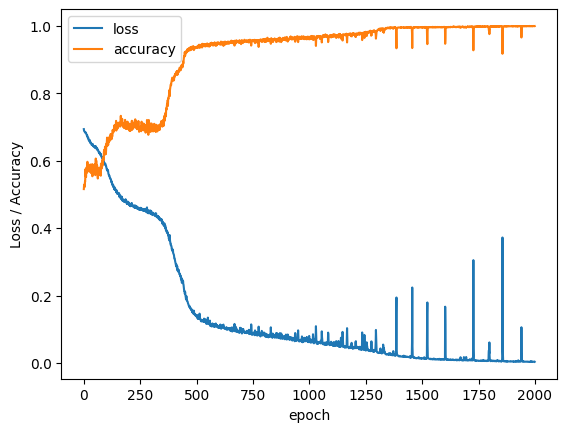

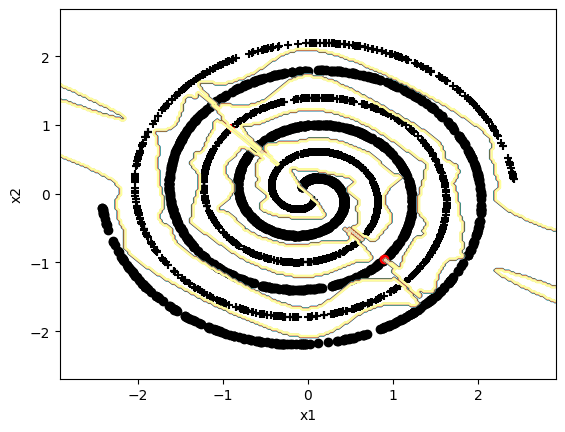

23 6 Shape of NN
Model: "model_53"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_109 (Dense)           (None, 23)                69        
                                                                 
 dropout_56 (Dropout)        (None, 23)                0         
                                                                 
 dense_110 (Dense)           (None, 6)                 144       
                                                                 
 dropout_57 (Dropout)        (None, 6)                 0         
                                                                 
 dense_111 (Dense)           (None, 1)                 7         
                                                                 
Total params: 220 (880.00 Byte)
Trainable

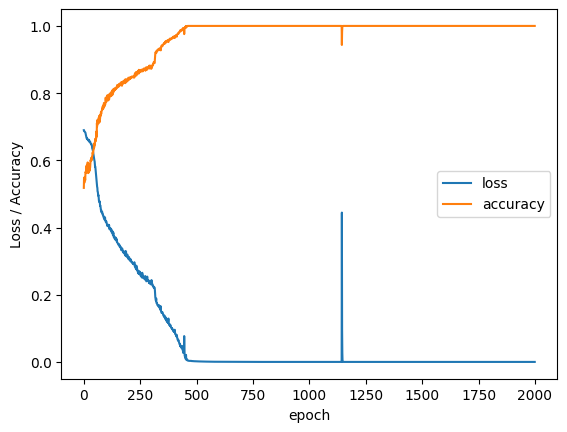

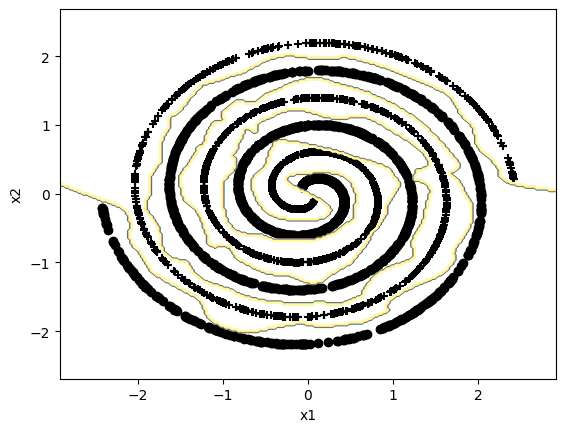

13 25 Shape of NN
Model: "model_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_112 (Dense)           (None, 13)                39        
                                                                 
 dropout_58 (Dropout)        (None, 13)                0         
                                                                 
 dense_113 (Dense)           (None, 25)                350       
                                                                 
 dropout_59 (Dropout)        (None, 25)                0         
                                                                 
 dense_114 (Dense)           (None, 1)                 26        
                                                                 
Total params: 415 (1.62 KB)
Trainable pa

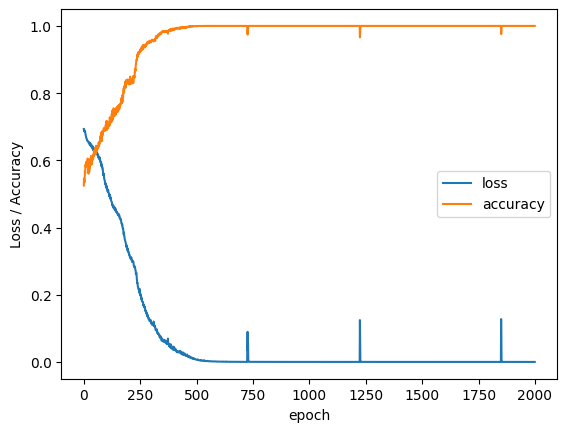

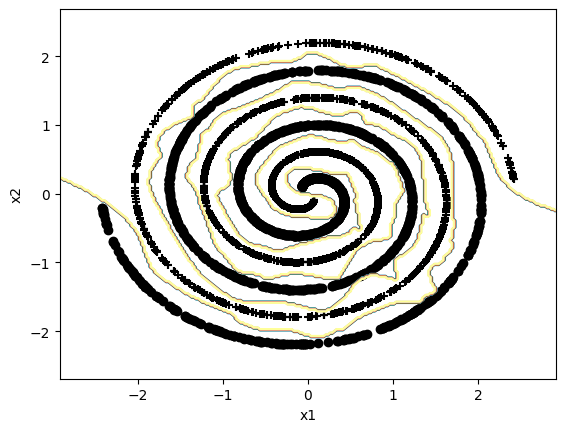

7 6 Shape of NN
Model: "model_55"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_115 (Dense)           (None, 7)                 21        
                                                                 
 dropout_60 (Dropout)        (None, 7)                 0         
                                                                 
 dense_116 (Dense)           (None, 6)                 48        
                                                                 
 dropout_61 (Dropout)        (None, 6)                 0         
                                                                 
 dense_117 (Dense)           (None, 1)                 7         
                                                                 
Total params: 76 (304.00 Byte)
Trainable p

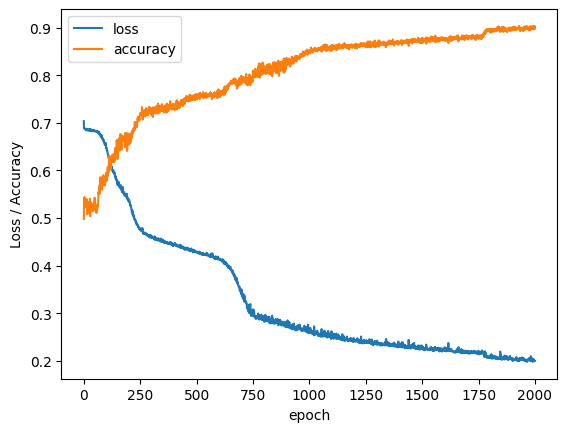

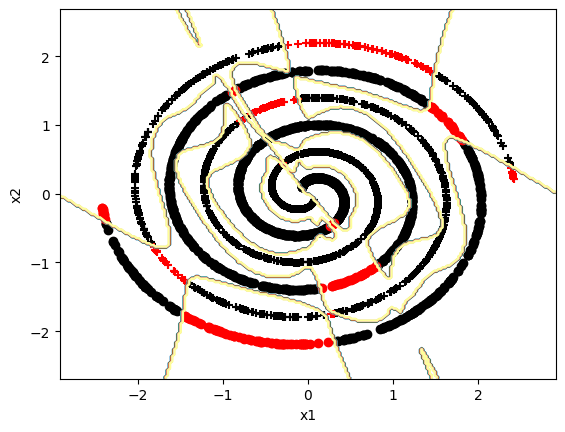

25 29 Shape of NN
Model: "model_56"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_118 (Dense)           (None, 25)                75        
                                                                 
 dropout_62 (Dropout)        (None, 25)                0         
                                                                 
 dense_119 (Dense)           (None, 29)                754       
                                                                 
 dropout_63 (Dropout)        (None, 29)                0         
                                                                 
 dense_120 (Dense)           (None, 1)                 30        
                                                                 
Total params: 859 (3.36 KB)
Trainable pa

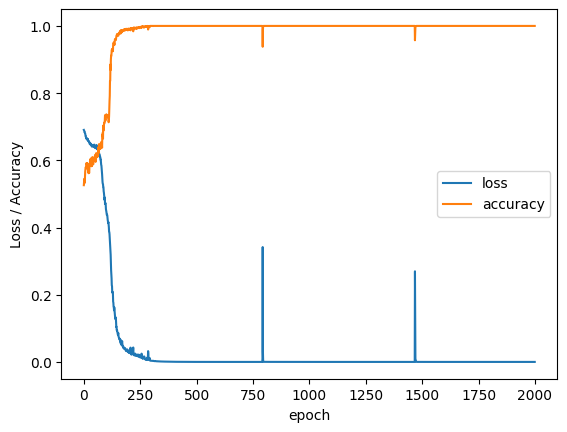

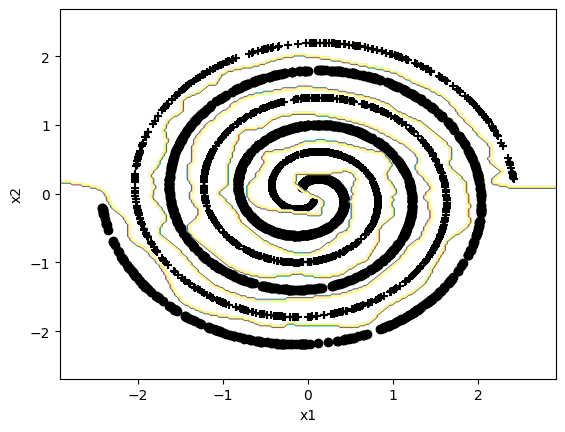

27 23 Shape of NN
Model: "model_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_121 (Dense)           (None, 27)                81        
                                                                 
 dropout_64 (Dropout)        (None, 27)                0         
                                                                 
 dense_122 (Dense)           (None, 23)                644       
                                                                 
 dropout_65 (Dropout)        (None, 23)                0         
                                                                 
 dense_123 (Dense)           (None, 1)                 24        
                                                                 
Total params: 749 (2.93 KB)
Trainable pa

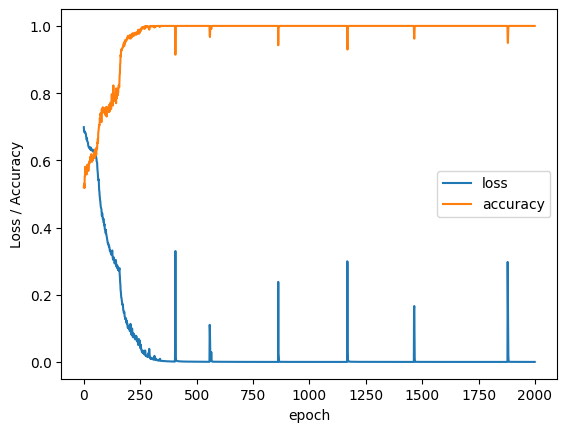

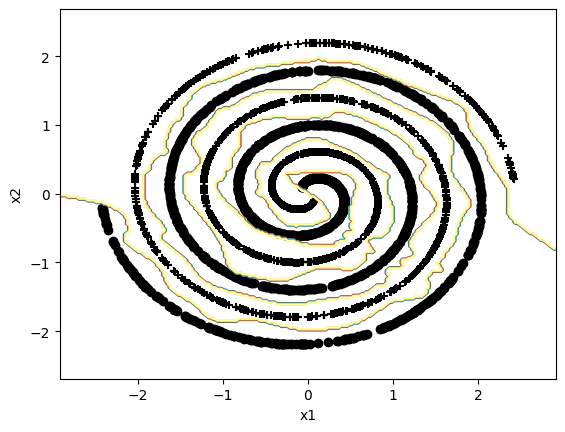

22 2 Shape of NN
Model: "model_58"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_124 (Dense)           (None, 22)                66        
                                                                 
 dropout_66 (Dropout)        (None, 22)                0         
                                                                 
 dense_125 (Dense)           (None, 2)                 46        
                                                                 
 dropout_67 (Dropout)        (None, 2)                 0         
                                                                 
 dense_126 (Dense)           (None, 1)                 3         
                                                                 
Total params: 115 (460.00 Byte)
Trainable

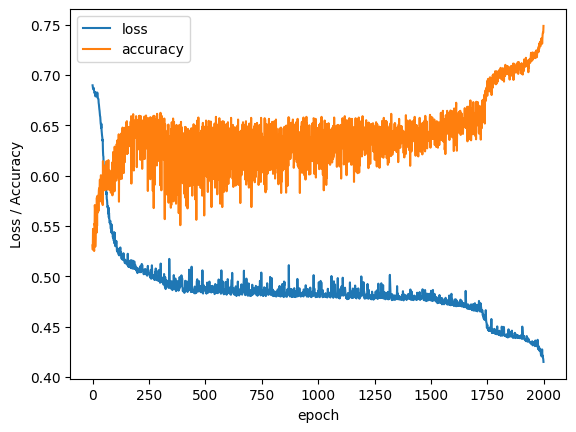

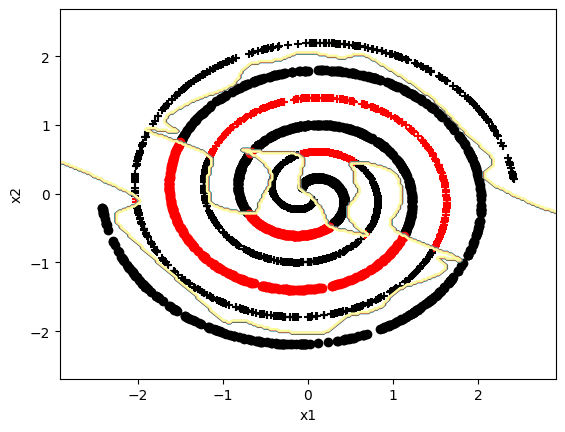

10 27 Shape of NN
Model: "model_59"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_127 (Dense)           (None, 10)                30        
                                                                 
 dropout_68 (Dropout)        (None, 10)                0         
                                                                 
 dense_128 (Dense)           (None, 27)                297       
                                                                 
 dropout_69 (Dropout)        (None, 27)                0         
                                                                 
 dense_129 (Dense)           (None, 1)                 28        
                                                                 
Total params: 355 (1.39 KB)
Trainable pa

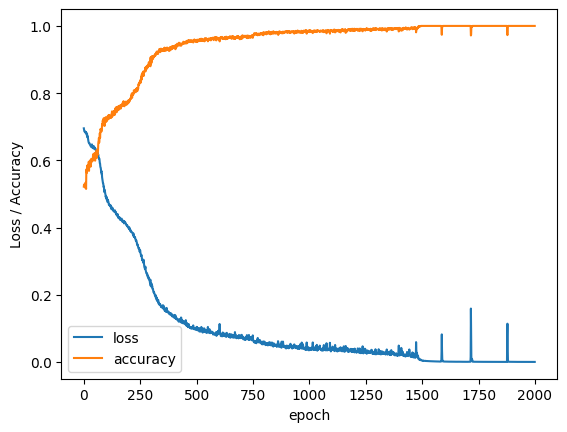

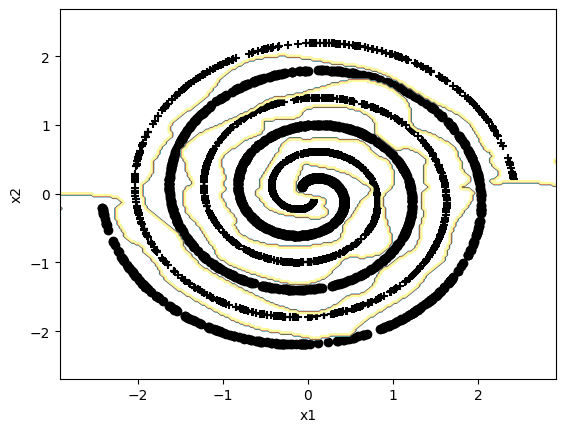

19 20 Shape of NN
Model: "model_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_130 (Dense)           (None, 19)                57        
                                                                 
 dropout_70 (Dropout)        (None, 19)                0         
                                                                 
 dense_131 (Dense)           (None, 20)                400       
                                                                 
 dropout_71 (Dropout)        (None, 20)                0         
                                                                 
 dense_132 (Dense)           (None, 1)                 21        
                                                                 
Total params: 478 (1.87 KB)
Trainable pa

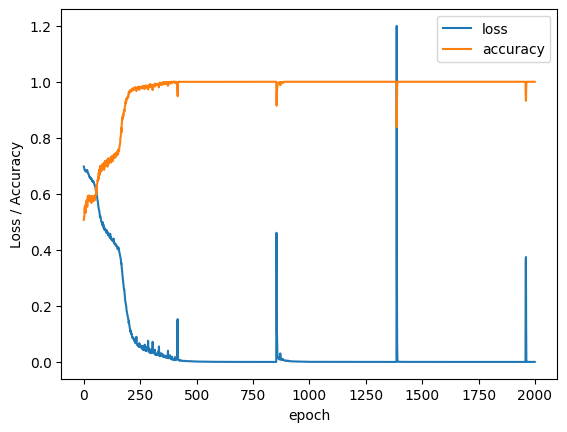

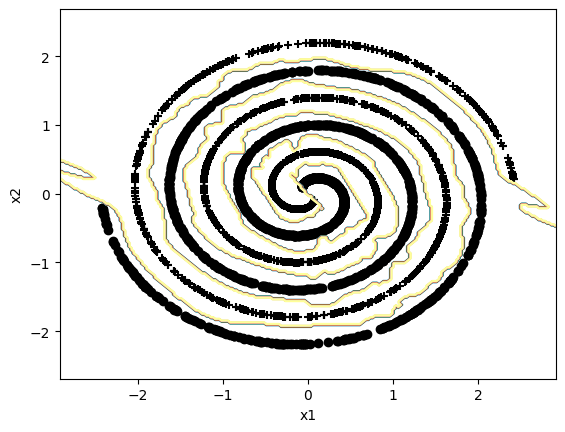

15 13 Shape of NN
Model: "model_61"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_133 (Dense)           (None, 15)                45        
                                                                 
 dropout_72 (Dropout)        (None, 15)                0         
                                                                 
 dense_134 (Dense)           (None, 13)                208       
                                                                 
 dropout_73 (Dropout)        (None, 13)                0         
                                                                 
 dense_135 (Dense)           (None, 1)                 14        
                                                                 
Total params: 267 (1.04 KB)
Trainable pa

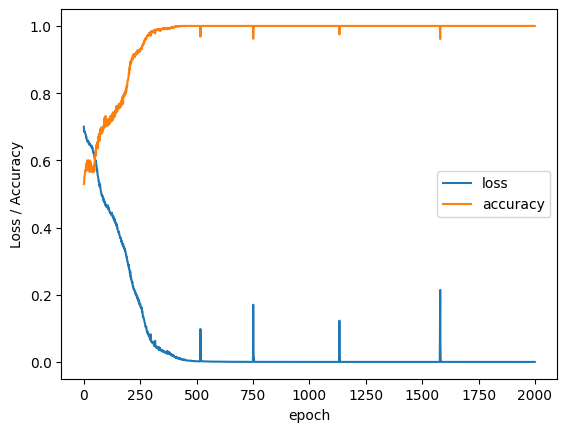

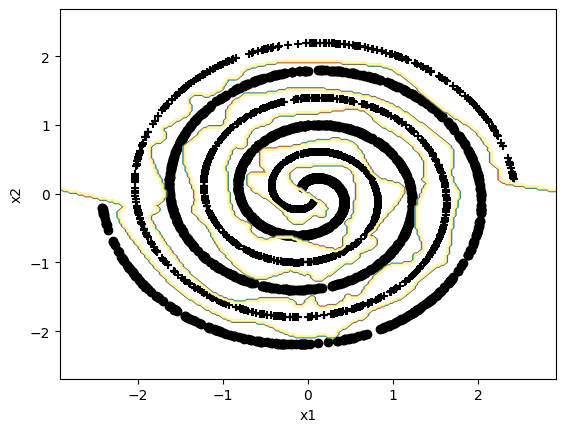

12 26 Shape of NN
Model: "model_62"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_136 (Dense)           (None, 12)                36        
                                                                 
 dropout_74 (Dropout)        (None, 12)                0         
                                                                 
 dense_137 (Dense)           (None, 26)                338       
                                                                 
 dropout_75 (Dropout)        (None, 26)                0         
                                                                 
 dense_138 (Dense)           (None, 1)                 27        
                                                                 
Total params: 401 (1.57 KB)
Trainable pa

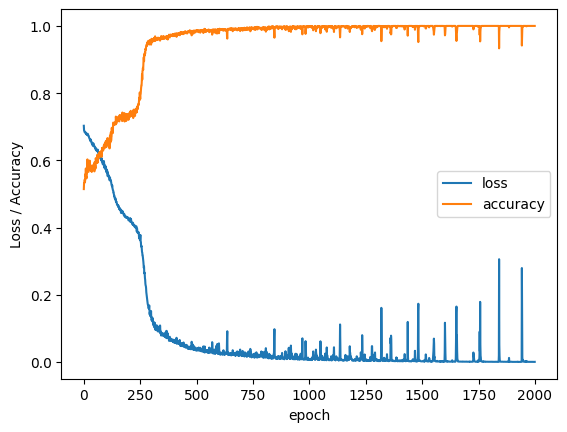

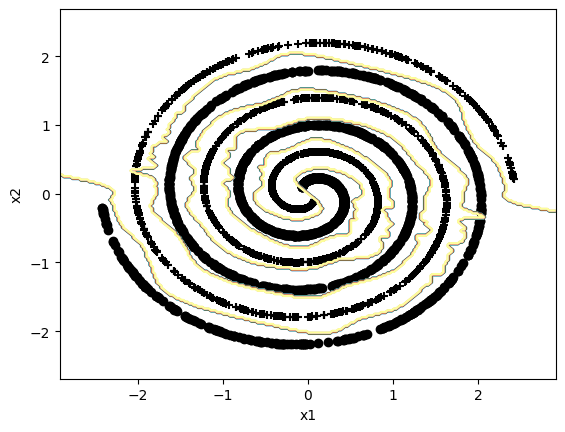

9 8 Shape of NN
Model: "model_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_139 (Dense)           (None, 9)                 27        
                                                                 
 dropout_76 (Dropout)        (None, 9)                 0         
                                                                 
 dense_140 (Dense)           (None, 8)                 80        
                                                                 
 dropout_77 (Dropout)        (None, 8)                 0         
                                                                 
 dense_141 (Dense)           (None, 1)                 9         
                                                                 
Total params: 116 (464.00 Byte)
Trainable 

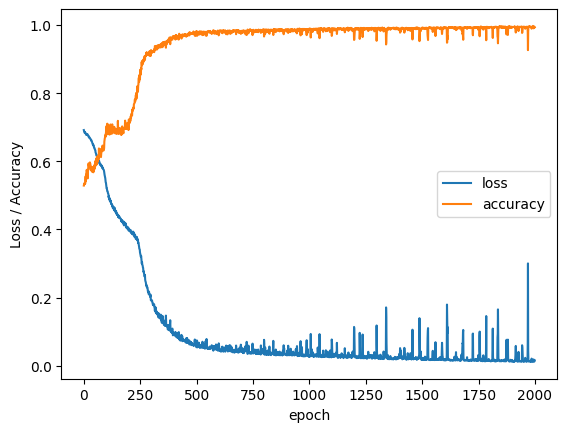

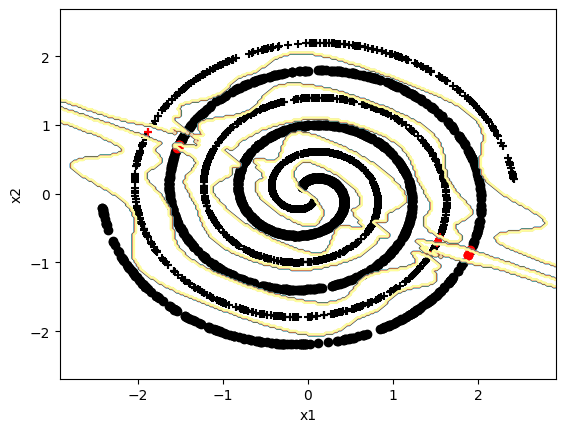

18 19 Shape of NN
Model: "model_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_142 (Dense)           (None, 18)                54        
                                                                 
 dropout_78 (Dropout)        (None, 18)                0         
                                                                 
 dense_143 (Dense)           (None, 19)                361       
                                                                 
 dropout_79 (Dropout)        (None, 19)                0         
                                                                 
 dense_144 (Dense)           (None, 1)                 20        
                                                                 
Total params: 435 (1.70 KB)
Trainable pa

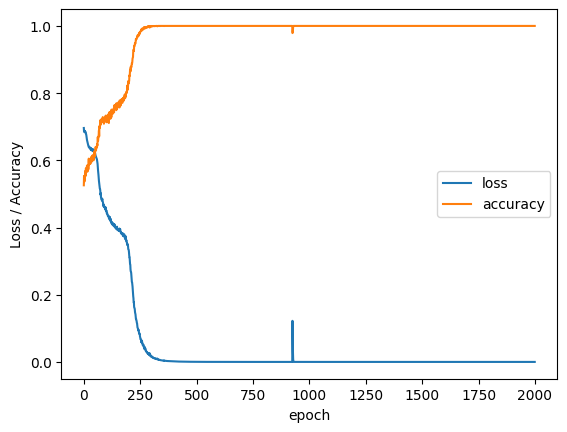

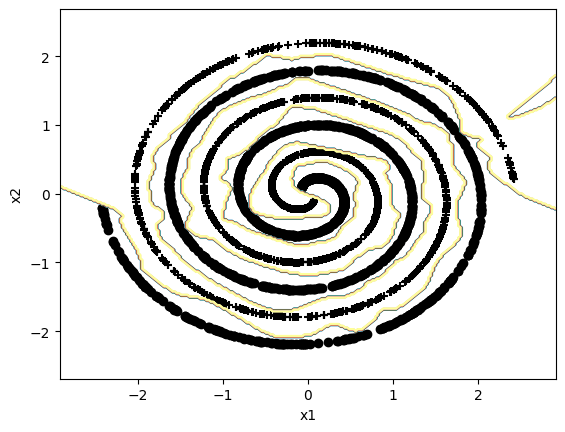

34 15 Shape of NN
Model: "model_65"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_145 (Dense)           (None, 34)                102       
                                                                 
 dropout_80 (Dropout)        (None, 34)                0         
                                                                 
 dense_146 (Dense)           (None, 15)                525       
                                                                 
 dropout_81 (Dropout)        (None, 15)                0         
                                                                 
 dense_147 (Dense)           (None, 1)                 16        
                                                                 
Total params: 643 (2.51 KB)
Trainable pa

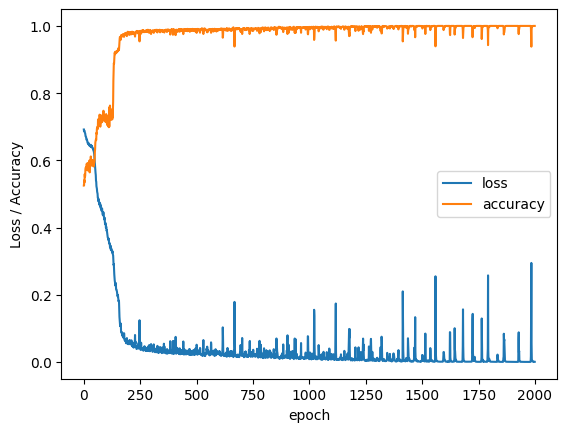

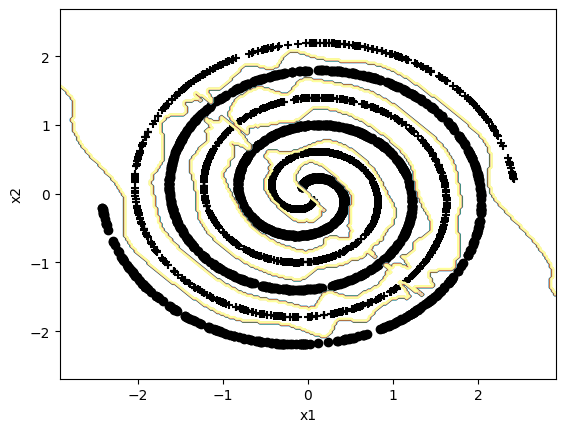

32 19 Shape of NN
Model: "model_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_148 (Dense)           (None, 32)                96        
                                                                 
 dropout_82 (Dropout)        (None, 32)                0         
                                                                 
 dense_149 (Dense)           (None, 19)                627       
                                                                 
 dropout_83 (Dropout)        (None, 19)                0         
                                                                 
 dense_150 (Dense)           (None, 1)                 20        
                                                                 
Total params: 743 (2.90 KB)
Trainable pa

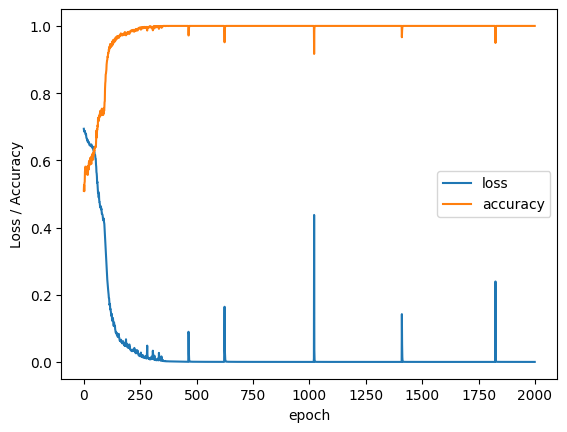

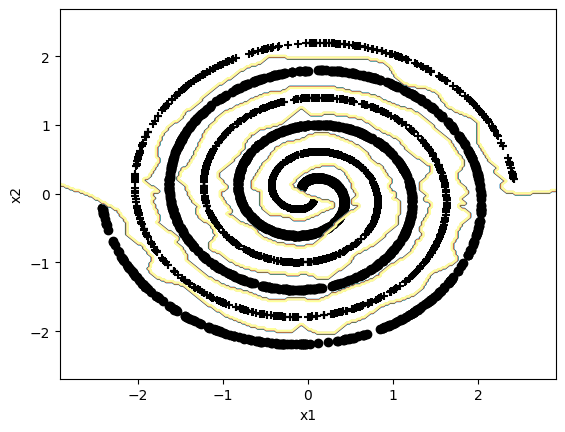

17 9 Shape of NN
Model: "model_67"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_151 (Dense)           (None, 17)                51        
                                                                 
 dropout_84 (Dropout)        (None, 17)                0         
                                                                 
 dense_152 (Dense)           (None, 9)                 162       
                                                                 
 dropout_85 (Dropout)        (None, 9)                 0         
                                                                 
 dense_153 (Dense)           (None, 1)                 10        
                                                                 
Total params: 223 (892.00 Byte)
Trainable

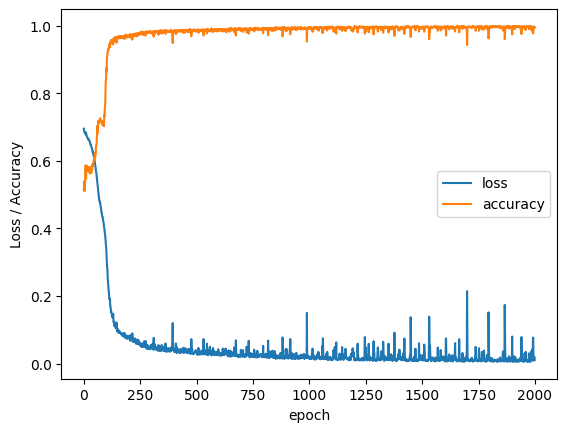

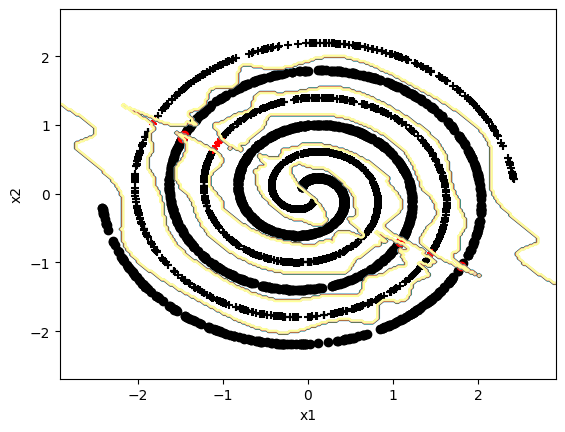

11 30 Shape of NN
Model: "model_68"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_154 (Dense)           (None, 11)                33        
                                                                 
 dropout_86 (Dropout)        (None, 11)                0         
                                                                 
 dense_155 (Dense)           (None, 30)                360       
                                                                 
 dropout_87 (Dropout)        (None, 30)                0         
                                                                 
 dense_156 (Dense)           (None, 1)                 31        
                                                                 
Total params: 424 (1.66 KB)
Trainable pa

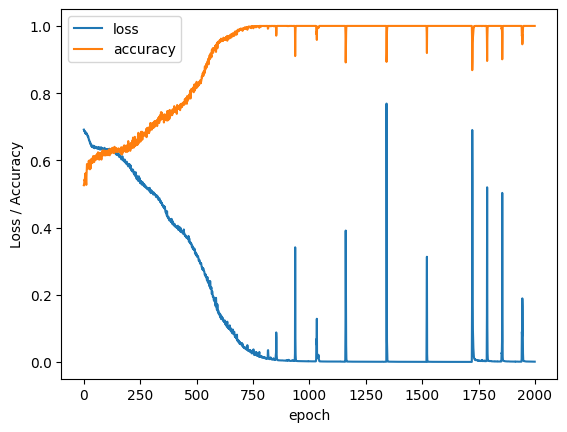

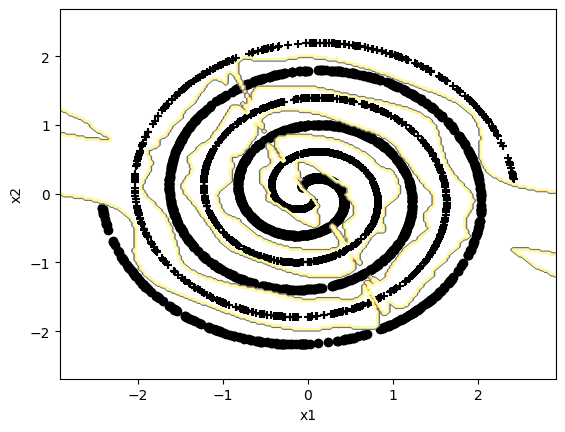

24 3 Shape of NN
Model: "model_69"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_157 (Dense)           (None, 24)                72        
                                                                 
 dropout_88 (Dropout)        (None, 24)                0         
                                                                 
 dense_158 (Dense)           (None, 3)                 75        
                                                                 
 dropout_89 (Dropout)        (None, 3)                 0         
                                                                 
 dense_159 (Dense)           (None, 1)                 4         
                                                                 
Total params: 151 (604.00 Byte)
Trainable

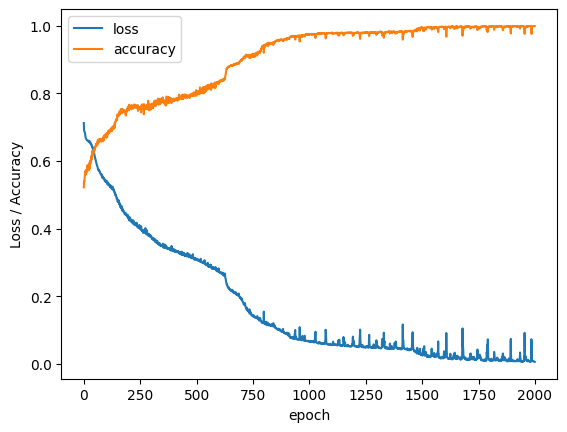

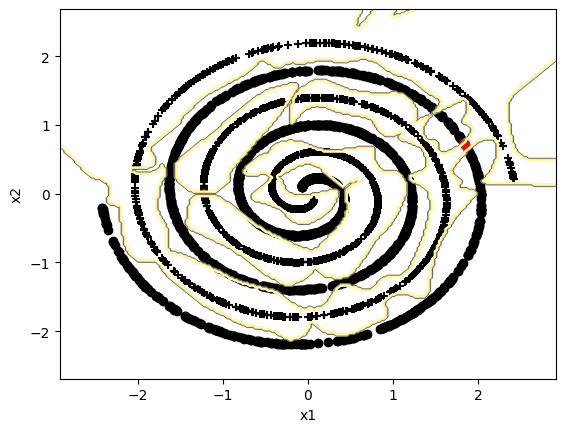

6 18 Shape of NN
Model: "model_70"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_160 (Dense)           (None, 6)                 18        
                                                                 
 dropout_90 (Dropout)        (None, 6)                 0         
                                                                 
 dense_161 (Dense)           (None, 18)                126       
                                                                 
 dropout_91 (Dropout)        (None, 18)                0         
                                                                 
 dense_162 (Dense)           (None, 1)                 19        
                                                                 
Total params: 163 (652.00 Byte)
Trainable

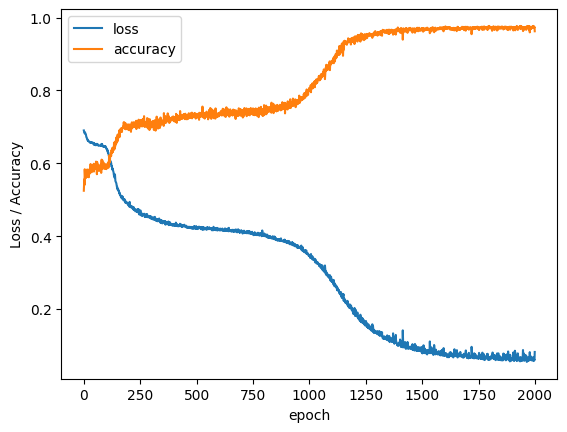

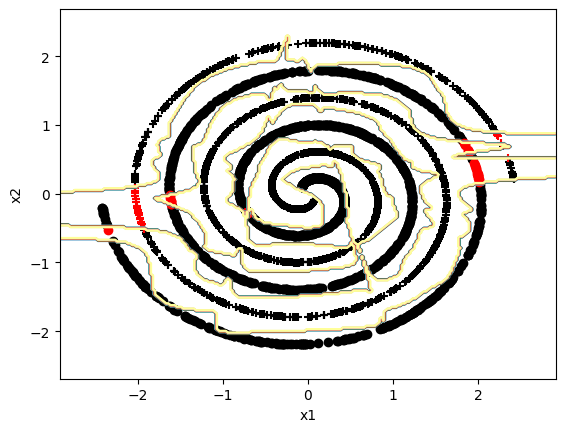

16 20 Shape of NN
Model: "model_71"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_163 (Dense)           (None, 16)                48        
                                                                 
 dropout_92 (Dropout)        (None, 16)                0         
                                                                 
 dense_164 (Dense)           (None, 20)                340       
                                                                 
 dropout_93 (Dropout)        (None, 20)                0         
                                                                 
 dense_165 (Dense)           (None, 1)                 21        
                                                                 
Total params: 409 (1.60 KB)
Trainable pa

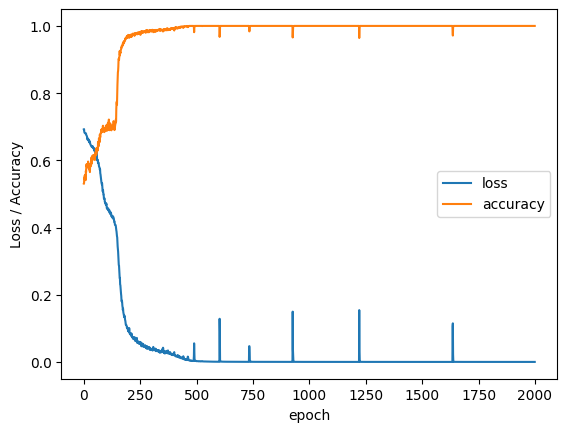

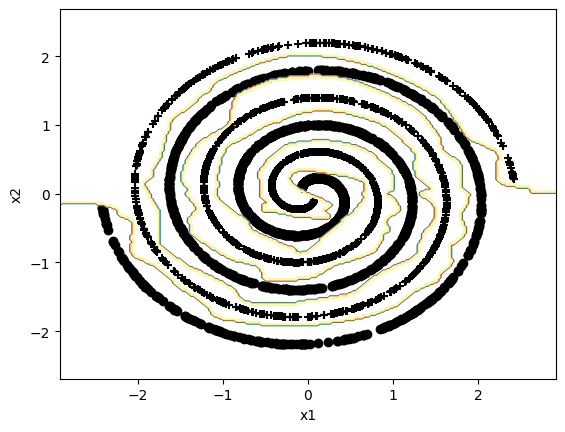

14 19 Shape of NN
Model: "model_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_166 (Dense)           (None, 14)                42        
                                                                 
 dropout_94 (Dropout)        (None, 14)                0         
                                                                 
 dense_167 (Dense)           (None, 19)                285       
                                                                 
 dropout_95 (Dropout)        (None, 19)                0         
                                                                 
 dense_168 (Dense)           (None, 1)                 20        
                                                                 
Total params: 347 (1.36 KB)
Trainable pa

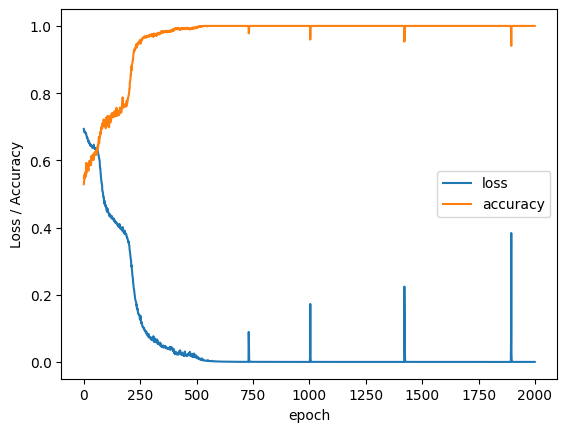

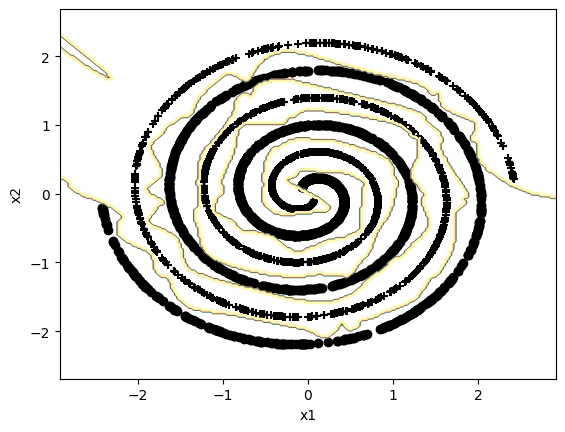

20 26 Shape of NN
Model: "model_73"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_169 (Dense)           (None, 20)                60        
                                                                 
 dropout_96 (Dropout)        (None, 20)                0         
                                                                 
 dense_170 (Dense)           (None, 26)                546       
                                                                 
 dropout_97 (Dropout)        (None, 26)                0         
                                                                 
 dense_171 (Dense)           (None, 1)                 27        
                                                                 
Total params: 633 (2.47 KB)
Trainable pa

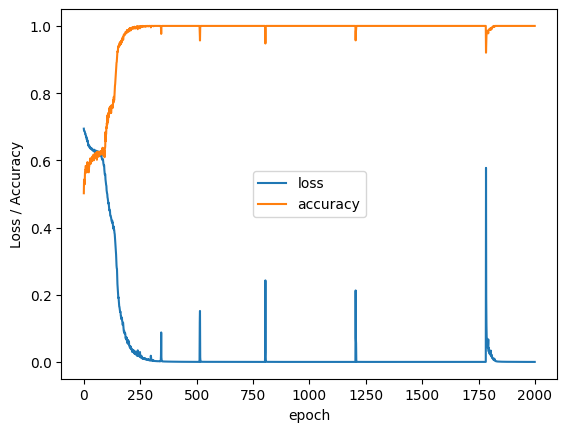

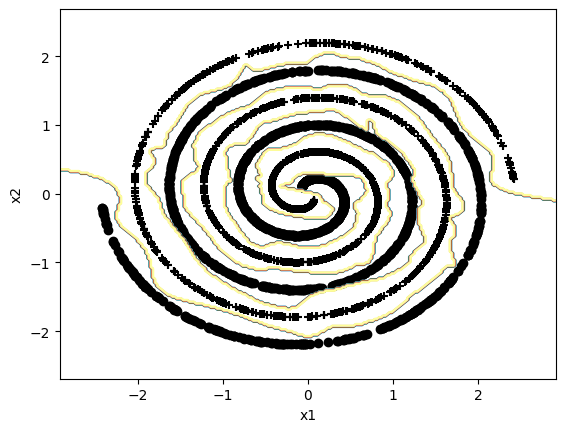

In [ ]:
%%time

# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

# Generate training data
x_trn, d_trn = twospirals(1500, 3, 0)

mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std

####
tested_vals = set()
for i in range(50):
    n_nodes = random.randint(1, 30)
    m_nodes = random.randint(1, 30)

    while n_nodes in tested_vals:
      n_nodes = random.randint(1, 20)
      m_nodes = random.randint(1, 30)
    tested_vals.add(n_nodes)
    print(5+n_nodes, m_nodes, "Shape of NN")
    # Define the network, cost function and training settings
    INPUT = {'inp_dim': x_trn.shape[1],
            'n_nod': [5+n_nodes, m_nodes],
            'drop_nod': 0.0,
            'act_fun': 'tanh',
            'out_act_fun': 'sigmoid',
            'opt_method': 'Adam',
            'cost_fun': 'binary_crossentropy',
            'lr_rate': 0.01,
            'num_out' : 1 }
    number_epochs = 2000
    minibatch_size = 100
    ####

    # Get the model
    model_ex6 = mlp(**INPUT)

    # Print a summary of the model
    model_ex6.summary()

    # Train the model
    estimator_ex6 = model_ex6.fit(x_trn, d_trn,
                          epochs=number_epochs,
                          batch_size=minibatch_size,
                          verbose=0)

    # Call the stats function to print out statistics for the training
    stats_class(x_trn, d_trn, 'Training', model_ex6)

    # Training history
    plt.figure()
    plt.ylabel('Loss / Accuracy')
    plt.xlabel('epoch')
    for k in estimator_ex6.history.keys():
        plt.plot(estimator_ex6.history[k], label = k)
    plt.legend(loc='best')

    # Show the decision boundary
    decision_b(x_trn, d_trn, model_ex6)

# The report!
We have added intructions inside this report template. As you write your report, remove the instructions.

## Name
Love Broman

## Introduction
In the following computer exercise i trained on concept of using regularization methods to be to be sure that the model can extrapolate beyond training data. Methods tried was drop out, regularaztion terms and control of the networks size.

## Answers to questions
Provide enough information to clarify the meaning of your answers, so that they can be understood by someone who does not scroll up and read the entire instruction.

The questions are repeated here, for clarity of what is demanded. If it does not fit your style to quote them verbatim, change the format.

#### Question 1, single-node validation performance

########## STATISTICS for Training Data ##########

Accuracy        0.8600
Sensitivity     0.8600
Specificity     0.8600
Loss            0.3278

##################################################

########## STATISTICS for Validation Data ##########

Accuracy        0.8740
Sensitivity     0.9040
Specificity     0.8440
Loss            0.2938

#### Question 2, improving training performance
(a) How many hidden nodes do you need to reach an accuracy >95% on your training dataset?<br>
(b) What is the performance on the validation data set?
80 layers gives an accuracy of .97.'
 The performance for 80 nodes on the validation set was the following, which leads us into beleiving that we've overfitted:
 ########## STATISTICS for Validation Data ##########

Accuracy        0.8230
Sensitivity     0.8720
Specificity     0.7740
Loss            0.8375

T


#### Question 3, optimizing validation performance

The best performance on the validation data is given with 3 nodes which gives the following performance values:

Number of nodes = 3:

Accuracy        0.8660
Sensitivity     0.9120
Specificity     0.8200
Loss            0.3077

b: the reason why 3 nodes seemed to give the optimal performance is tha beyond that, there's not much fitting to the actual structure of the data but merely to noise which wont generalize.

#### Question 4, optimizing regression performance
The optimal number of nodes I found was 9

########## STATISTICS for Validation Data ##########

MSE             0.4059631297
CorrCoeff       0.7931143817

#### Question 5, improving generalization with regularization
(a) Present your optimal model (L2 value and number of hidden nodes) and the validation performance.<br>
(b) Do you obtain a better result compared to Q4?

With 20 nodes and lambda being equal to .3 which gave the lowest MSE for validation, i got:

########## STATISTICS for Validation Data ##########

MSE             0.3602959480
CorrCoeff       0.8147196781

b: Yes i did here get a better result than in q4.

#### Question 6, improving generalization with dropout
(a) Present your optimal model (dropout value and number of hidden nodes) and the validation performance.<br>
(b) Do you obtain a better result compared to Q4/Q5?

I here used a larger amount of nodes, 48. The best result i got was for .1 and was the following:

########## STATISTICS for Validation Data ##########

MSE             0.3523861386
CorrCoeff       0.8219316555

Yes the performance seemes to be even better which most often isnt the case, it's most often for larger networks that  dropout makes sense.

#### Question 7, create MLP to solve the vowel problem
(a) Present an MLP with associated hyperparameters that maximizes the validation performance, and state the training, validation and test performance you obtained.<br>
(b) Present your code.

n_nodes = 39 and lambda = 0.1 gives the following results on the validation data:

########## Result for Validation data ##########

log_loss:    0.3630
accuracy:    0.8958

And the following on validation data:
            precision    recall  f1-score   support

 class 1       0.95      0.87      0.91       340
 class 2       0.86      0.87      0.87       323
 class 3       0.94      0.90      0.92       723
 class 4       0.98      0.88      0.93       502
 class 5       0.93      0.82      0.87       227
 class 6       0.97      0.99      0.98       271
 class 7       0.98      0.95      0.96       383
 class 8       0.73      0.85      0.79       370
 class 9       0.69      0.89      0.77       273

accuracy                           0.89      3412



```
  INPUT = {'inp_dim': x_trn.shape[1],
            'n_nod': [n_nodes],
            'drop_nod': 0,
            'act_fun': 'relu',
            'out_act_fun': 'softmax',
            'opt_method': 'Adam',
            'cost_fun': 'categorical_crossentropy',
            'lr_rate': 0.025,
            'lambd' : lambd,
            'num_out' : num_classes }
```

#### Question 8, model selection criteria
The reason for this is that accuracy is focused on something binary, either right or wrong while the loss gives a real value based on how likely you thought it was that a value would belong to a certain class and then a punishment based on how certain you was on the wrong solution and vice versa. You would in most cases want to prefer looking at the Accuracy, F1 etc and not at loss while choosing model in the validation step, that’s because when it comes to classification being almost right a lot does not help you, and being almost wrong will not hurt you.


#### Question 9, create MLP for multi-class problem
(a) Present an MLP with associated hyperparameters that maximizes the validation performance and give the test performance you obtained.<br>
(b) What performance measure(s) do you think is(are) relevant when you select the optimal model for this problem?

lambda=0.3 n_nodes = 13

Gave:

precision    recall  f1-score   support

     class 1       0.71      0.88      0.79       260
     class 2       0.00      0.00      0.00        39
     class 3       0.62      0.51      0.56       139

    accuracy                           0.69       438
   macro avg       0.44      0.47      0.45       438
weighted avg       0.62      0.69      0.65       438

In all cases i tried, the second class got completely ignored, when data is scewed it’s better to look at f1-score rather than precision/recall.


#### Question 10, minimize network size
The smallest possible network i found to solve the problem had size [15, 13].

## Summary
After trying multiple ways of improving generailzation, we've seen that the problem in particular and the shape of the dataset is an important factor when it comes to which factors that are important.
